## ⚙️ Import Libraries

In [22]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.16.1
Keras version: 3.3.3
GPU devices: 2


In [23]:
!pip install segmentation-models-pytorch


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


## ⏳ Load the Data (no outlier)

In [24]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
import segmentation_models_pytorch as smp
from skimage.util import random_noise
from scipy.ndimage import rotate

# Set seed for reproducibility
np.random.seed(42)
torch.manual_seed(42)


# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
# Load dataset
data = np.load("/kaggle/input/cleean2-data/cleaned_data.npz")
X_train = data["training_set_filtered"]
y_train = data["masks_filtered"]
X_test = data["test_set"]




Using device: cuda


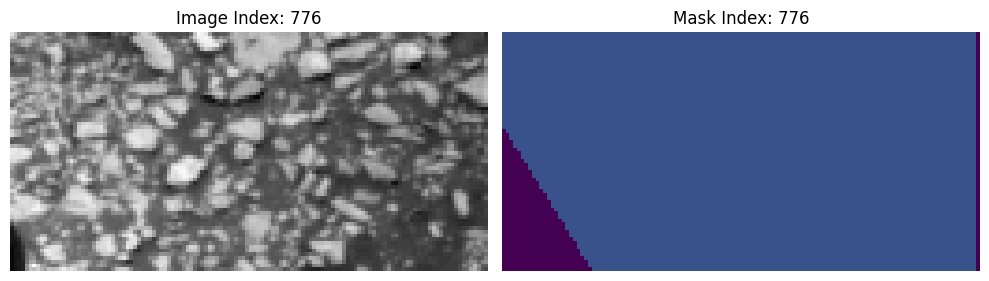

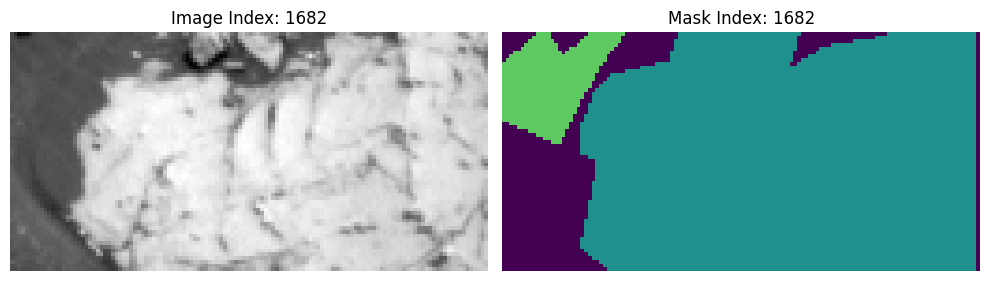

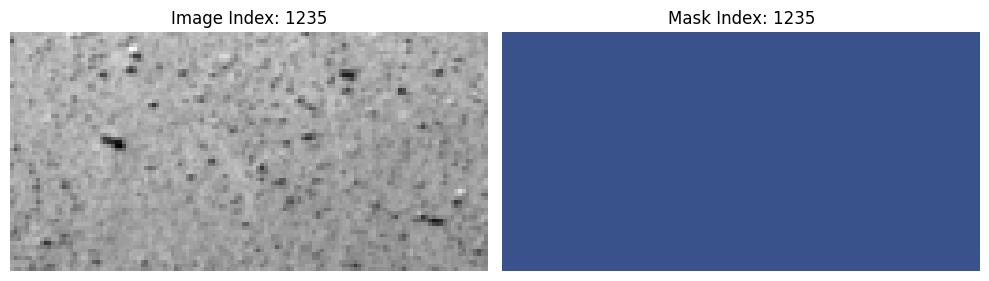

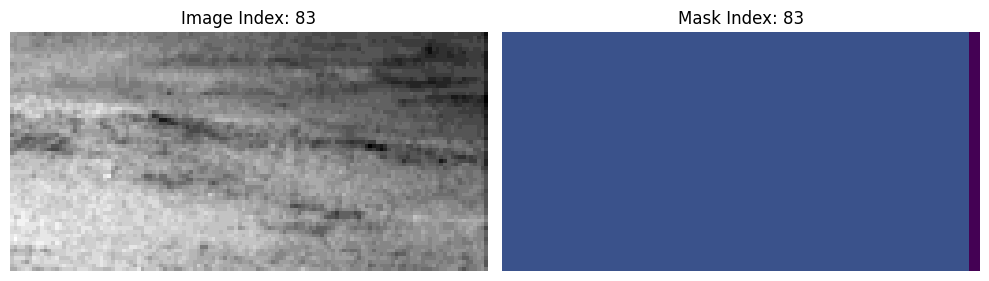

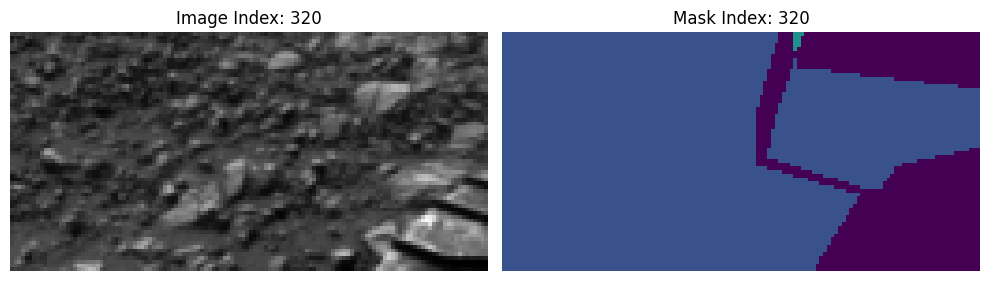

In [25]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train[idx], cmap="viridis",vmin=0,vmax=4)
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

## PYTORCH

In [26]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
import segmentation_models_pytorch as smp
from skimage.util import random_noise
from scipy.ndimage import rotate
from sklearn.metrics import jaccard_score
import torch
import torch.nn as nn

# Set seed for reproducibility
np.random.seed(42)
torch.manual_seed(42)

In [27]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from scipy.ndimage import rotate
import matplotlib.pyplot as plt
from skimage.util import random_noise

# Define hyperparameters
hyperparams = {
    "model": {
        "architecture": "Unet",
        "encoder_name": "mobilenet_v2",
        "encoder_weights": None,
        "input_channels": 1,
        "num_classes": 5,
    },
    "training": {
        "batch_size": 32,
        "learning_rate": 1e-4,
        "num_epochs":250,
    },
    "loss_function": {
        "type": "WeightedCrossEntropy",
    },
    "data": {
        "augmentation": {
            "rotation_angle": 20,
            "noise_amount": 0.03,
        },
    },
}



In [28]:
# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

"""X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=200, random_state=42
)"""

# Add channel dimension and normalize
X_train = X_train[..., np.newaxis] / 255.0
X_val = X_val[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0



Using device: cuda


In [29]:
# Dataset class
class SegmentationDataset(Dataset):
    def __init__(self, images, masks=None, augmentations=None):
        self.images = images
        self.masks = masks
        self.augmentations = augmentations

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx] if self.masks is not None else None

        if self.augmentations:
            image, mask = self.augmentations(image, mask)

        image = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)  # (C, H, W)
        mask = torch.tensor(mask, dtype=torch.long) if mask is not None else None
        return (image, mask) if mask is not None else image



In [30]:
from skimage.util import random_noise
from scipy.ndimage import rotate
import numpy as np

# Define individual augmentation functions
def rotate_image_and_mask(image, mask, angle):
    image = rotate(image, angle, reshape=False, mode="constant", order=1)
    mask = rotate(mask, angle, reshape=False, mode="constant", order=0)
    return image, mask

def add_noise_to_image(image, mask, noise_amount):
    image = random_noise(image, mode="s&p", amount=noise_amount)
    return np.clip(image, 0, 1), mask

def invert_image_and_mask(image, mask):
    image = 1.0 - image
    return image, mask

def flip_horizontal(image, mask):
    image = np.fliplr(image)
    mask = np.fliplr(mask)
    return image, mask

def flip_vertical(image, mask):
    image = np.flipud(image)
    mask = np.flipud(mask)
    return image, mask

# Apply augmentations and update X_train and y_train
def apply_augmentations_and_update(X_train, y_train):
    augmented_images = []
    augmented_masks = []

    augmentations = {
        "rotation": lambda img, msk: rotate_image_and_mask(img, msk, angle=np.random.uniform(-20, 20)),
        "noise": lambda img, msk: add_noise_to_image(img, msk, noise_amount=0.03),
        "invert": invert_image_and_mask,
        "horizontal_flip": flip_horizontal,
        "vertical_flip": flip_vertical,
    }

    # Apply each augmentation and collect augmented data
    for aug_name, aug_function in augmentations.items():
        print(f"Applying {aug_name} augmentation...")
        for image, mask in zip(X_train, y_train):
            aug_image, aug_mask = aug_function(image, mask)
            augmented_images.append(aug_image)
            augmented_masks.append(aug_mask)

    # Convert lists to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_masks = np.array(augmented_masks)

    # Update X_train and y_train by concatenating augmented data
    X_train = np.concatenate([X_train, augmented_images], axis=0)
    y_train = np.concatenate([y_train, augmented_masks], axis=0)

    print(f"Updated X_train shape: {X_train.shape}")
    print(f"Updated y_train shape: {y_train.shape}")
    return X_train, y_train

# Apply augmentations and update datasets
X_train, y_train = apply_augmentations_and_update(X_train, y_train)

# DataLoaders
train_dataset = SegmentationDataset(X_train, y_train)
val_dataset = SegmentationDataset(X_val, y_val)
train_loader = DataLoader(train_dataset, batch_size=hyperparams["training"]["batch_size"], shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)


Applying rotation augmentation...
Applying noise augmentation...
Applying invert augmentation...
Applying horizontal_flip augmentation...
Applying vertical_flip augmentation...
Updated X_train shape: (12024, 64, 128, 1)
Updated y_train shape: (12024, 64, 128)


In [35]:
import numpy as np

def compute_class_weights(masks, num_classes):
    masks_flat = masks.astype(np.int64).reshape(-1)  # Ensure integer type for bincount
    pixel_counts = np.bincount(masks_flat, minlength=num_classes)
    total_pixels = pixel_counts.sum()
    weights = total_pixels / (pixel_counts + 1e-6)  # Avoid division by zero
    return weights / weights.sum()

# Example usage
class_weights = compute_class_weights(y_train, hyperparams["model"]["num_classes"])
print("Computed class weights:", class_weights)


Computed class weights: [0.0048763  0.00375431 0.00528551 0.00701482 0.97906907]


In [32]:
import torch
import numpy as np

def calculate_mean_iou(y_true, y_pred, num_classes, ignore_class=0):
    """
    Calculate mean IoU and per-class IoU.

    Args:
        y_true (torch.Tensor): Ground truth masks of shape (N, H, W).
        y_pred (torch.Tensor): Predicted masks of shape (N, H, W).
        num_classes (int): Total number of classes.
        ignore_class (int): Class to ignore in IoU calculations.

    Returns:
        float: Mean IoU.
        dict: Per-class IoU.
    """
    ious = []
    class_ious = {}

    for c in range(num_classes):
        if c == ignore_class:
            continue

        y_true_c = (y_true == c).int()
        y_pred_c = (y_pred == c).int()

        intersection = (y_true_c & y_pred_c).sum().item()
        union = (y_true_c | y_pred_c).sum().item()

        iou = intersection / union if union > 0 else 0.0
        ious.append(iou)
        class_ious[c] = iou

    mean_iou = np.mean(ious) if ious else 0.0
    return mean_iou, class_ious


In [36]:
class_weights = compute_class_weights(y_train, num_classes=5)
print("Class Weights (Alpha):", class_weights)


Class Weights (Alpha): [0.0048763  0.00375431 0.00528551 0.00701482 0.97906907]


In [37]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=None, size_average=True):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = torch.tensor(alpha, dtype=torch.float32).to(device) if alpha is not None else None
        self.size_average = size_average

    def forward(self, inputs, targets):
        if inputs.dim() > 2:
            inputs = inputs.view(inputs.size(0), inputs.size(1), -1)  # N,C,H,W -> N,C,H*W
            inputs = inputs.transpose(1, 2)                          # N,C,H*W -> N,H*W,C
            inputs = inputs.contiguous().view(-1, inputs.size(2))   # N,H*W,C -> N*H*W,C
        targets = targets.view(-1, 1)

        logpt = F.log_softmax(inputs, dim=1)
        logpt = logpt.gather(1, targets).squeeze(1)
        pt = logpt.exp()

        if self.alpha is not None:
            at = self.alpha.gather(0, targets.view(-1))
            logpt = logpt * at

        loss = -1 * (1 - pt) ** self.gamma * logpt
        return loss.mean() if self.size_average else loss.sum()

focal_loss = FocalLoss(
    gamma=2,  # Adjust this to focus on harder samples
    alpha=class_weights,  # Use computed class weights
    size_average=True
)


Epoch 1/250, Train Loss: 2.2463, Val Loss: 0.0380, Mean IoU: 0.2277
Class 0 IoU: 0.1621
Class 1 IoU: 0.2924
Class 2 IoU: 0.4473
Class 3 IoU: 0.0091


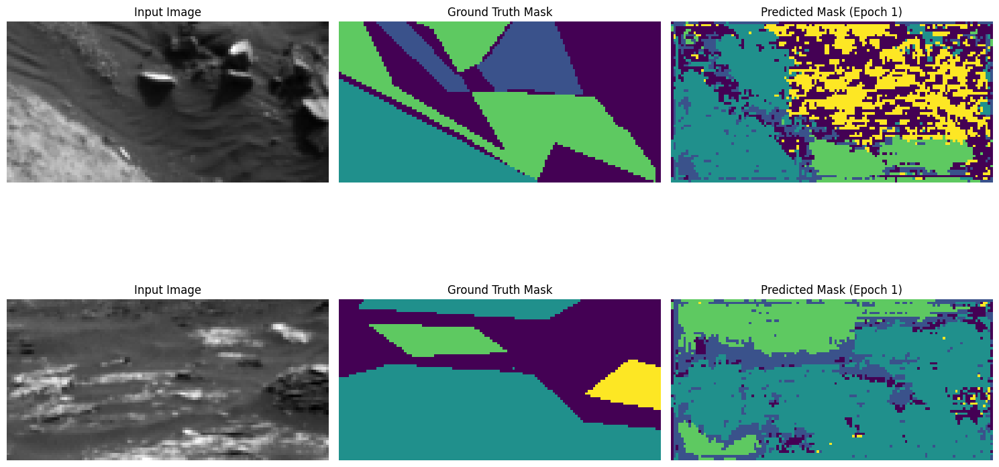

Model saved with new best Mean IoU: 0.2277
Epoch 2/250, Train Loss: 1.9383, Val Loss: 0.0345, Mean IoU: 0.2532
Class 0 IoU: 0.2376
Class 1 IoU: 0.2841
Class 2 IoU: 0.4811
Class 3 IoU: 0.0101


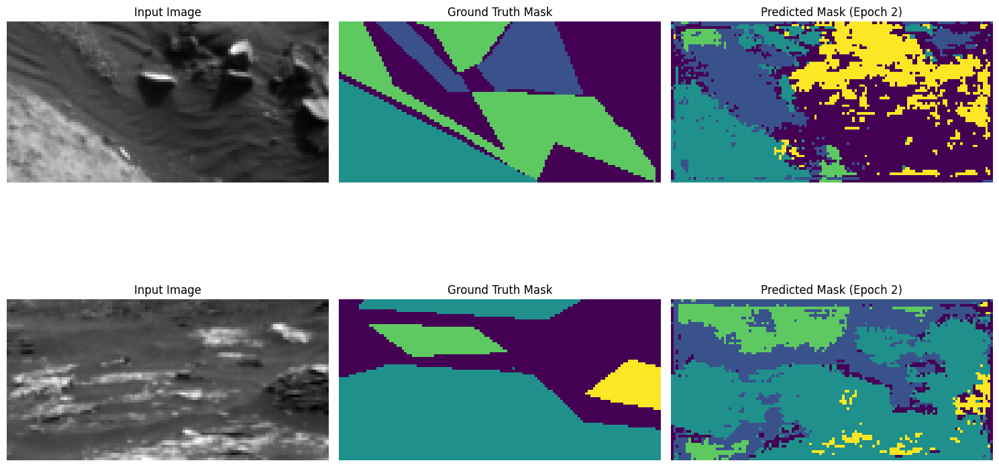

Model saved with new best Mean IoU: 0.2532
Epoch 3/250, Train Loss: 1.8041, Val Loss: 0.0321, Mean IoU: 0.2618
Class 0 IoU: 0.2851
Class 1 IoU: 0.2526
Class 2 IoU: 0.4993
Class 3 IoU: 0.0102


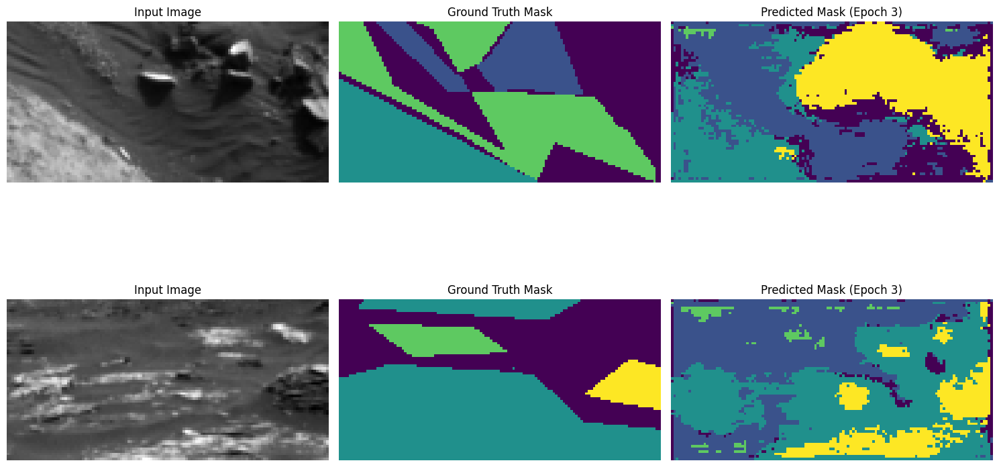

Model saved with new best Mean IoU: 0.2618
Epoch 4/250, Train Loss: 1.7464, Val Loss: 0.0319, Mean IoU: 0.2528
Class 0 IoU: 0.2842
Class 1 IoU: 0.2507
Class 2 IoU: 0.4635
Class 3 IoU: 0.0128


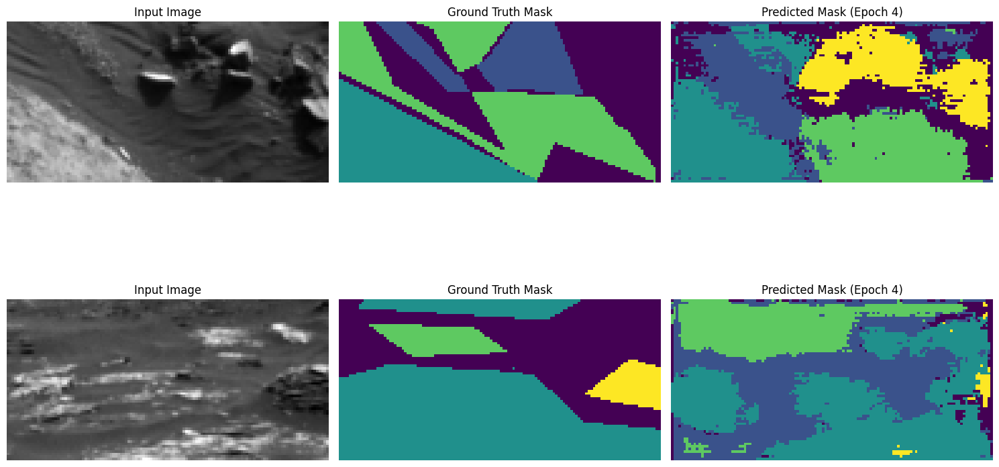

Epoch 5/250, Train Loss: 1.6932, Val Loss: 0.0308, Mean IoU: 0.2621
Class 0 IoU: 0.3088
Class 1 IoU: 0.2457
Class 2 IoU: 0.4763
Class 3 IoU: 0.0174


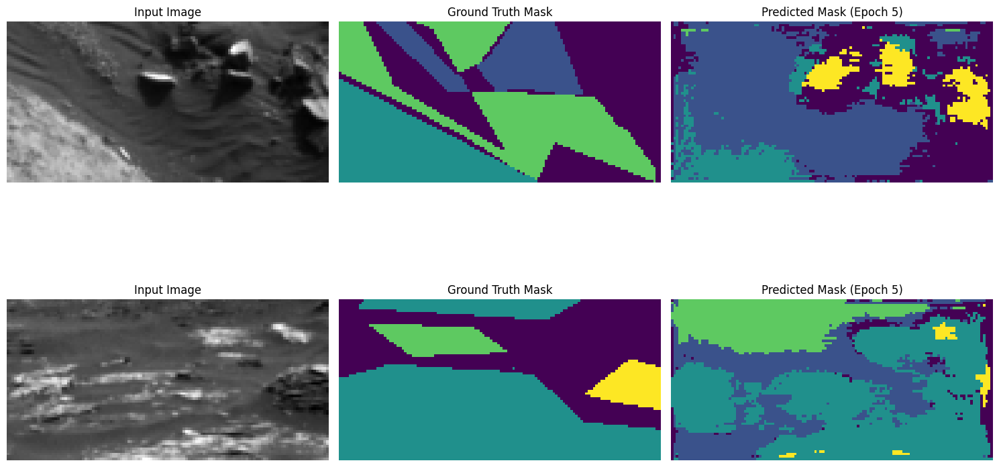

Model saved with new best Mean IoU: 0.2621
Epoch 6/250, Train Loss: 1.6312, Val Loss: 0.0302, Mean IoU: 0.2734
Class 0 IoU: 0.2997
Class 1 IoU: 0.2749
Class 2 IoU: 0.5007
Class 3 IoU: 0.0181


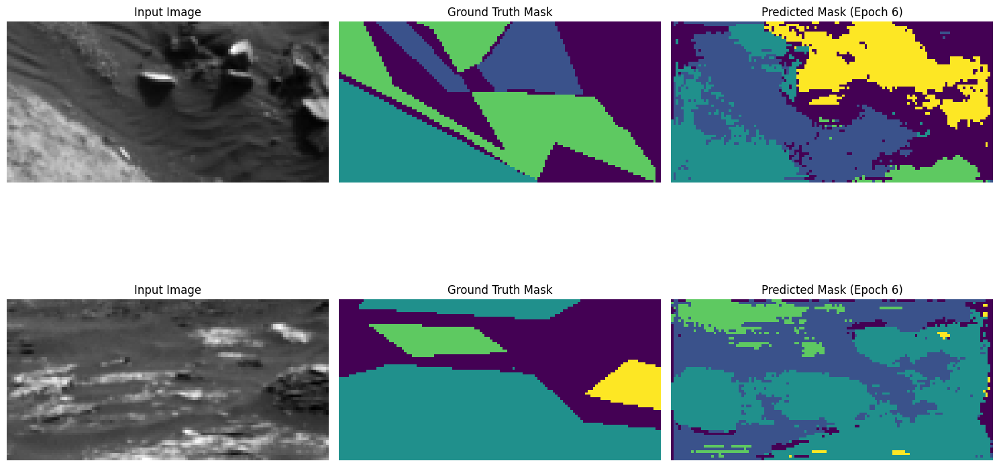

Model saved with new best Mean IoU: 0.2734
Epoch 7/250, Train Loss: 1.5900, Val Loss: 0.0297, Mean IoU: 0.2708
Class 0 IoU: 0.3122
Class 1 IoU: 0.2624
Class 2 IoU: 0.4968
Class 3 IoU: 0.0117


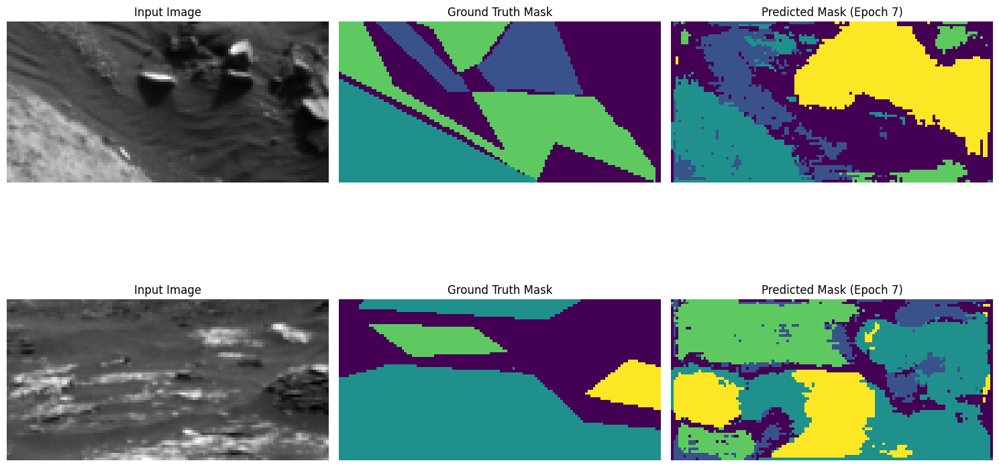

Epoch 8/250, Train Loss: 1.5549, Val Loss: 0.0287, Mean IoU: 0.2864
Class 0 IoU: 0.3447
Class 1 IoU: 0.2741
Class 2 IoU: 0.5097
Class 3 IoU: 0.0170


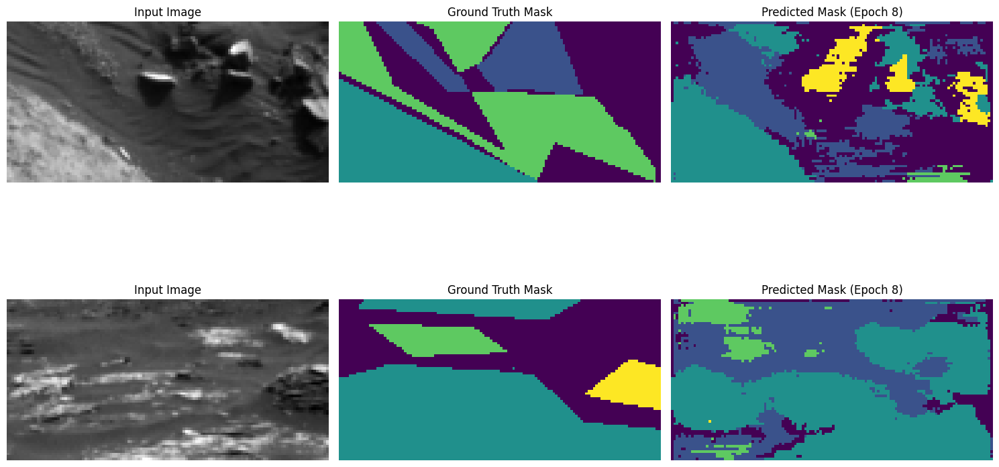

Model saved with new best Mean IoU: 0.2864
Epoch 9/250, Train Loss: 1.4612, Val Loss: 0.0275, Mean IoU: 0.2793
Class 0 IoU: 0.3711
Class 1 IoU: 0.2436
Class 2 IoU: 0.4878
Class 3 IoU: 0.0147


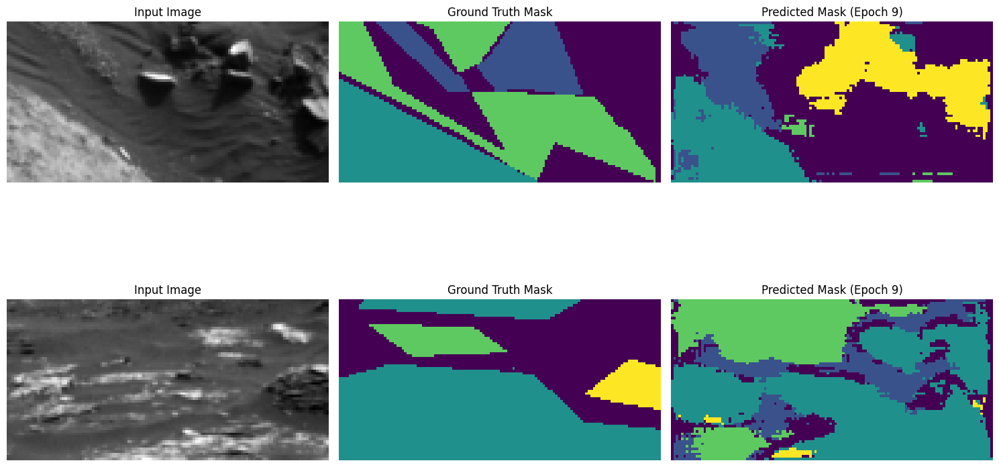

Epoch 10/250, Train Loss: 1.4073, Val Loss: 0.0276, Mean IoU: 0.2839
Class 0 IoU: 0.3240
Class 1 IoU: 0.2689
Class 2 IoU: 0.5261
Class 3 IoU: 0.0164


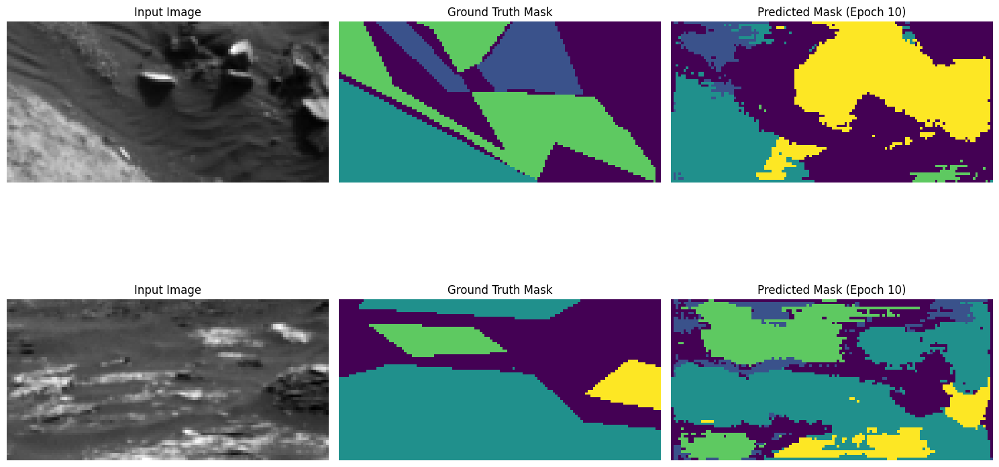

Epoch 11/250, Train Loss: 1.4445, Val Loss: 0.0289, Mean IoU: 0.2829
Class 0 IoU: 0.3481
Class 1 IoU: 0.2592
Class 2 IoU: 0.5088
Class 3 IoU: 0.0156


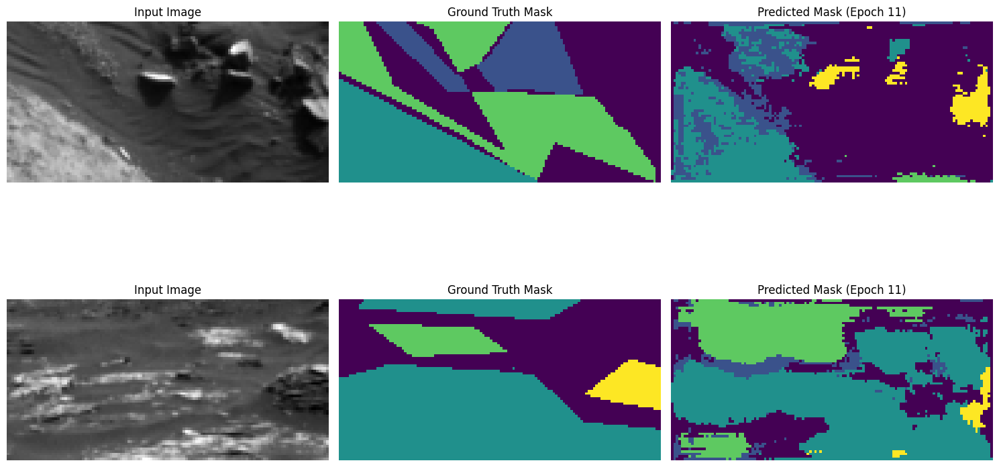

Epoch 12/250, Train Loss: 1.3936, Val Loss: 0.0265, Mean IoU: 0.3009
Class 0 IoU: 0.4067
Class 1 IoU: 0.2520
Class 2 IoU: 0.5295
Class 3 IoU: 0.0154


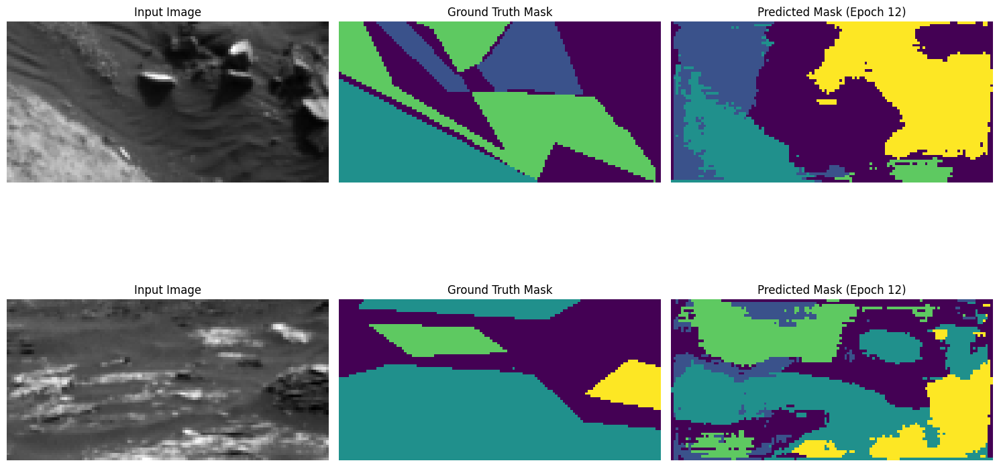

Model saved with new best Mean IoU: 0.3009
Epoch 13/250, Train Loss: 1.3554, Val Loss: 0.0272, Mean IoU: 0.2971
Class 0 IoU: 0.3762
Class 1 IoU: 0.2811
Class 2 IoU: 0.5173
Class 3 IoU: 0.0138


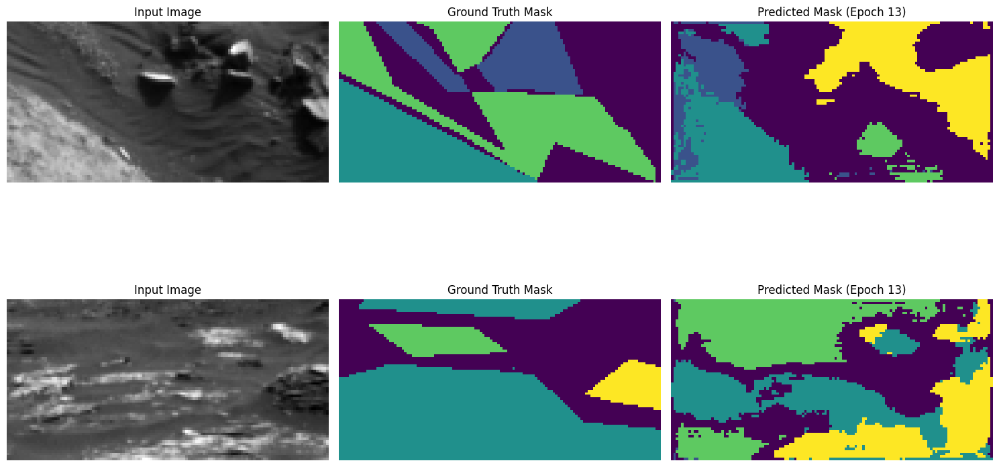

Epoch 14/250, Train Loss: 1.2724, Val Loss: 0.0251, Mean IoU: 0.3179
Class 0 IoU: 0.4383
Class 1 IoU: 0.2853
Class 2 IoU: 0.5277
Class 3 IoU: 0.0204


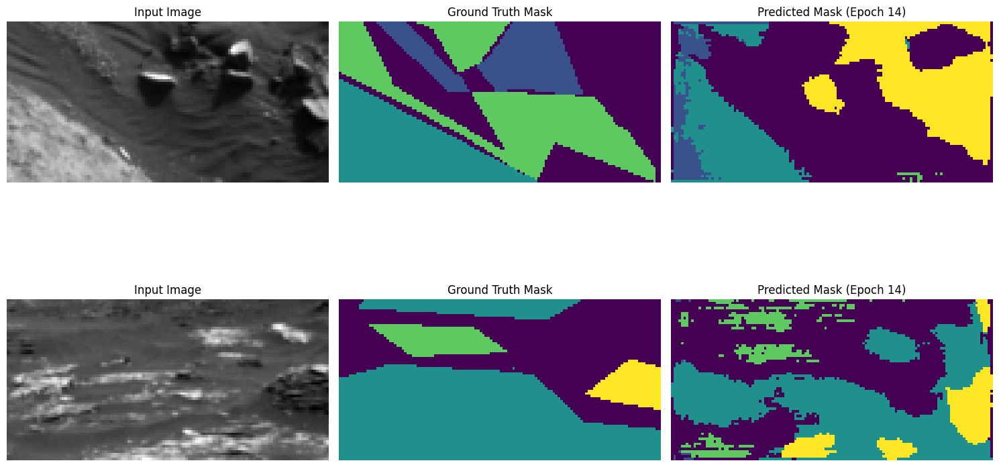

Model saved with new best Mean IoU: 0.3179
Epoch 15/250, Train Loss: 1.2420, Val Loss: 0.0250, Mean IoU: 0.3137
Class 0 IoU: 0.4233
Class 1 IoU: 0.2776
Class 2 IoU: 0.5369
Class 3 IoU: 0.0172


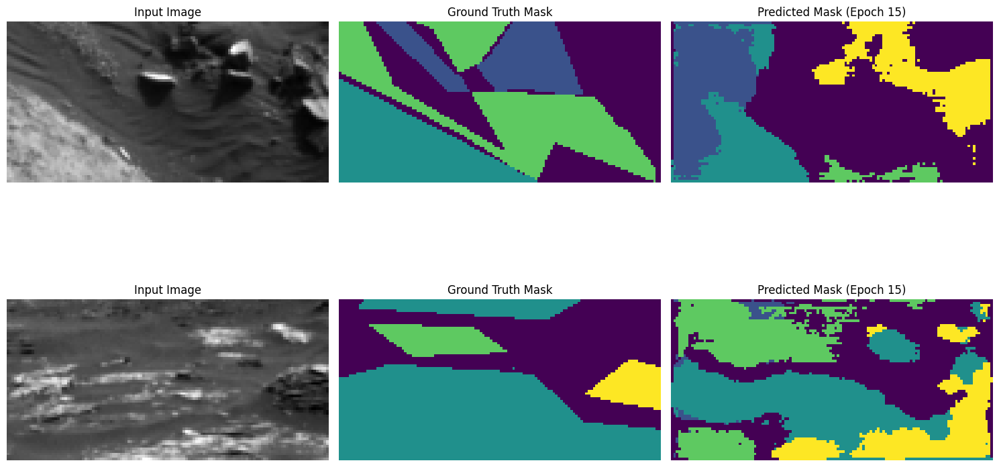

Epoch 16/250, Train Loss: 1.2663, Val Loss: 0.0265, Mean IoU: 0.3244
Class 0 IoU: 0.4492
Class 1 IoU: 0.2879
Class 2 IoU: 0.5433
Class 3 IoU: 0.0172


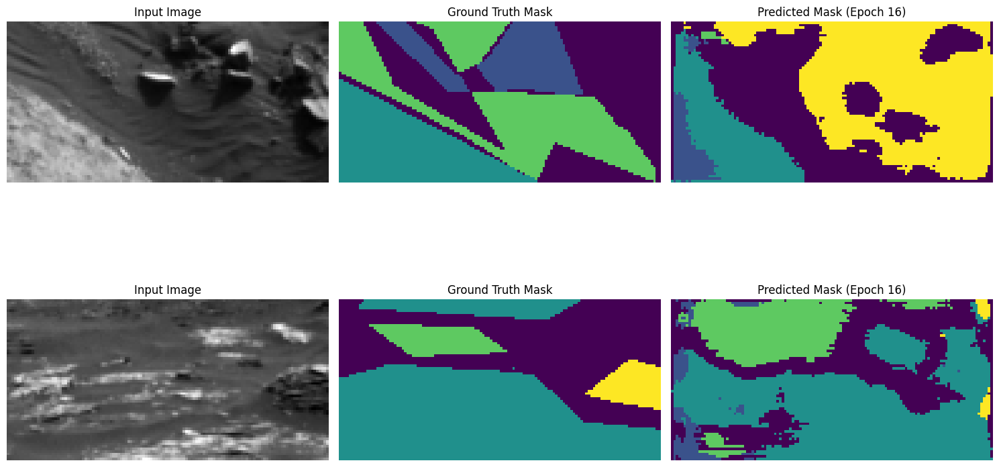

Model saved with new best Mean IoU: 0.3244
Epoch 17/250, Train Loss: 1.2232, Val Loss: 0.0240, Mean IoU: 0.3314
Class 0 IoU: 0.4498
Class 1 IoU: 0.3171
Class 2 IoU: 0.5357
Class 3 IoU: 0.0230


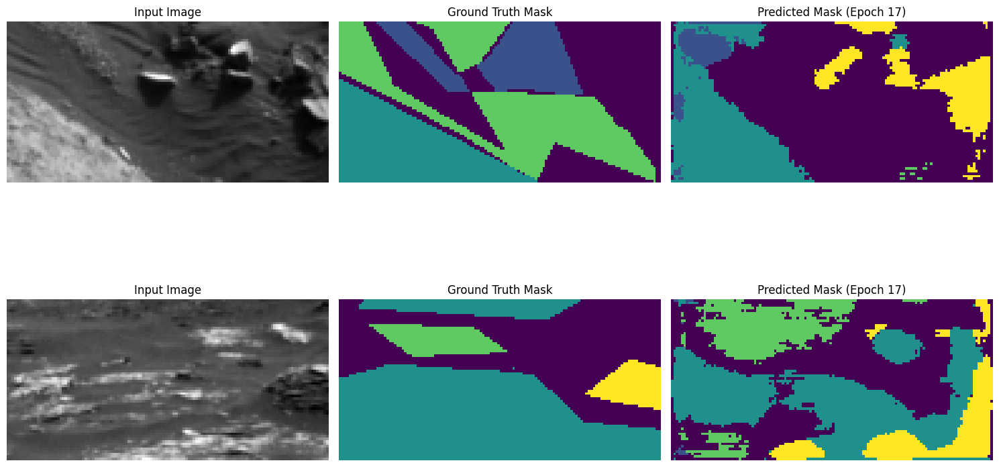

Model saved with new best Mean IoU: 0.3314
Epoch 18/250, Train Loss: 1.2358, Val Loss: 0.0252, Mean IoU: 0.3306
Class 0 IoU: 0.4577
Class 1 IoU: 0.2995
Class 2 IoU: 0.5399
Class 3 IoU: 0.0253


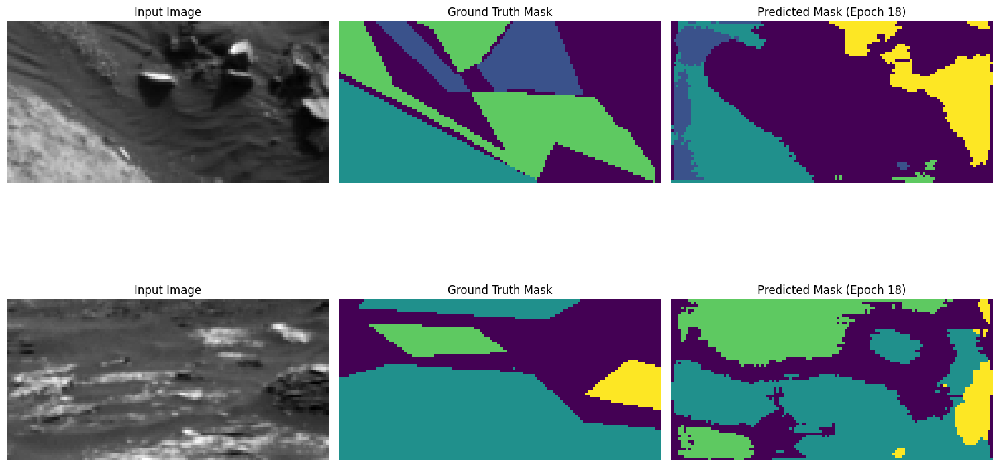

Epoch 19/250, Train Loss: 1.2557, Val Loss: 0.0232, Mean IoU: 0.3386
Class 0 IoU: 0.4917
Class 1 IoU: 0.2979
Class 2 IoU: 0.5358
Class 3 IoU: 0.0290


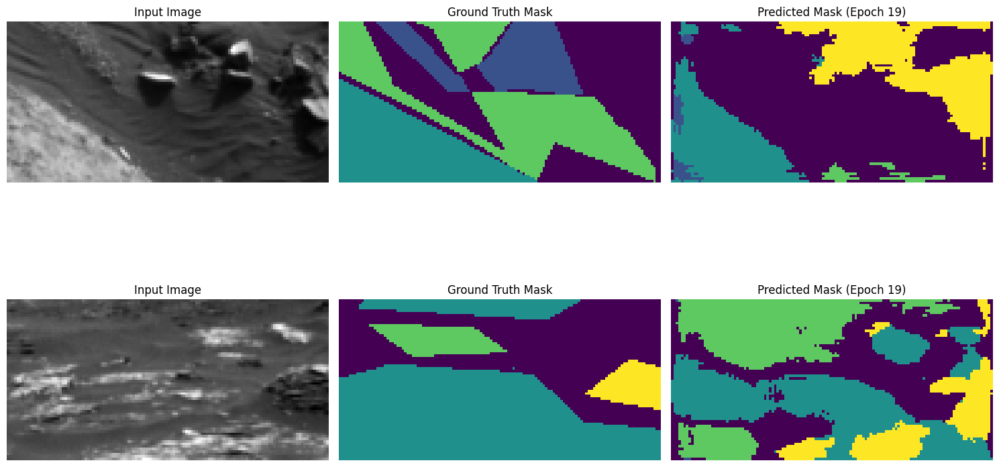

Model saved with new best Mean IoU: 0.3386
Epoch 20/250, Train Loss: 1.1991, Val Loss: 0.0263, Mean IoU: 0.3412
Class 0 IoU: 0.4825
Class 1 IoU: 0.3068
Class 2 IoU: 0.5502
Class 3 IoU: 0.0254


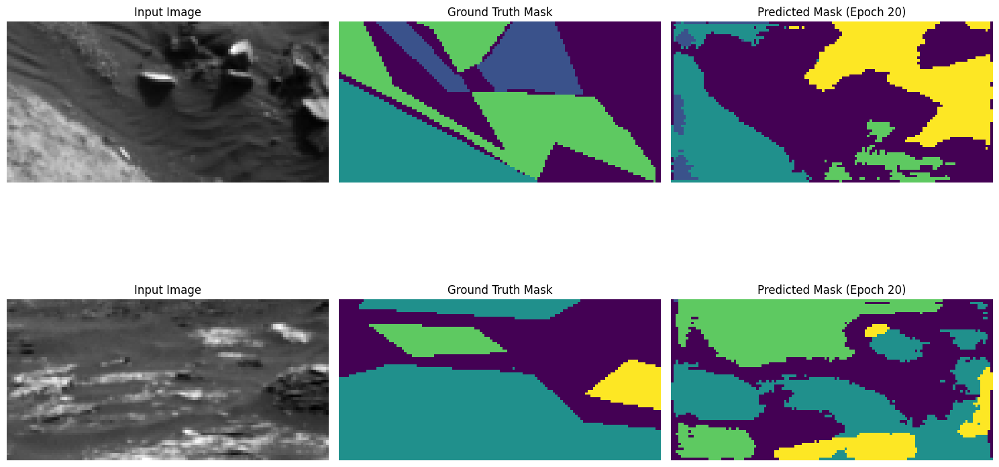

Model saved with new best Mean IoU: 0.3412
Epoch 21/250, Train Loss: 1.1393, Val Loss: 0.0245, Mean IoU: 0.3506
Class 0 IoU: 0.4813
Class 1 IoU: 0.3394
Class 2 IoU: 0.5540
Class 3 IoU: 0.0277


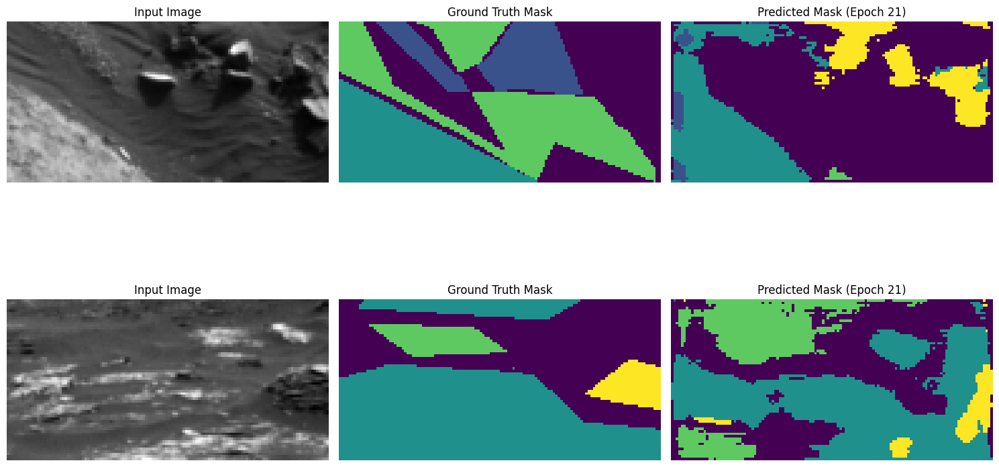

Model saved with new best Mean IoU: 0.3506
Epoch 22/250, Train Loss: 1.1775, Val Loss: 0.0245, Mean IoU: 0.3284
Class 0 IoU: 0.4282
Class 1 IoU: 0.3054
Class 2 IoU: 0.5527
Class 3 IoU: 0.0275


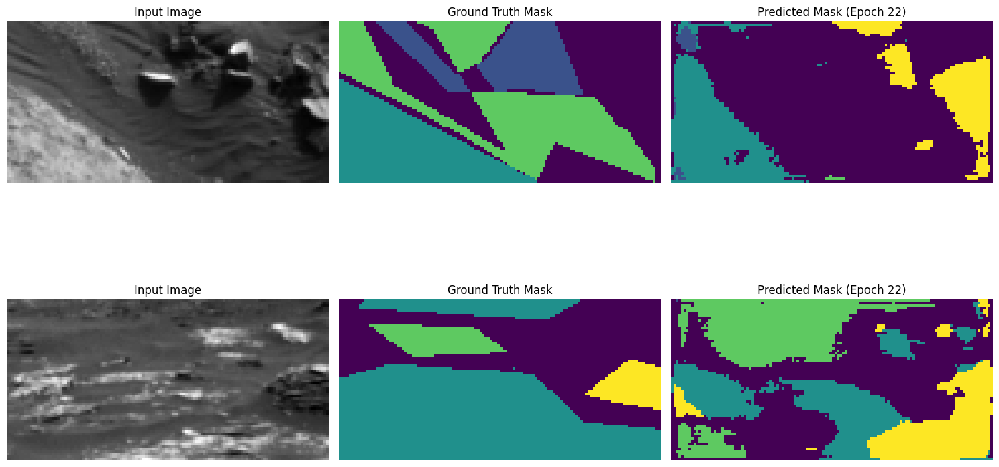

Epoch 23/250, Train Loss: 1.0889, Val Loss: 0.0234, Mean IoU: 0.3578
Class 0 IoU: 0.5091
Class 1 IoU: 0.3264
Class 2 IoU: 0.5674
Class 3 IoU: 0.0283


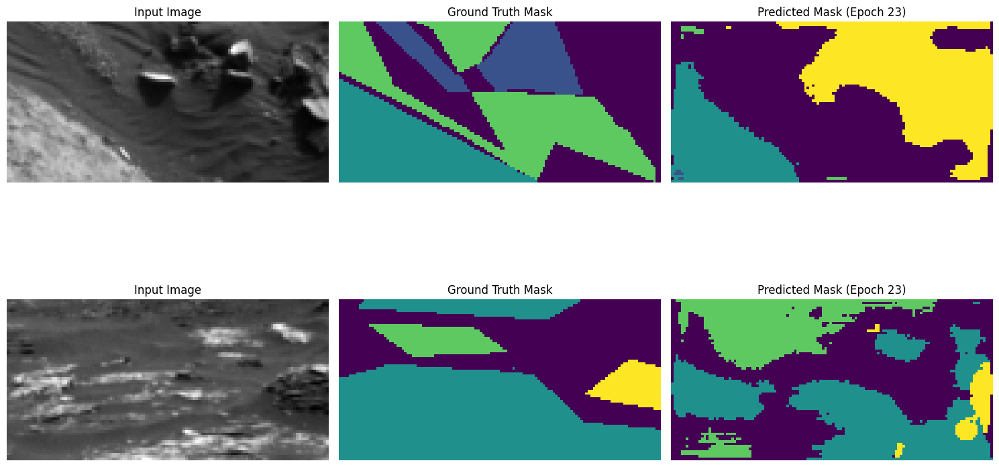

Model saved with new best Mean IoU: 0.3578
Epoch 24/250, Train Loss: 1.0940, Val Loss: 0.0248, Mean IoU: 0.3453
Class 0 IoU: 0.4814
Class 1 IoU: 0.3268
Class 2 IoU: 0.5429
Class 3 IoU: 0.0303


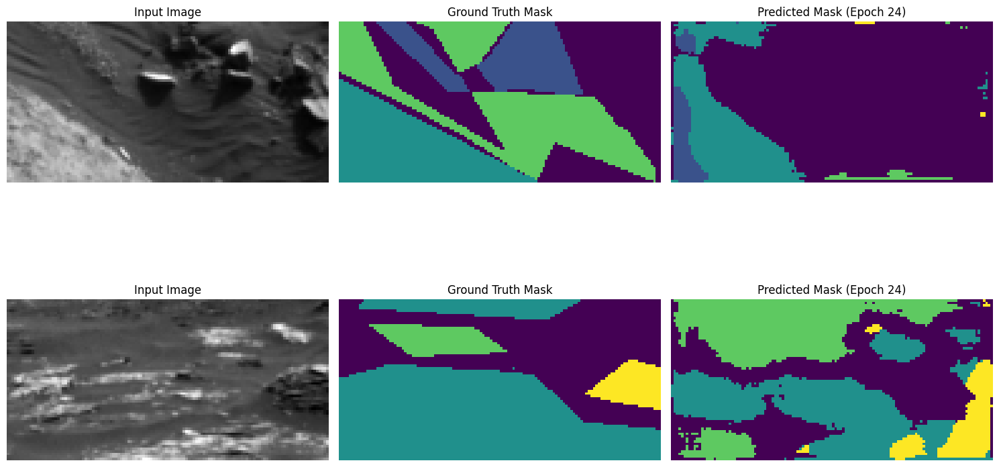

Epoch 25/250, Train Loss: 1.1128, Val Loss: 0.0262, Mean IoU: 0.3564
Class 0 IoU: 0.5127
Class 1 IoU: 0.3343
Class 2 IoU: 0.5510
Class 3 IoU: 0.0278


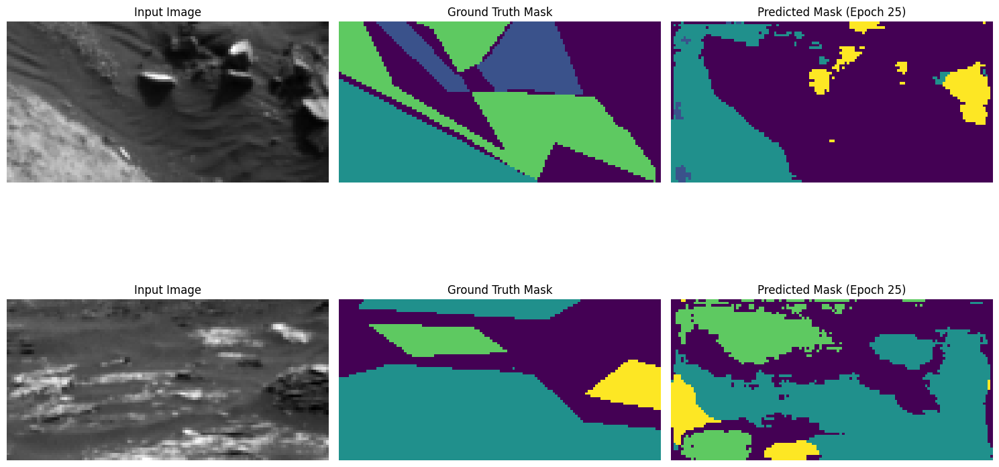

Epoch 26/250, Train Loss: 1.1123, Val Loss: 0.0245, Mean IoU: 0.3622
Class 0 IoU: 0.5148
Class 1 IoU: 0.3397
Class 2 IoU: 0.5686
Class 3 IoU: 0.0258


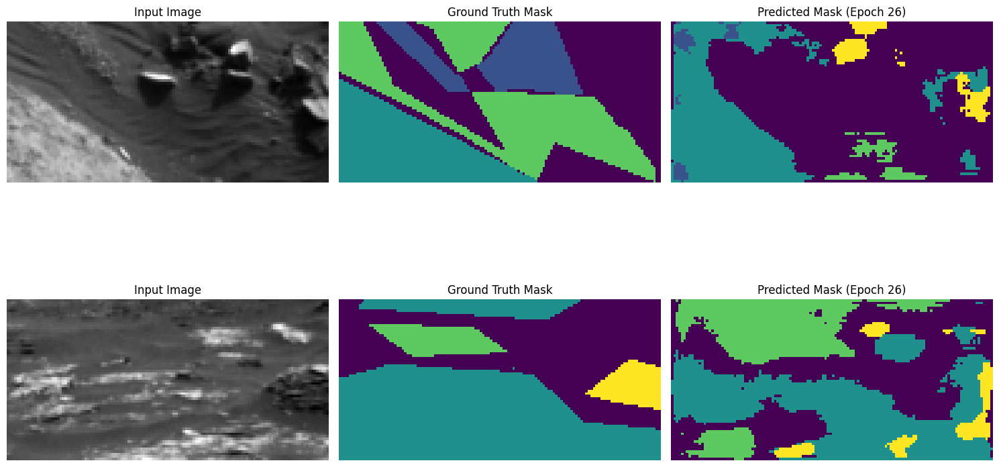

Model saved with new best Mean IoU: 0.3622
Epoch 27/250, Train Loss: 1.0793, Val Loss: 0.0256, Mean IoU: 0.3654
Class 0 IoU: 0.5068
Class 1 IoU: 0.3573
Class 2 IoU: 0.5533
Class 3 IoU: 0.0441


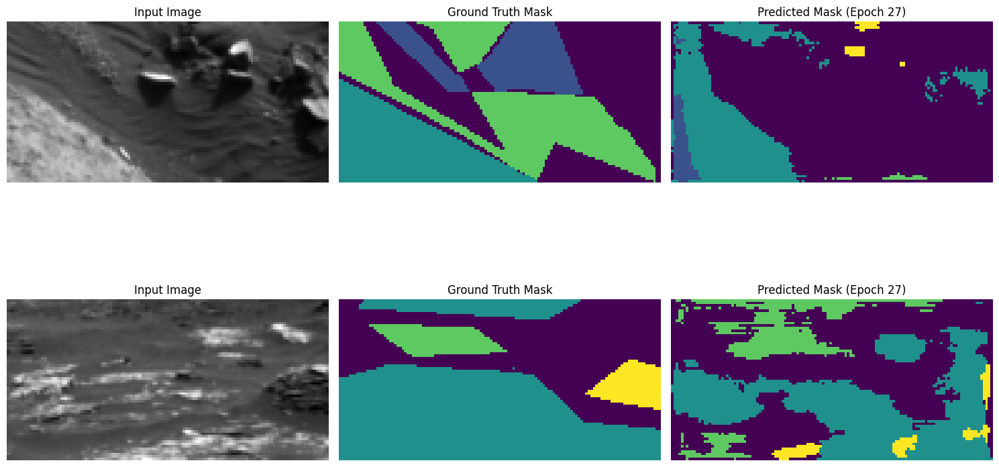

Model saved with new best Mean IoU: 0.3654
Epoch 28/250, Train Loss: 1.0435, Val Loss: 0.0250, Mean IoU: 0.3668
Class 0 IoU: 0.5465
Class 1 IoU: 0.3407
Class 2 IoU: 0.5566
Class 3 IoU: 0.0235


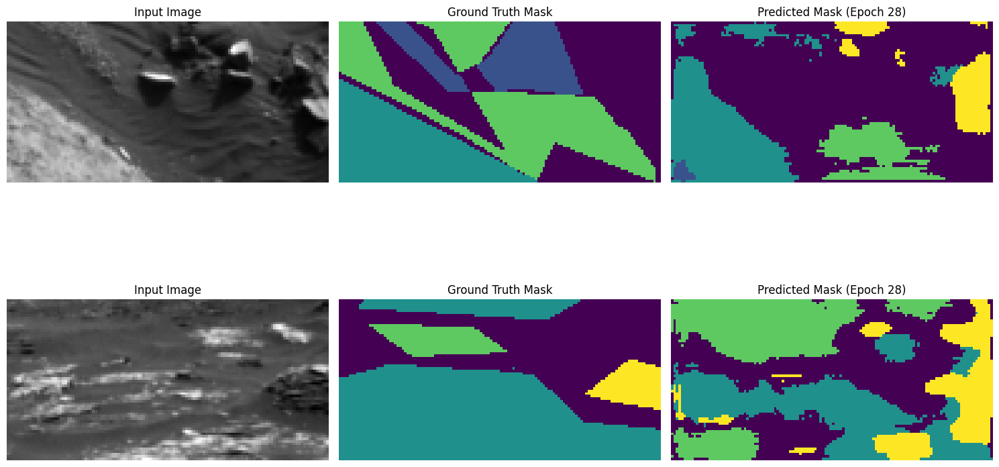

Model saved with new best Mean IoU: 0.3668
Epoch 29/250, Train Loss: 1.0241, Val Loss: 0.0261, Mean IoU: 0.3667
Class 0 IoU: 0.5112
Class 1 IoU: 0.3684
Class 2 IoU: 0.5488
Class 3 IoU: 0.0384


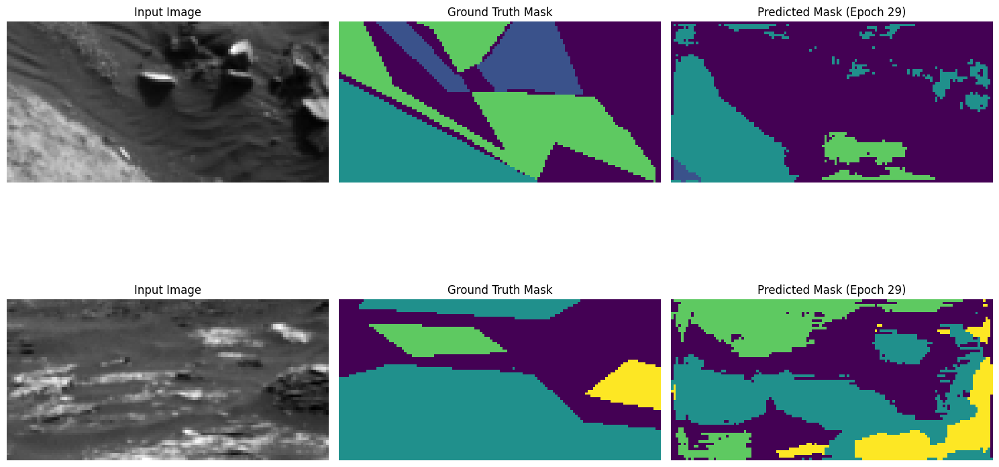

Epoch 30/250, Train Loss: 1.0491, Val Loss: 0.0233, Mean IoU: 0.3738
Class 0 IoU: 0.5187
Class 1 IoU: 0.3655
Class 2 IoU: 0.5742
Class 3 IoU: 0.0370


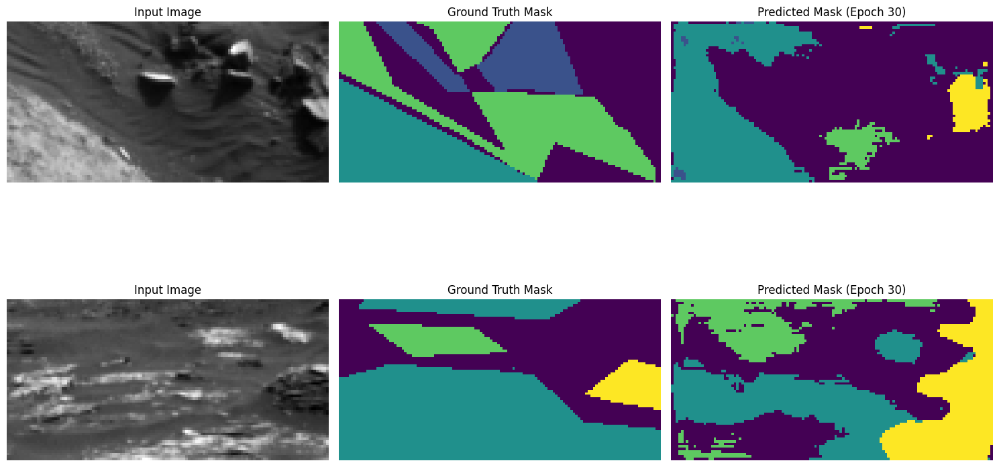

Model saved with new best Mean IoU: 0.3738
Epoch 31/250, Train Loss: 1.1033, Val Loss: 0.0291, Mean IoU: 0.3659
Class 0 IoU: 0.5422
Class 1 IoU: 0.3408
Class 2 IoU: 0.5598
Class 3 IoU: 0.0207


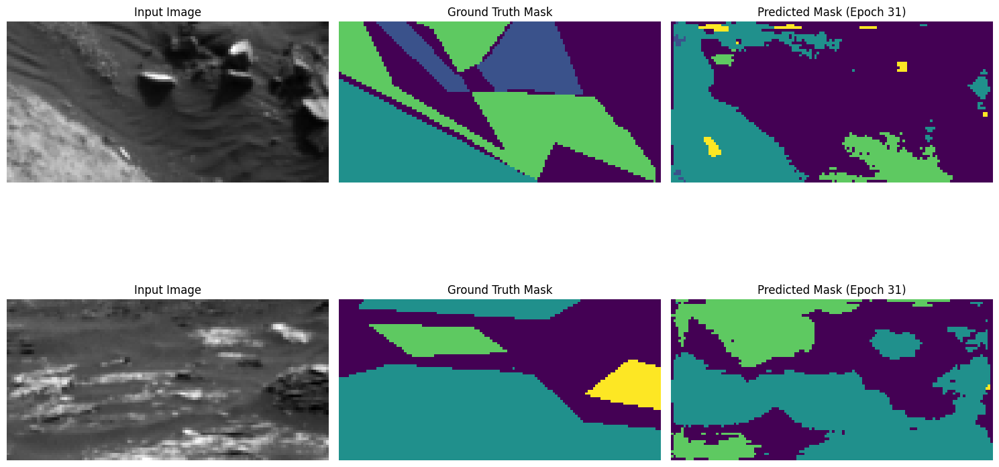

Epoch 32/250, Train Loss: 1.0607, Val Loss: 0.0232, Mean IoU: 0.3703
Class 0 IoU: 0.5066
Class 1 IoU: 0.3635
Class 2 IoU: 0.5743
Class 3 IoU: 0.0367


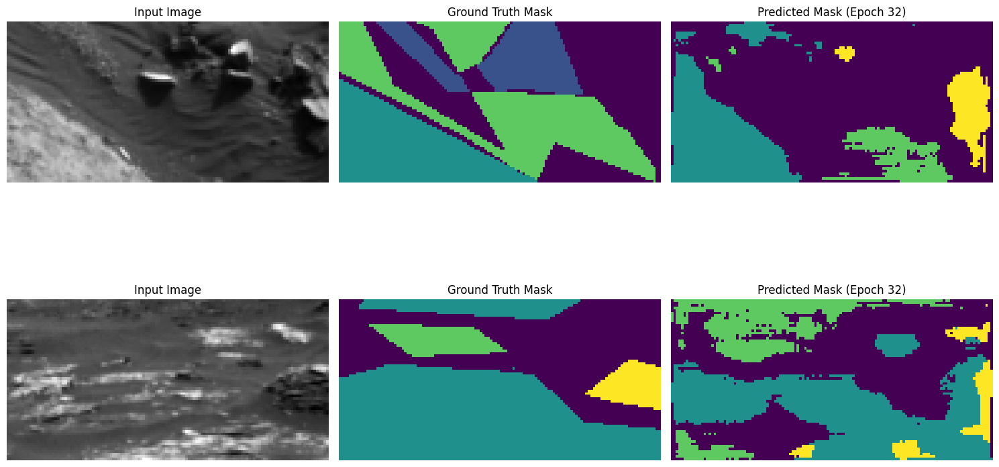

Epoch 33/250, Train Loss: 1.0022, Val Loss: 0.0265, Mean IoU: 0.3897
Class 0 IoU: 0.5473
Class 1 IoU: 0.3757
Class 2 IoU: 0.5861
Class 3 IoU: 0.0498


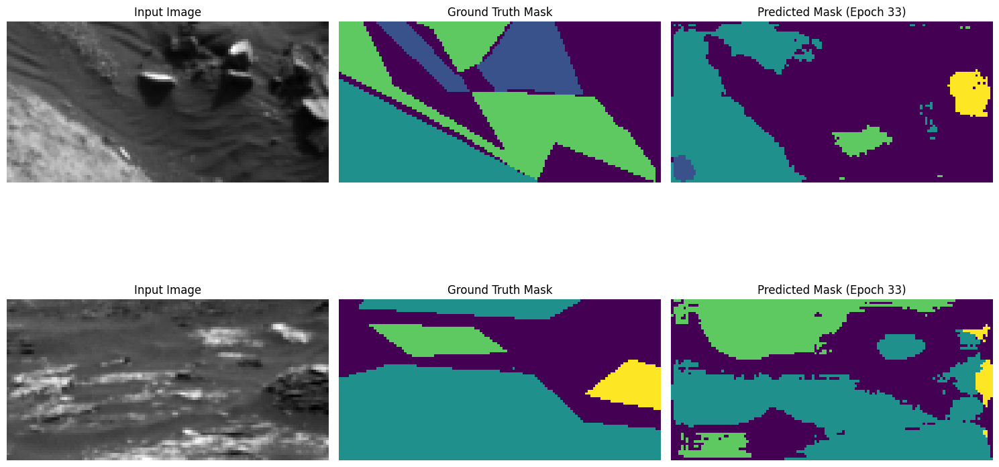

Model saved with new best Mean IoU: 0.3897
Epoch 34/250, Train Loss: 0.9662, Val Loss: 0.0255, Mean IoU: 0.3718
Class 0 IoU: 0.5331
Class 1 IoU: 0.3693
Class 2 IoU: 0.5604
Class 3 IoU: 0.0244


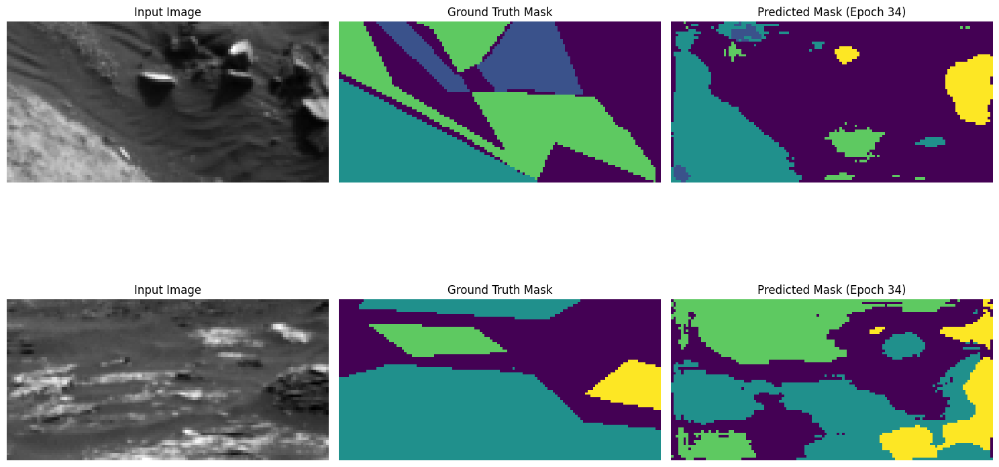

Epoch 35/250, Train Loss: 0.9834, Val Loss: 0.0339, Mean IoU: 0.3781
Class 0 IoU: 0.5334
Class 1 IoU: 0.3713
Class 2 IoU: 0.5829
Class 3 IoU: 0.0248


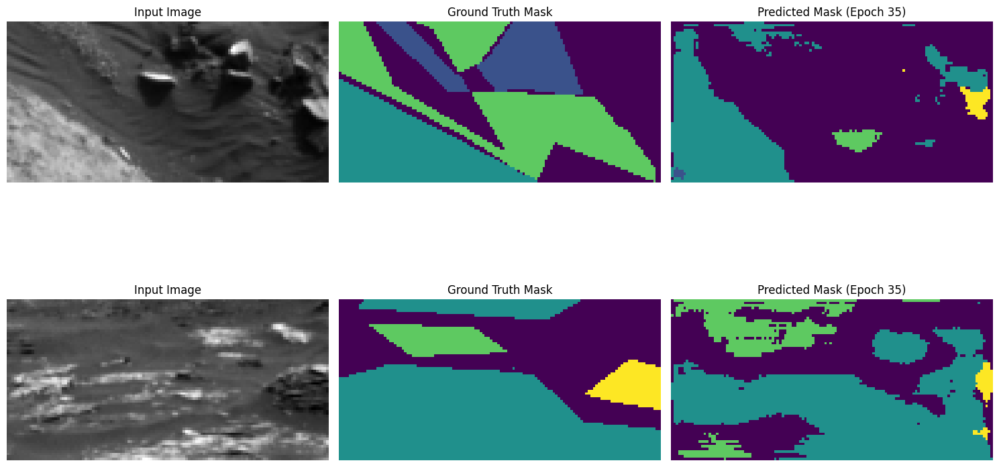

Epoch 36/250, Train Loss: 0.9813, Val Loss: 0.0279, Mean IoU: 0.3928
Class 0 IoU: 0.5731
Class 1 IoU: 0.3784
Class 2 IoU: 0.5894
Class 3 IoU: 0.0303


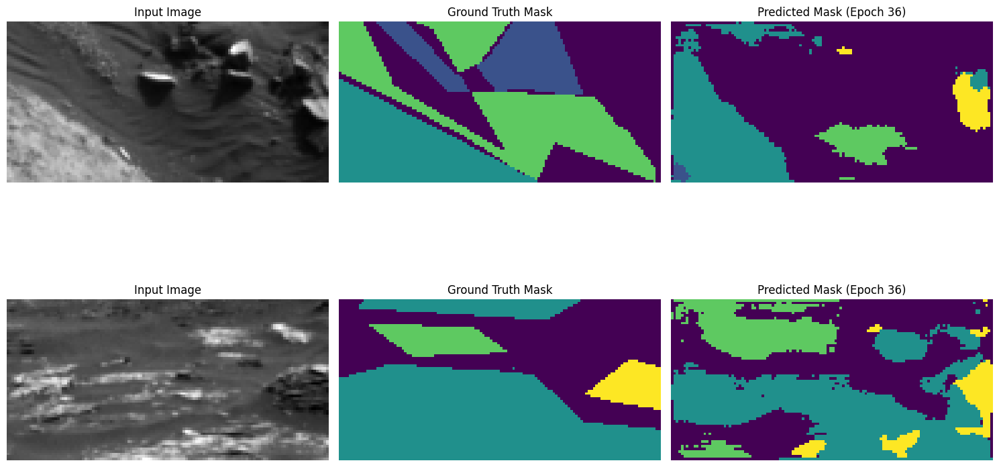

Model saved with new best Mean IoU: 0.3928
Epoch 37/250, Train Loss: 0.9768, Val Loss: 0.0284, Mean IoU: 0.3597
Class 0 IoU: 0.4722
Class 1 IoU: 0.3755
Class 2 IoU: 0.5612
Class 3 IoU: 0.0299


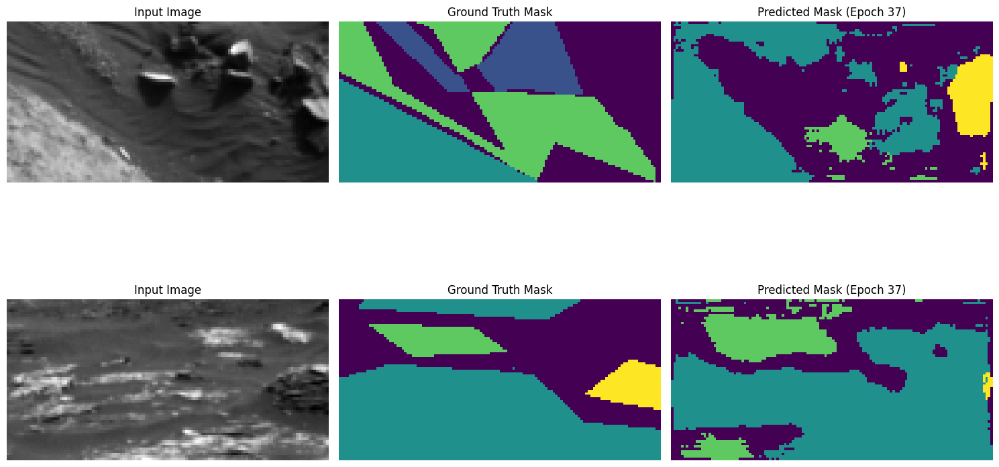

Epoch 38/250, Train Loss: 1.0082, Val Loss: 0.0261, Mean IoU: 0.3782
Class 0 IoU: 0.5413
Class 1 IoU: 0.3686
Class 2 IoU: 0.5723
Class 3 IoU: 0.0307


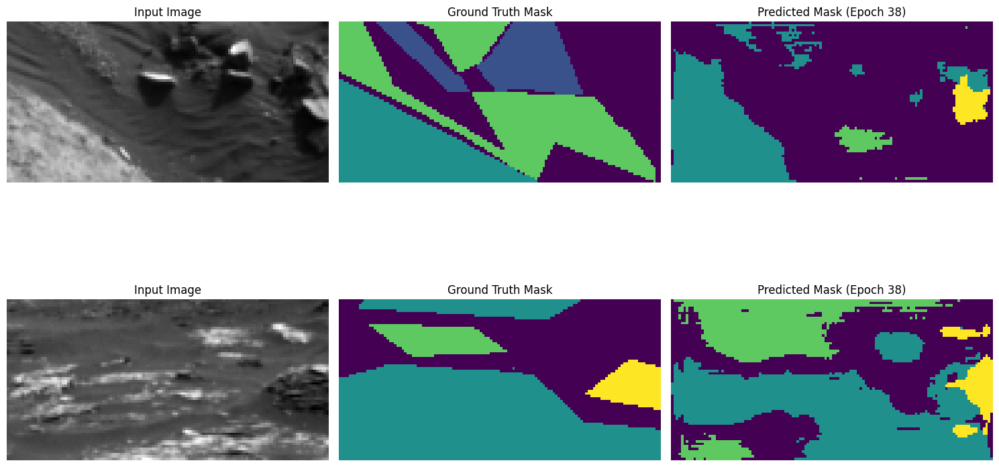

Epoch 39/250, Train Loss: 0.9485, Val Loss: 0.0222, Mean IoU: 0.3749
Class 0 IoU: 0.5492
Class 1 IoU: 0.3662
Class 2 IoU: 0.5651
Class 3 IoU: 0.0191


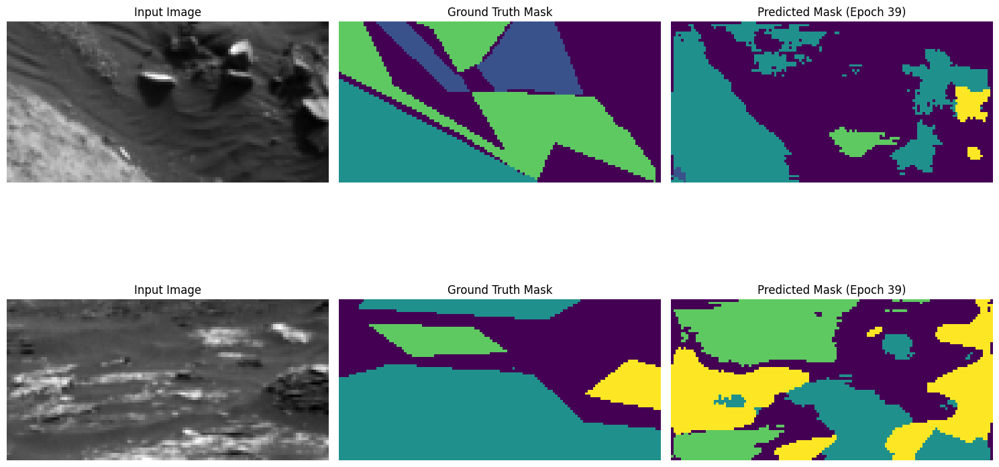

Epoch 40/250, Train Loss: 0.9672, Val Loss: 0.0298, Mean IoU: 0.3910
Class 0 IoU: 0.5596
Class 1 IoU: 0.3553
Class 2 IoU: 0.5763
Class 3 IoU: 0.0725


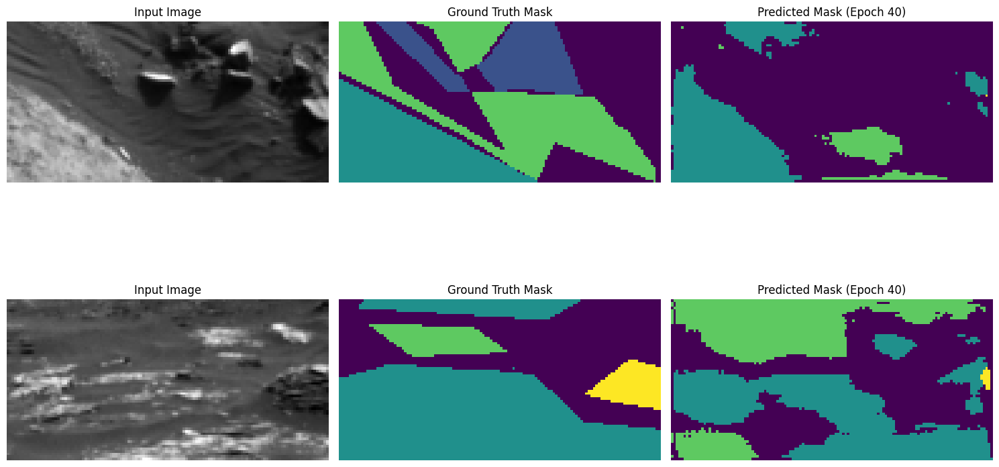

Epoch 41/250, Train Loss: 1.0709, Val Loss: 0.0248, Mean IoU: 0.3891
Class 0 IoU: 0.5626
Class 1 IoU: 0.3767
Class 2 IoU: 0.5783
Class 3 IoU: 0.0386


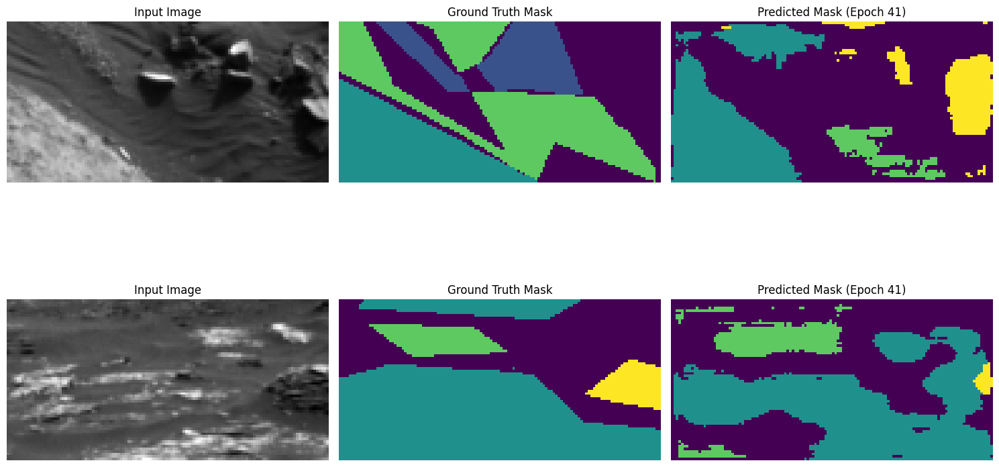

Epoch 42/250, Train Loss: 0.9598, Val Loss: 0.0274, Mean IoU: 0.3895
Class 0 IoU: 0.5766
Class 1 IoU: 0.3688
Class 2 IoU: 0.5788
Class 3 IoU: 0.0337


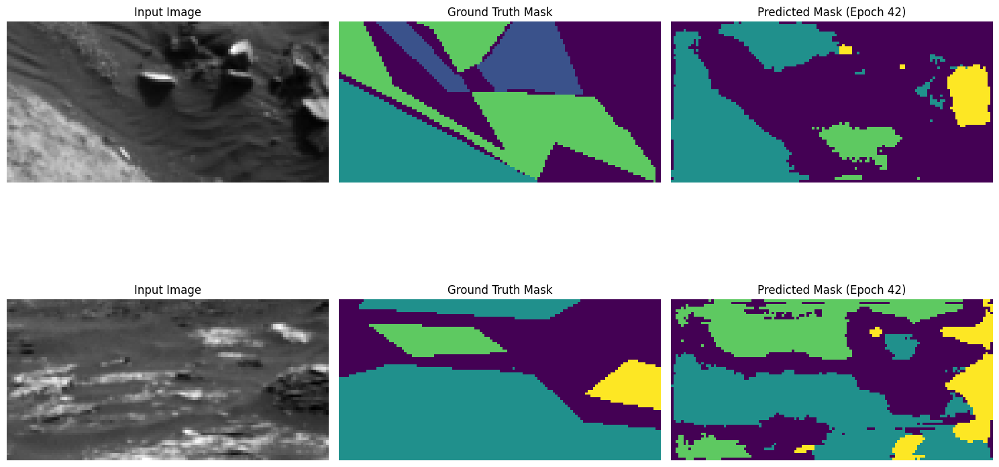

Epoch 43/250, Train Loss: 0.9066, Val Loss: 0.0317, Mean IoU: 0.3977
Class 0 IoU: 0.5754
Class 1 IoU: 0.3858
Class 2 IoU: 0.5868
Class 3 IoU: 0.0429


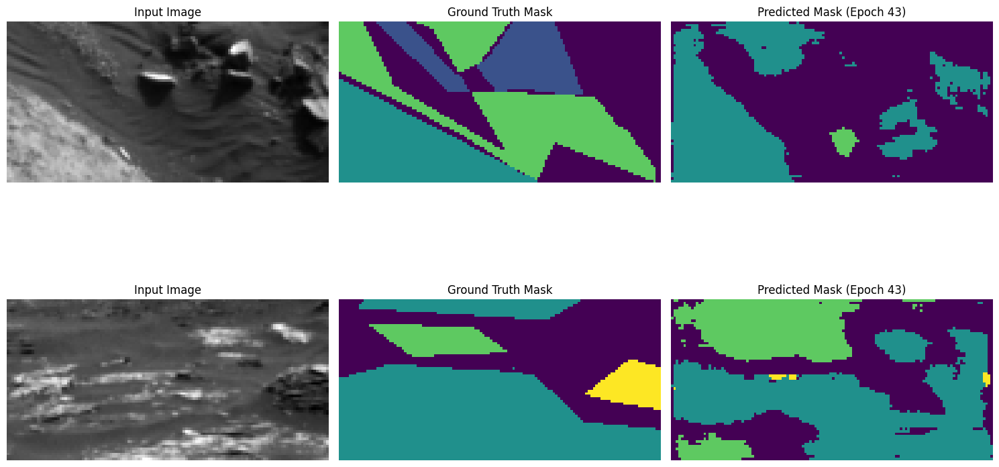

Model saved with new best Mean IoU: 0.3977
Epoch 44/250, Train Loss: 0.8941, Val Loss: 0.0278, Mean IoU: 0.3973
Class 0 IoU: 0.5735
Class 1 IoU: 0.4013
Class 2 IoU: 0.5765
Class 3 IoU: 0.0380


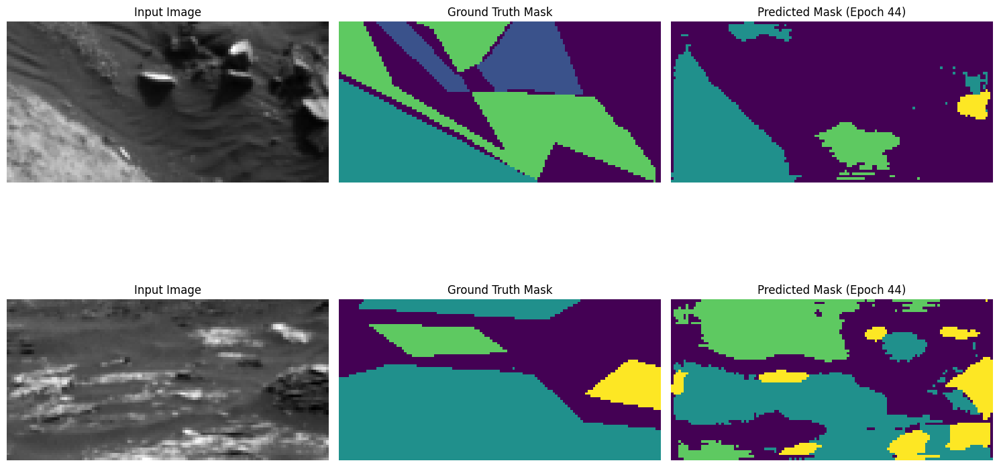

Epoch 45/250, Train Loss: 0.9129, Val Loss: 0.0306, Mean IoU: 0.3999
Class 0 IoU: 0.5797
Class 1 IoU: 0.4047
Class 2 IoU: 0.5713
Class 3 IoU: 0.0440


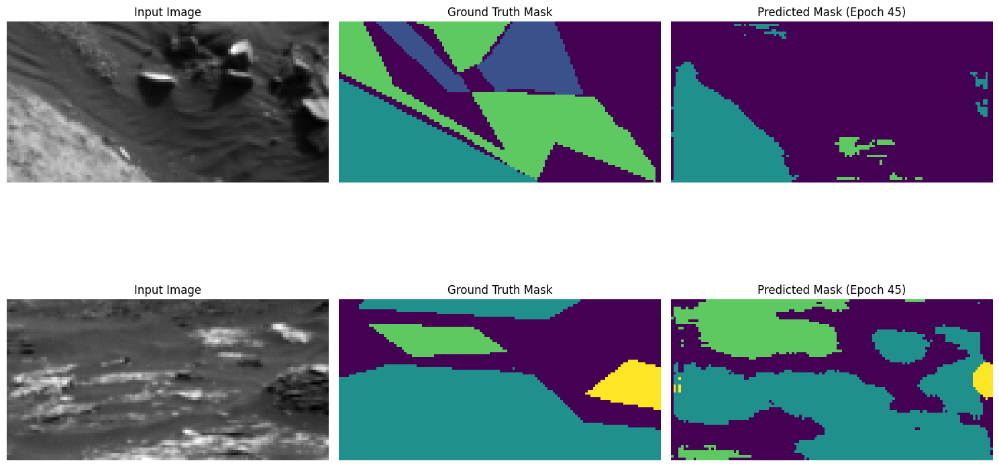

Model saved with new best Mean IoU: 0.3999
Epoch 46/250, Train Loss: 0.9454, Val Loss: 0.0259, Mean IoU: 0.3961
Class 0 IoU: 0.5751
Class 1 IoU: 0.3937
Class 2 IoU: 0.5890
Class 3 IoU: 0.0267


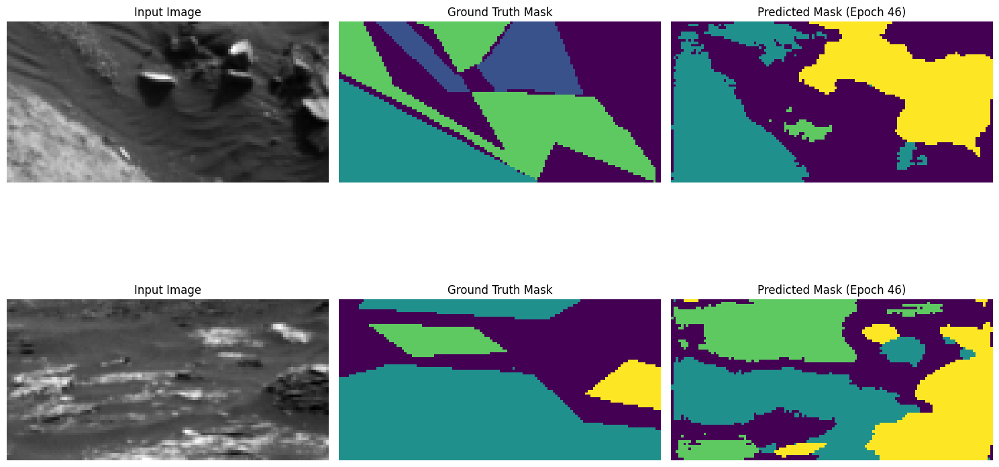

Epoch 47/250, Train Loss: 0.8935, Val Loss: 0.0267, Mean IoU: 0.4092
Class 0 IoU: 0.5844
Class 1 IoU: 0.3920
Class 2 IoU: 0.5936
Class 3 IoU: 0.0669


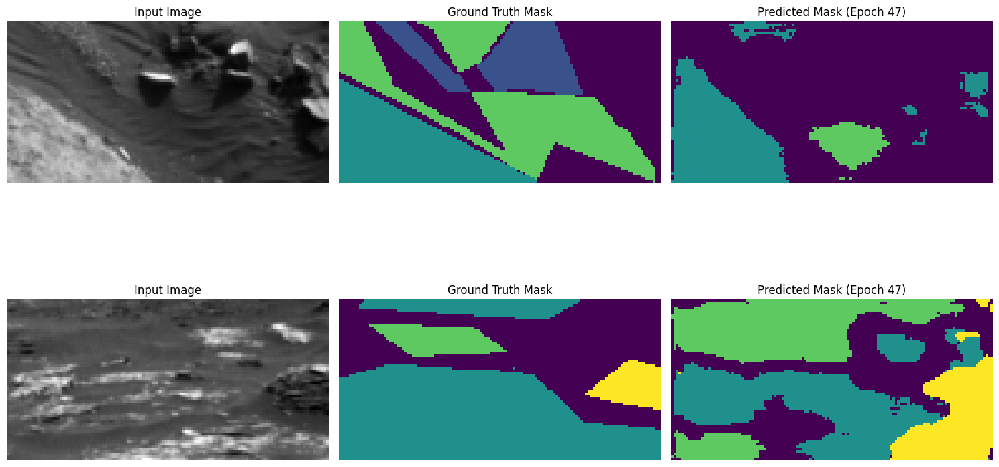

Model saved with new best Mean IoU: 0.4092
Epoch 48/250, Train Loss: 0.9145, Val Loss: 0.0266, Mean IoU: 0.4151
Class 0 IoU: 0.6036
Class 1 IoU: 0.4140
Class 2 IoU: 0.6044
Class 3 IoU: 0.0385


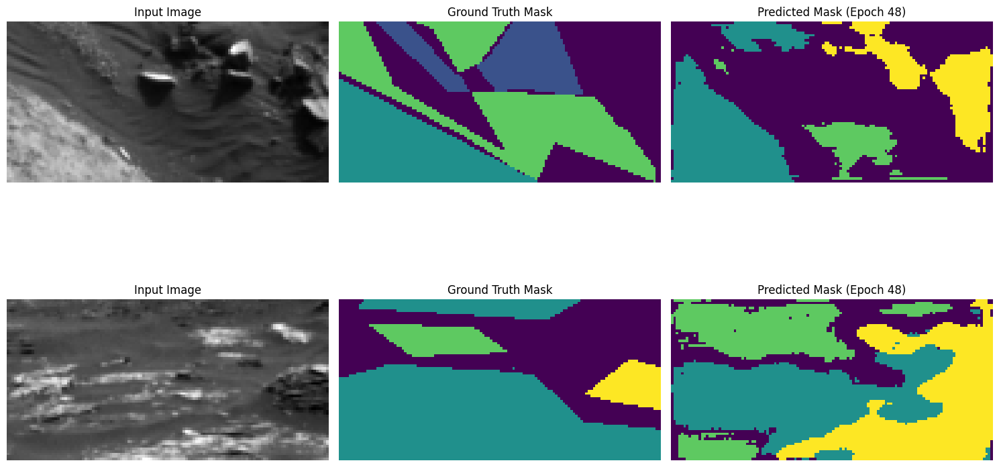

Model saved with new best Mean IoU: 0.4151
Epoch 49/250, Train Loss: 0.9140, Val Loss: 0.0238, Mean IoU: 0.4009
Class 0 IoU: 0.5869
Class 1 IoU: 0.3990
Class 2 IoU: 0.5713
Class 3 IoU: 0.0463


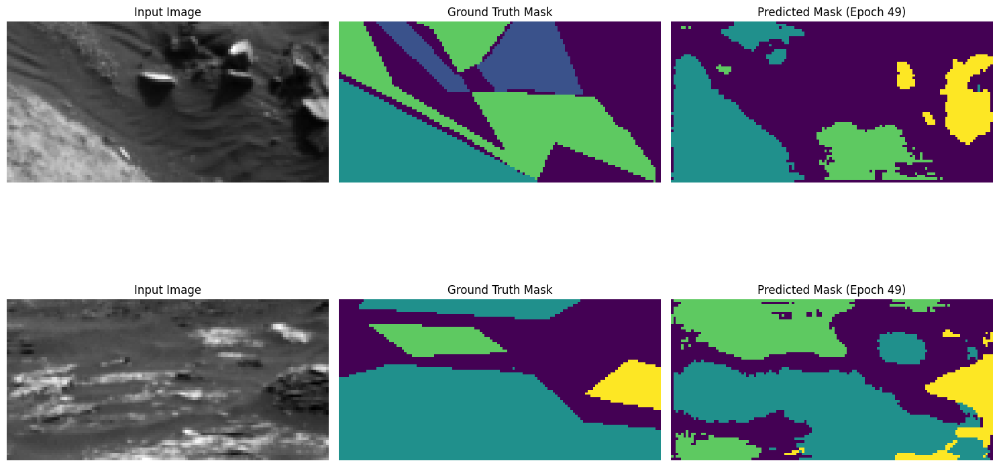

Epoch 50/250, Train Loss: 0.8974, Val Loss: 0.0265, Mean IoU: 0.4077
Class 0 IoU: 0.5847
Class 1 IoU: 0.4188
Class 2 IoU: 0.5731
Class 3 IoU: 0.0541


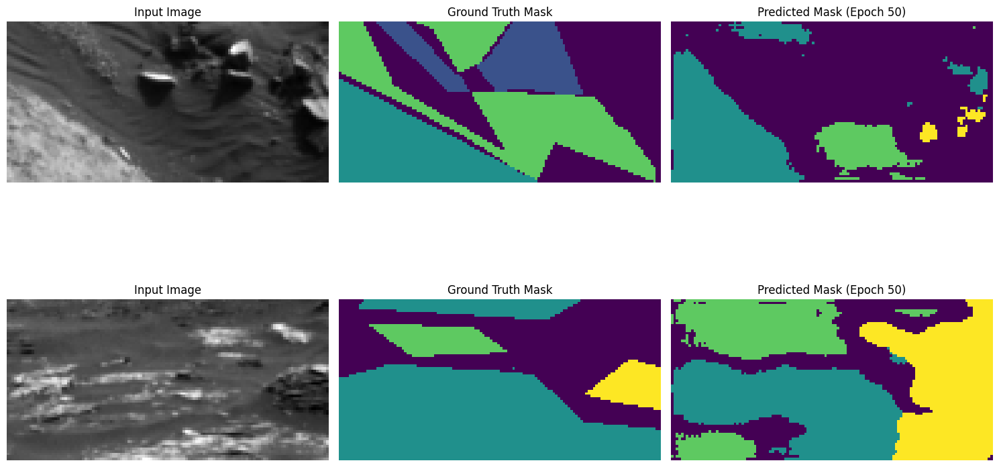

Epoch 51/250, Train Loss: 0.8593, Val Loss: 0.0279, Mean IoU: 0.4239
Class 0 IoU: 0.5961
Class 1 IoU: 0.4383
Class 2 IoU: 0.5825
Class 3 IoU: 0.0786


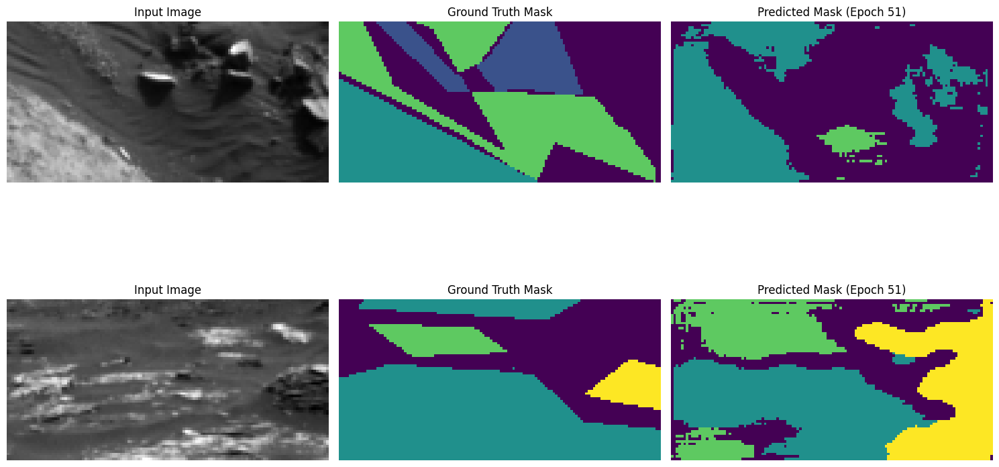

Model saved with new best Mean IoU: 0.4239
Epoch 52/250, Train Loss: 0.9580, Val Loss: 0.0284, Mean IoU: 0.4196
Class 0 IoU: 0.6153
Class 1 IoU: 0.4244
Class 2 IoU: 0.5850
Class 3 IoU: 0.0536


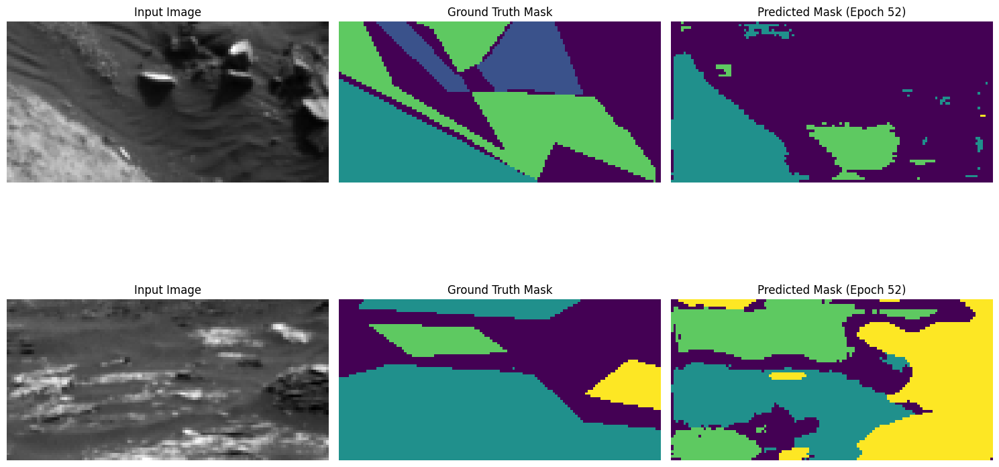

Epoch 53/250, Train Loss: 0.8837, Val Loss: 0.0289, Mean IoU: 0.4182
Class 0 IoU: 0.6035
Class 1 IoU: 0.4347
Class 2 IoU: 0.5820
Class 3 IoU: 0.0524


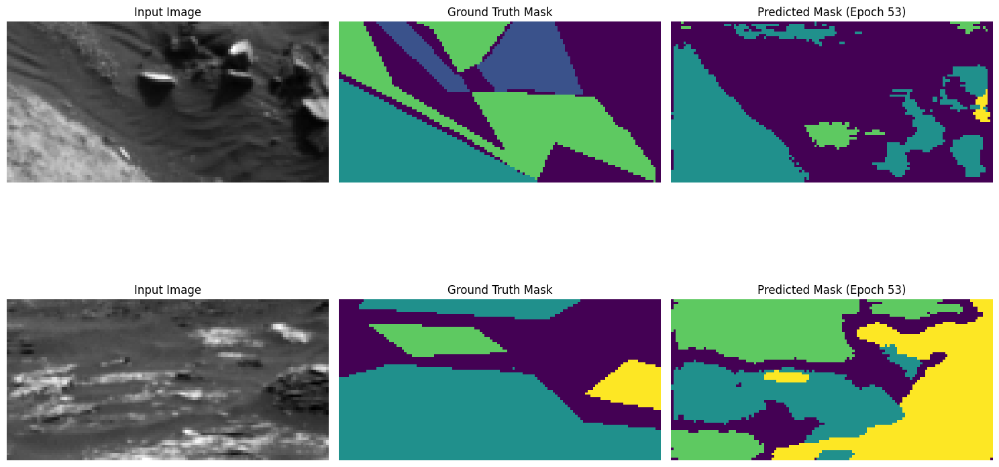

Epoch 54/250, Train Loss: 0.8714, Val Loss: 0.0299, Mean IoU: 0.4172
Class 0 IoU: 0.5805
Class 1 IoU: 0.4355
Class 2 IoU: 0.5776
Class 3 IoU: 0.0754


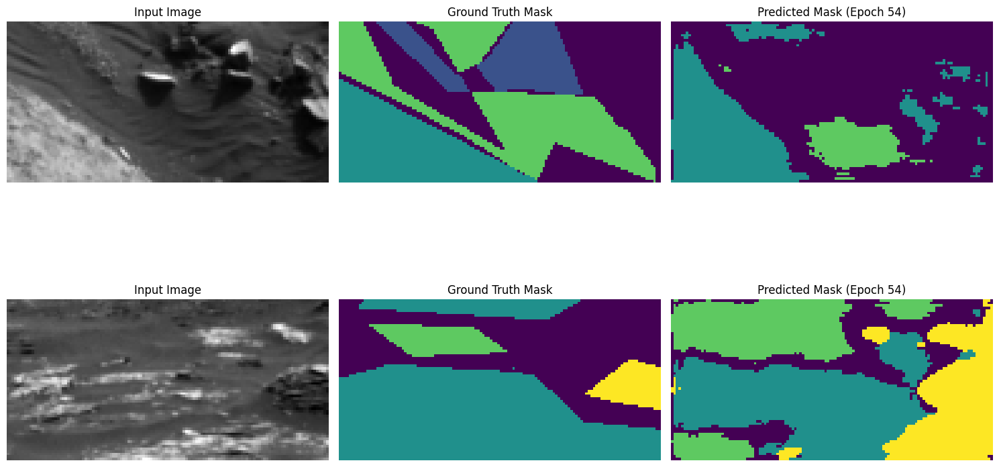

Epoch 55/250, Train Loss: 0.9260, Val Loss: 0.0259, Mean IoU: 0.4116
Class 0 IoU: 0.5931
Class 1 IoU: 0.4219
Class 2 IoU: 0.5957
Class 3 IoU: 0.0356


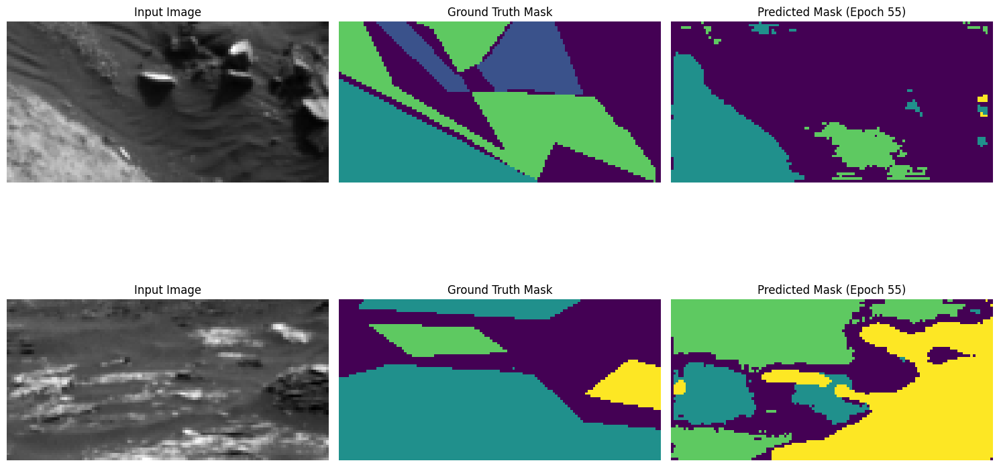

Epoch 56/250, Train Loss: 0.8923, Val Loss: 0.0357, Mean IoU: 0.3894
Class 0 IoU: 0.5571
Class 1 IoU: 0.4135
Class 2 IoU: 0.5598
Class 3 IoU: 0.0273


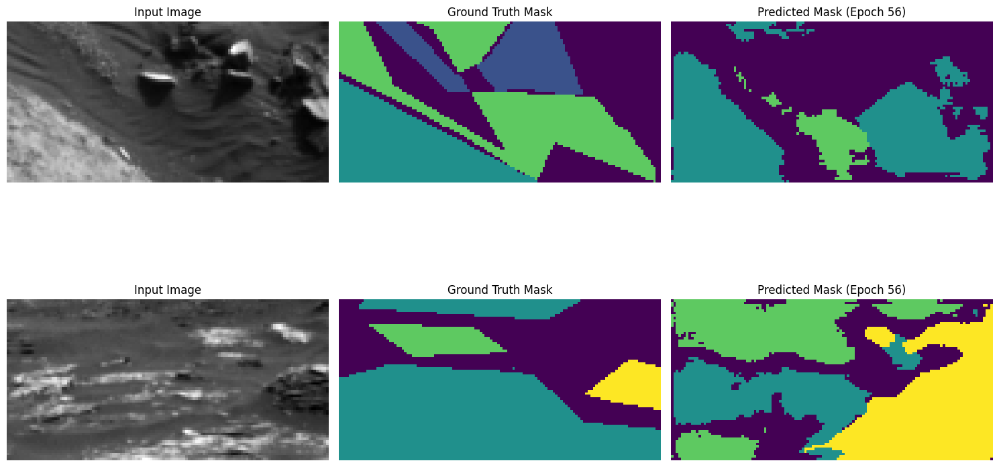

Epoch 57/250, Train Loss: 0.8429, Val Loss: 0.0392, Mean IoU: 0.4180
Class 0 IoU: 0.6125
Class 1 IoU: 0.4233
Class 2 IoU: 0.5979
Class 3 IoU: 0.0384


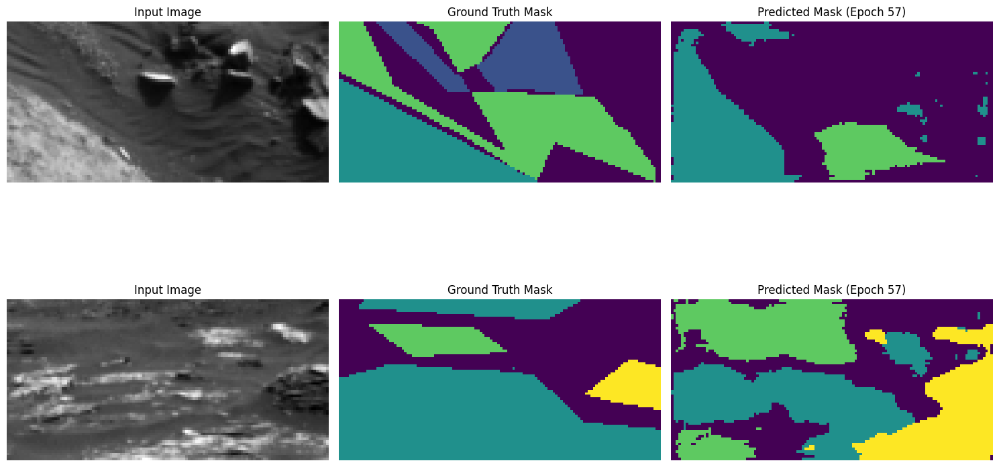

Epoch 58/250, Train Loss: 0.8896, Val Loss: 0.0262, Mean IoU: 0.4086
Class 0 IoU: 0.5859
Class 1 IoU: 0.4221
Class 2 IoU: 0.5938
Class 3 IoU: 0.0326


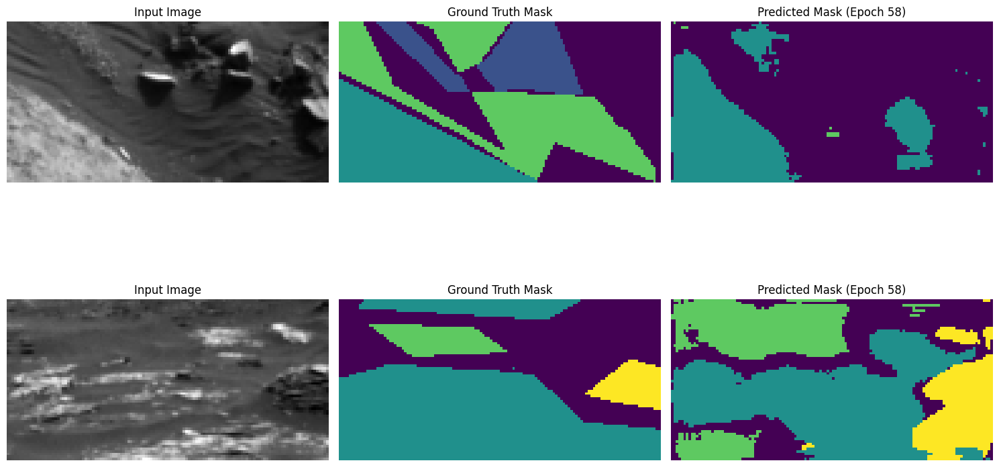

Epoch 59/250, Train Loss: 0.8056, Val Loss: 0.0320, Mean IoU: 0.4154
Class 0 IoU: 0.5907
Class 1 IoU: 0.4399
Class 2 IoU: 0.5724
Class 3 IoU: 0.0585


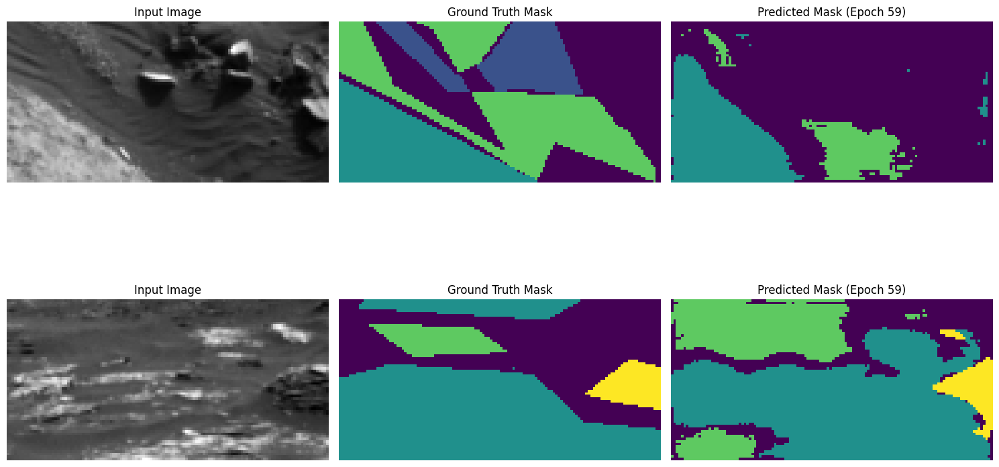

Epoch 60/250, Train Loss: 0.8191, Val Loss: 0.0340, Mean IoU: 0.4225
Class 0 IoU: 0.6084
Class 1 IoU: 0.4436
Class 2 IoU: 0.5703
Class 3 IoU: 0.0679


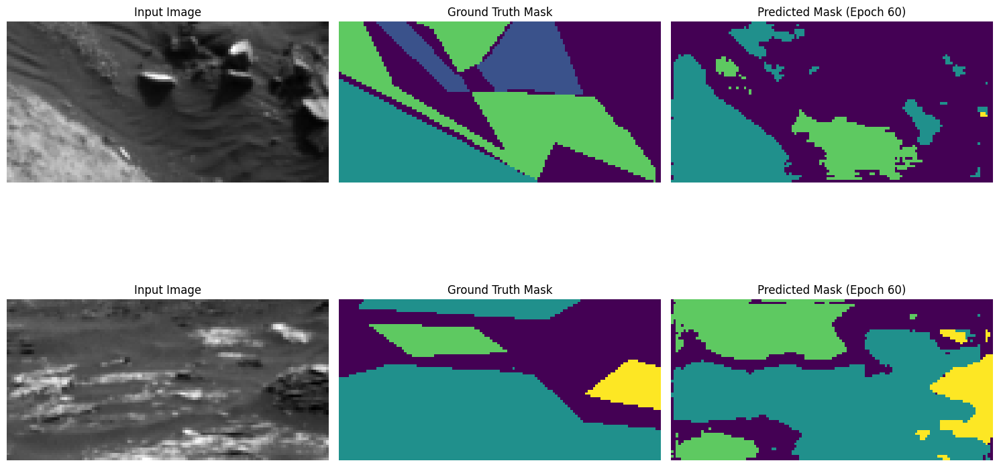

Epoch 61/250, Train Loss: 0.7863, Val Loss: 0.0353, Mean IoU: 0.4288
Class 0 IoU: 0.6128
Class 1 IoU: 0.4525
Class 2 IoU: 0.5751
Class 3 IoU: 0.0748


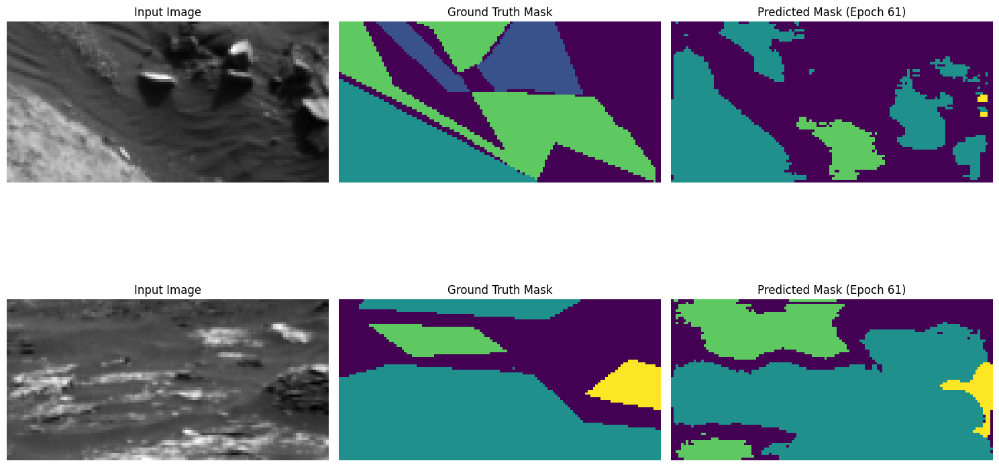

Model saved with new best Mean IoU: 0.4288
Epoch 62/250, Train Loss: 0.7725, Val Loss: 0.0362, Mean IoU: 0.4255
Class 0 IoU: 0.6124
Class 1 IoU: 0.4429
Class 2 IoU: 0.5784
Class 3 IoU: 0.0684


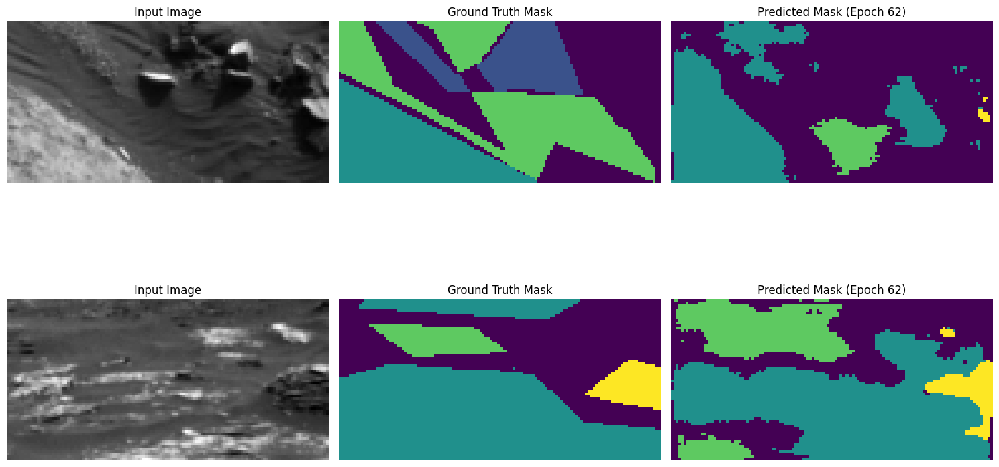

Epoch 63/250, Train Loss: 0.7774, Val Loss: 0.0427, Mean IoU: 0.4244
Class 0 IoU: 0.6269
Class 1 IoU: 0.4550
Class 2 IoU: 0.5643
Class 3 IoU: 0.0513


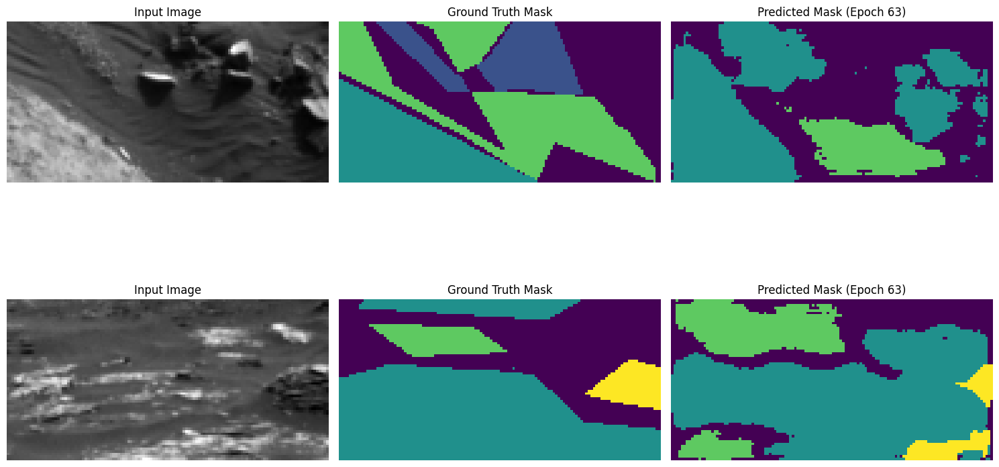

Epoch 64/250, Train Loss: 0.7960, Val Loss: 0.0359, Mean IoU: 0.4147
Class 0 IoU: 0.5915
Class 1 IoU: 0.4229
Class 2 IoU: 0.5926
Class 3 IoU: 0.0519


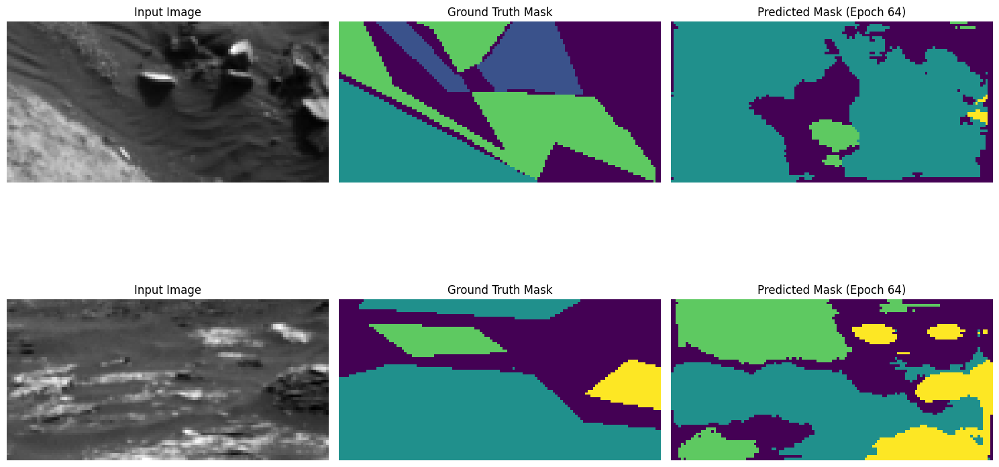

Epoch 65/250, Train Loss: 0.7687, Val Loss: 0.0553, Mean IoU: 0.4166
Class 0 IoU: 0.6155
Class 1 IoU: 0.4314
Class 2 IoU: 0.6043
Class 3 IoU: 0.0153


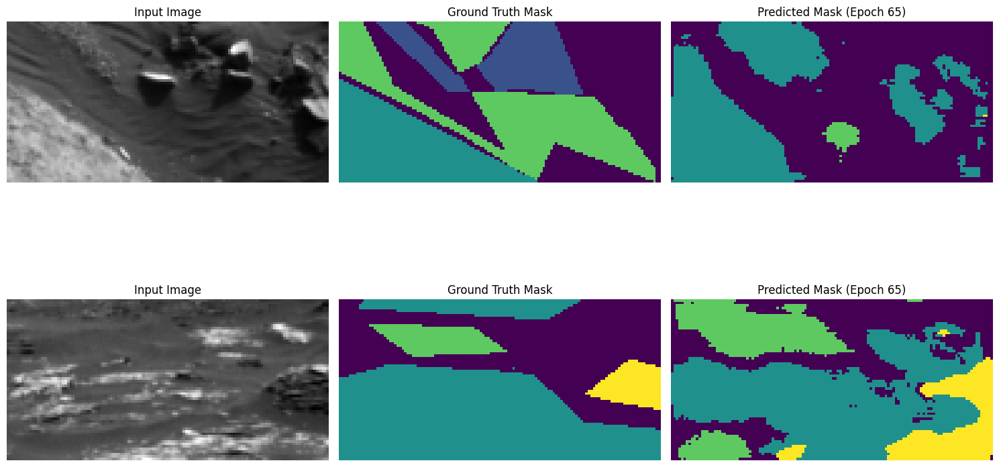

Epoch 66/250, Train Loss: 0.7566, Val Loss: 0.0490, Mean IoU: 0.4207
Class 0 IoU: 0.6206
Class 1 IoU: 0.4452
Class 2 IoU: 0.5832
Class 3 IoU: 0.0338


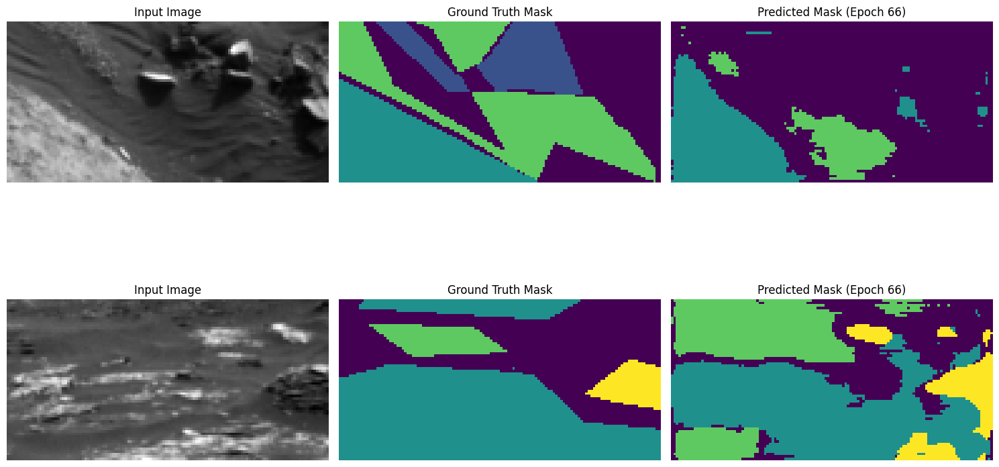

Epoch 67/250, Train Loss: 0.8857, Val Loss: 0.0219, Mean IoU: 0.4201
Class 0 IoU: 0.6069
Class 1 IoU: 0.4416
Class 2 IoU: 0.5818
Class 3 IoU: 0.0503


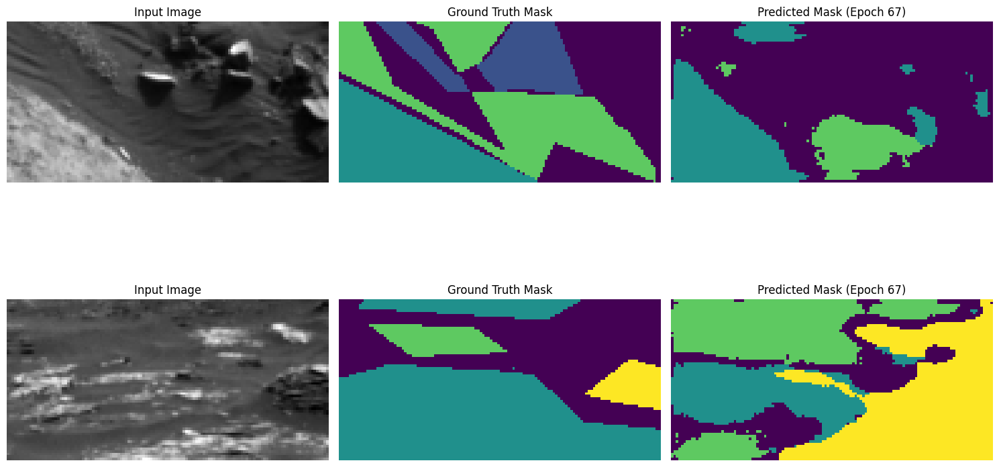

Epoch 68/250, Train Loss: 0.7949, Val Loss: 0.0237, Mean IoU: 0.4287
Class 0 IoU: 0.6242
Class 1 IoU: 0.4434
Class 2 IoU: 0.5726
Class 3 IoU: 0.0746


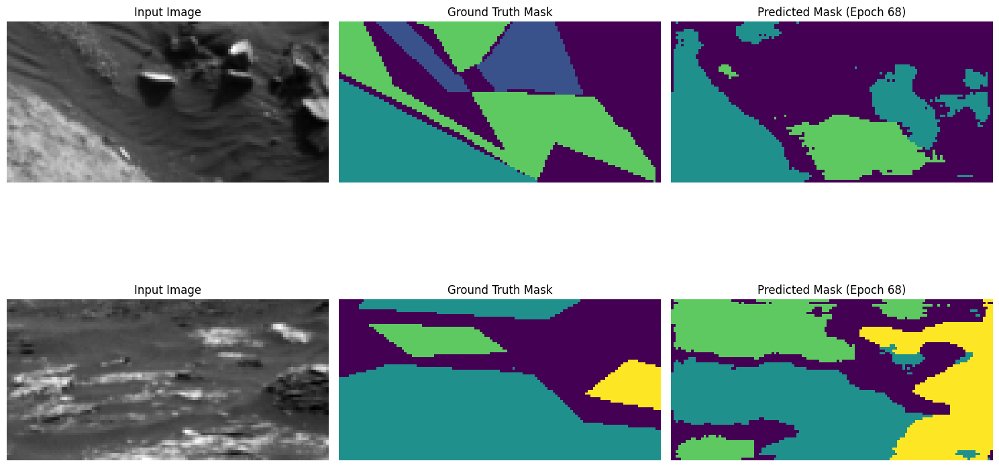

Epoch 69/250, Train Loss: 0.8302, Val Loss: 0.0235, Mean IoU: 0.3938
Class 0 IoU: 0.5741
Class 1 IoU: 0.4194
Class 2 IoU: 0.5651
Class 3 IoU: 0.0167


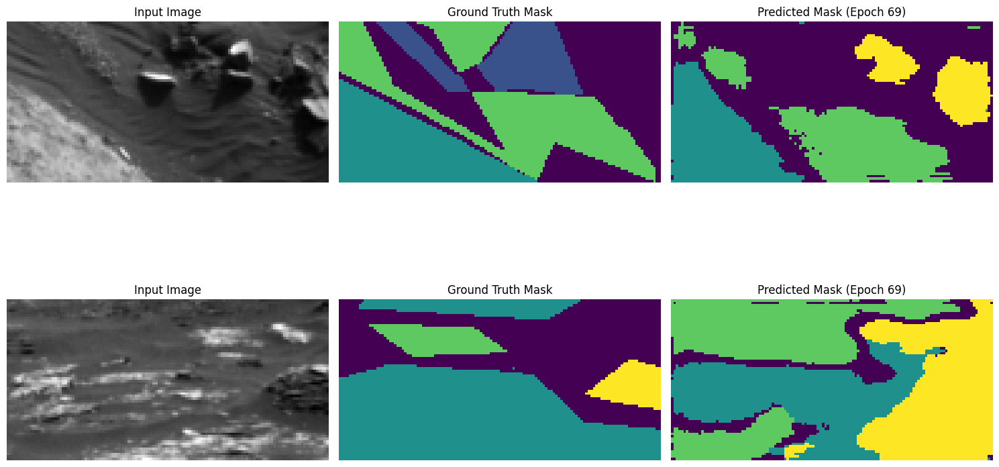

Epoch 70/250, Train Loss: 0.8198, Val Loss: 0.0251, Mean IoU: 0.4174
Class 0 IoU: 0.6097
Class 1 IoU: 0.4322
Class 2 IoU: 0.5840
Class 3 IoU: 0.0437


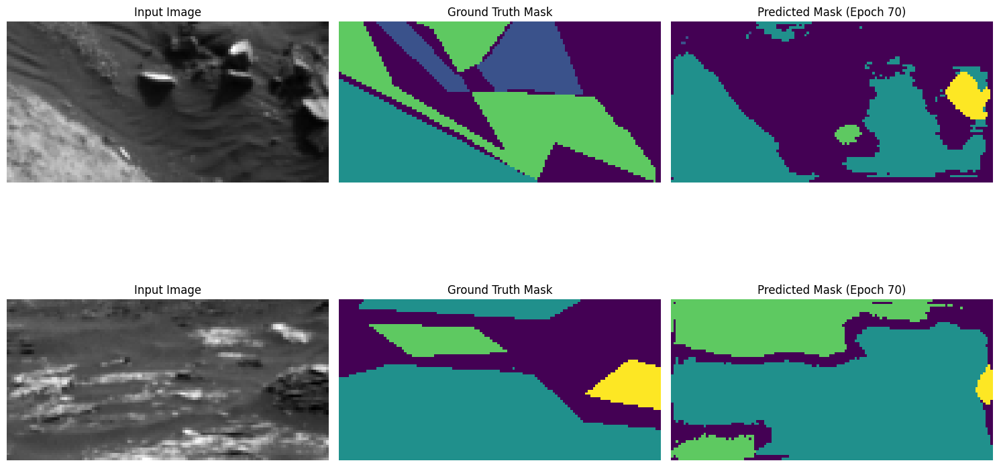

Epoch 71/250, Train Loss: 0.7734, Val Loss: 0.0248, Mean IoU: 0.4120
Class 0 IoU: 0.5824
Class 1 IoU: 0.4225
Class 2 IoU: 0.5967
Class 3 IoU: 0.0466


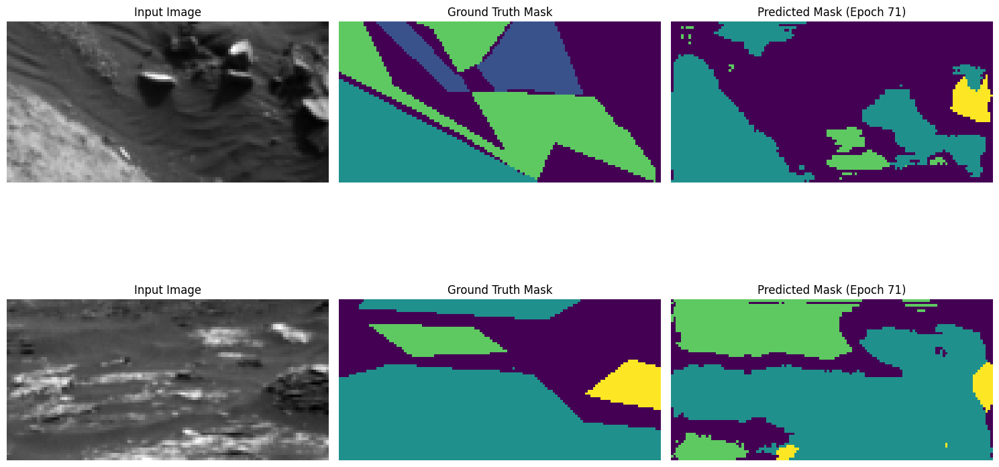

Epoch 72/250, Train Loss: 0.7338, Val Loss: 0.0339, Mean IoU: 0.4377
Class 0 IoU: 0.6242
Class 1 IoU: 0.4590
Class 2 IoU: 0.5923
Class 3 IoU: 0.0755


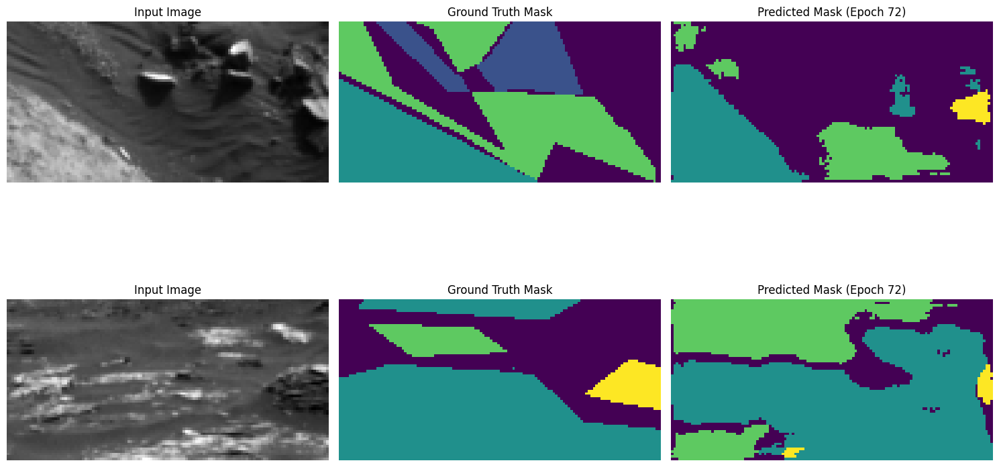

Model saved with new best Mean IoU: 0.4377
Epoch 73/250, Train Loss: 0.7071, Val Loss: 0.0335, Mean IoU: 0.4281
Class 0 IoU: 0.5996
Class 1 IoU: 0.4595
Class 2 IoU: 0.5789
Class 3 IoU: 0.0744


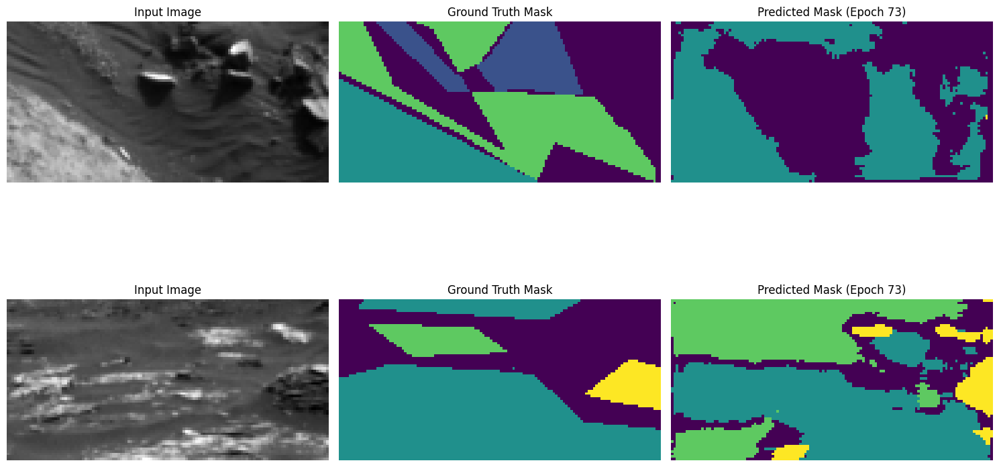

Epoch 74/250, Train Loss: 0.6939, Val Loss: 0.0337, Mean IoU: 0.4350
Class 0 IoU: 0.6055
Class 1 IoU: 0.4599
Class 2 IoU: 0.5973
Class 3 IoU: 0.0772


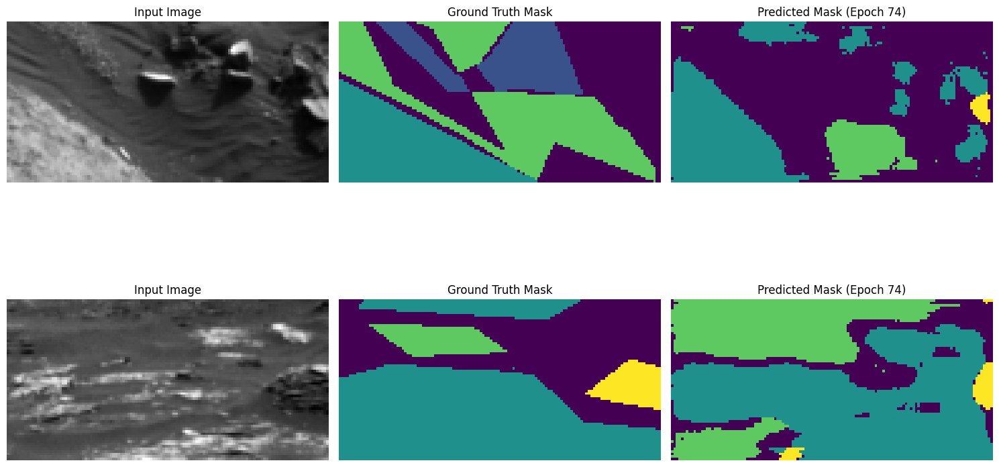

Epoch 75/250, Train Loss: 0.7201, Val Loss: 0.0279, Mean IoU: 0.4470
Class 0 IoU: 0.6352
Class 1 IoU: 0.4690
Class 2 IoU: 0.6086
Class 3 IoU: 0.0751


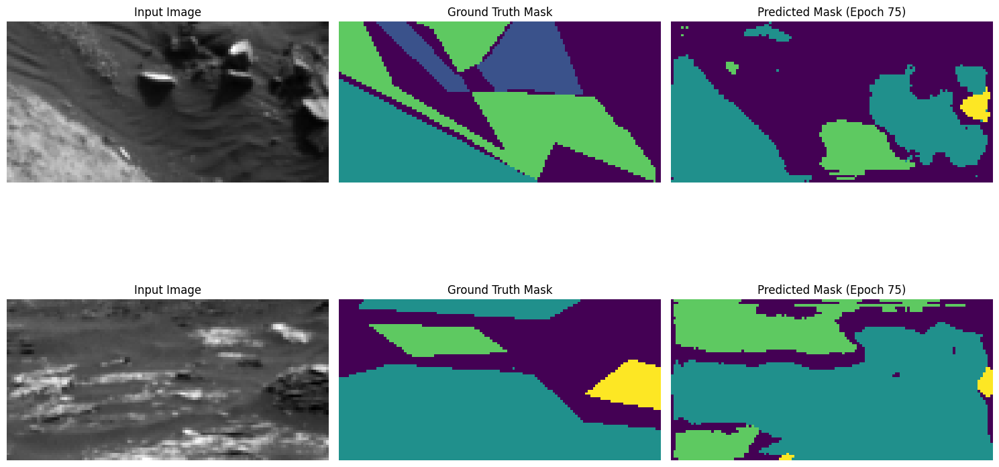

Model saved with new best Mean IoU: 0.4470
Epoch 76/250, Train Loss: 0.6953, Val Loss: 0.0350, Mean IoU: 0.4411
Class 0 IoU: 0.6248
Class 1 IoU: 0.4669
Class 2 IoU: 0.5870
Class 3 IoU: 0.0858


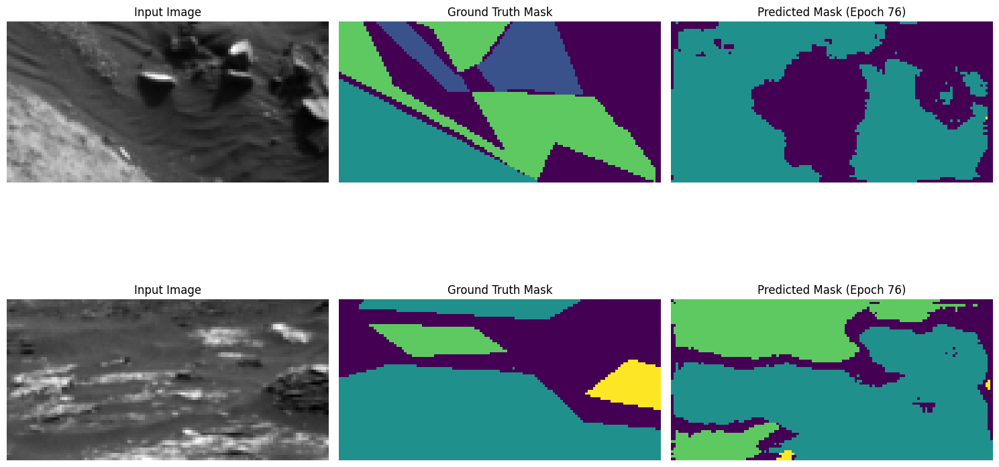

Epoch 77/250, Train Loss: 0.6777, Val Loss: 0.0384, Mean IoU: 0.4479
Class 0 IoU: 0.6256
Class 1 IoU: 0.4802
Class 2 IoU: 0.5890
Class 3 IoU: 0.0968


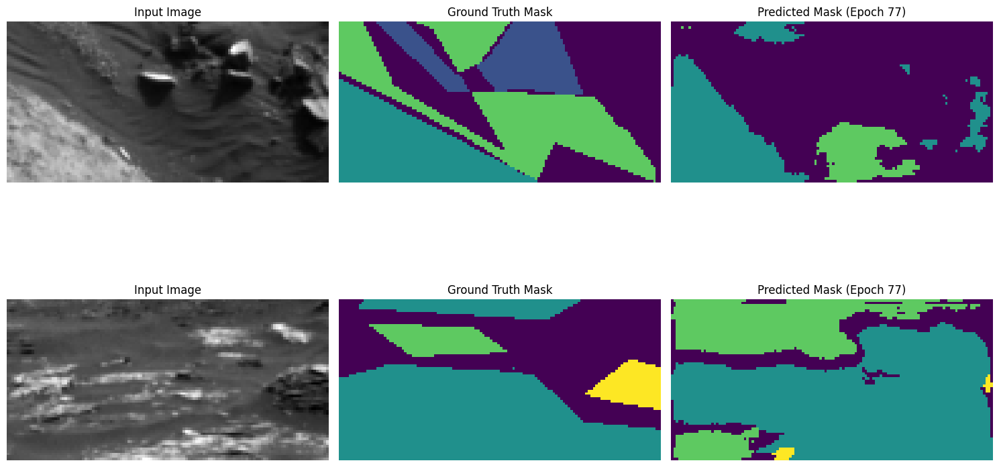

Model saved with new best Mean IoU: 0.4479
Epoch 78/250, Train Loss: 0.6953, Val Loss: 0.0412, Mean IoU: 0.4284
Class 0 IoU: 0.6292
Class 1 IoU: 0.4584
Class 2 IoU: 0.5733
Class 3 IoU: 0.0529


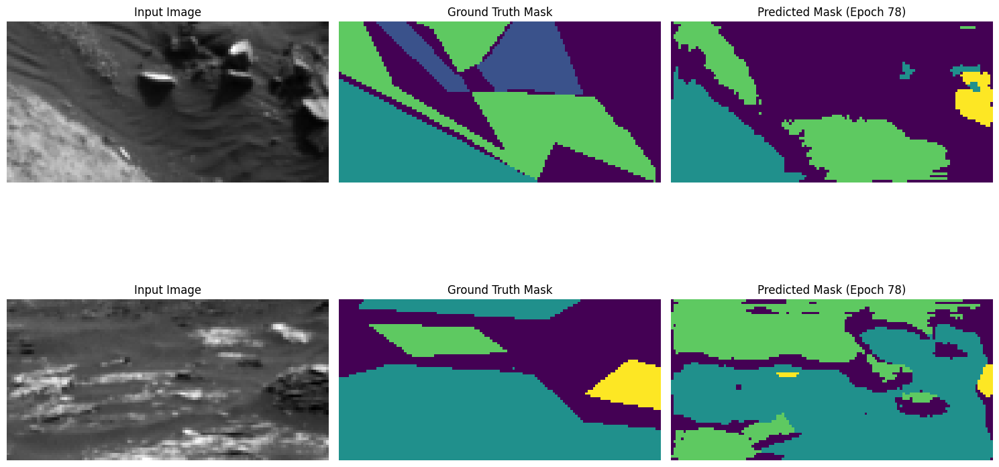

Epoch 79/250, Train Loss: 0.6623, Val Loss: 0.0372, Mean IoU: 0.4297
Class 0 IoU: 0.6013
Class 1 IoU: 0.4477
Class 2 IoU: 0.5997
Class 3 IoU: 0.0702


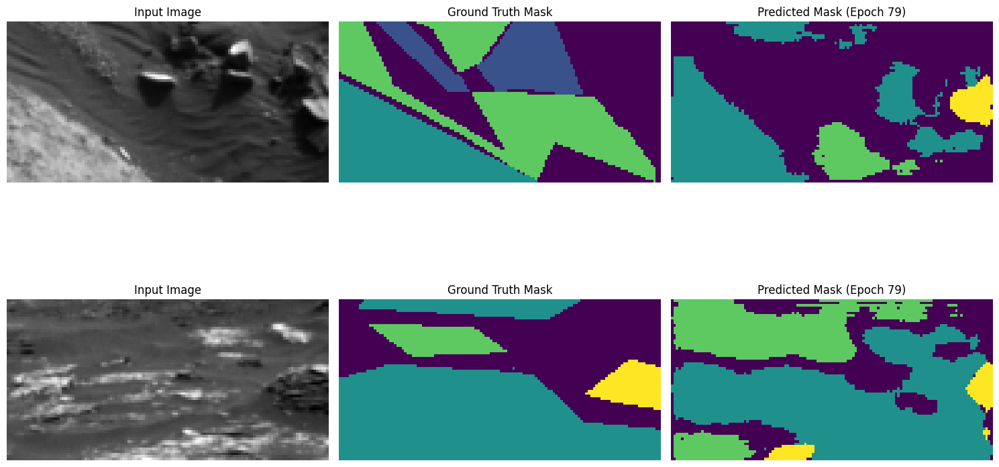

Epoch 80/250, Train Loss: 0.6441, Val Loss: 0.0505, Mean IoU: 0.4400
Class 0 IoU: 0.6181
Class 1 IoU: 0.4625
Class 2 IoU: 0.5993
Class 3 IoU: 0.0802


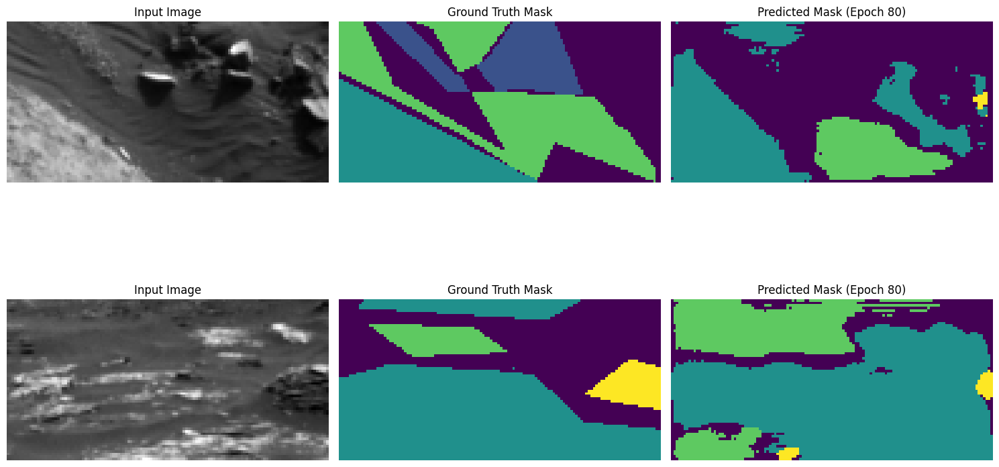

Epoch 81/250, Train Loss: 0.6507, Val Loss: 0.0411, Mean IoU: 0.4434
Class 0 IoU: 0.6428
Class 1 IoU: 0.4752
Class 2 IoU: 0.6007
Class 3 IoU: 0.0549


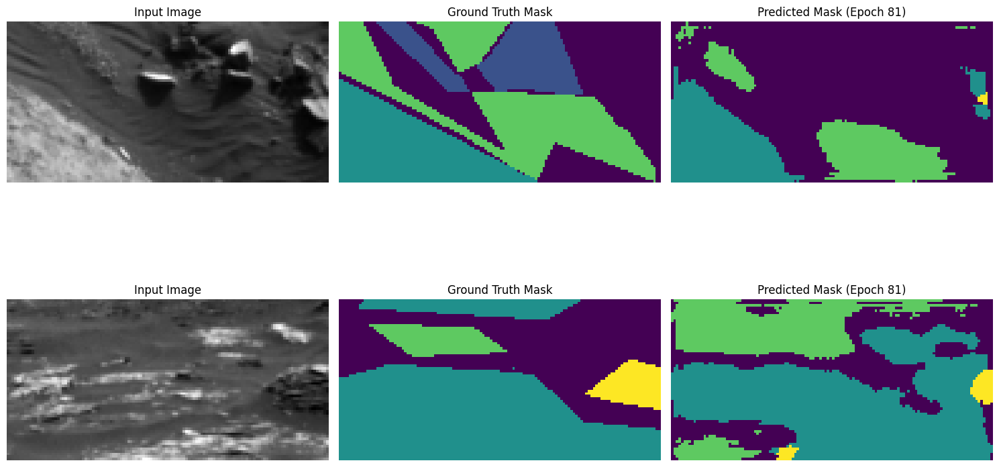

Epoch 82/250, Train Loss: 0.8120, Val Loss: 0.0285, Mean IoU: 0.4285
Class 0 IoU: 0.6056
Class 1 IoU: 0.4606
Class 2 IoU: 0.5884
Class 3 IoU: 0.0593


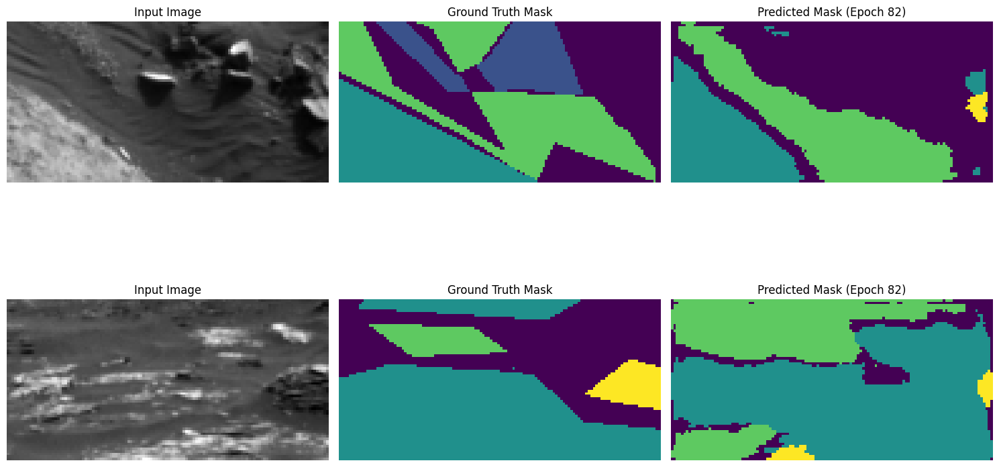

Epoch 83/250, Train Loss: 0.6609, Val Loss: 0.0436, Mean IoU: 0.4506
Class 0 IoU: 0.6555
Class 1 IoU: 0.4977
Class 2 IoU: 0.5999
Class 3 IoU: 0.0492


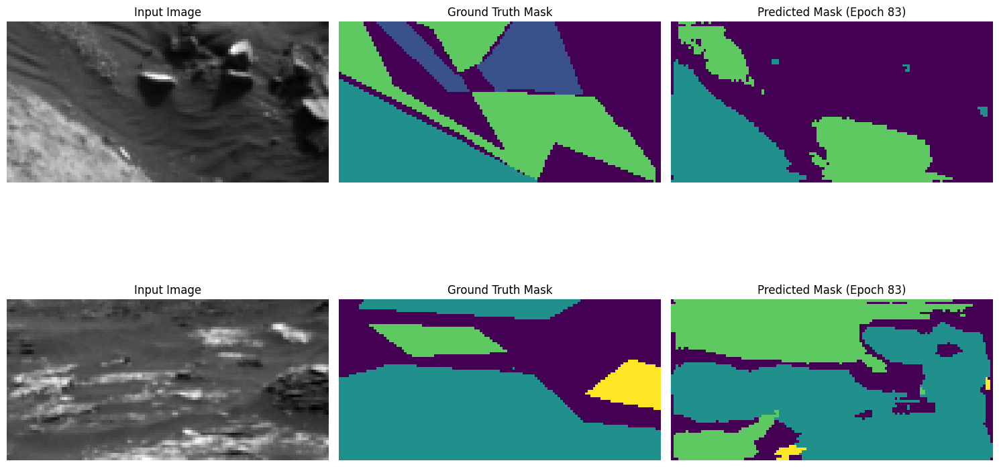

Model saved with new best Mean IoU: 0.4506
Epoch 84/250, Train Loss: 0.6318, Val Loss: 0.0343, Mean IoU: 0.4370
Class 0 IoU: 0.6321
Class 1 IoU: 0.4757
Class 2 IoU: 0.5950
Class 3 IoU: 0.0452


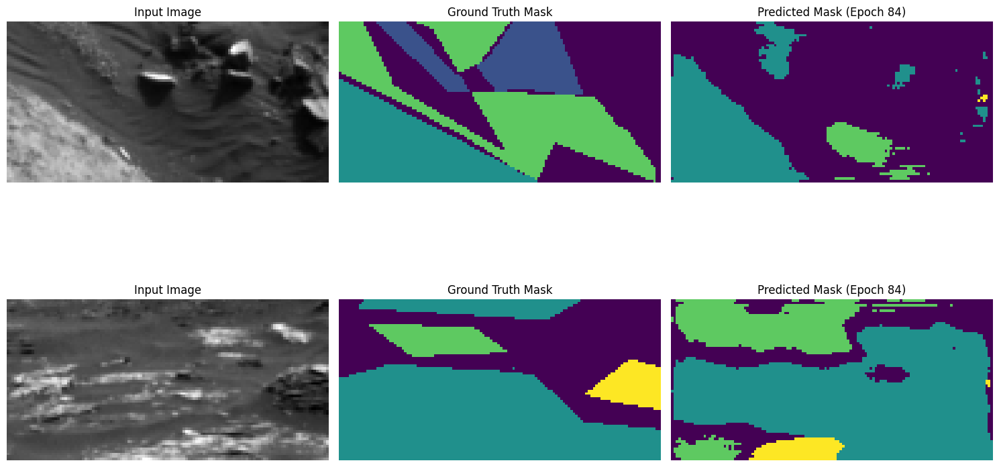

Epoch 85/250, Train Loss: 0.6704, Val Loss: 0.0364, Mean IoU: 0.4498
Class 0 IoU: 0.6541
Class 1 IoU: 0.4806
Class 2 IoU: 0.6025
Class 3 IoU: 0.0620


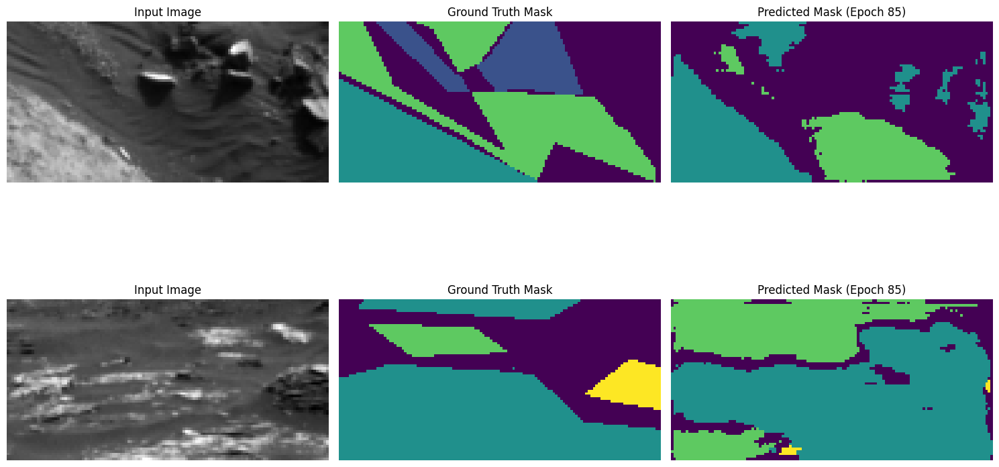

Epoch 86/250, Train Loss: 0.6201, Val Loss: 0.0470, Mean IoU: 0.4387
Class 0 IoU: 0.6492
Class 1 IoU: 0.4794
Class 2 IoU: 0.5875
Class 3 IoU: 0.0386


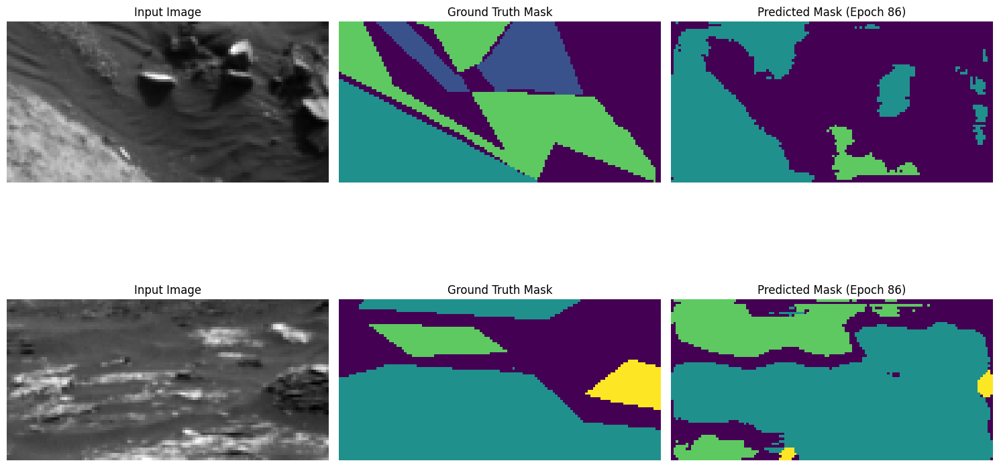

Epoch 87/250, Train Loss: 0.6539, Val Loss: 0.0453, Mean IoU: 0.4320
Class 0 IoU: 0.6257
Class 1 IoU: 0.4808
Class 2 IoU: 0.5714
Class 3 IoU: 0.0499


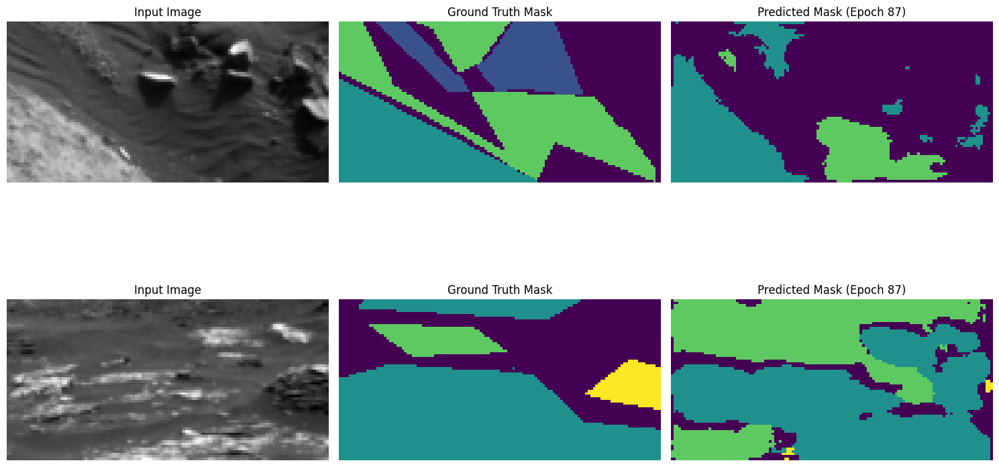

Epoch 88/250, Train Loss: 0.5869, Val Loss: 0.0551, Mean IoU: 0.4275
Class 0 IoU: 0.6227
Class 1 IoU: 0.4710
Class 2 IoU: 0.5893
Class 3 IoU: 0.0272


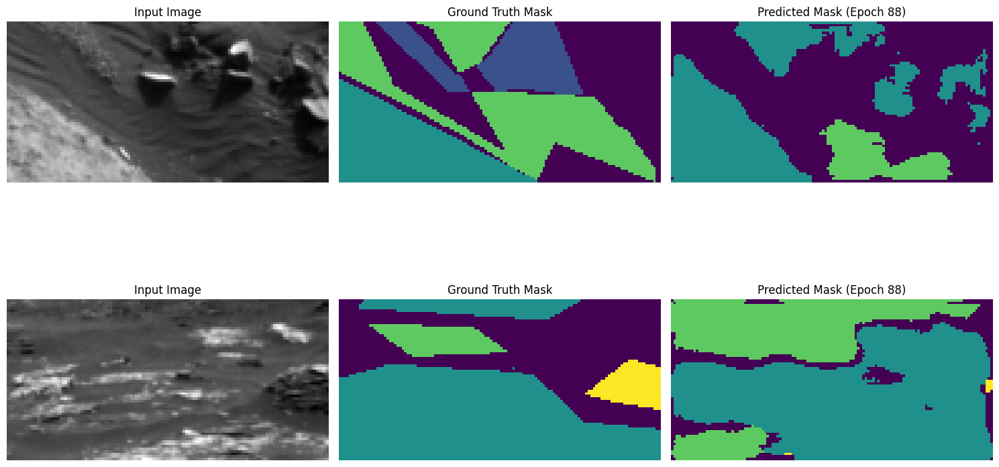

Epoch 89/250, Train Loss: 0.5857, Val Loss: 0.0573, Mean IoU: 0.4480
Class 0 IoU: 0.6460
Class 1 IoU: 0.4948
Class 2 IoU: 0.5982
Class 3 IoU: 0.0529


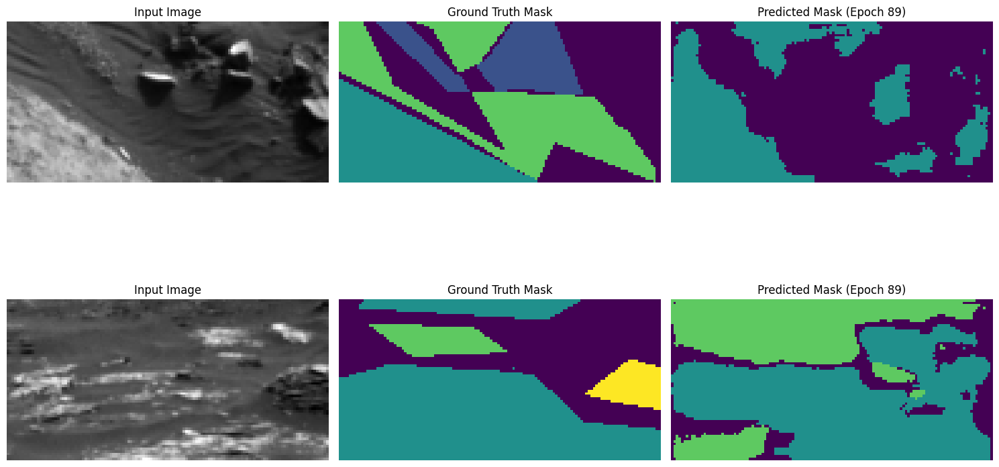

Epoch 90/250, Train Loss: 0.5716, Val Loss: 0.0608, Mean IoU: 0.4422
Class 0 IoU: 0.6247
Class 1 IoU: 0.4868
Class 2 IoU: 0.5986
Class 3 IoU: 0.0588


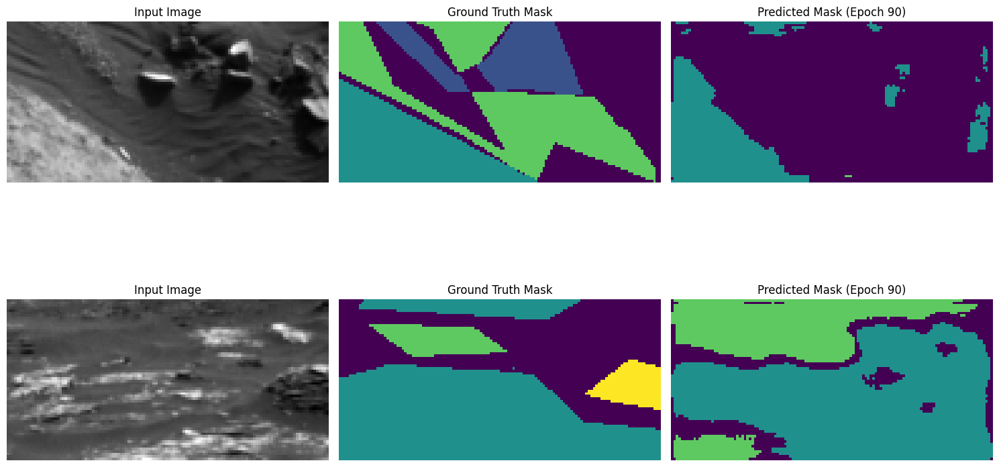

Epoch 91/250, Train Loss: 0.5818, Val Loss: 0.0353, Mean IoU: 0.4389
Class 0 IoU: 0.6225
Class 1 IoU: 0.4684
Class 2 IoU: 0.6007
Class 3 IoU: 0.0639


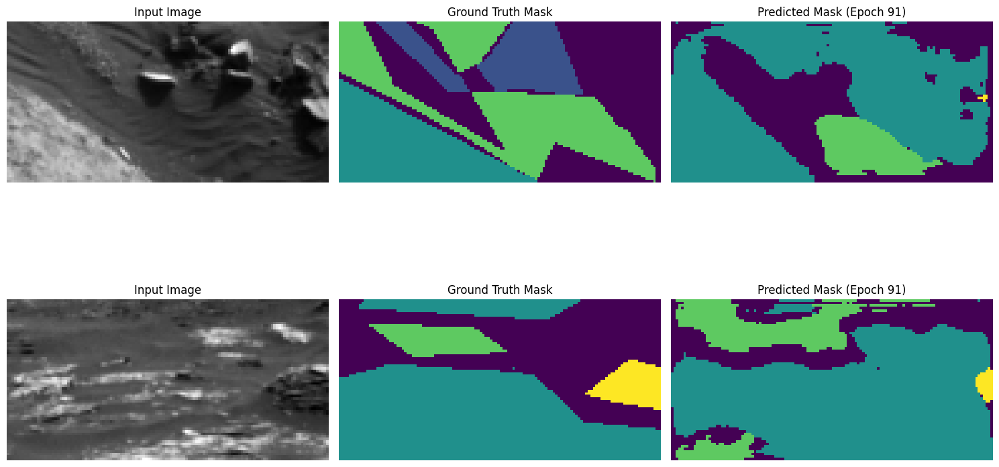

Epoch 92/250, Train Loss: 0.5810, Val Loss: 0.0406, Mean IoU: 0.4275
Class 0 IoU: 0.5922
Class 1 IoU: 0.4601
Class 2 IoU: 0.5800
Class 3 IoU: 0.0777


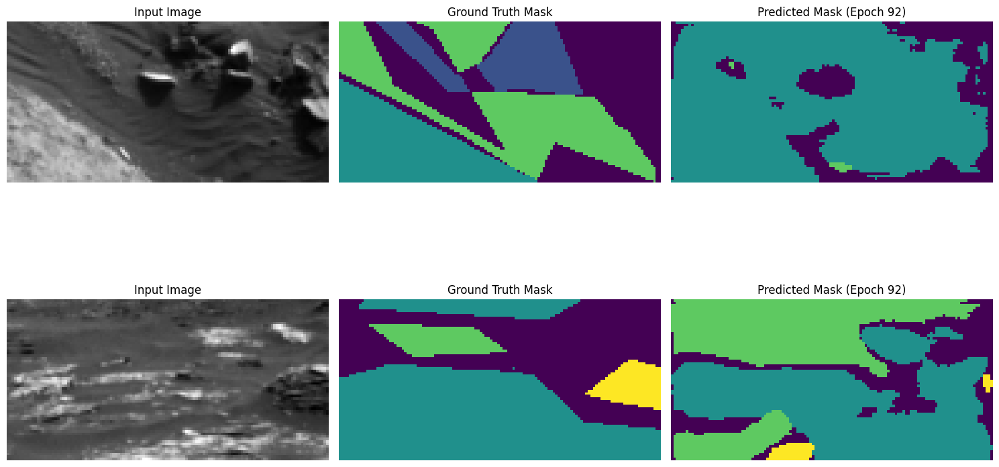

Epoch 93/250, Train Loss: 0.5448, Val Loss: 0.0425, Mean IoU: 0.4481
Class 0 IoU: 0.6260
Class 1 IoU: 0.4663
Class 2 IoU: 0.6093
Class 3 IoU: 0.0906


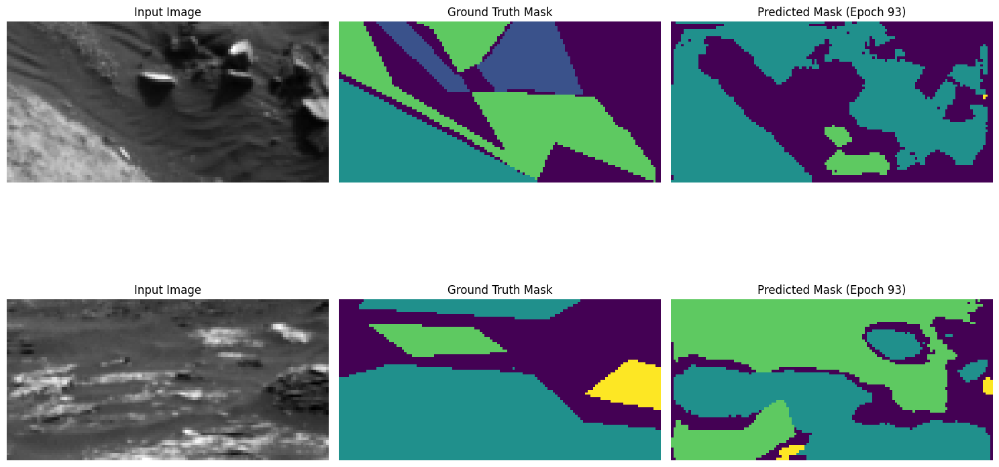

Epoch 94/250, Train Loss: 0.6305, Val Loss: 0.0363, Mean IoU: 0.4459
Class 0 IoU: 0.6428
Class 1 IoU: 0.4781
Class 2 IoU: 0.6056
Class 3 IoU: 0.0569


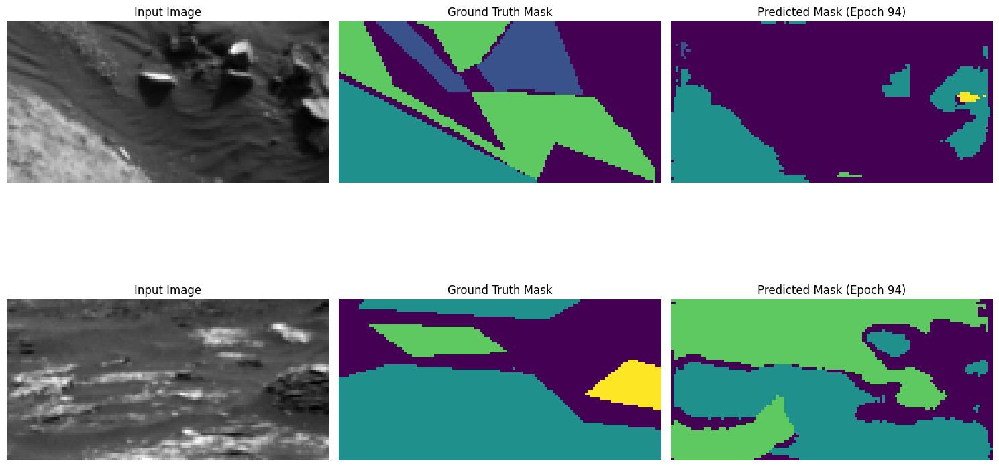

Epoch 95/250, Train Loss: 0.5813, Val Loss: 0.0507, Mean IoU: 0.4405
Class 0 IoU: 0.6466
Class 1 IoU: 0.4755
Class 2 IoU: 0.6037
Class 3 IoU: 0.0363


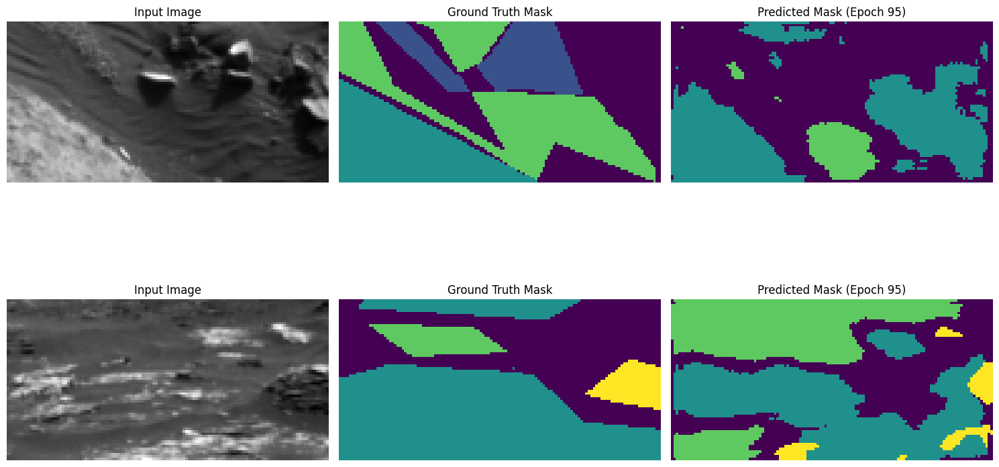

Epoch 96/250, Train Loss: 0.5591, Val Loss: 0.0505, Mean IoU: 0.4598
Class 0 IoU: 0.6469
Class 1 IoU: 0.4976
Class 2 IoU: 0.6105
Class 3 IoU: 0.0843


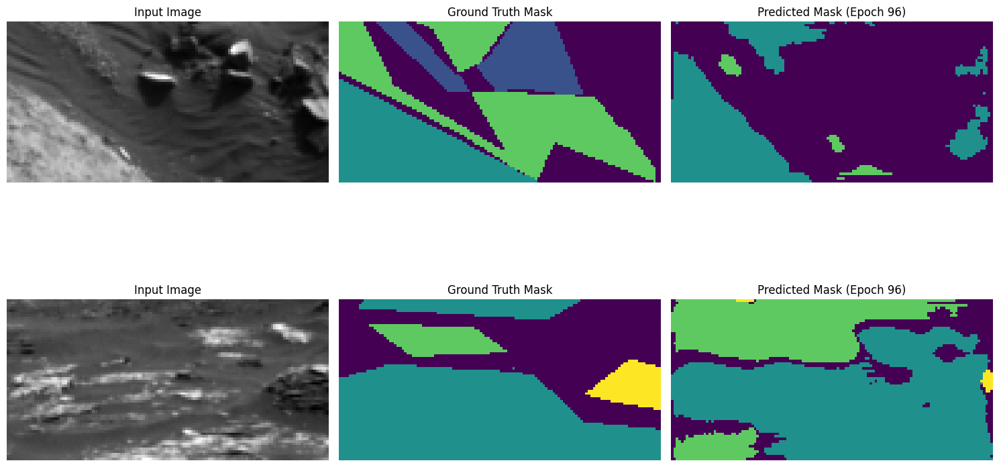

Model saved with new best Mean IoU: 0.4598
Epoch 97/250, Train Loss: 0.5550, Val Loss: 0.0409, Mean IoU: 0.4167
Class 0 IoU: 0.6086
Class 1 IoU: 0.4669
Class 2 IoU: 0.5555
Class 3 IoU: 0.0357


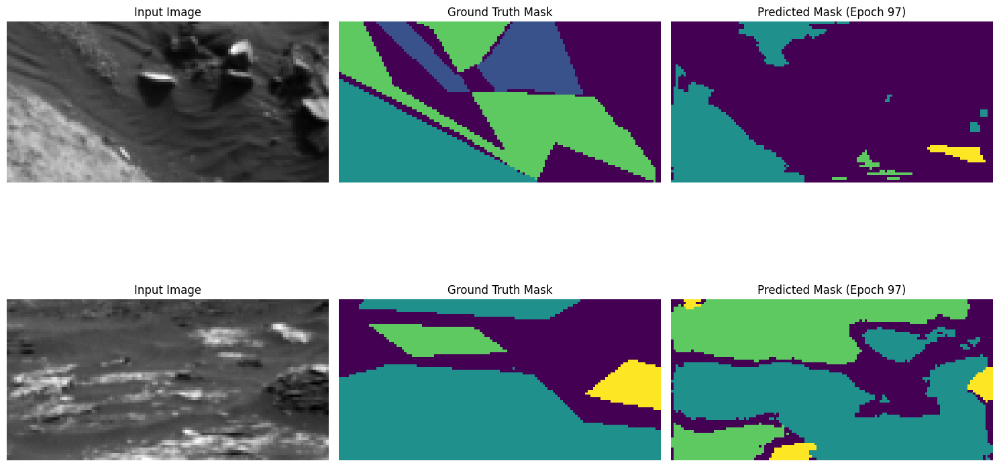

Epoch 98/250, Train Loss: 0.5992, Val Loss: 0.0484, Mean IoU: 0.4416
Class 0 IoU: 0.6477
Class 1 IoU: 0.4717
Class 2 IoU: 0.6085
Class 3 IoU: 0.0386


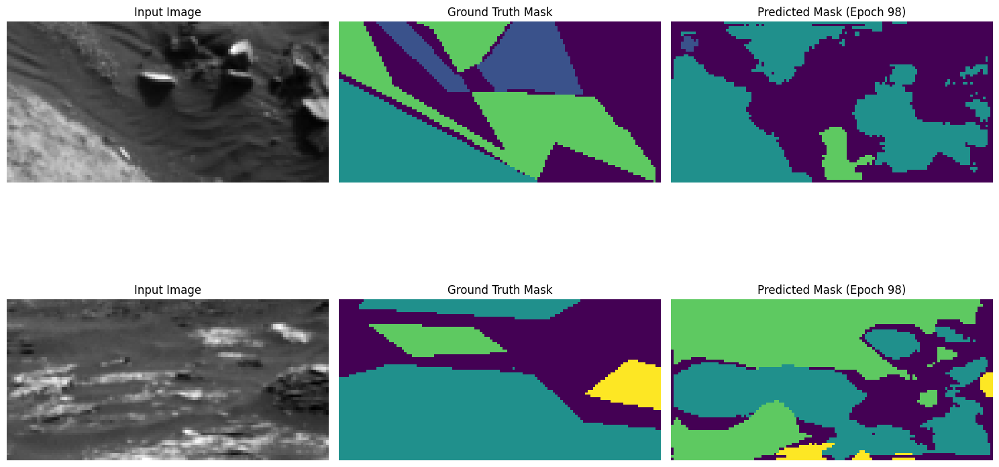

Epoch 99/250, Train Loss: 0.5643, Val Loss: 0.0586, Mean IoU: 0.4363
Class 0 IoU: 0.6397
Class 1 IoU: 0.4697
Class 2 IoU: 0.5859
Class 3 IoU: 0.0498


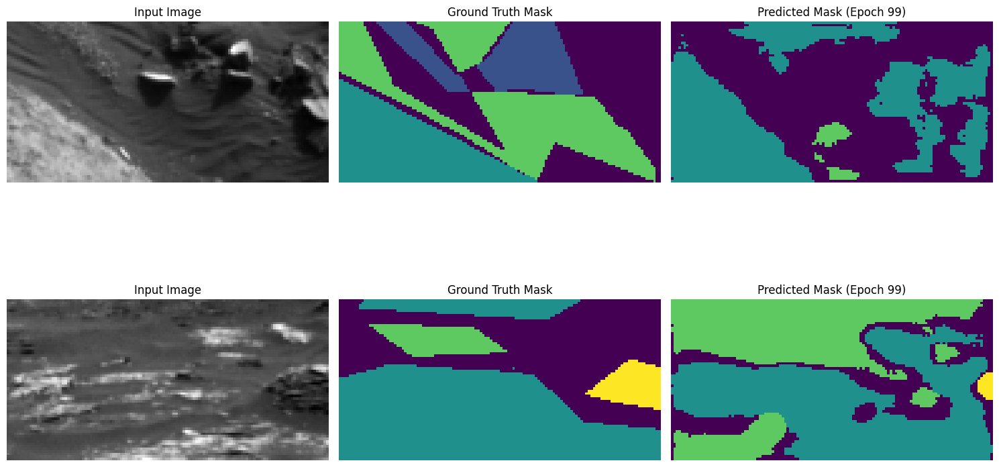

Epoch 100/250, Train Loss: 0.5228, Val Loss: 0.0555, Mean IoU: 0.4377
Class 0 IoU: 0.6163
Class 1 IoU: 0.4592
Class 2 IoU: 0.6105
Class 3 IoU: 0.0648


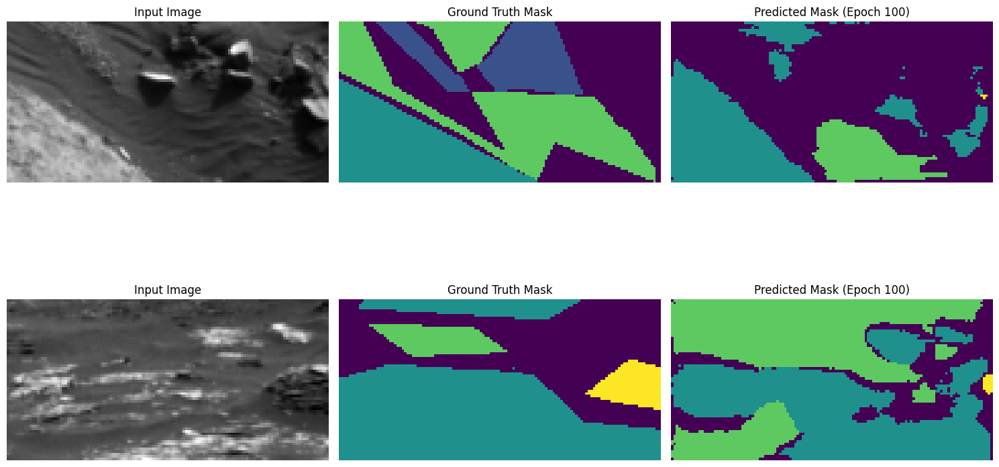

Epoch 101/250, Train Loss: 0.5311, Val Loss: 0.0631, Mean IoU: 0.4250
Class 0 IoU: 0.5911
Class 1 IoU: 0.4598
Class 2 IoU: 0.5824
Class 3 IoU: 0.0666


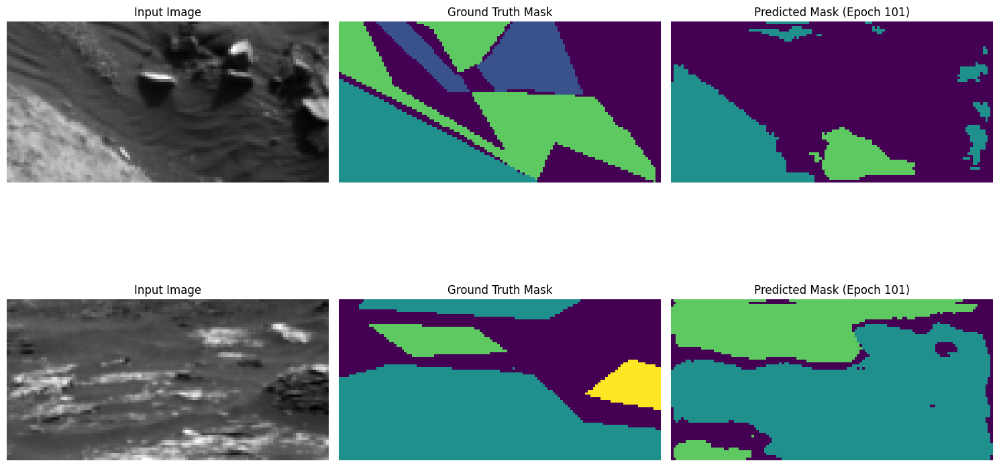

Epoch 102/250, Train Loss: 0.4936, Val Loss: 0.0648, Mean IoU: 0.4418
Class 0 IoU: 0.6301
Class 1 IoU: 0.4534
Class 2 IoU: 0.6257
Class 3 IoU: 0.0580


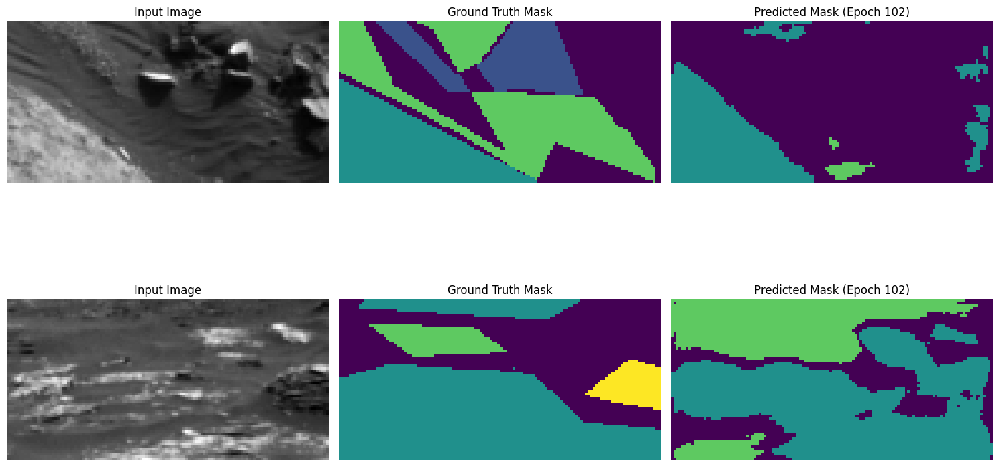

Epoch 103/250, Train Loss: 0.4941, Val Loss: 0.0565, Mean IoU: 0.4410
Class 0 IoU: 0.6103
Class 1 IoU: 0.4542
Class 2 IoU: 0.6141
Class 3 IoU: 0.0853


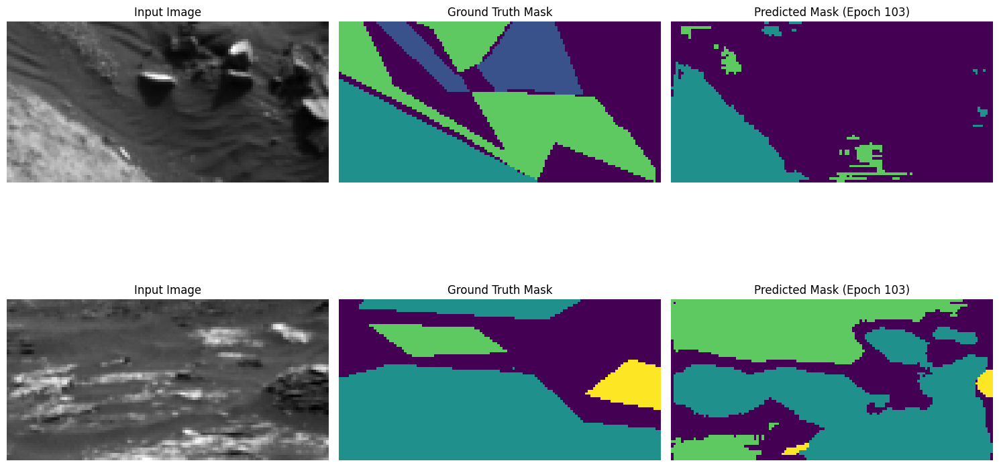

Epoch 104/250, Train Loss: 0.4985, Val Loss: 0.0555, Mean IoU: 0.4609
Class 0 IoU: 0.6516
Class 1 IoU: 0.4736
Class 2 IoU: 0.6082
Class 3 IoU: 0.1101


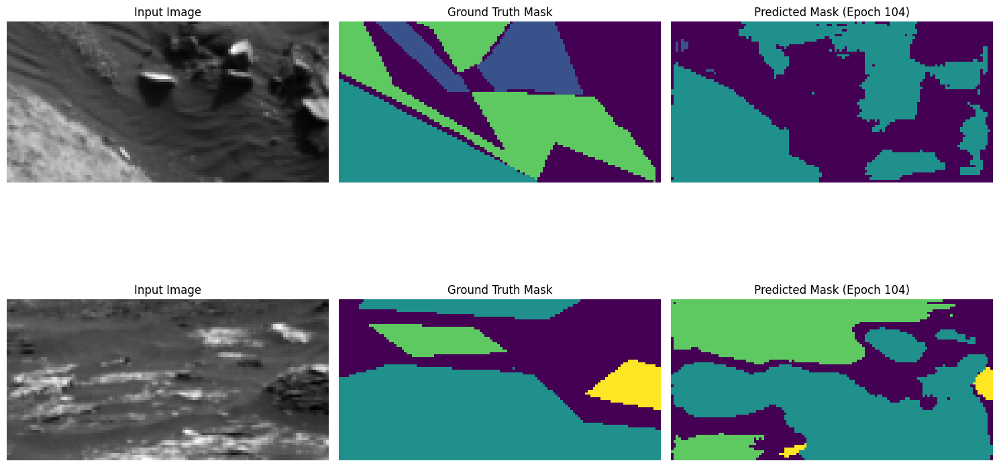

Model saved with new best Mean IoU: 0.4609
Epoch 105/250, Train Loss: 0.4921, Val Loss: 0.0471, Mean IoU: 0.4309
Class 0 IoU: 0.6204
Class 1 IoU: 0.4516
Class 2 IoU: 0.6095
Class 3 IoU: 0.0422


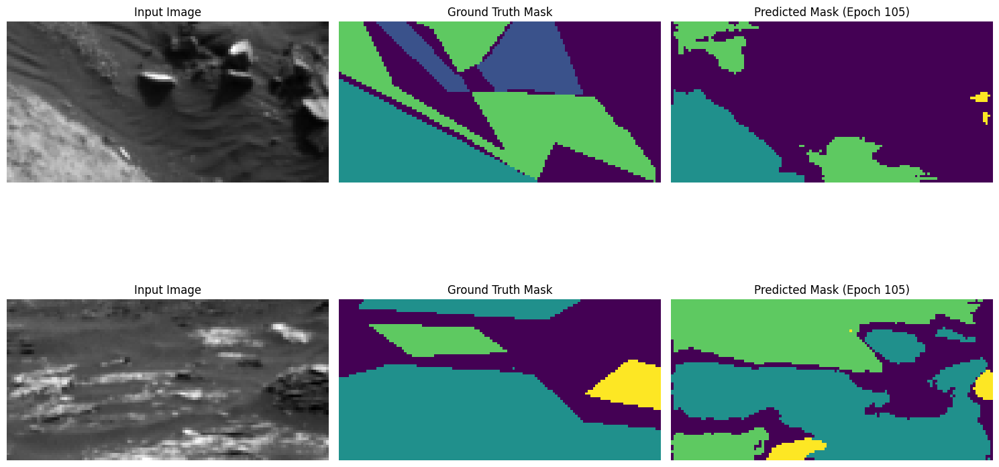

Epoch 106/250, Train Loss: 0.4776, Val Loss: 0.0636, Mean IoU: 0.4446
Class 0 IoU: 0.6231
Class 1 IoU: 0.4619
Class 2 IoU: 0.6119
Class 3 IoU: 0.0814


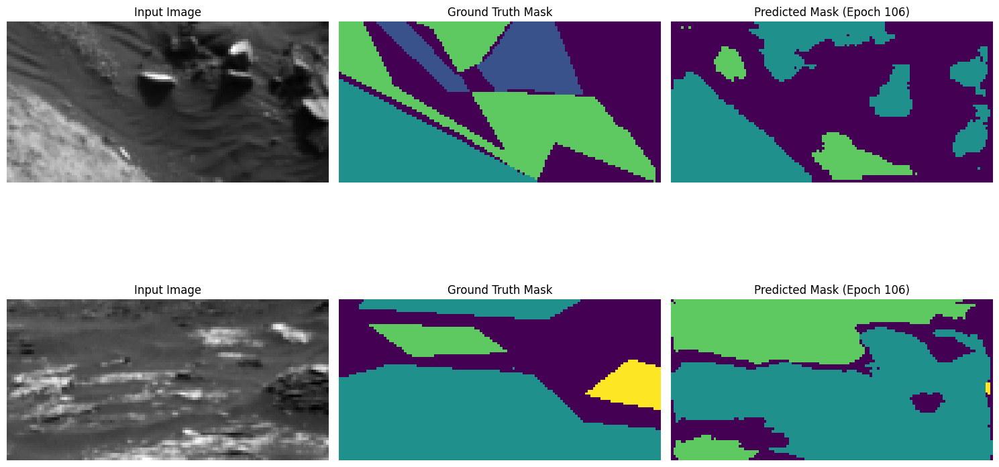

Epoch 107/250, Train Loss: 0.4700, Val Loss: 0.0599, Mean IoU: 0.4226
Class 0 IoU: 0.6172
Class 1 IoU: 0.4515
Class 2 IoU: 0.5656
Class 3 IoU: 0.0561


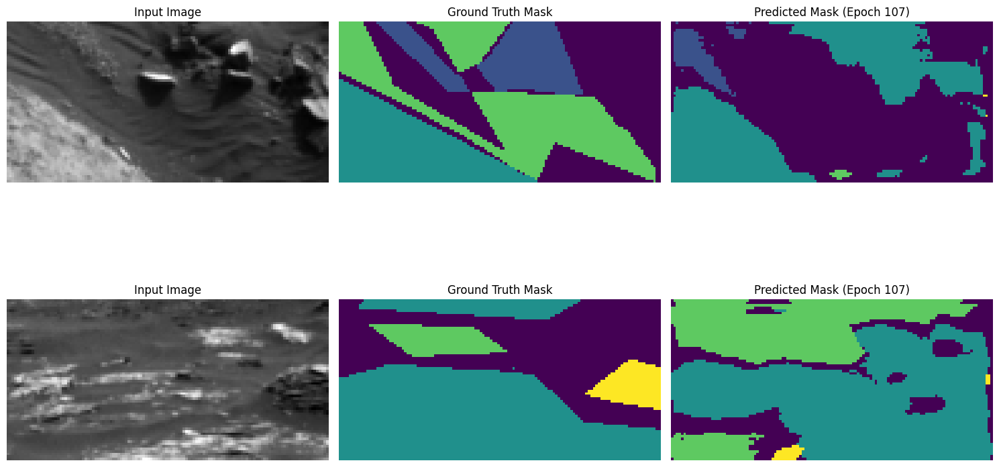

Epoch 108/250, Train Loss: 0.4839, Val Loss: 0.0588, Mean IoU: 0.4588
Class 0 IoU: 0.6493
Class 1 IoU: 0.4604
Class 2 IoU: 0.6299
Class 3 IoU: 0.0957


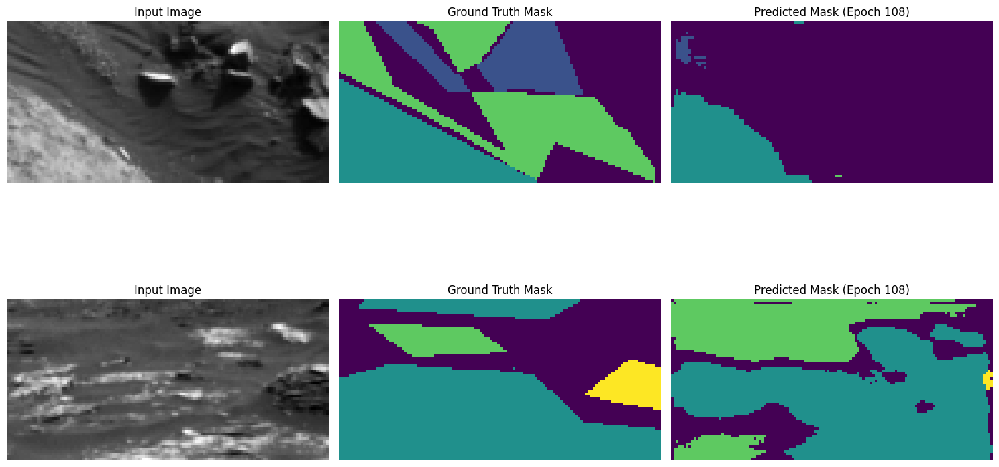

Epoch 109/250, Train Loss: 0.4732, Val Loss: 0.0521, Mean IoU: 0.4320
Class 0 IoU: 0.6404
Class 1 IoU: 0.4315
Class 2 IoU: 0.6083
Class 3 IoU: 0.0479


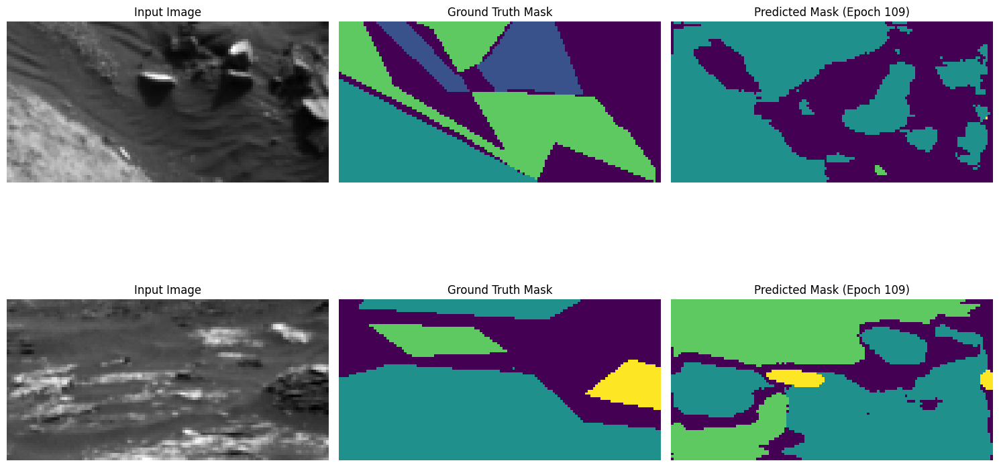

Epoch 110/250, Train Loss: 0.4661, Val Loss: 0.0565, Mean IoU: 0.4548
Class 0 IoU: 0.6546
Class 1 IoU: 0.4801
Class 2 IoU: 0.6179
Class 3 IoU: 0.0665


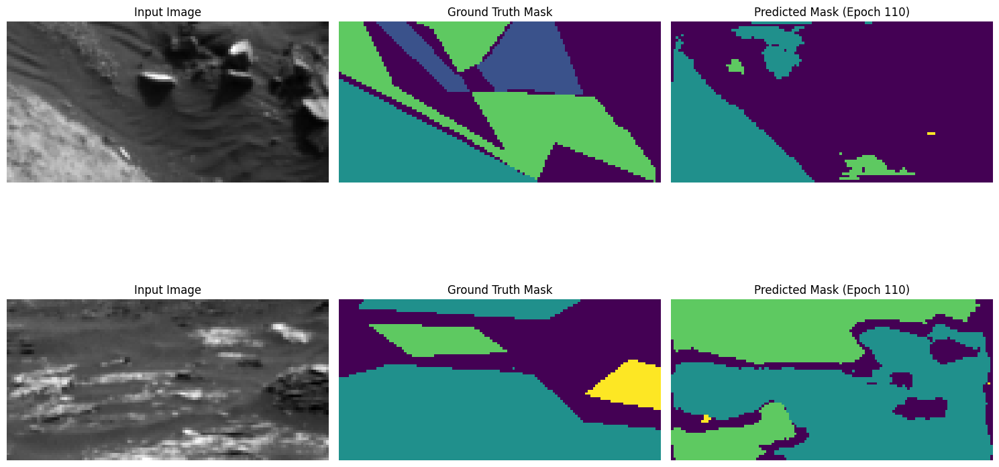

Epoch 111/250, Train Loss: 0.4574, Val Loss: 0.0618, Mean IoU: 0.4736
Class 0 IoU: 0.6525
Class 1 IoU: 0.4950
Class 2 IoU: 0.6124
Class 3 IoU: 0.1345


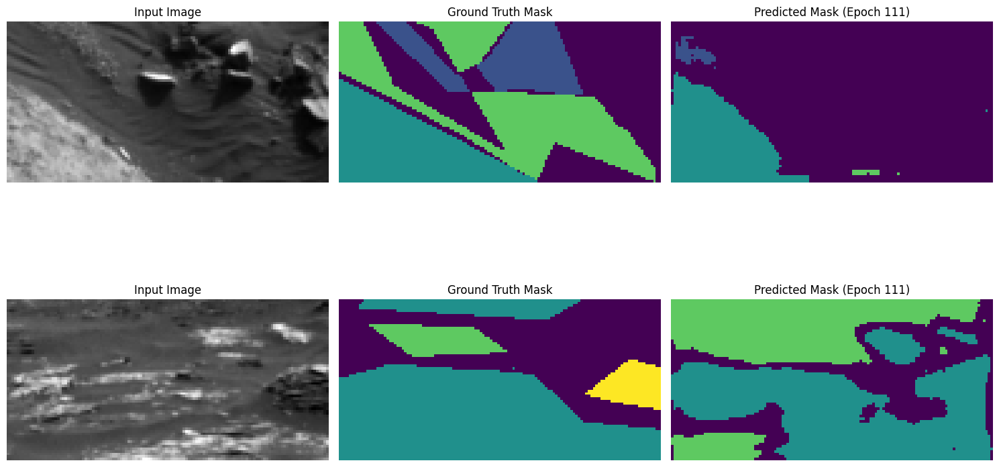

Model saved with new best Mean IoU: 0.4736
Epoch 112/250, Train Loss: 0.4451, Val Loss: 0.0592, Mean IoU: 0.4301
Class 0 IoU: 0.6045
Class 1 IoU: 0.4595
Class 2 IoU: 0.5812
Class 3 IoU: 0.0754


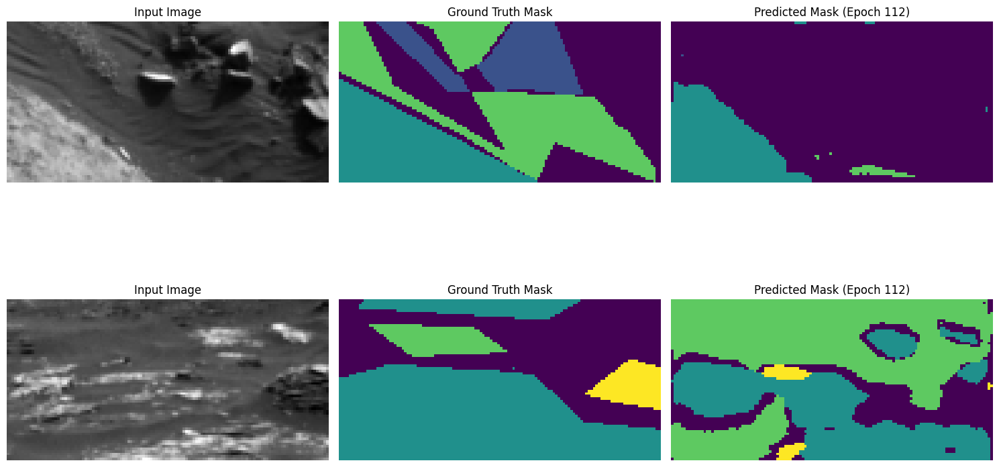

Epoch 113/250, Train Loss: 0.4430, Val Loss: 0.0597, Mean IoU: 0.4298
Class 0 IoU: 0.5969
Class 1 IoU: 0.4470
Class 2 IoU: 0.6018
Class 3 IoU: 0.0734


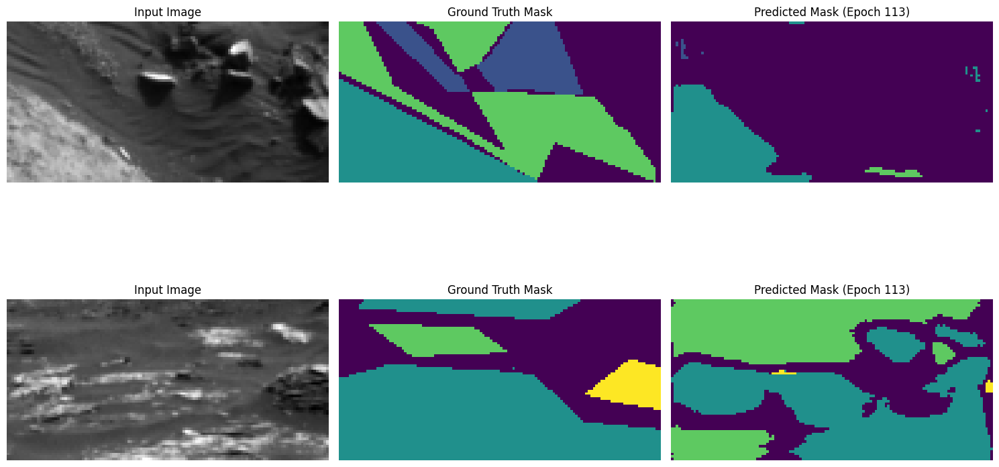

Epoch 114/250, Train Loss: 0.4251, Val Loss: 0.0607, Mean IoU: 0.4463
Class 0 IoU: 0.6354
Class 1 IoU: 0.4894
Class 2 IoU: 0.5918
Class 3 IoU: 0.0687


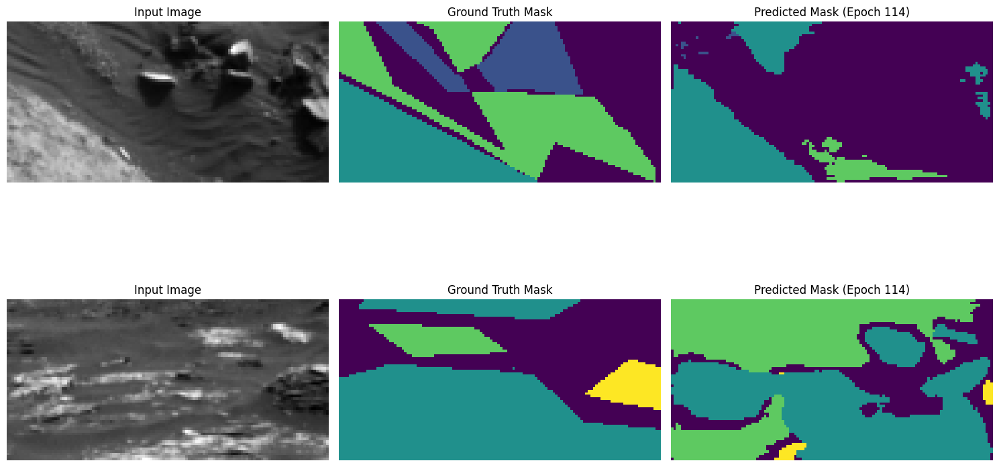

Epoch 115/250, Train Loss: 0.4281, Val Loss: 0.0560, Mean IoU: 0.4340
Class 0 IoU: 0.6016
Class 1 IoU: 0.4473
Class 2 IoU: 0.5839
Class 3 IoU: 0.1030


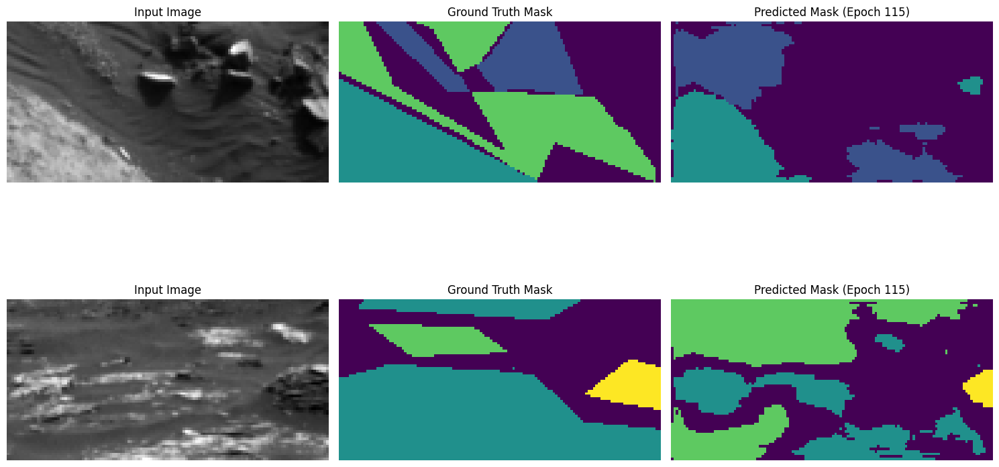

Epoch 116/250, Train Loss: 0.4228, Val Loss: 0.0648, Mean IoU: 0.4567
Class 0 IoU: 0.6341
Class 1 IoU: 0.5057
Class 2 IoU: 0.5805
Class 3 IoU: 0.1067


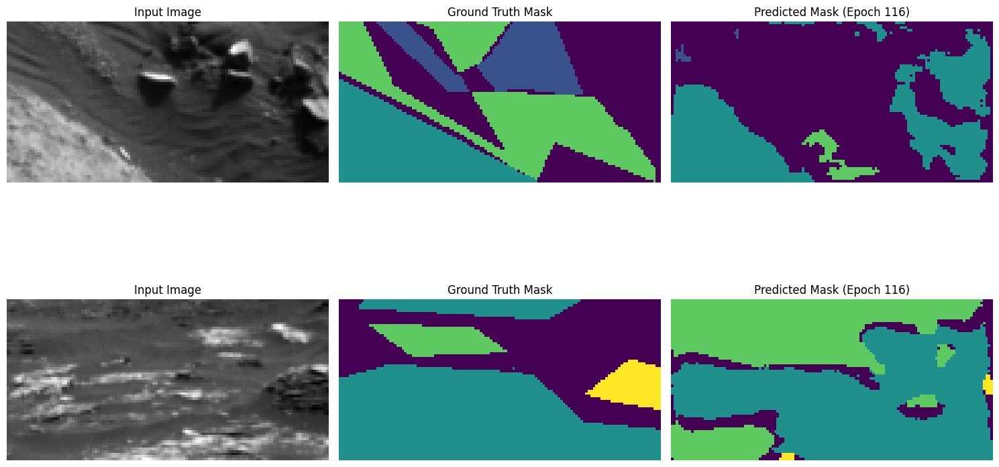

Epoch 117/250, Train Loss: 0.4272, Val Loss: 0.0592, Mean IoU: 0.4571
Class 0 IoU: 0.6206
Class 1 IoU: 0.5002
Class 2 IoU: 0.5940
Class 3 IoU: 0.1136


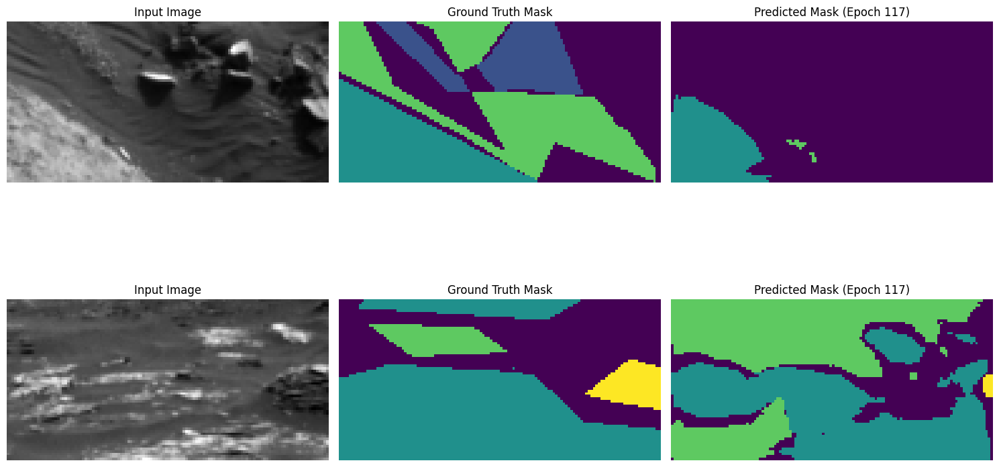

Epoch 118/250, Train Loss: 0.5755, Val Loss: 0.0450, Mean IoU: 0.4416
Class 0 IoU: 0.6399
Class 1 IoU: 0.4749
Class 2 IoU: 0.6051
Class 3 IoU: 0.0463


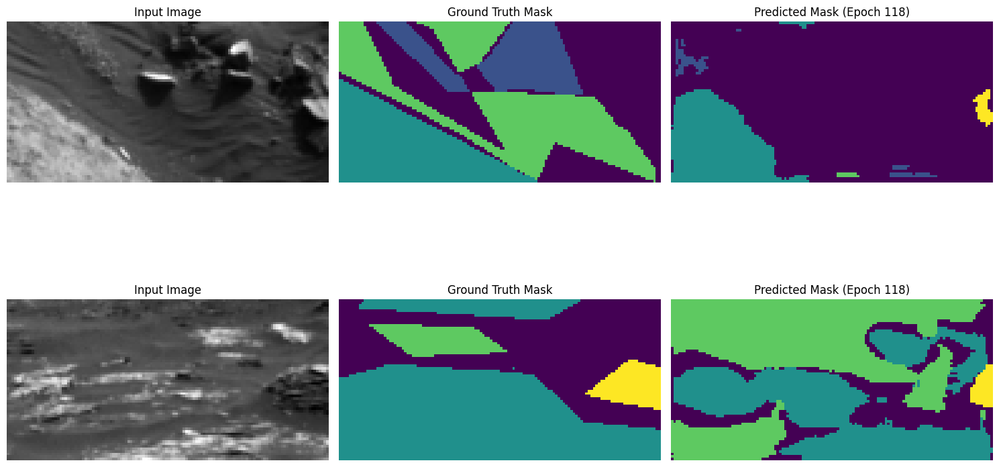

Epoch 119/250, Train Loss: 0.4314, Val Loss: 0.0500, Mean IoU: 0.4468
Class 0 IoU: 0.6466
Class 1 IoU: 0.4729
Class 2 IoU: 0.6159
Class 3 IoU: 0.0518


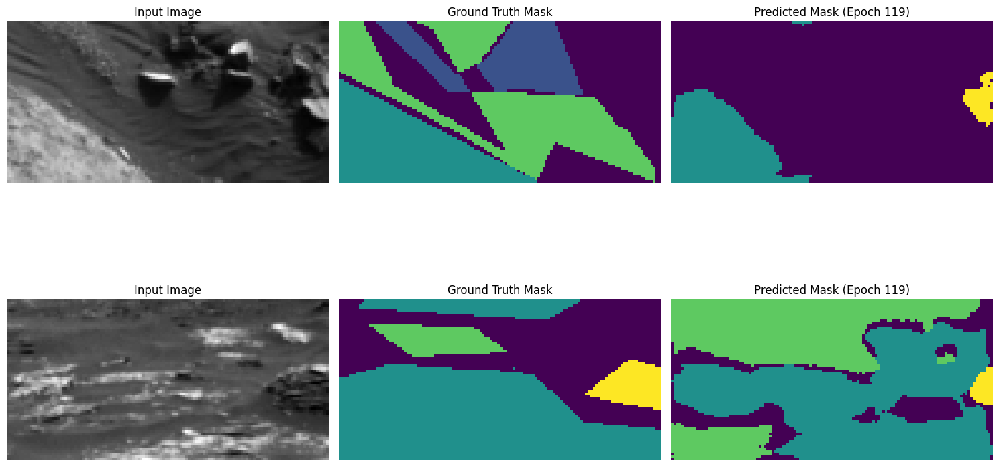

Epoch 120/250, Train Loss: 0.4140, Val Loss: 0.0520, Mean IoU: 0.4443
Class 0 IoU: 0.6491
Class 1 IoU: 0.4674
Class 2 IoU: 0.6047
Class 3 IoU: 0.0560


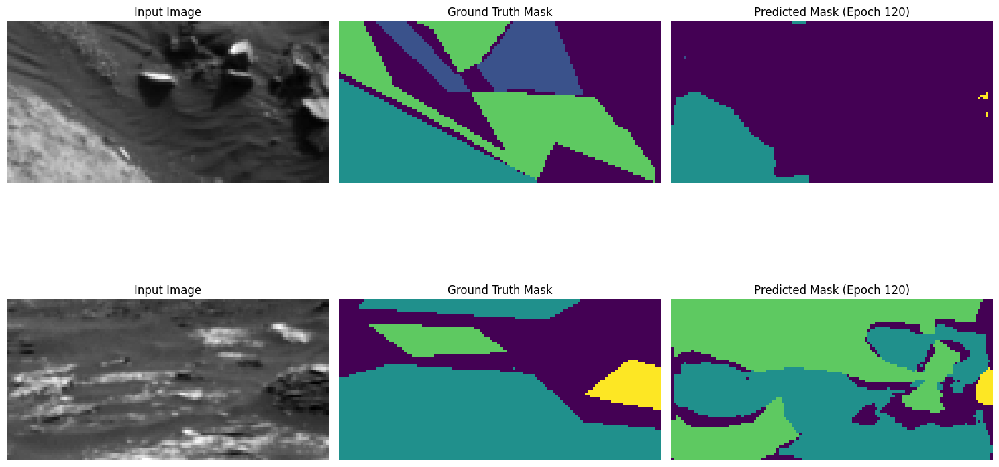

Epoch 121/250, Train Loss: 0.4050, Val Loss: 0.0554, Mean IoU: 0.4461
Class 0 IoU: 0.6482
Class 1 IoU: 0.4674
Class 2 IoU: 0.6105
Class 3 IoU: 0.0585


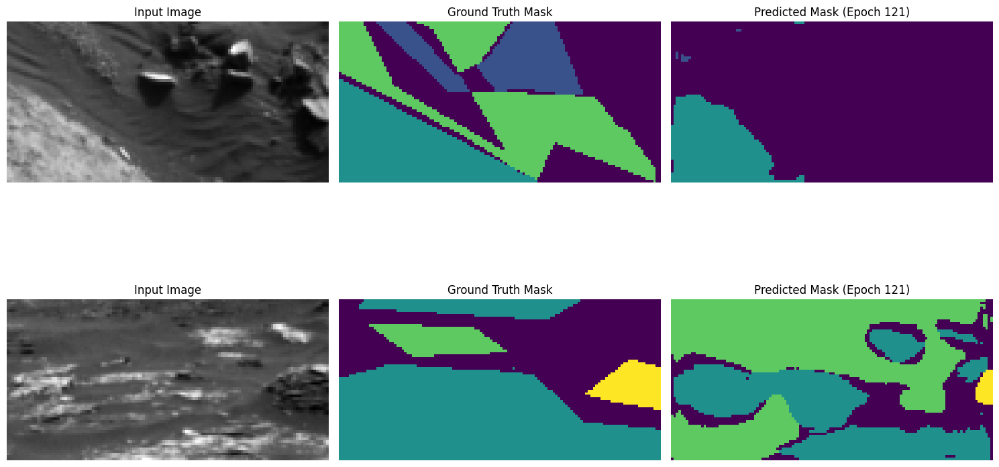

Epoch 122/250, Train Loss: 0.3930, Val Loss: 0.0570, Mean IoU: 0.4385
Class 0 IoU: 0.6401
Class 1 IoU: 0.4625
Class 2 IoU: 0.5964
Class 3 IoU: 0.0550


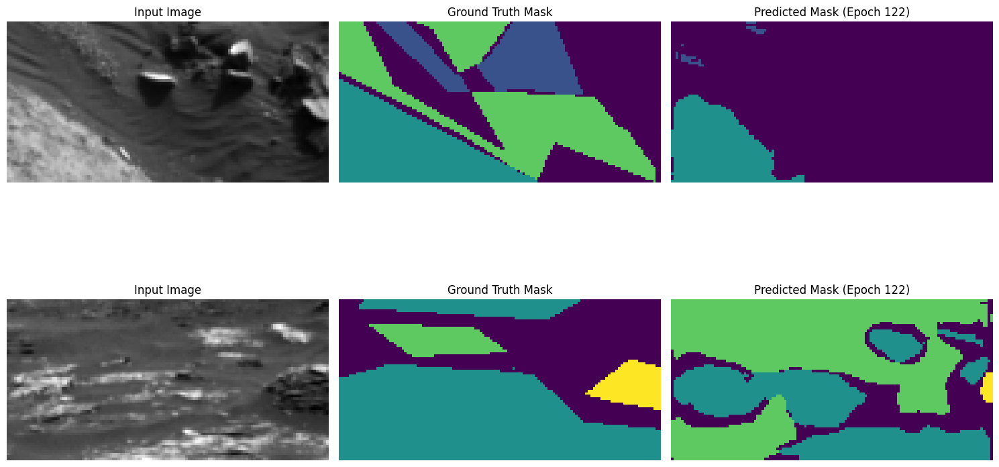

Epoch 123/250, Train Loss: 0.3895, Val Loss: 0.0592, Mean IoU: 0.4436
Class 0 IoU: 0.6338
Class 1 IoU: 0.4726
Class 2 IoU: 0.6121
Class 3 IoU: 0.0560


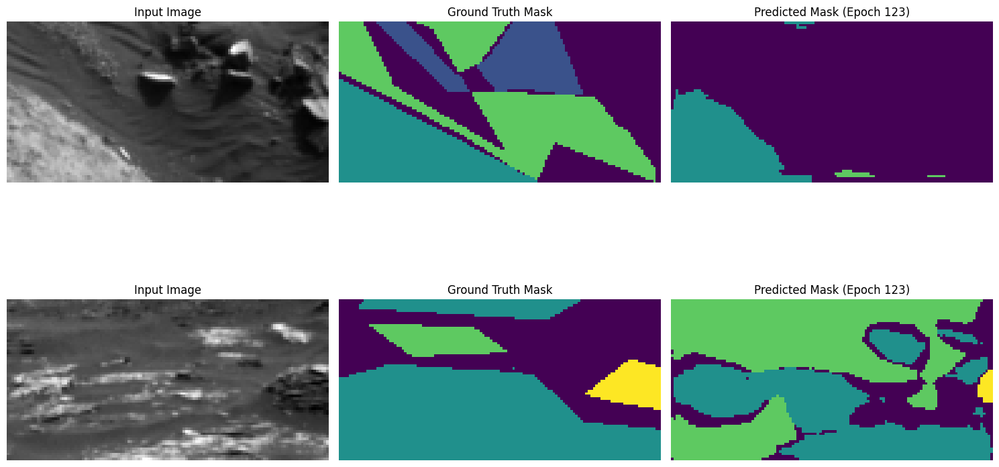

Epoch 124/250, Train Loss: 0.3829, Val Loss: 0.0629, Mean IoU: 0.4456
Class 0 IoU: 0.6492
Class 1 IoU: 0.4875
Class 2 IoU: 0.5944
Class 3 IoU: 0.0516


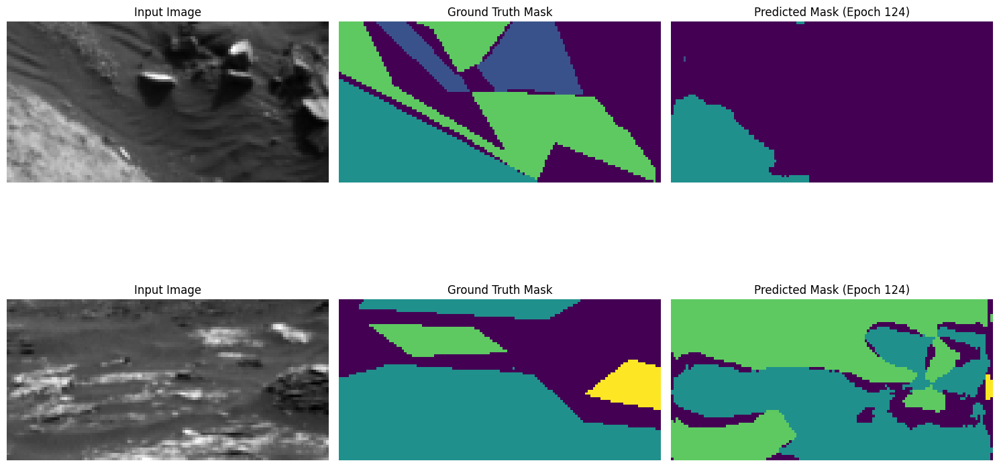

Epoch 125/250, Train Loss: 0.3780, Val Loss: 0.0583, Mean IoU: 0.4494
Class 0 IoU: 0.6464
Class 1 IoU: 0.4810
Class 2 IoU: 0.6128
Class 3 IoU: 0.0572


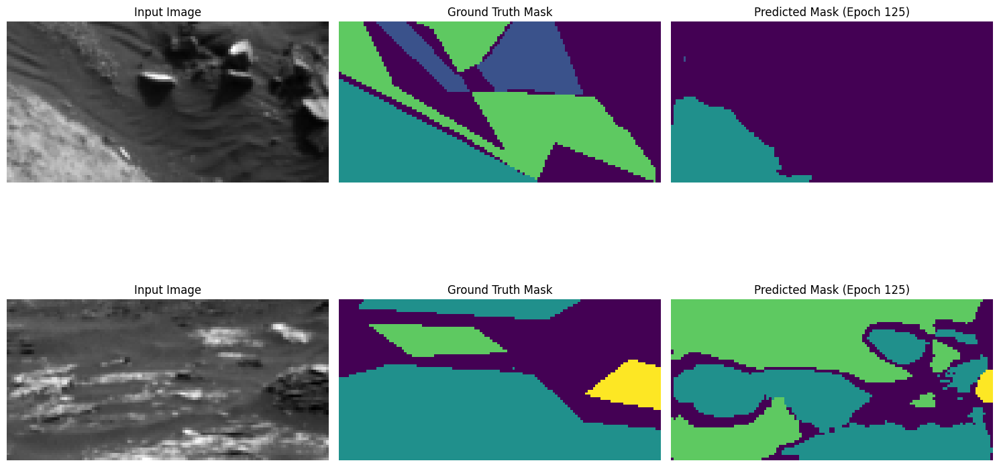

Epoch 126/250, Train Loss: 0.3638, Val Loss: 0.0658, Mean IoU: 0.4494
Class 0 IoU: 0.6383
Class 1 IoU: 0.4831
Class 2 IoU: 0.6032
Class 3 IoU: 0.0728


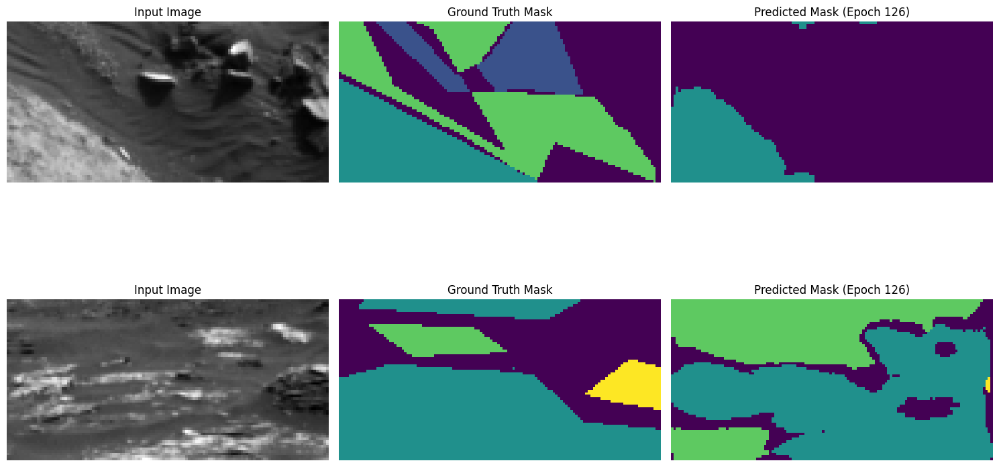

Epoch 127/250, Train Loss: 0.3627, Val Loss: 0.0635, Mean IoU: 0.4470
Class 0 IoU: 0.6434
Class 1 IoU: 0.4735
Class 2 IoU: 0.6180
Class 3 IoU: 0.0531


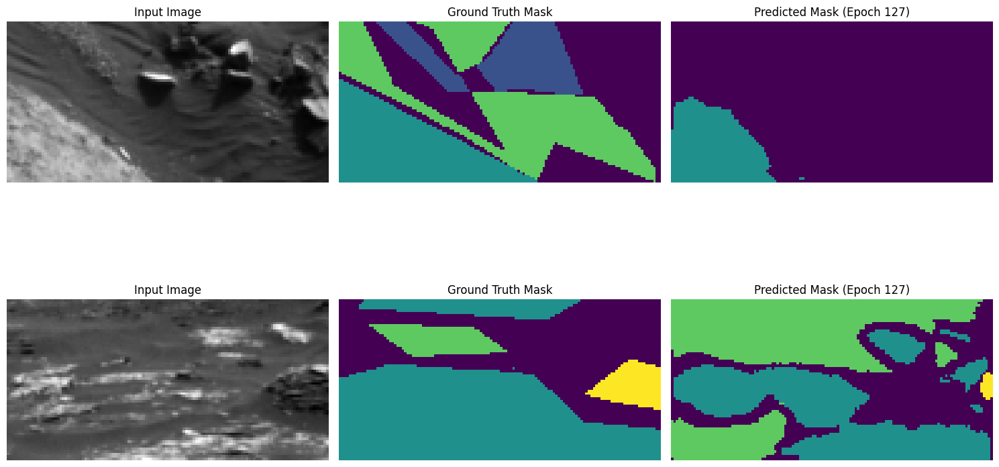

Epoch 128/250, Train Loss: 0.3553, Val Loss: 0.0656, Mean IoU: 0.4437
Class 0 IoU: 0.6244
Class 1 IoU: 0.4681
Class 2 IoU: 0.6209
Class 3 IoU: 0.0615


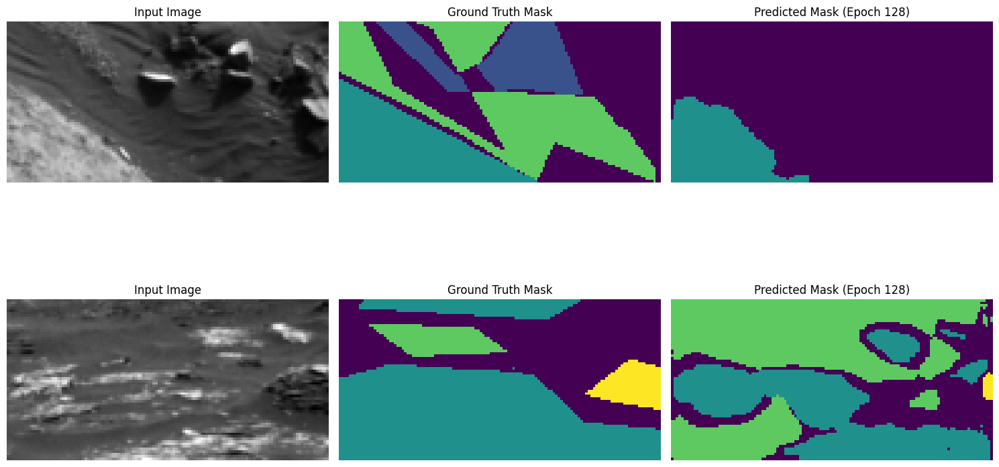

Epoch 129/250, Train Loss: 0.3568, Val Loss: 0.0652, Mean IoU: 0.4478
Class 0 IoU: 0.6351
Class 1 IoU: 0.4729
Class 2 IoU: 0.6231
Class 3 IoU: 0.0599


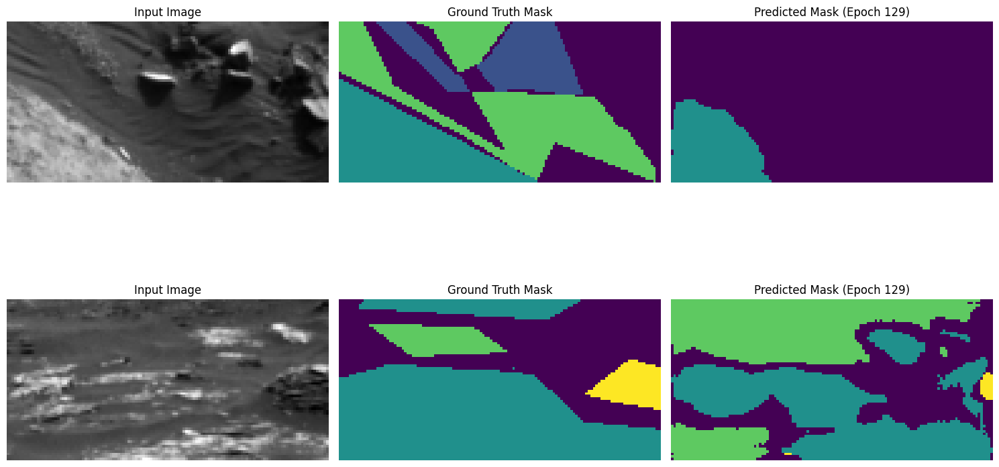

Epoch 130/250, Train Loss: 0.3496, Val Loss: 0.0692, Mean IoU: 0.4547
Class 0 IoU: 0.6485
Class 1 IoU: 0.4939
Class 2 IoU: 0.6064
Class 3 IoU: 0.0700


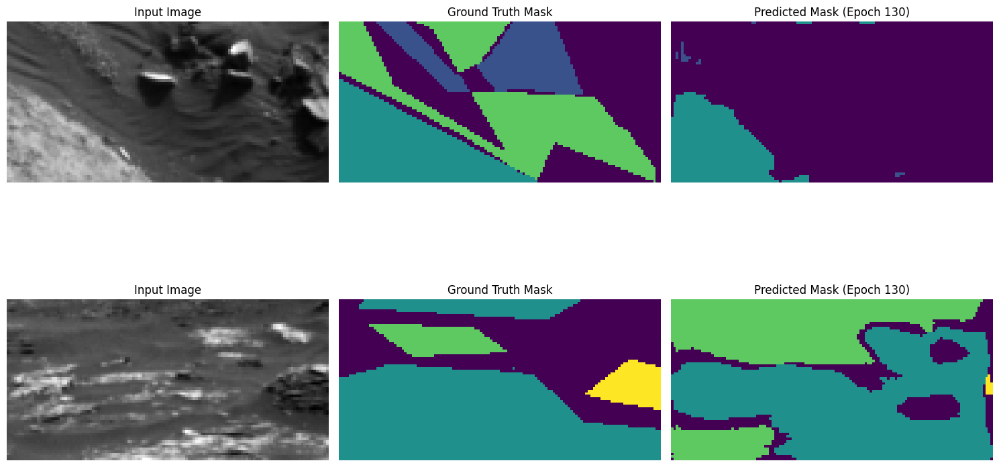

Epoch 131/250, Train Loss: 0.3484, Val Loss: 0.0671, Mean IoU: 0.4467
Class 0 IoU: 0.6478
Class 1 IoU: 0.4796
Class 2 IoU: 0.6053
Class 3 IoU: 0.0540


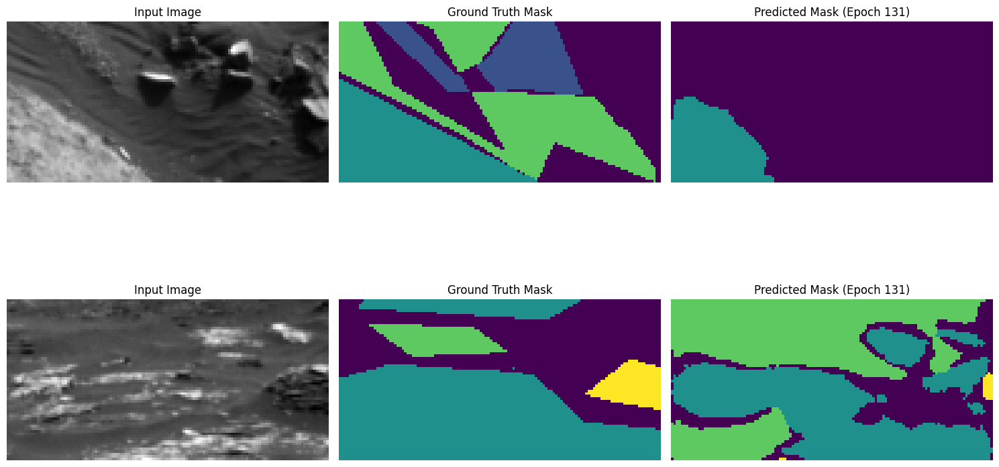

Epoch 132/250, Train Loss: 0.3411, Val Loss: 0.0686, Mean IoU: 0.4430
Class 0 IoU: 0.6469
Class 1 IoU: 0.4696
Class 2 IoU: 0.6057
Class 3 IoU: 0.0499


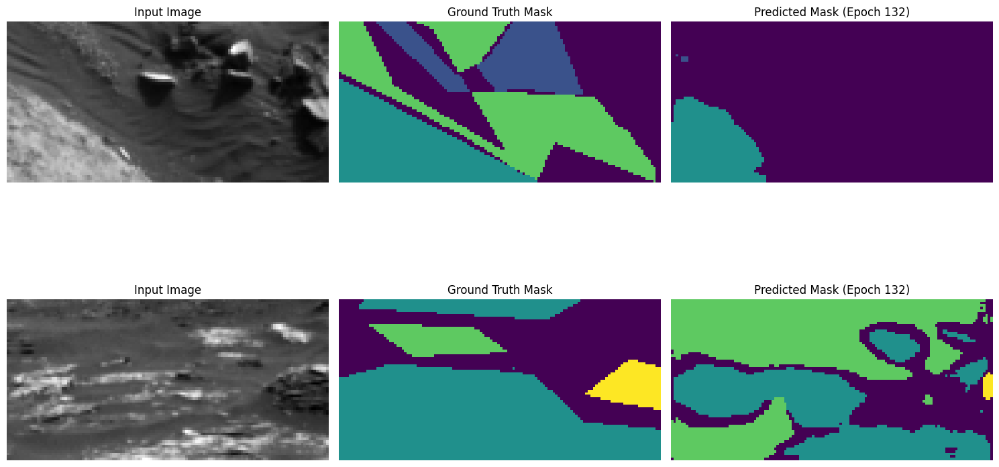

Epoch 133/250, Train Loss: 0.3418, Val Loss: 0.0717, Mean IoU: 0.4542
Class 0 IoU: 0.6413
Class 1 IoU: 0.4883
Class 2 IoU: 0.6111
Class 3 IoU: 0.0762


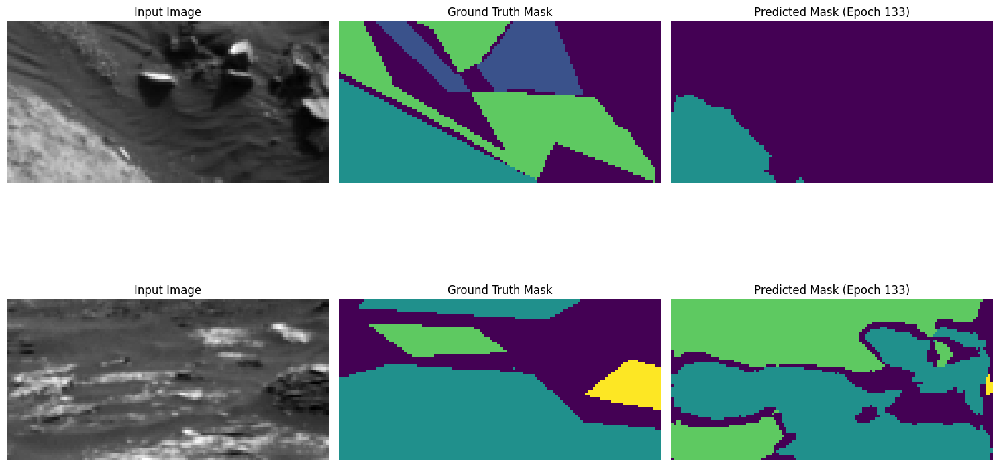

Epoch 134/250, Train Loss: 0.3385, Val Loss: 0.0680, Mean IoU: 0.4489
Class 0 IoU: 0.6459
Class 1 IoU: 0.4876
Class 2 IoU: 0.6074
Class 3 IoU: 0.0549


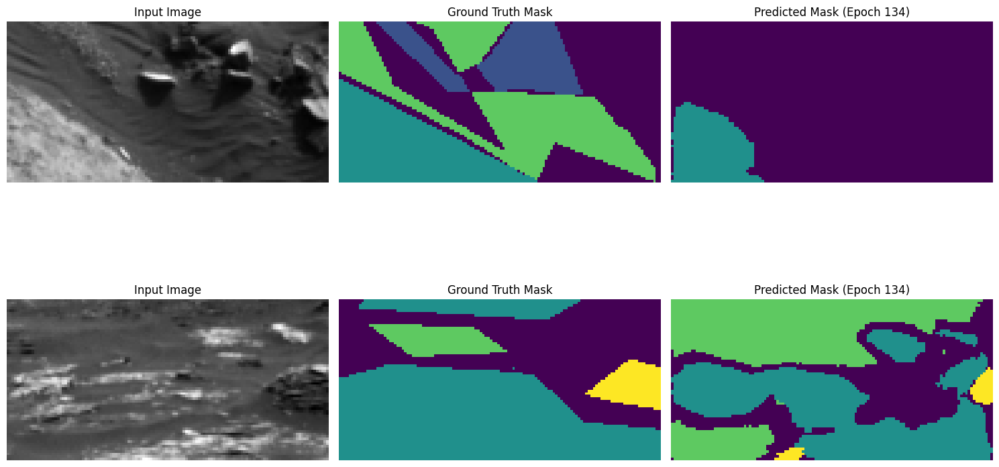

Epoch 135/250, Train Loss: 0.3384, Val Loss: 0.0705, Mean IoU: 0.4414
Class 0 IoU: 0.6202
Class 1 IoU: 0.4717
Class 2 IoU: 0.6069
Class 3 IoU: 0.0667


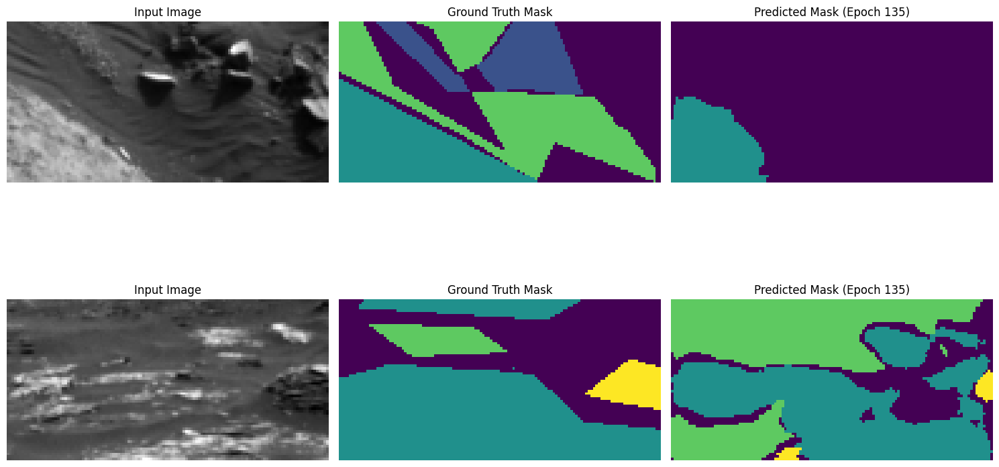

Epoch 136/250, Train Loss: 0.3261, Val Loss: 0.0707, Mean IoU: 0.4486
Class 0 IoU: 0.6340
Class 1 IoU: 0.4675
Class 2 IoU: 0.6253
Class 3 IoU: 0.0673


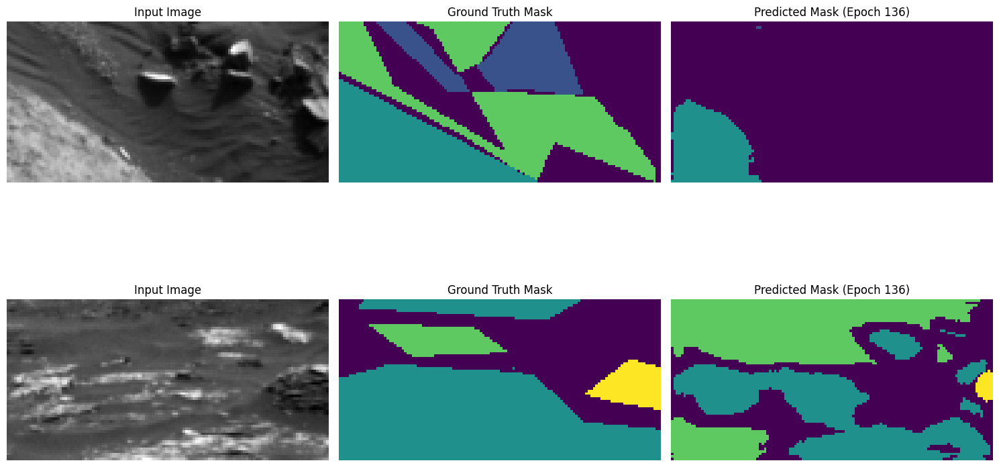

Epoch 137/250, Train Loss: 0.3339, Val Loss: 0.0710, Mean IoU: 0.4547
Class 0 IoU: 0.6454
Class 1 IoU: 0.4858
Class 2 IoU: 0.6157
Class 3 IoU: 0.0719


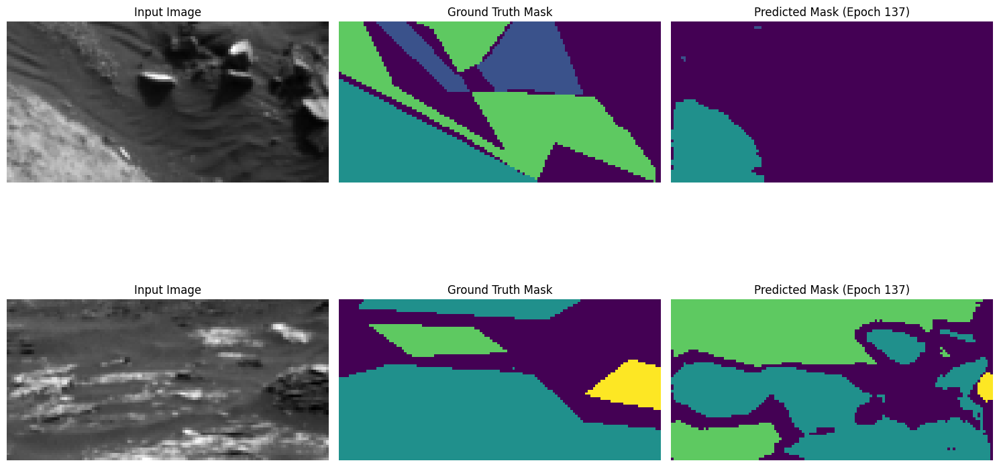

Epoch 138/250, Train Loss: 0.3301, Val Loss: 0.0763, Mean IoU: 0.4522
Class 0 IoU: 0.6302
Class 1 IoU: 0.4866
Class 2 IoU: 0.6267
Class 3 IoU: 0.0653


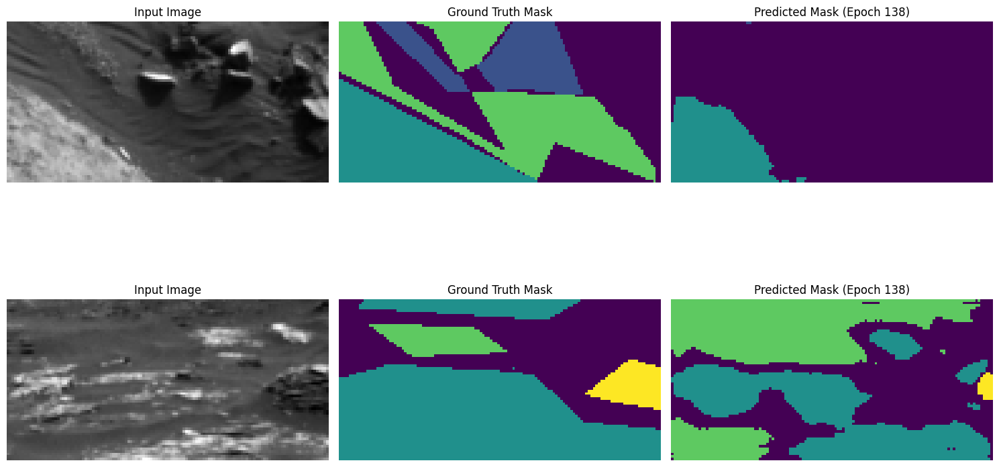

Epoch 139/250, Train Loss: 0.3251, Val Loss: 0.0721, Mean IoU: 0.4498
Class 0 IoU: 0.6428
Class 1 IoU: 0.4741
Class 2 IoU: 0.6115
Class 3 IoU: 0.0707


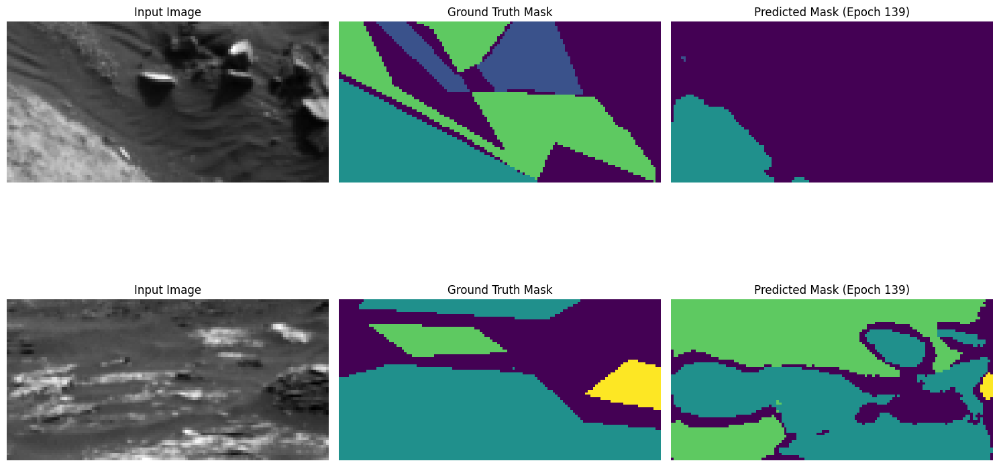

Epoch 140/250, Train Loss: 0.3237, Val Loss: 0.0771, Mean IoU: 0.4487
Class 0 IoU: 0.6353
Class 1 IoU: 0.4796
Class 2 IoU: 0.6148
Class 3 IoU: 0.0650


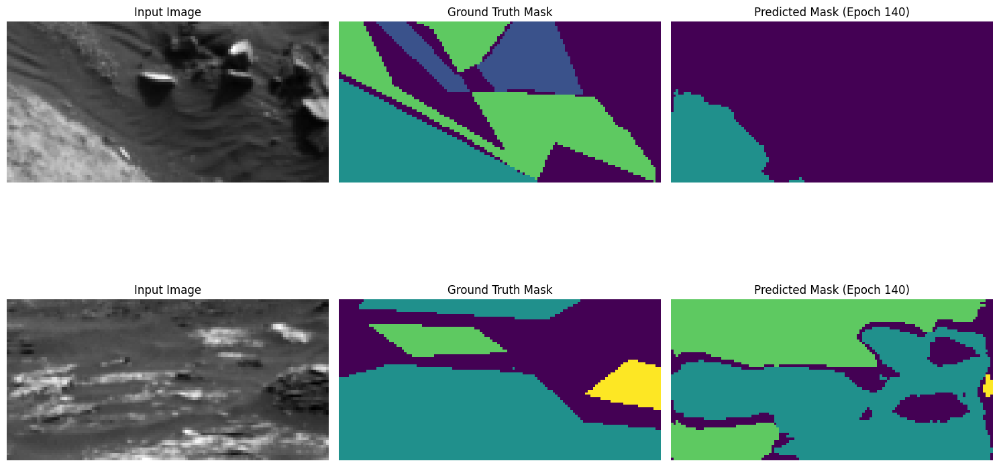

Epoch 141/250, Train Loss: 0.3170, Val Loss: 0.0730, Mean IoU: 0.4483
Class 0 IoU: 0.6287
Class 1 IoU: 0.4791
Class 2 IoU: 0.6178
Class 3 IoU: 0.0676


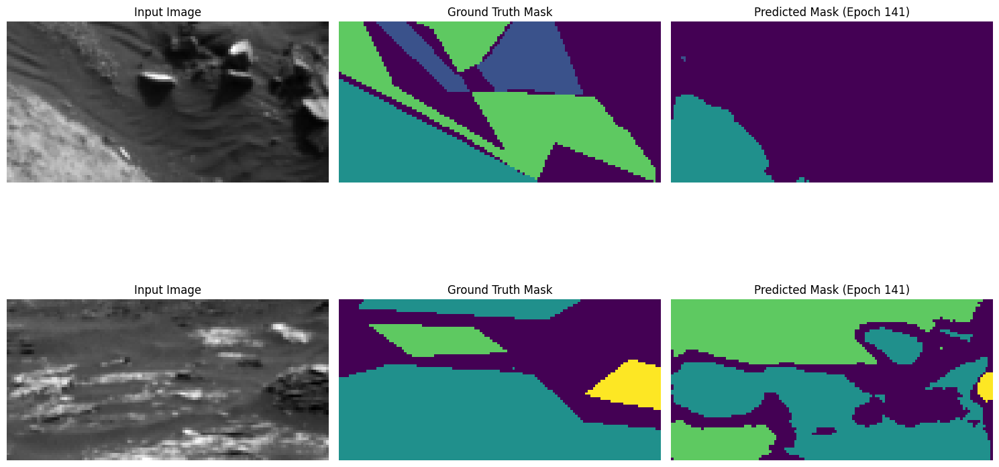

Epoch 142/250, Train Loss: 0.3161, Val Loss: 0.0717, Mean IoU: 0.4535
Class 0 IoU: 0.6420
Class 1 IoU: 0.4787
Class 2 IoU: 0.6209
Class 3 IoU: 0.0723


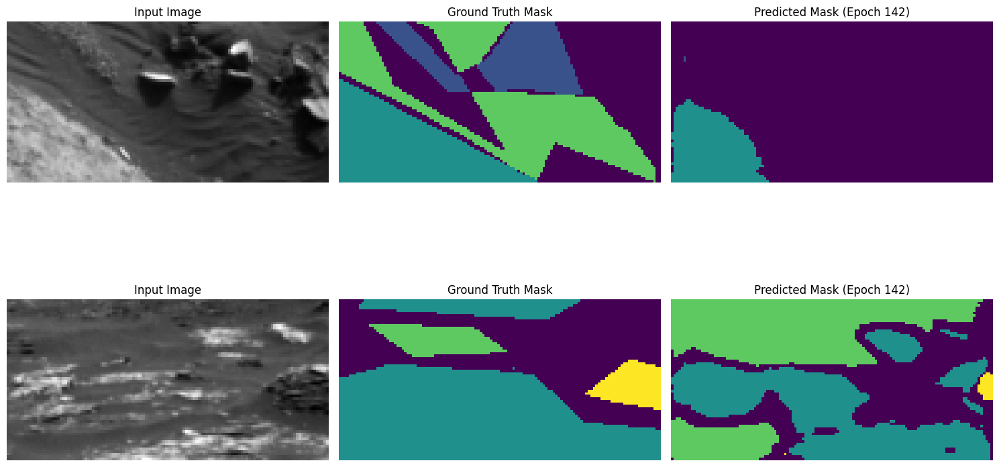

Epoch 143/250, Train Loss: 0.3121, Val Loss: 0.0776, Mean IoU: 0.4514
Class 0 IoU: 0.6464
Class 1 IoU: 0.4714
Class 2 IoU: 0.6149
Class 3 IoU: 0.0730


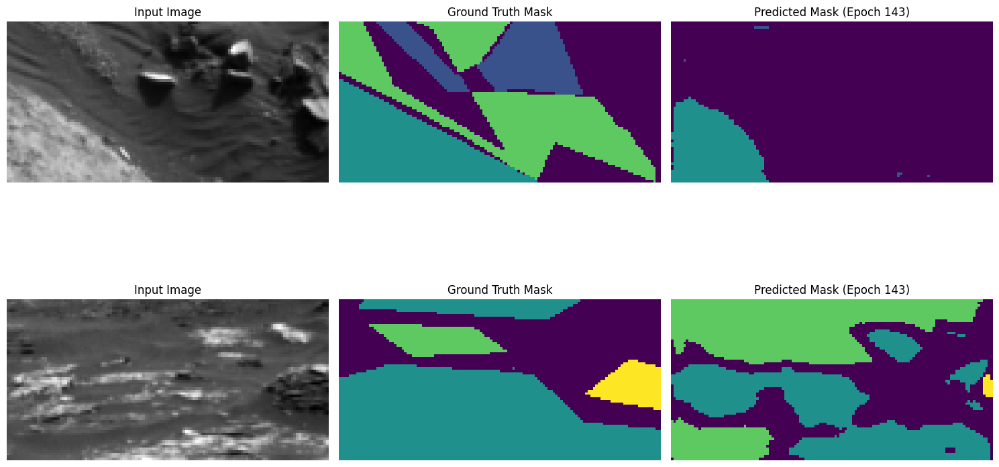

Epoch 144/250, Train Loss: 0.3210, Val Loss: 0.0718, Mean IoU: 0.4547
Class 0 IoU: 0.6373
Class 1 IoU: 0.4811
Class 2 IoU: 0.6293
Class 3 IoU: 0.0710


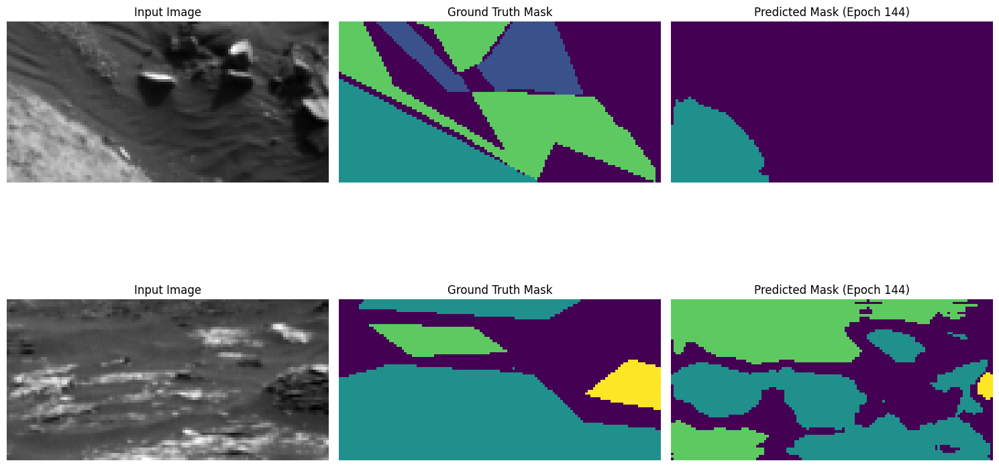

Epoch 145/250, Train Loss: 0.3123, Val Loss: 0.0793, Mean IoU: 0.4529
Class 0 IoU: 0.6338
Class 1 IoU: 0.4877
Class 2 IoU: 0.6111
Class 3 IoU: 0.0791


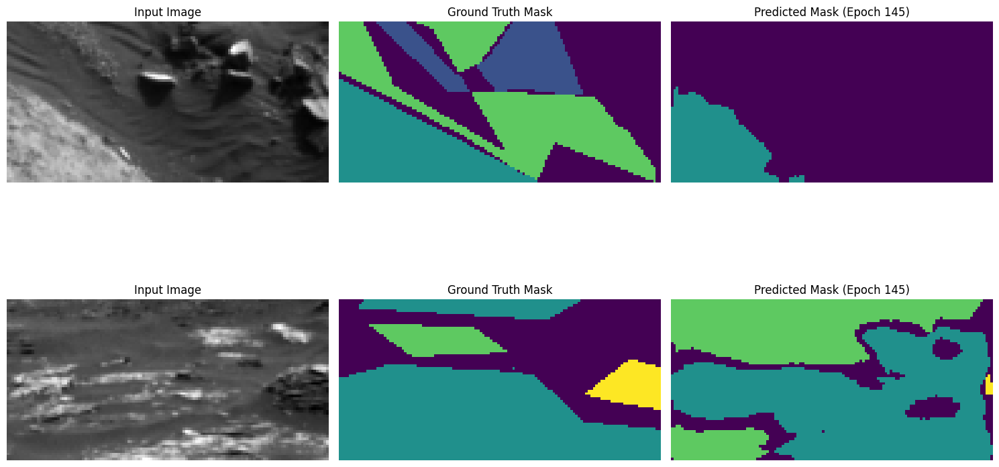

Epoch 146/250, Train Loss: 0.3102, Val Loss: 0.0742, Mean IoU: 0.4532
Class 0 IoU: 0.6450
Class 1 IoU: 0.4843
Class 2 IoU: 0.6112
Class 3 IoU: 0.0721


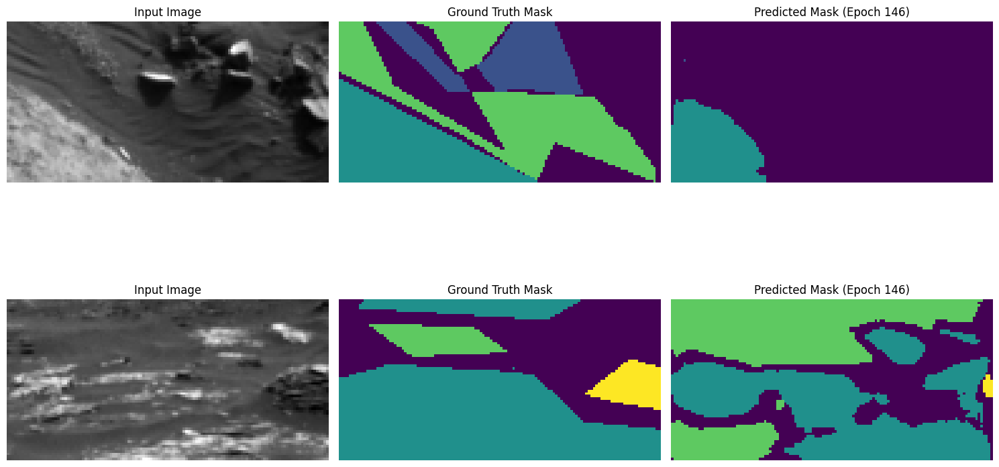

Epoch 147/250, Train Loss: 0.3051, Val Loss: 0.0769, Mean IoU: 0.4530
Class 0 IoU: 0.6418
Class 1 IoU: 0.4717
Class 2 IoU: 0.6229
Class 3 IoU: 0.0757


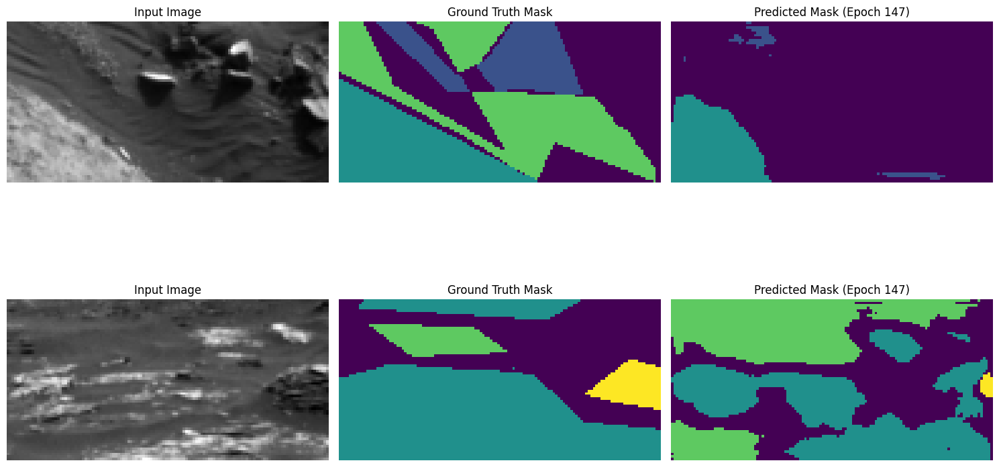

Epoch 148/250, Train Loss: 0.3040, Val Loss: 0.0759, Mean IoU: 0.4556
Class 0 IoU: 0.6339
Class 1 IoU: 0.4882
Class 2 IoU: 0.6085
Class 3 IoU: 0.0917


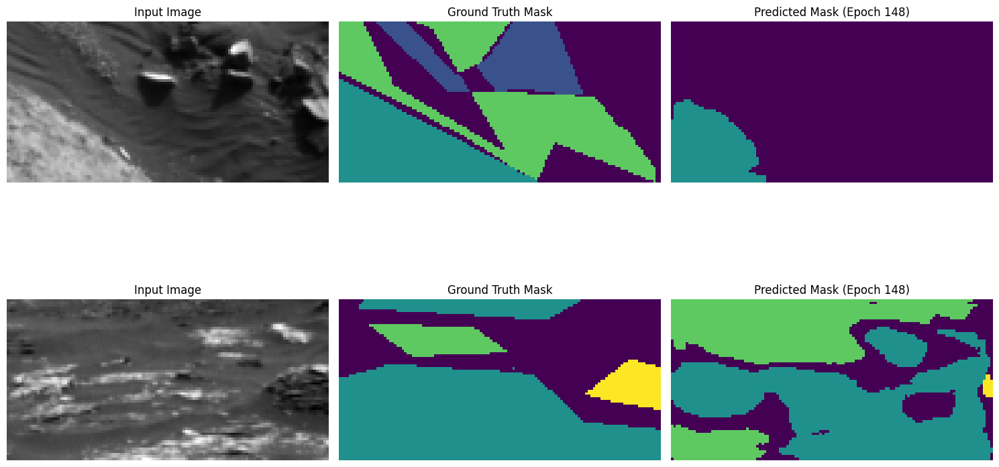

Epoch 149/250, Train Loss: 0.3027, Val Loss: 0.0785, Mean IoU: 0.4581
Class 0 IoU: 0.6474
Class 1 IoU: 0.4894
Class 2 IoU: 0.6095
Class 3 IoU: 0.0860


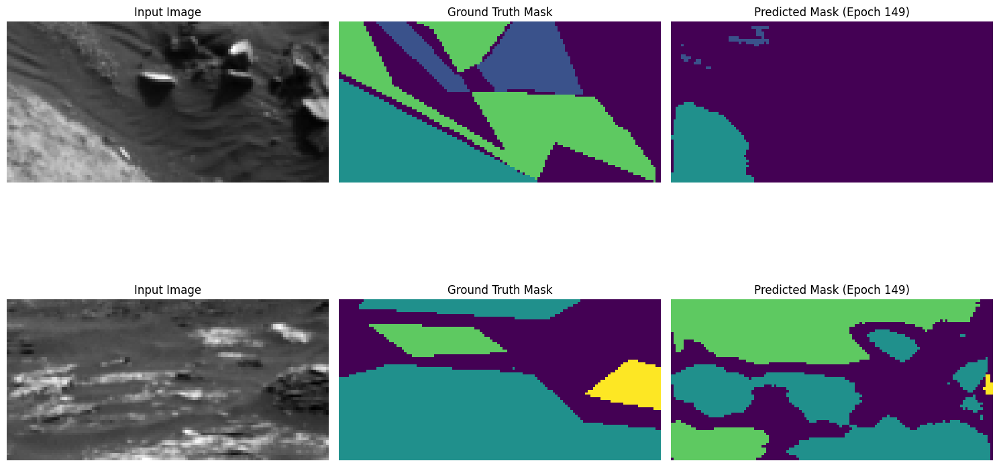

Epoch 150/250, Train Loss: 0.2980, Val Loss: 0.0793, Mean IoU: 0.4502
Class 0 IoU: 0.6326
Class 1 IoU: 0.4796
Class 2 IoU: 0.6028
Class 3 IoU: 0.0860


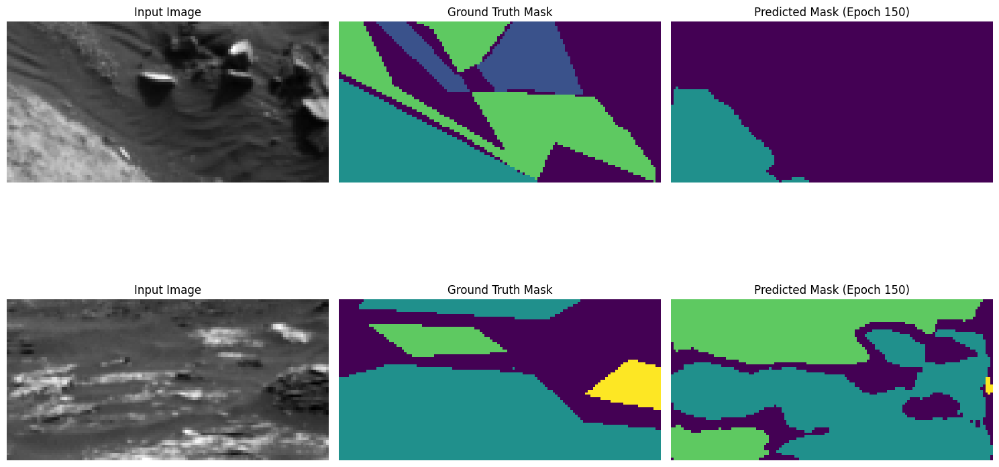

Epoch 151/250, Train Loss: 0.3008, Val Loss: 0.0761, Mean IoU: 0.4517
Class 0 IoU: 0.6334
Class 1 IoU: 0.4864
Class 2 IoU: 0.6048
Class 3 IoU: 0.0822


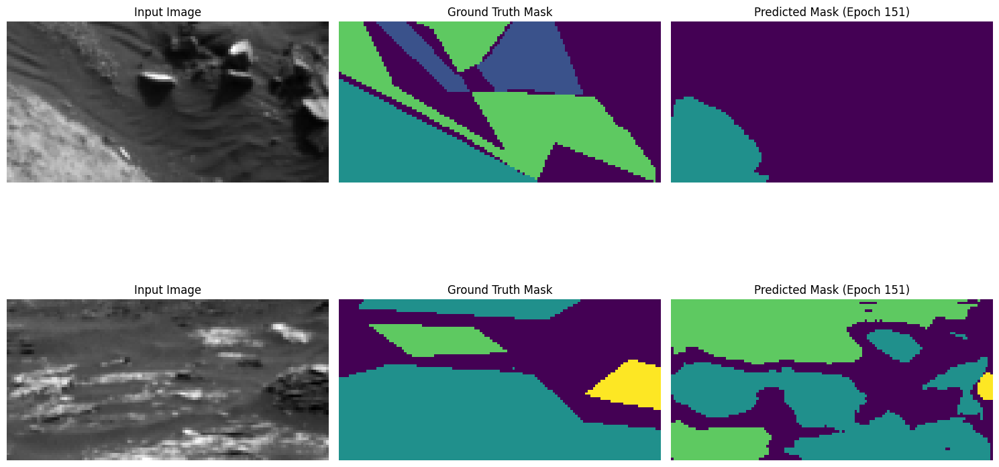

Epoch 152/250, Train Loss: 0.2971, Val Loss: 0.0783, Mean IoU: 0.4566
Class 0 IoU: 0.6418
Class 1 IoU: 0.4850
Class 2 IoU: 0.6101
Class 3 IoU: 0.0895


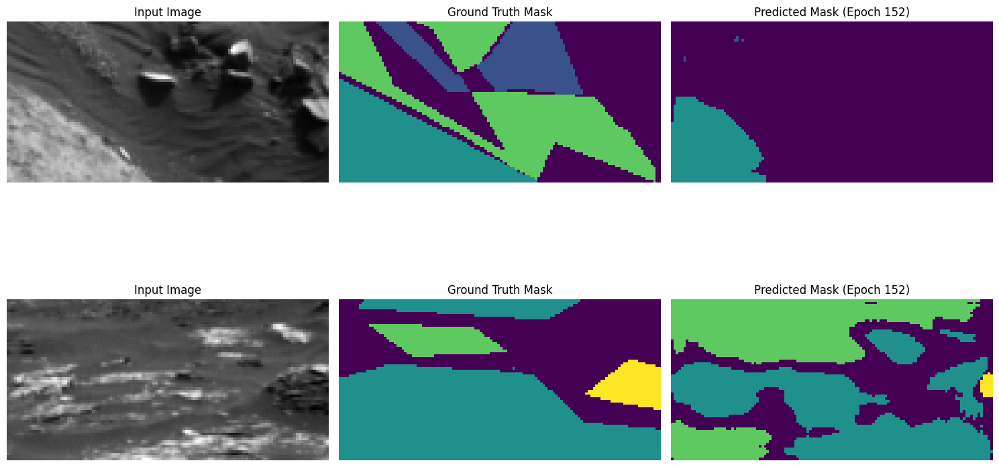

Epoch 153/250, Train Loss: 0.2947, Val Loss: 0.0800, Mean IoU: 0.4558
Class 0 IoU: 0.6359
Class 1 IoU: 0.4840
Class 2 IoU: 0.6106
Class 3 IoU: 0.0925


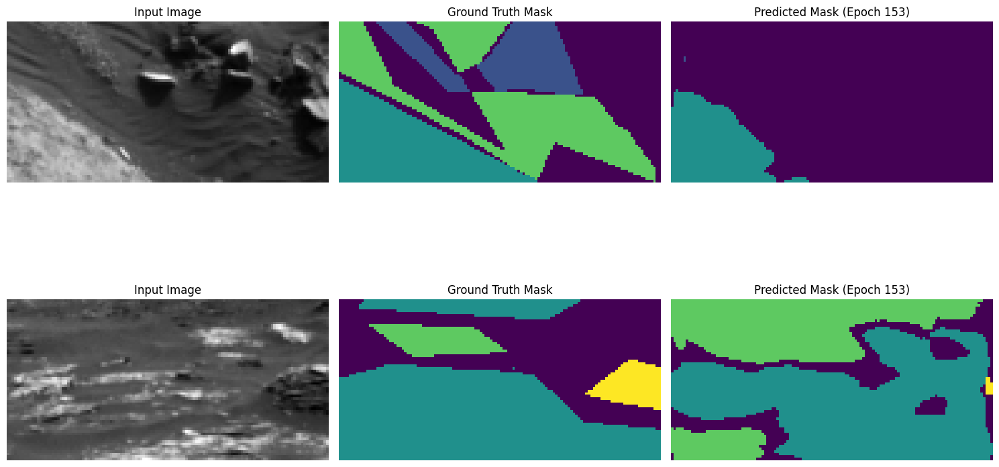

Epoch 154/250, Train Loss: 0.2954, Val Loss: 0.0769, Mean IoU: 0.4538
Class 0 IoU: 0.6398
Class 1 IoU: 0.4839
Class 2 IoU: 0.6073
Class 3 IoU: 0.0842


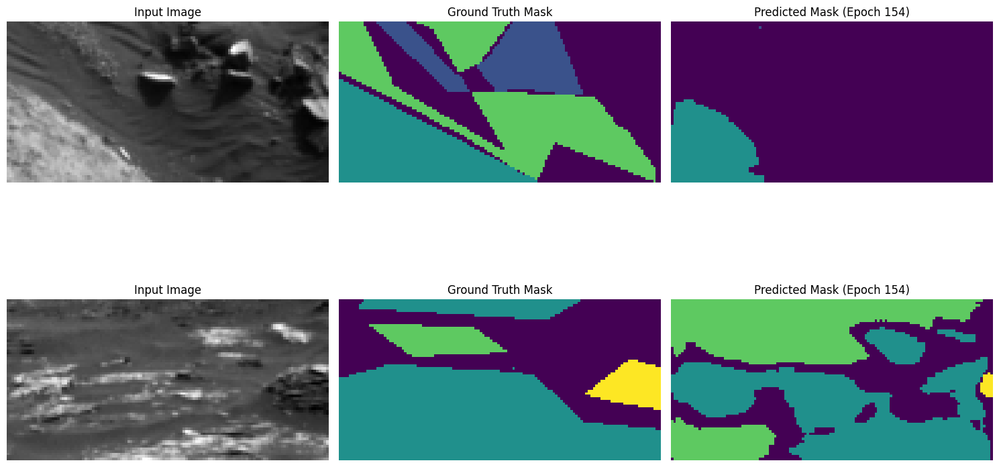

Epoch 155/250, Train Loss: 0.2917, Val Loss: 0.0804, Mean IoU: 0.4502
Class 0 IoU: 0.6313
Class 1 IoU: 0.4668
Class 2 IoU: 0.6011
Class 3 IoU: 0.1016


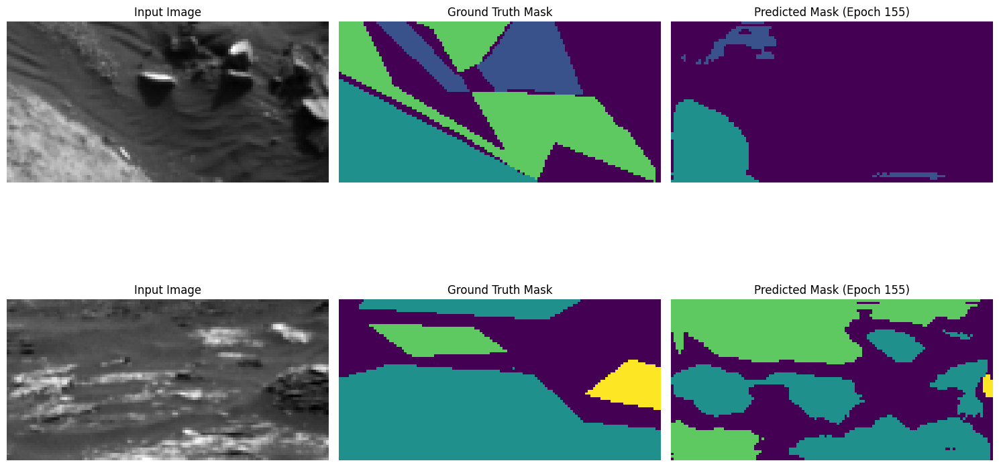

Epoch 156/250, Train Loss: 0.2924, Val Loss: 0.0832, Mean IoU: 0.4485
Class 0 IoU: 0.6297
Class 1 IoU: 0.4778
Class 2 IoU: 0.6042
Class 3 IoU: 0.0824


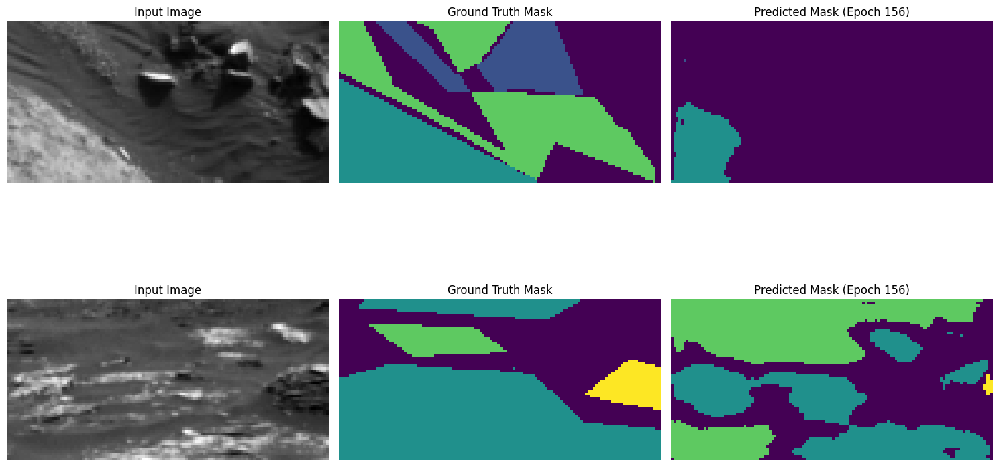

Epoch 157/250, Train Loss: 0.2877, Val Loss: 0.0854, Mean IoU: 0.4562
Class 0 IoU: 0.6331
Class 1 IoU: 0.4932
Class 2 IoU: 0.6026
Class 3 IoU: 0.0959


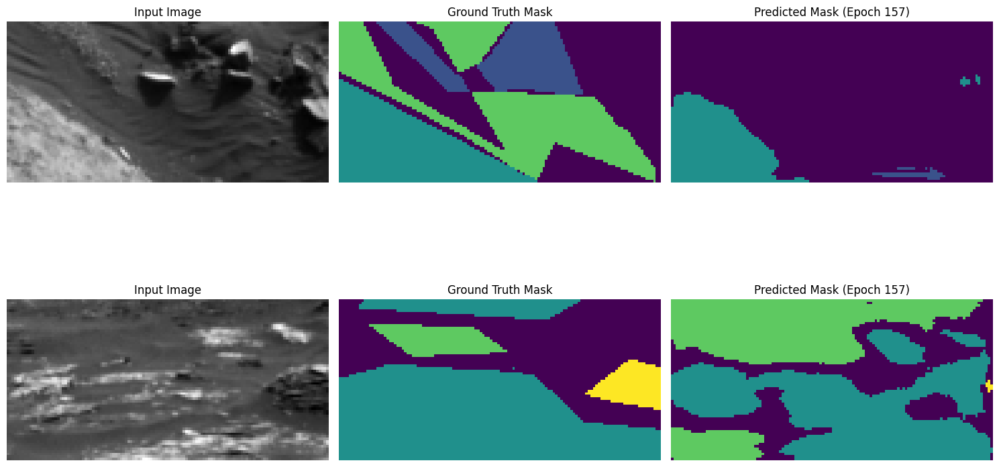

Epoch 158/250, Train Loss: 0.2842, Val Loss: 0.0798, Mean IoU: 0.4526
Class 0 IoU: 0.6310
Class 1 IoU: 0.4829
Class 2 IoU: 0.6062
Class 3 IoU: 0.0904


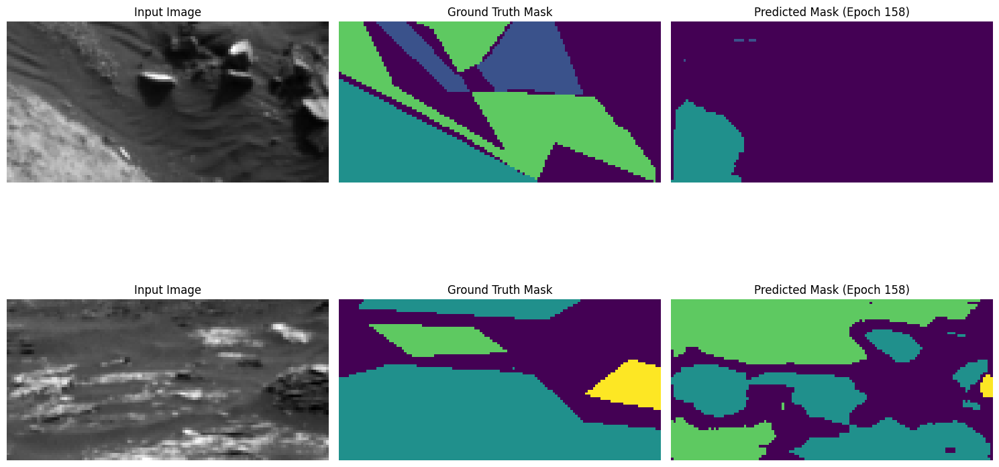

Epoch 159/250, Train Loss: 0.2868, Val Loss: 0.0832, Mean IoU: 0.4539
Class 0 IoU: 0.6375
Class 1 IoU: 0.4829
Class 2 IoU: 0.6041
Class 3 IoU: 0.0911


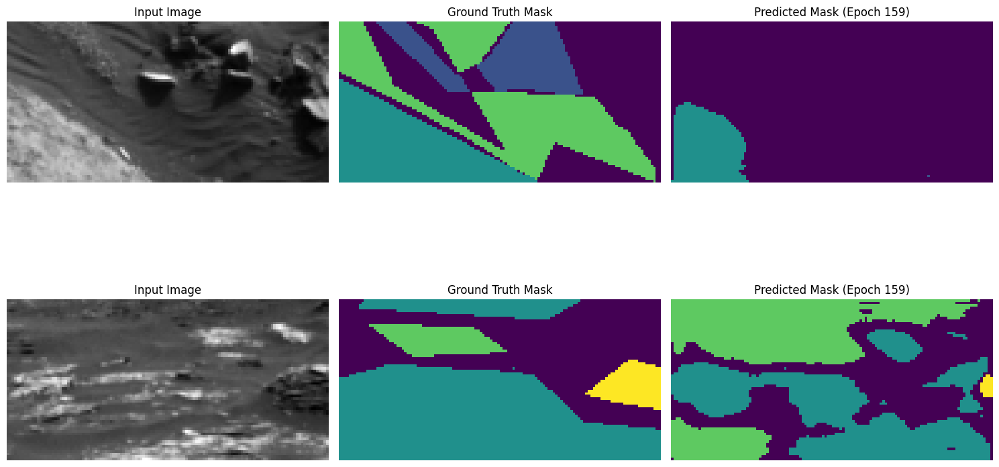

Epoch 160/250, Train Loss: 0.3001, Val Loss: 0.0801, Mean IoU: 0.4502
Class 0 IoU: 0.6255
Class 1 IoU: 0.4883
Class 2 IoU: 0.6031
Class 3 IoU: 0.0837


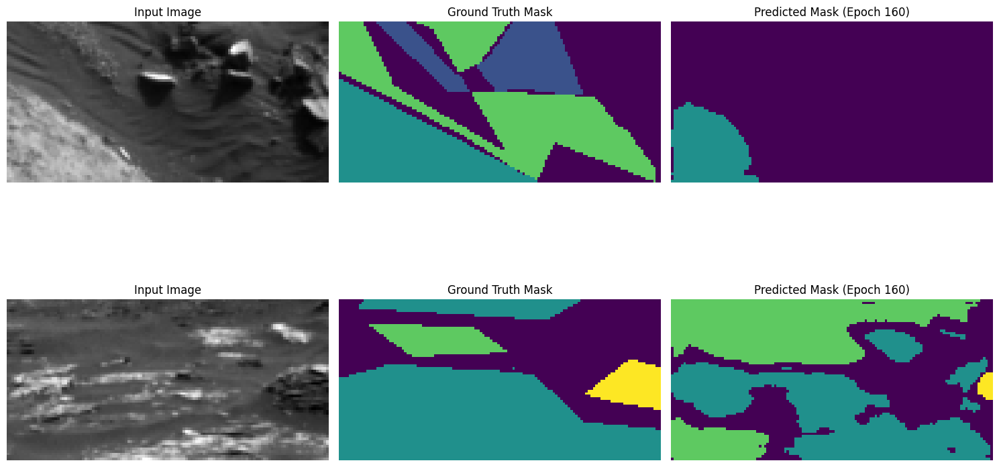

Epoch 161/250, Train Loss: 0.2838, Val Loss: 0.0788, Mean IoU: 0.4579
Class 0 IoU: 0.6421
Class 1 IoU: 0.4852
Class 2 IoU: 0.6052
Class 3 IoU: 0.0990


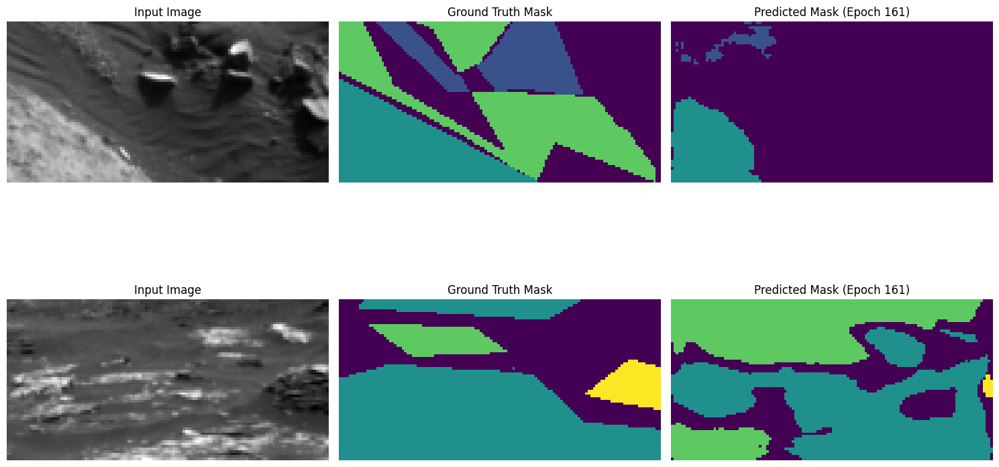

Epoch 162/250, Train Loss: 0.2872, Val Loss: 0.0788, Mean IoU: 0.4561
Class 0 IoU: 0.6339
Class 1 IoU: 0.4849
Class 2 IoU: 0.6188
Class 3 IoU: 0.0866


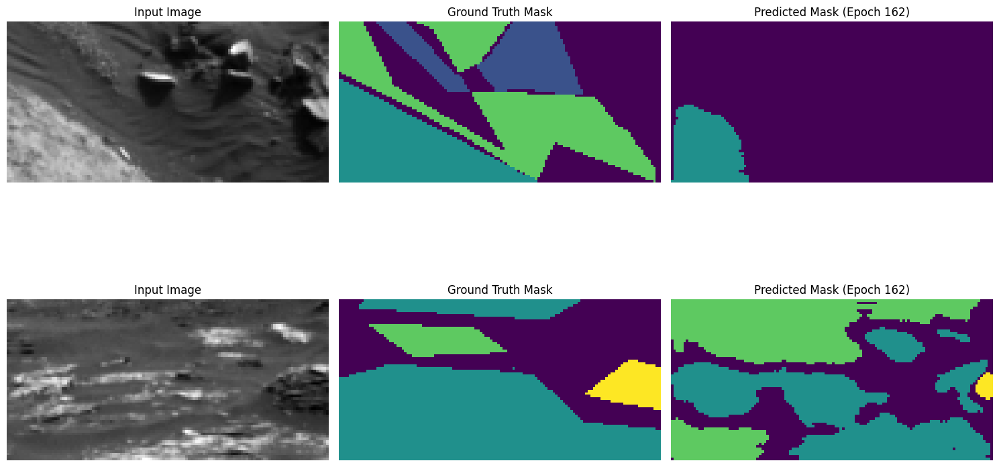

Epoch 163/250, Train Loss: 0.2770, Val Loss: 0.0798, Mean IoU: 0.4527
Class 0 IoU: 0.6226
Class 1 IoU: 0.4848
Class 2 IoU: 0.5946
Class 3 IoU: 0.1086


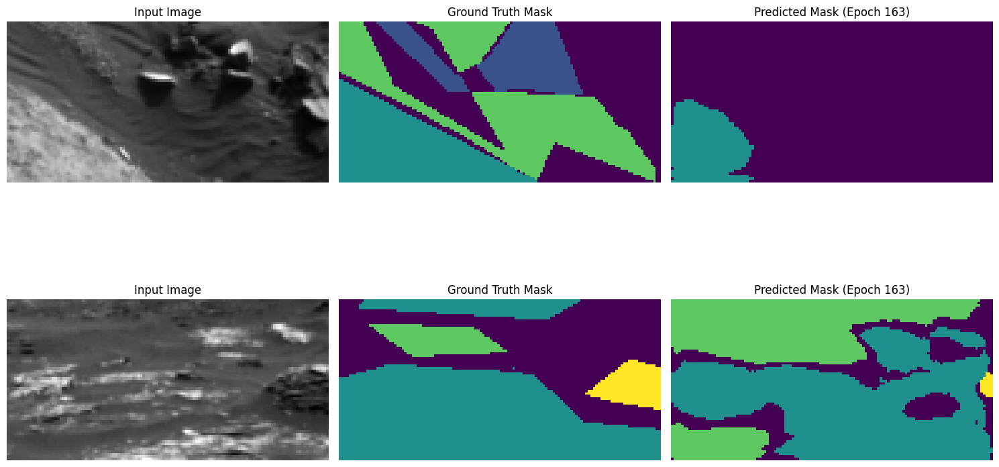

Epoch 164/250, Train Loss: 0.2793, Val Loss: 0.0787, Mean IoU: 0.4656
Class 0 IoU: 0.6474
Class 1 IoU: 0.4981
Class 2 IoU: 0.5985
Class 3 IoU: 0.1183


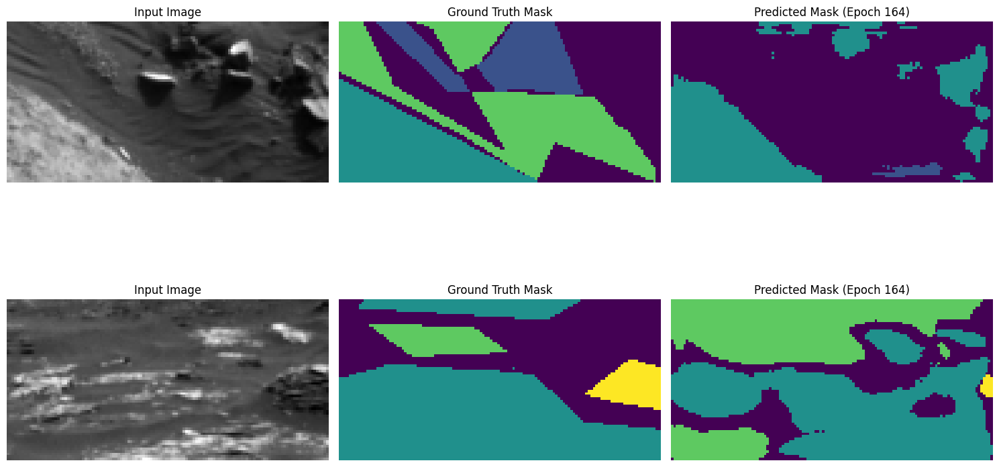

Epoch 165/250, Train Loss: 0.2700, Val Loss: 0.0785, Mean IoU: 0.4589
Class 0 IoU: 0.6293
Class 1 IoU: 0.4901
Class 2 IoU: 0.6030
Class 3 IoU: 0.1133


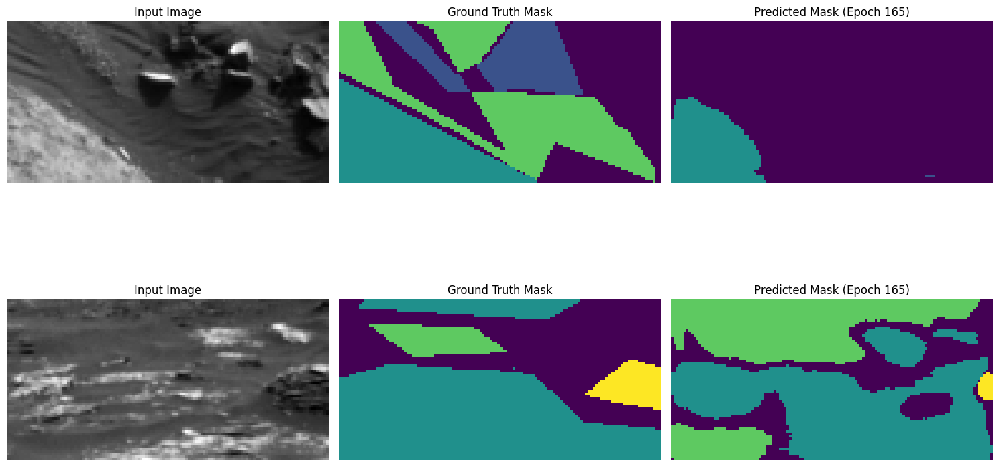

Epoch 166/250, Train Loss: 0.2721, Val Loss: 0.0777, Mean IoU: 0.4616
Class 0 IoU: 0.6455
Class 1 IoU: 0.4931
Class 2 IoU: 0.6209
Class 3 IoU: 0.0870


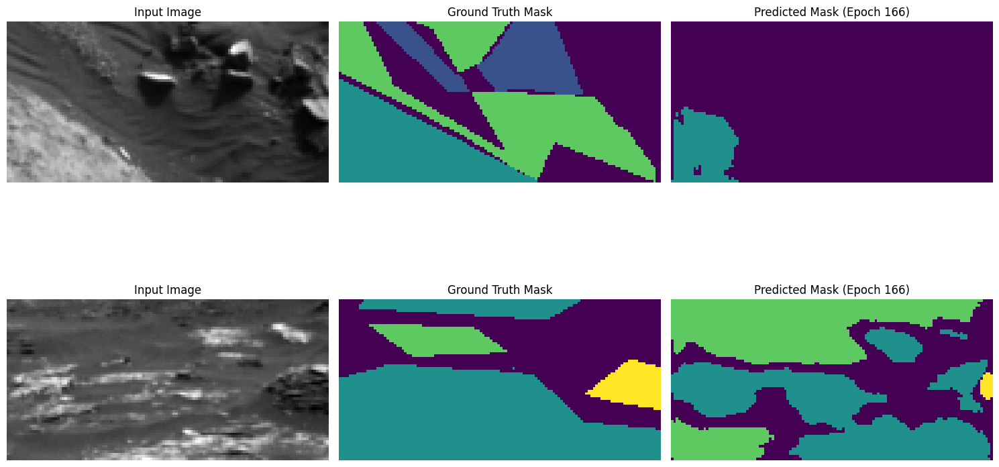

Epoch 167/250, Train Loss: 0.2775, Val Loss: 0.0767, Mean IoU: 0.4555
Class 0 IoU: 0.6376
Class 1 IoU: 0.4845
Class 2 IoU: 0.6034
Class 3 IoU: 0.0966


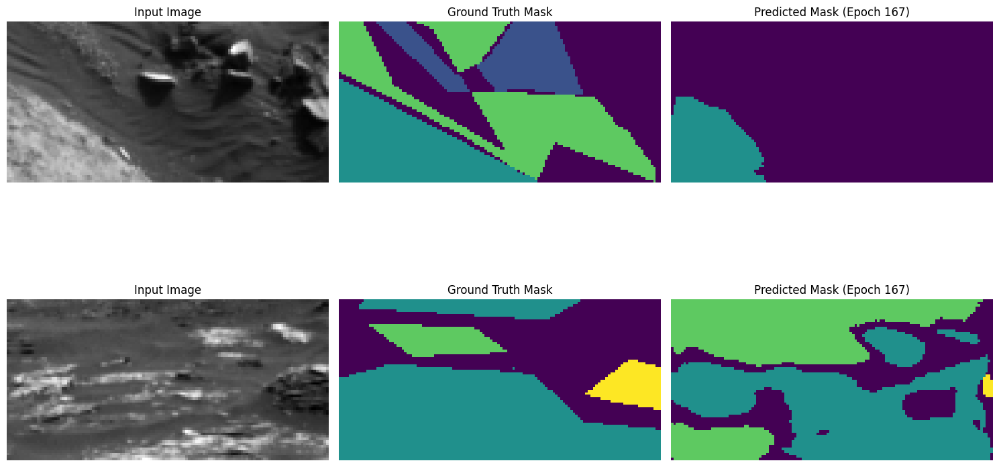

Epoch 168/250, Train Loss: 0.2655, Val Loss: 0.0778, Mean IoU: 0.4621
Class 0 IoU: 0.6375
Class 1 IoU: 0.4977
Class 2 IoU: 0.6050
Class 3 IoU: 0.1080


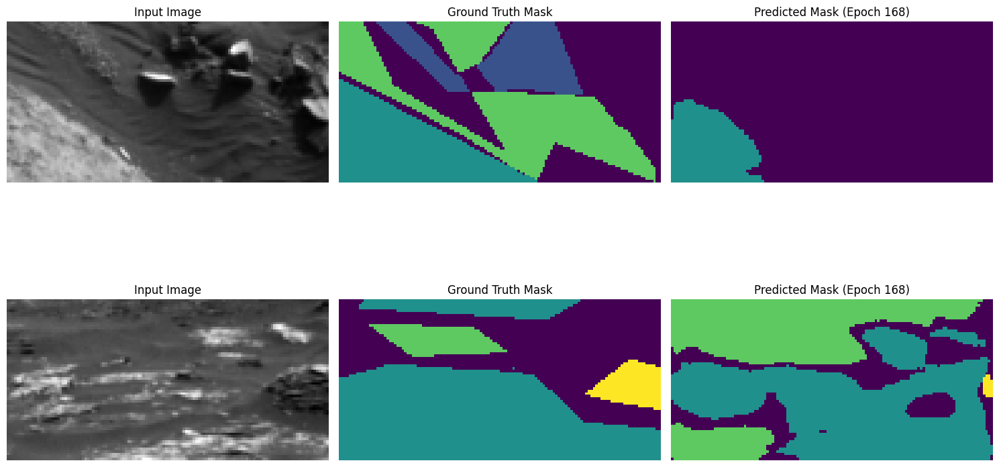

Epoch 169/250, Train Loss: 0.2709, Val Loss: 0.0778, Mean IoU: 0.4628
Class 0 IoU: 0.6506
Class 1 IoU: 0.4948
Class 2 IoU: 0.6101
Class 3 IoU: 0.0958


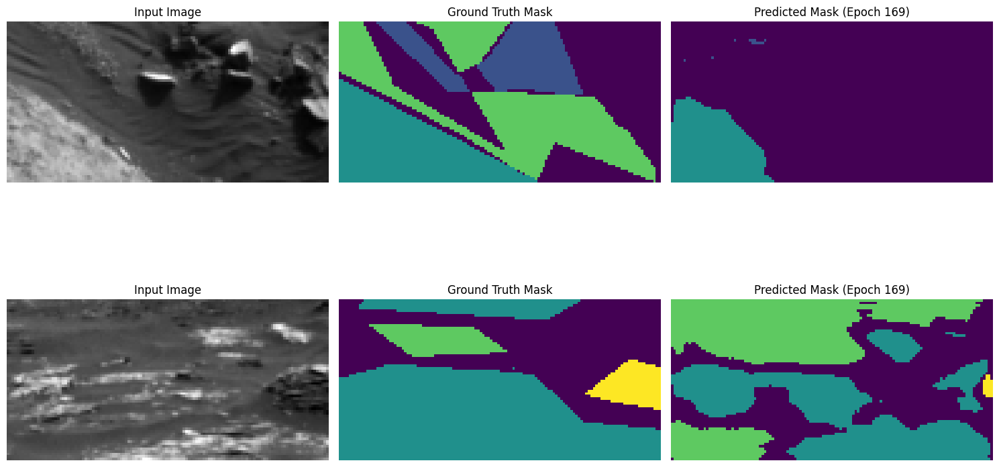

Epoch 170/250, Train Loss: 0.2764, Val Loss: 0.0766, Mean IoU: 0.4592
Class 0 IoU: 0.6272
Class 1 IoU: 0.4988
Class 2 IoU: 0.6064
Class 3 IoU: 0.1047


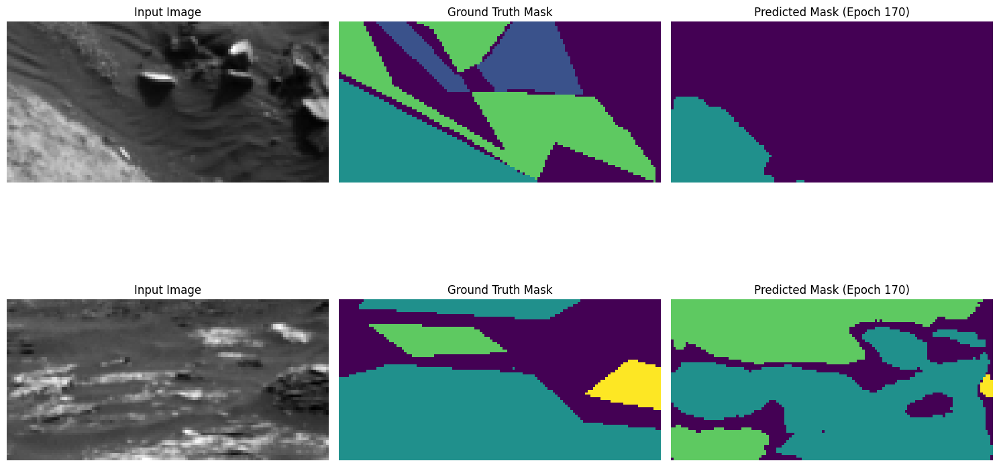

Epoch 171/250, Train Loss: 0.2684, Val Loss: 0.0774, Mean IoU: 0.4608
Class 0 IoU: 0.6372
Class 1 IoU: 0.4978
Class 2 IoU: 0.6041
Class 3 IoU: 0.1042


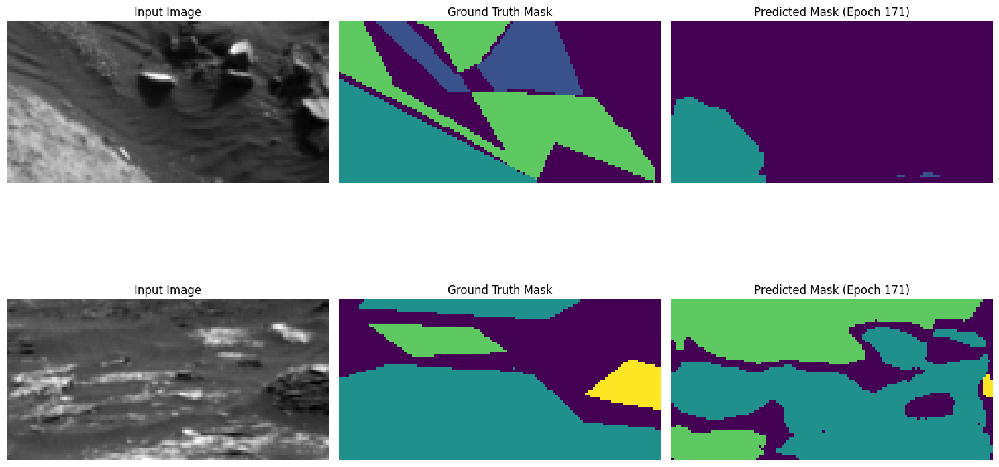

Epoch 172/250, Train Loss: 0.2677, Val Loss: 0.0761, Mean IoU: 0.4642
Class 0 IoU: 0.6393
Class 1 IoU: 0.4996
Class 2 IoU: 0.6105
Class 3 IoU: 0.1075


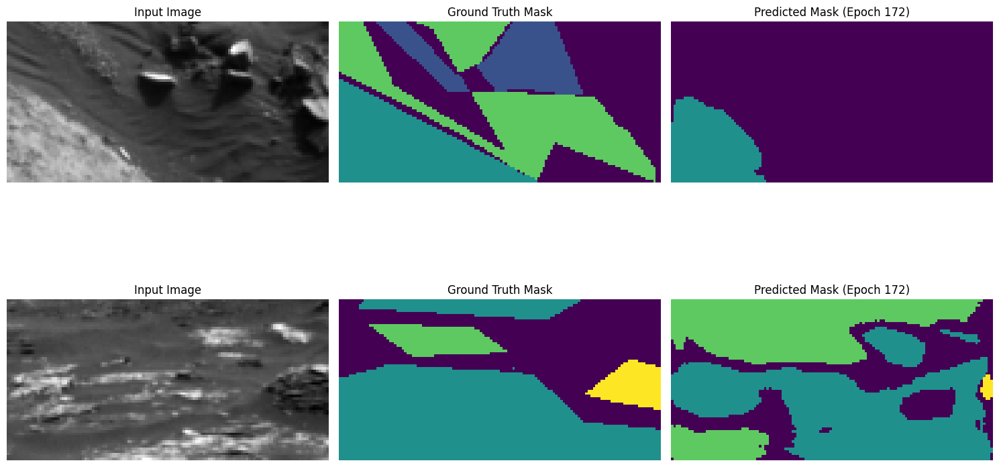

Epoch 173/250, Train Loss: 0.2708, Val Loss: 0.0776, Mean IoU: 0.4577
Class 0 IoU: 0.6354
Class 1 IoU: 0.4867
Class 2 IoU: 0.6175
Class 3 IoU: 0.0913


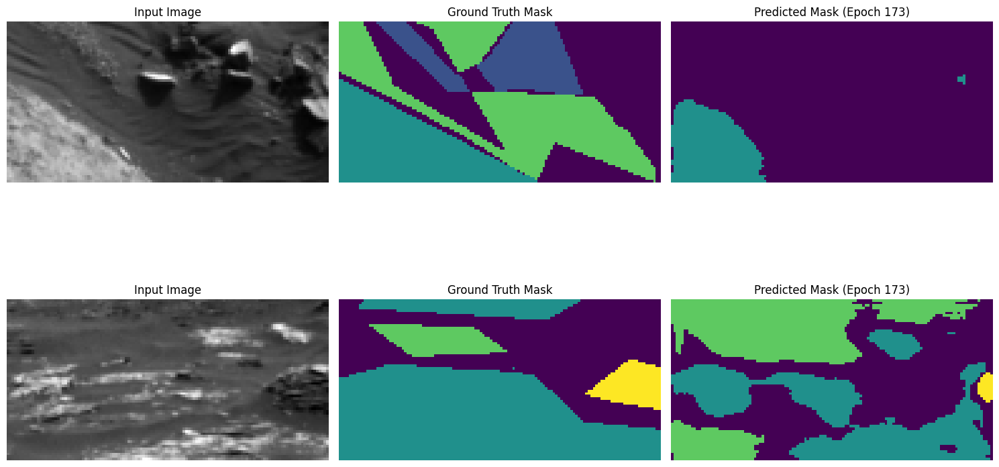

Epoch 174/250, Train Loss: 0.2657, Val Loss: 0.0769, Mean IoU: 0.4589
Class 0 IoU: 0.6351
Class 1 IoU: 0.4938
Class 2 IoU: 0.6055
Class 3 IoU: 0.1011


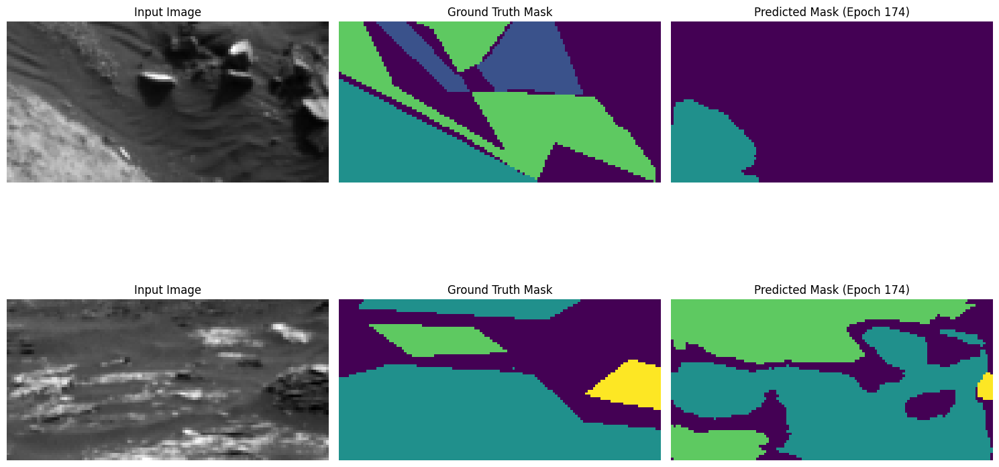

Epoch 175/250, Train Loss: 0.2671, Val Loss: 0.0784, Mean IoU: 0.4584
Class 0 IoU: 0.6363
Class 1 IoU: 0.4835
Class 2 IoU: 0.6193
Class 3 IoU: 0.0945


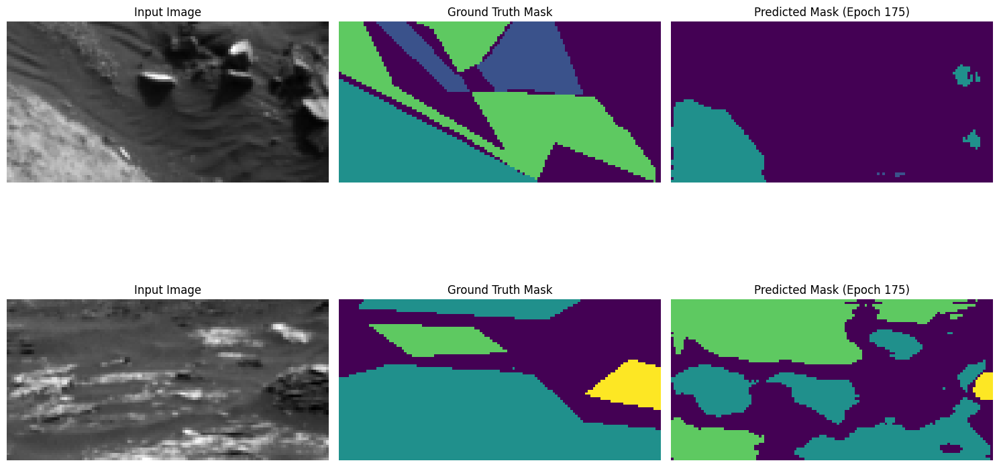

Epoch 176/250, Train Loss: 0.2686, Val Loss: 0.0785, Mean IoU: 0.4672
Class 0 IoU: 0.6488
Class 1 IoU: 0.5016
Class 2 IoU: 0.6257
Class 3 IoU: 0.0925


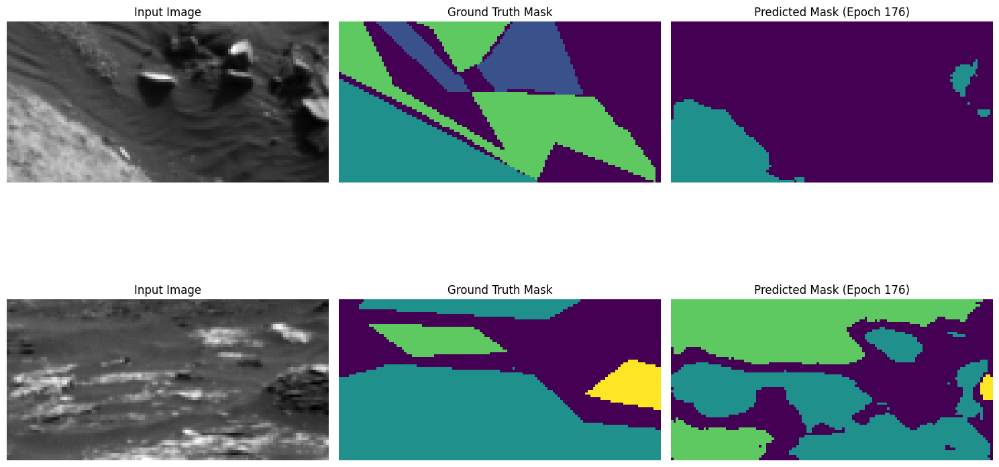

Epoch 177/250, Train Loss: 0.2627, Val Loss: 0.0776, Mean IoU: 0.4599
Class 0 IoU: 0.6365
Class 1 IoU: 0.4931
Class 2 IoU: 0.6016
Class 3 IoU: 0.1083


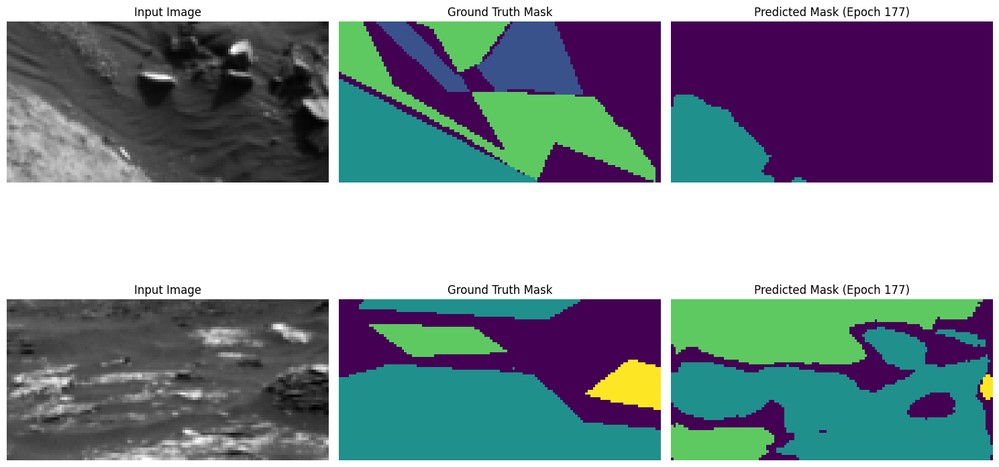

Epoch 178/250, Train Loss: 0.2657, Val Loss: 0.0811, Mean IoU: 0.4605
Class 0 IoU: 0.6359
Class 1 IoU: 0.4943
Class 2 IoU: 0.6052
Class 3 IoU: 0.1067


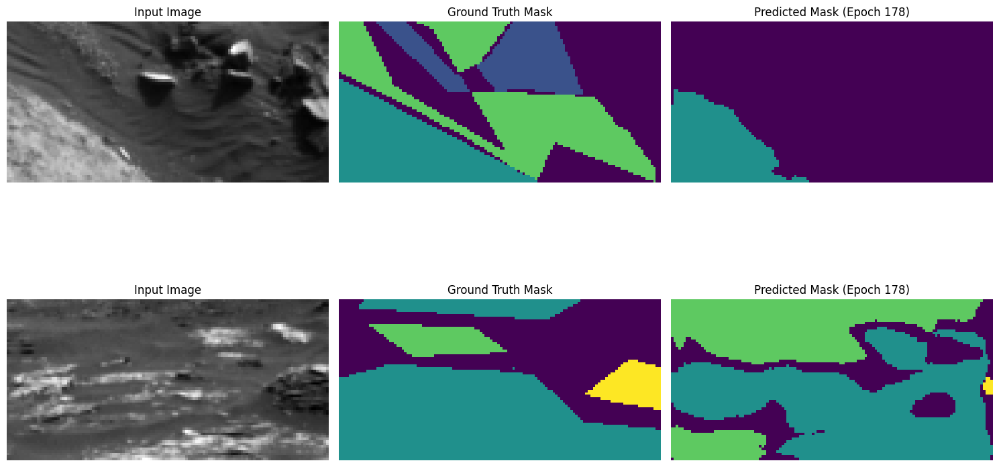

Epoch 179/250, Train Loss: 0.2664, Val Loss: 0.0798, Mean IoU: 0.4612
Class 0 IoU: 0.6351
Class 1 IoU: 0.4962
Class 2 IoU: 0.6088
Class 3 IoU: 0.1049


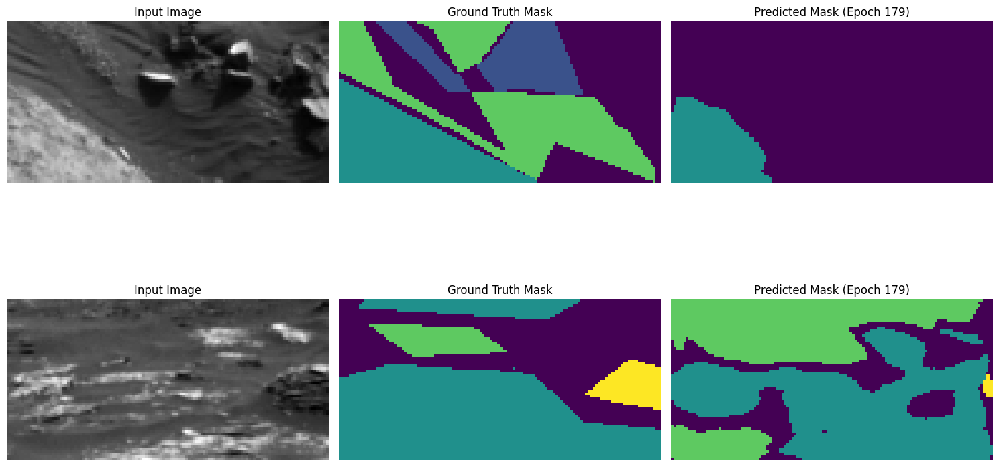

Epoch 180/250, Train Loss: 0.2665, Val Loss: 0.0757, Mean IoU: 0.4644
Class 0 IoU: 0.6402
Class 1 IoU: 0.4950
Class 2 IoU: 0.6083
Class 3 IoU: 0.1141


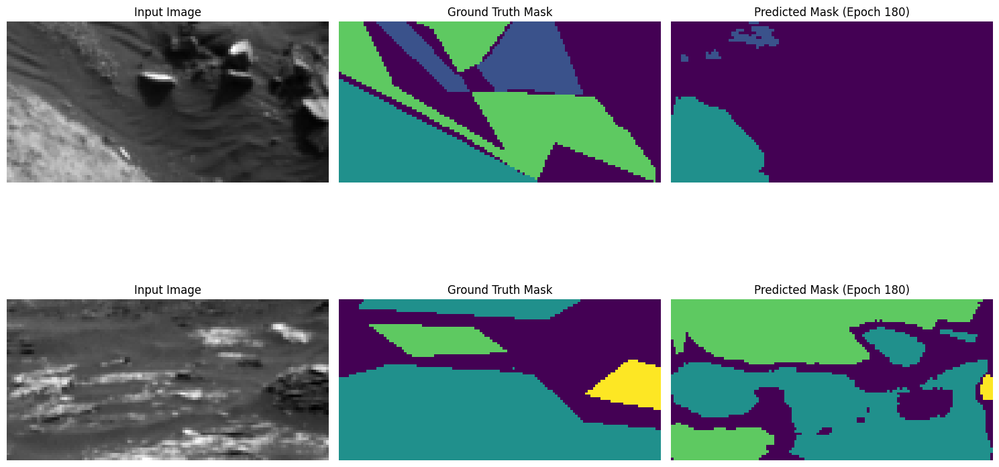

Epoch 181/250, Train Loss: 0.2660, Val Loss: 0.0758, Mean IoU: 0.4613
Class 0 IoU: 0.6388
Class 1 IoU: 0.4961
Class 2 IoU: 0.6073
Class 3 IoU: 0.1030


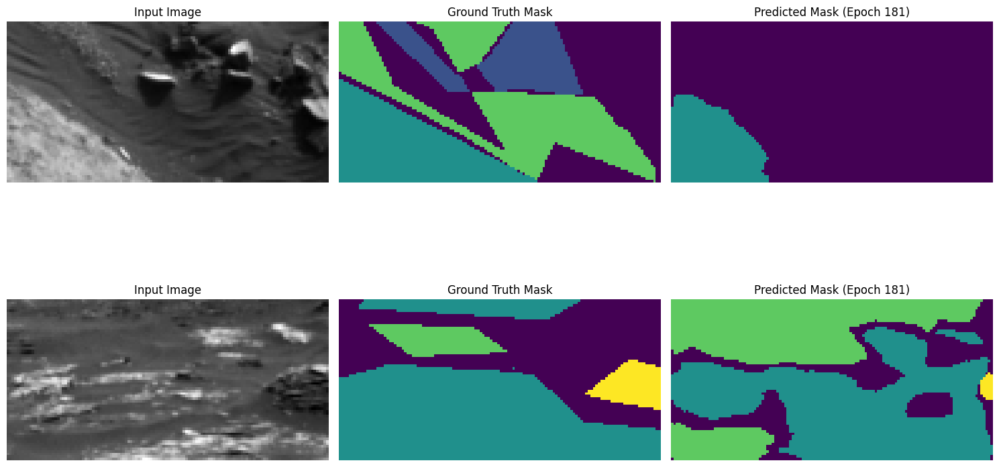

Epoch 182/250, Train Loss: 0.2633, Val Loss: 0.0781, Mean IoU: 0.4653
Class 0 IoU: 0.6485
Class 1 IoU: 0.4991
Class 2 IoU: 0.6153
Class 3 IoU: 0.0983


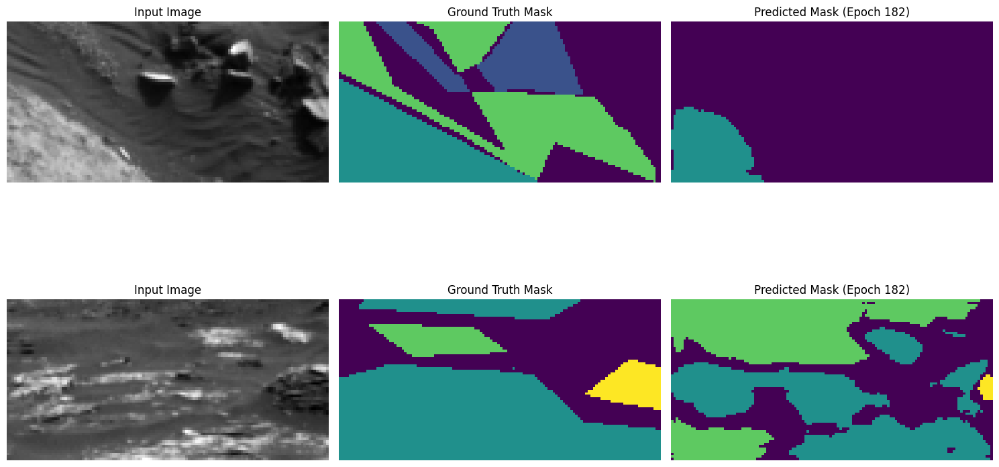

Epoch 183/250, Train Loss: 0.2602, Val Loss: 0.0803, Mean IoU: 0.4604
Class 0 IoU: 0.6336
Class 1 IoU: 0.4903
Class 2 IoU: 0.6055
Class 3 IoU: 0.1123


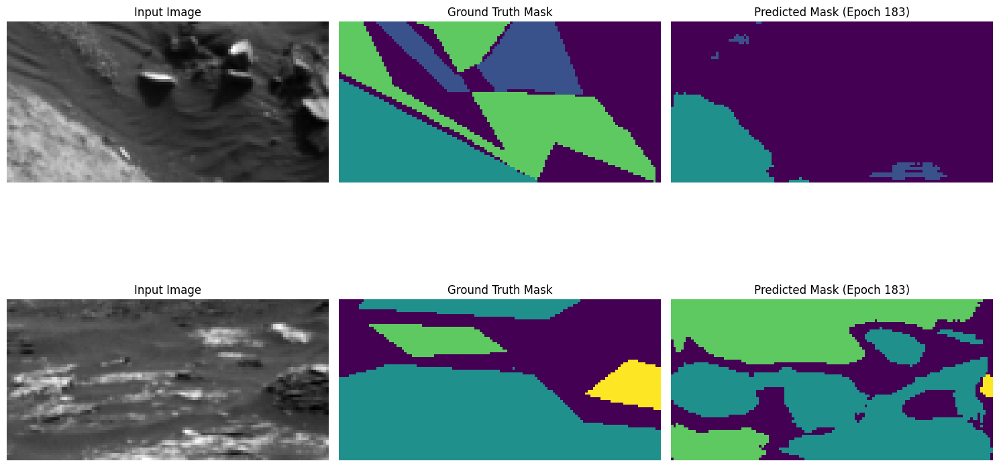

Epoch 184/250, Train Loss: 0.2698, Val Loss: 0.0787, Mean IoU: 0.4618
Class 0 IoU: 0.6433
Class 1 IoU: 0.4923
Class 2 IoU: 0.6045
Class 3 IoU: 0.1069


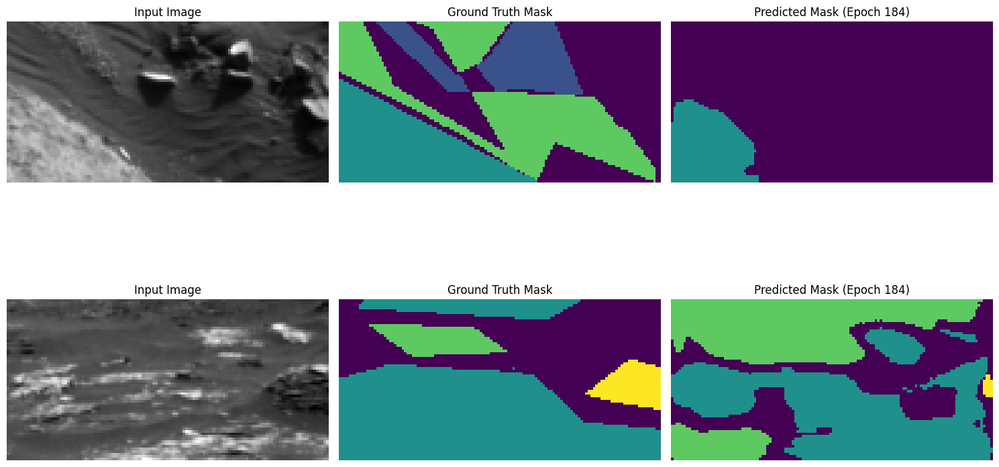

Epoch 185/250, Train Loss: 0.2607, Val Loss: 0.0802, Mean IoU: 0.4623
Class 0 IoU: 0.6440
Class 1 IoU: 0.4974
Class 2 IoU: 0.6080
Class 3 IoU: 0.0999


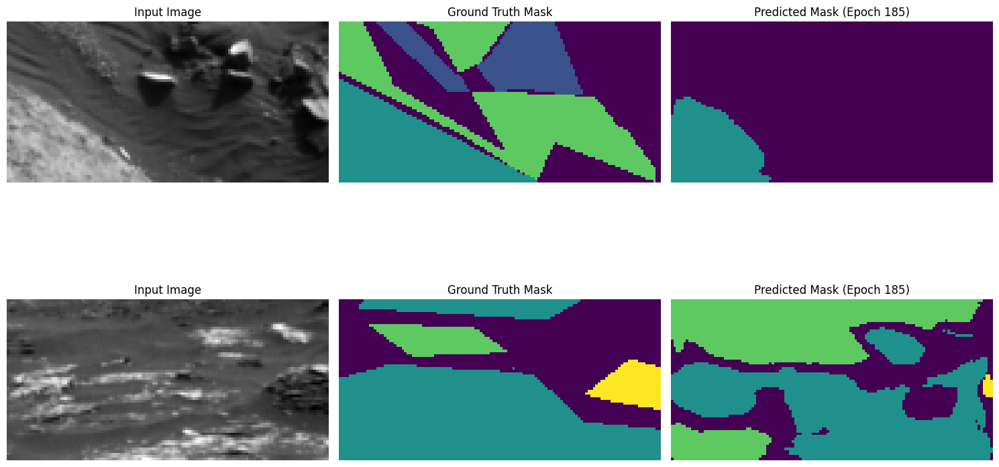

Epoch 186/250, Train Loss: 0.2639, Val Loss: 0.0807, Mean IoU: 0.4582
Class 0 IoU: 0.6377
Class 1 IoU: 0.5011
Class 2 IoU: 0.5883
Class 3 IoU: 0.1058


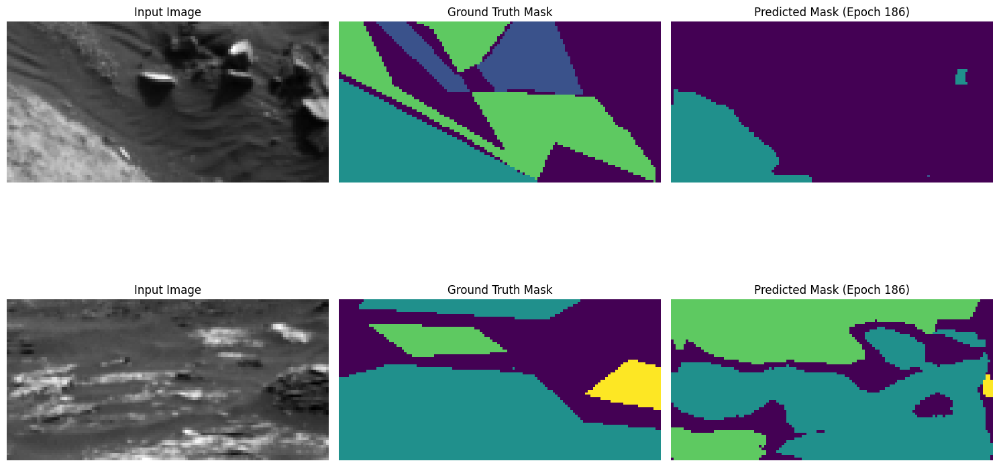

Epoch 187/250, Train Loss: 0.2602, Val Loss: 0.0814, Mean IoU: 0.4593
Class 0 IoU: 0.6305
Class 1 IoU: 0.4952
Class 2 IoU: 0.6035
Class 3 IoU: 0.1079


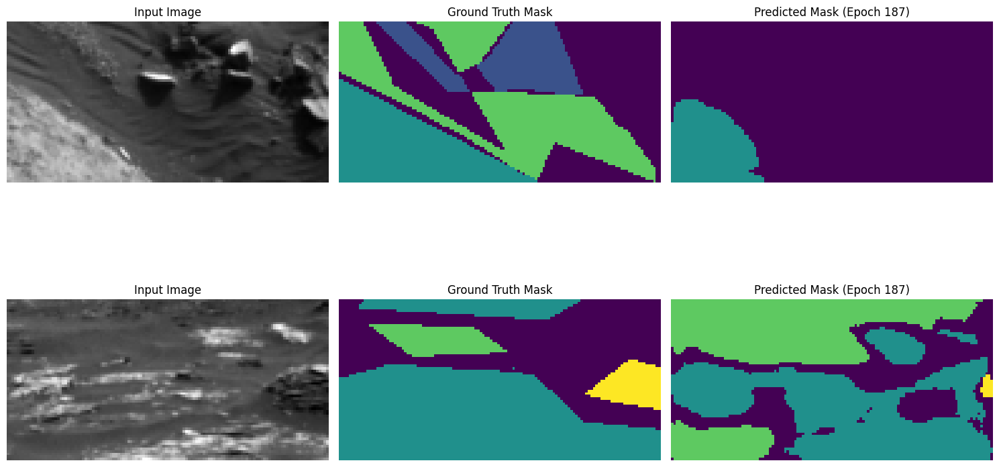

Epoch 188/250, Train Loss: 0.2586, Val Loss: 0.0804, Mean IoU: 0.4585
Class 0 IoU: 0.6381
Class 1 IoU: 0.4947
Class 2 IoU: 0.6027
Class 3 IoU: 0.0986


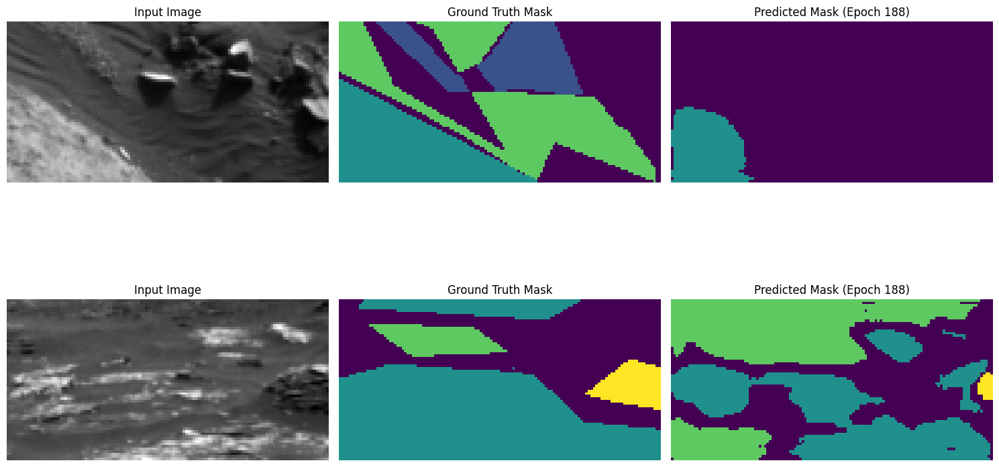

Epoch 189/250, Train Loss: 0.2633, Val Loss: 0.0800, Mean IoU: 0.4579
Class 0 IoU: 0.6394
Class 1 IoU: 0.4890
Class 2 IoU: 0.5962
Class 3 IoU: 0.1071


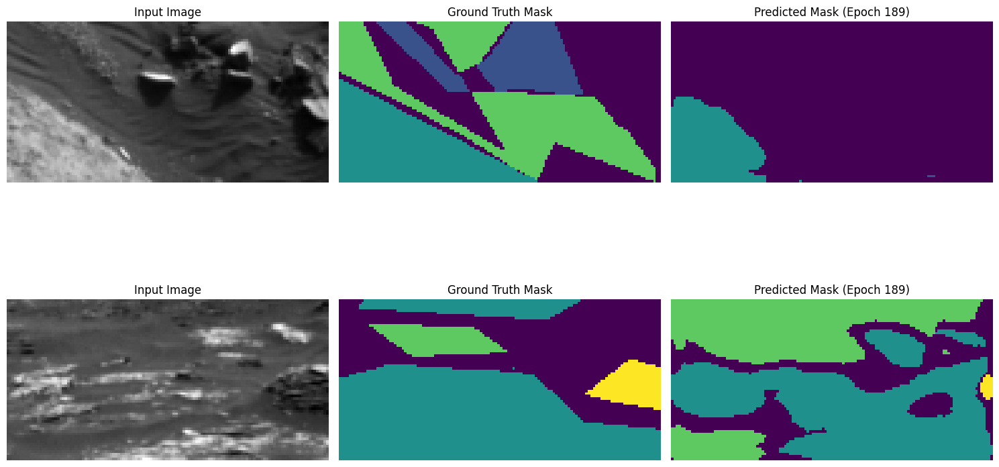

Epoch 190/250, Train Loss: 0.2674, Val Loss: 0.0804, Mean IoU: 0.4561
Class 0 IoU: 0.6350
Class 1 IoU: 0.4889
Class 2 IoU: 0.6028
Class 3 IoU: 0.0976


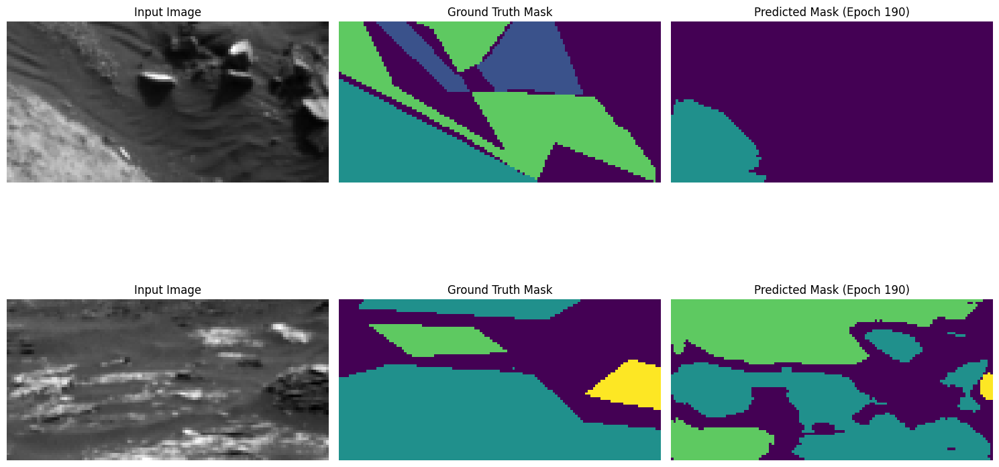

Epoch 191/250, Train Loss: 0.2665, Val Loss: 0.0819, Mean IoU: 0.4615
Class 0 IoU: 0.6367
Class 1 IoU: 0.4977
Class 2 IoU: 0.6013
Class 3 IoU: 0.1104


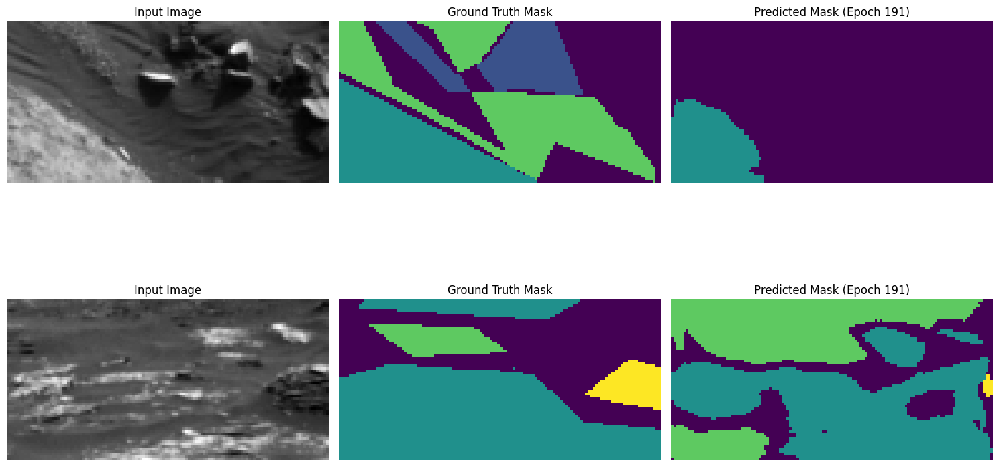

Epoch 192/250, Train Loss: 0.2670, Val Loss: 0.0823, Mean IoU: 0.4575
Class 0 IoU: 0.6291
Class 1 IoU: 0.4884
Class 2 IoU: 0.6017
Class 3 IoU: 0.1105


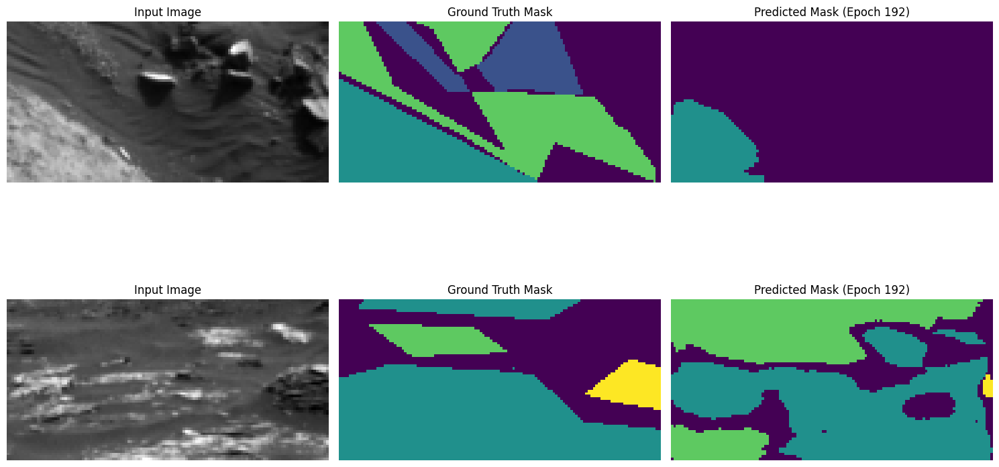

Epoch 193/250, Train Loss: 0.2620, Val Loss: 0.0772, Mean IoU: 0.4600
Class 0 IoU: 0.6325
Class 1 IoU: 0.4907
Class 2 IoU: 0.6026
Class 3 IoU: 0.1143


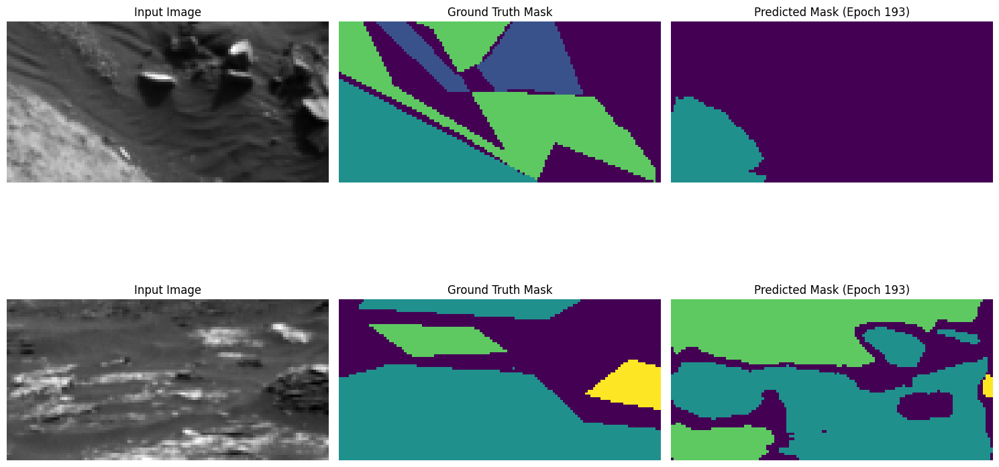

Epoch 194/250, Train Loss: 0.2623, Val Loss: 0.0798, Mean IoU: 0.4578
Class 0 IoU: 0.6271
Class 1 IoU: 0.4934
Class 2 IoU: 0.6008
Class 3 IoU: 0.1098


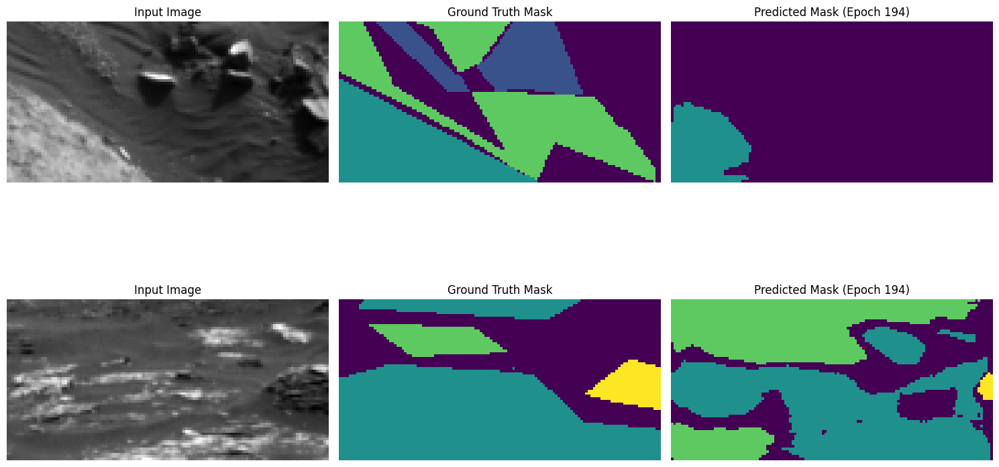

Epoch 195/250, Train Loss: 0.2642, Val Loss: 0.0798, Mean IoU: 0.4616
Class 0 IoU: 0.6321
Class 1 IoU: 0.4965
Class 2 IoU: 0.6047
Class 3 IoU: 0.1130


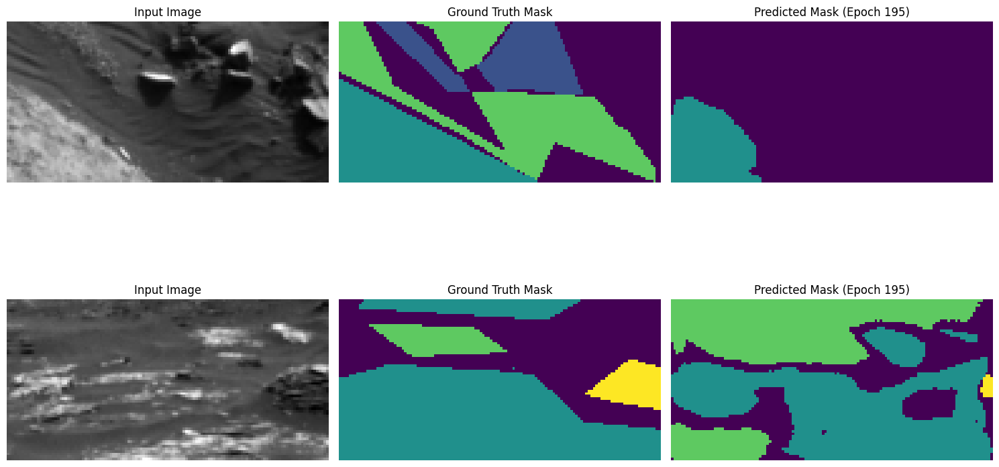

Epoch 196/250, Train Loss: 0.2595, Val Loss: 0.0796, Mean IoU: 0.4628
Class 0 IoU: 0.6390
Class 1 IoU: 0.4978
Class 2 IoU: 0.6041
Class 3 IoU: 0.1101


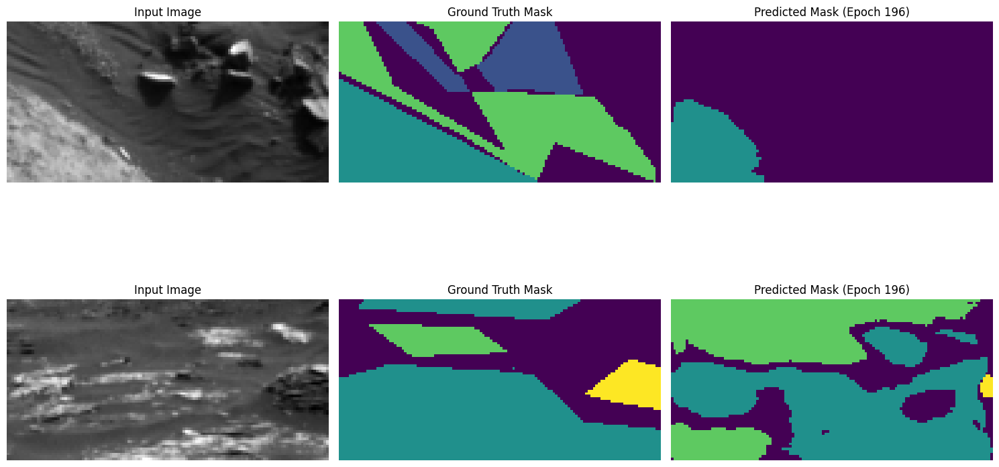

Epoch 197/250, Train Loss: 0.2579, Val Loss: 0.0807, Mean IoU: 0.4604
Class 0 IoU: 0.6501
Class 1 IoU: 0.4850
Class 2 IoU: 0.6148
Class 3 IoU: 0.0915


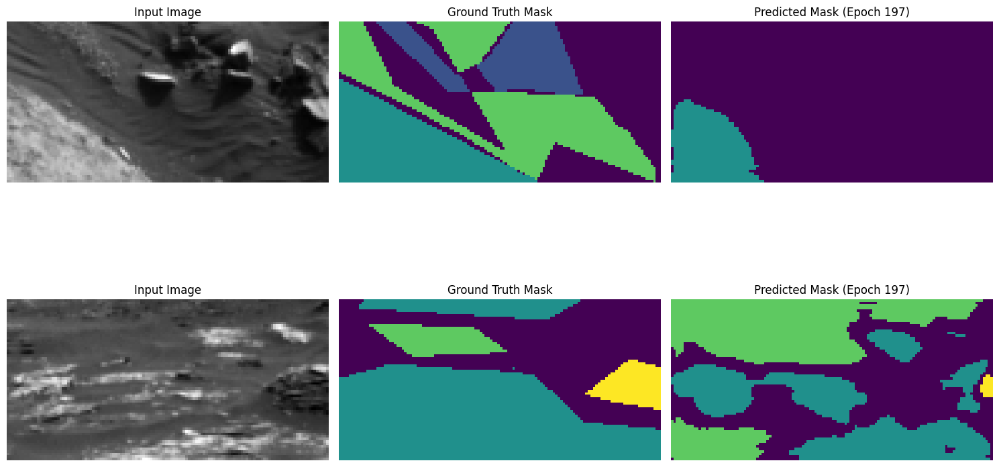

Epoch 198/250, Train Loss: 0.2583, Val Loss: 0.0829, Mean IoU: 0.4565
Class 0 IoU: 0.6312
Class 1 IoU: 0.4875
Class 2 IoU: 0.5996
Class 3 IoU: 0.1079


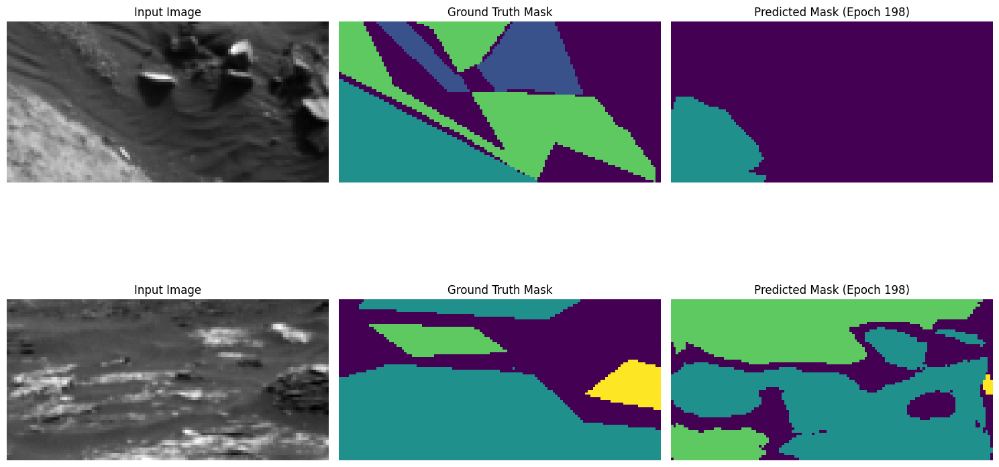

Epoch 199/250, Train Loss: 0.2569, Val Loss: 0.0818, Mean IoU: 0.4614
Class 0 IoU: 0.6334
Class 1 IoU: 0.4991
Class 2 IoU: 0.6041
Class 3 IoU: 0.1090


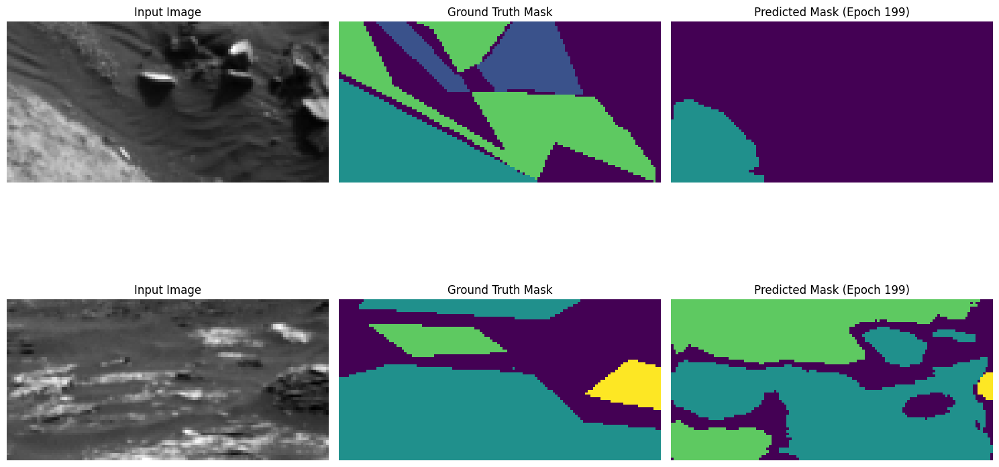

Epoch 200/250, Train Loss: 0.2652, Val Loss: 0.0819, Mean IoU: 0.4606
Class 0 IoU: 0.6322
Class 1 IoU: 0.4986
Class 2 IoU: 0.6041
Class 3 IoU: 0.1076


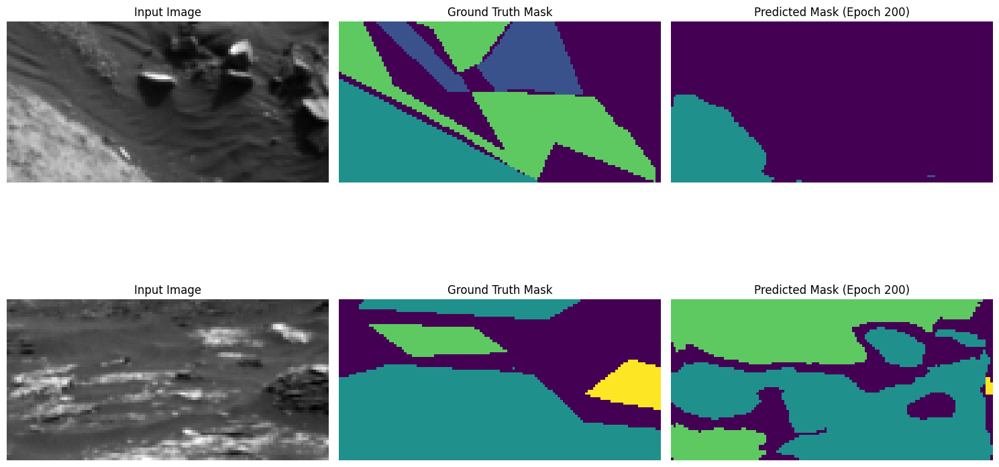

Epoch 201/250, Train Loss: 0.2611, Val Loss: 0.0798, Mean IoU: 0.4566
Class 0 IoU: 0.6213
Class 1 IoU: 0.4901
Class 2 IoU: 0.6057
Class 3 IoU: 0.1093


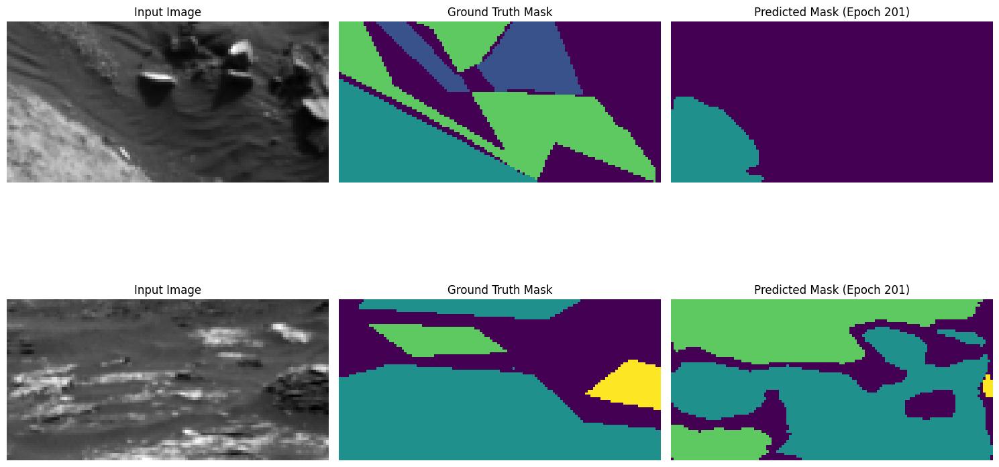

Epoch 202/250, Train Loss: 0.2639, Val Loss: 0.0796, Mean IoU: 0.4597
Class 0 IoU: 0.6388
Class 1 IoU: 0.4922
Class 2 IoU: 0.6024
Class 3 IoU: 0.1054


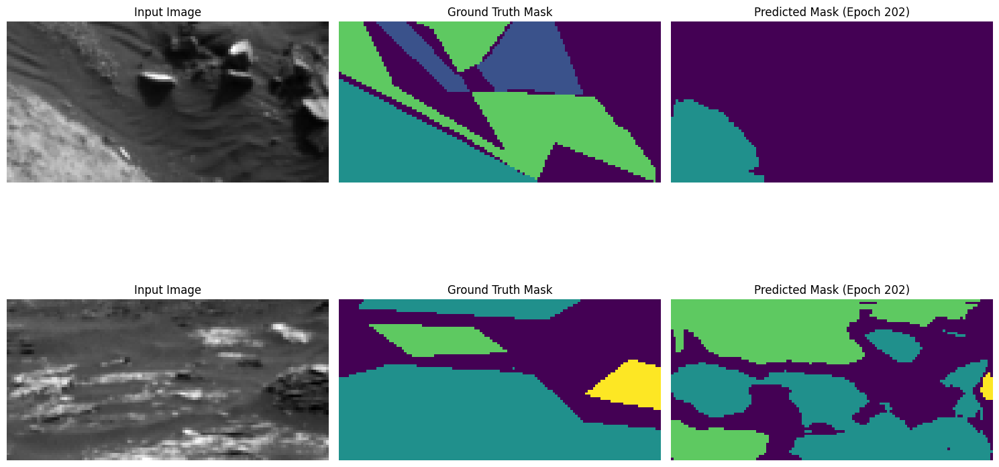

Epoch 203/250, Train Loss: 0.2561, Val Loss: 0.0809, Mean IoU: 0.4614
Class 0 IoU: 0.6417
Class 1 IoU: 0.4889
Class 2 IoU: 0.6022
Class 3 IoU: 0.1127


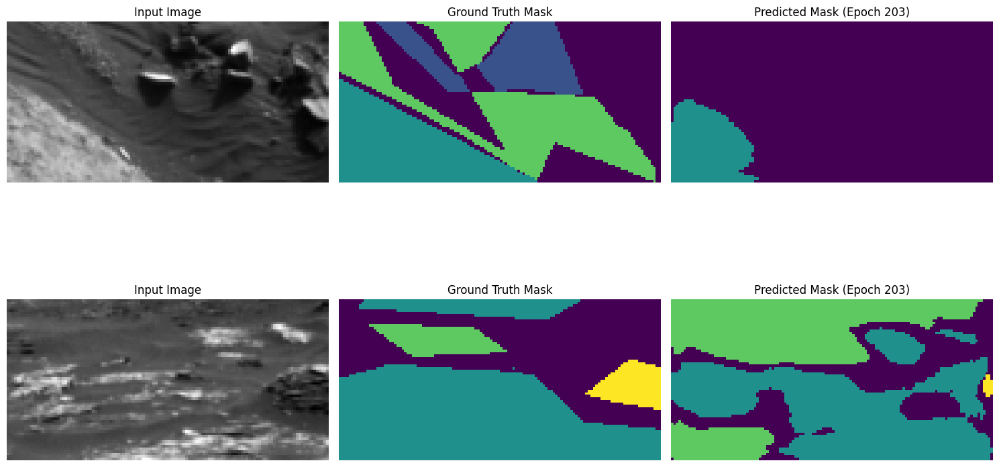

Epoch 204/250, Train Loss: 0.2584, Val Loss: 0.0818, Mean IoU: 0.4625
Class 0 IoU: 0.6329
Class 1 IoU: 0.4969
Class 2 IoU: 0.6015
Class 3 IoU: 0.1187


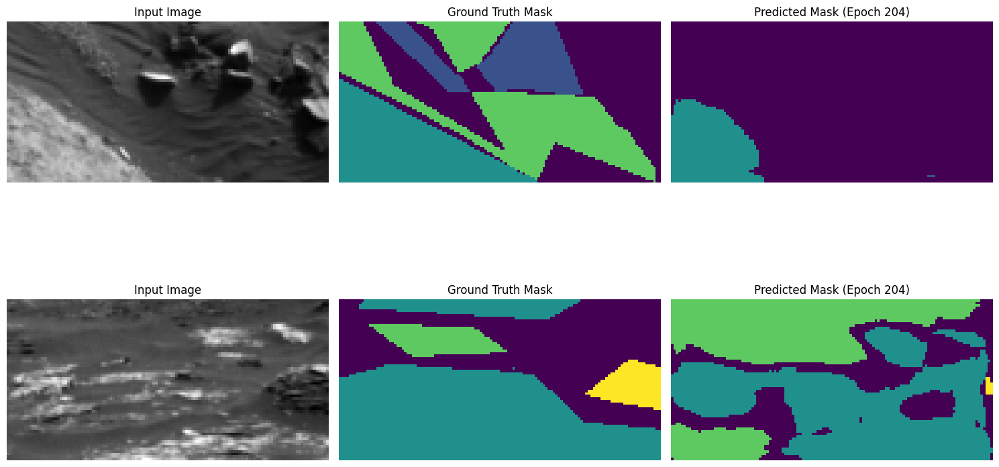

Epoch 205/250, Train Loss: 0.2640, Val Loss: 0.0799, Mean IoU: 0.4633
Class 0 IoU: 0.6448
Class 1 IoU: 0.4905
Class 2 IoU: 0.6152
Class 3 IoU: 0.1027


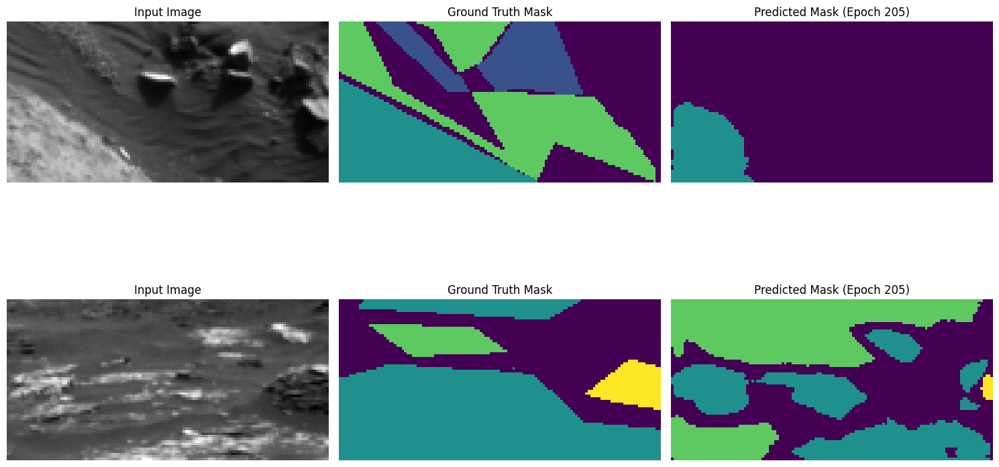

Epoch 206/250, Train Loss: 0.2584, Val Loss: 0.0811, Mean IoU: 0.4606
Class 0 IoU: 0.6432
Class 1 IoU: 0.4961
Class 2 IoU: 0.5949
Class 3 IoU: 0.1080


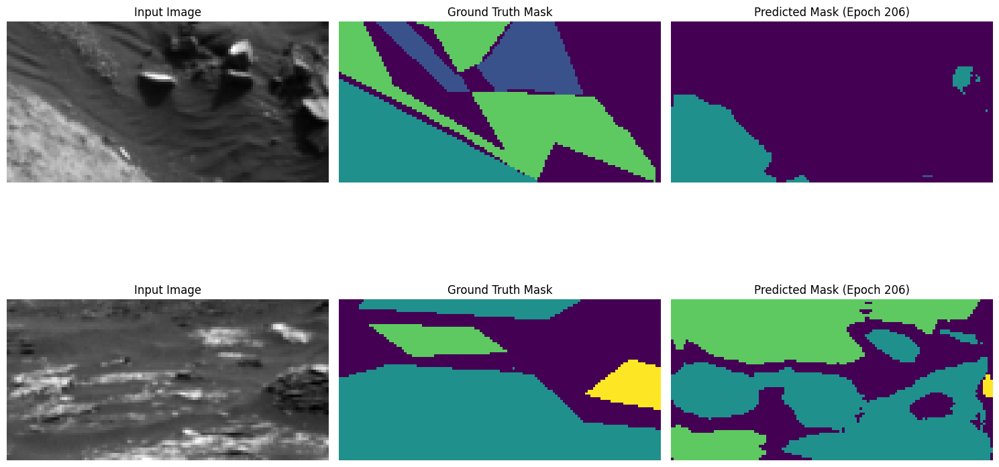

Epoch 207/250, Train Loss: 0.2607, Val Loss: 0.0804, Mean IoU: 0.4637
Class 0 IoU: 0.6417
Class 1 IoU: 0.4907
Class 2 IoU: 0.6201
Class 3 IoU: 0.1022


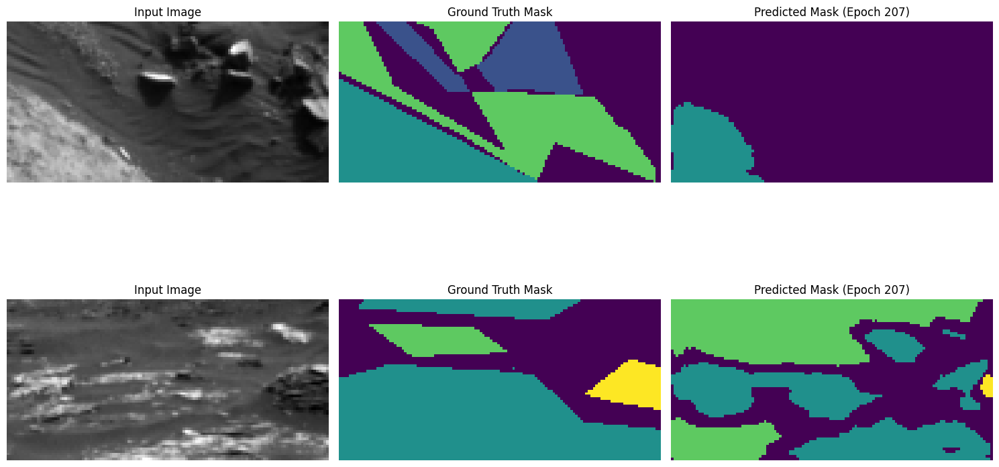

Epoch 208/250, Train Loss: 0.2622, Val Loss: 0.0833, Mean IoU: 0.4561
Class 0 IoU: 0.6285
Class 1 IoU: 0.4889
Class 2 IoU: 0.5984
Class 3 IoU: 0.1087


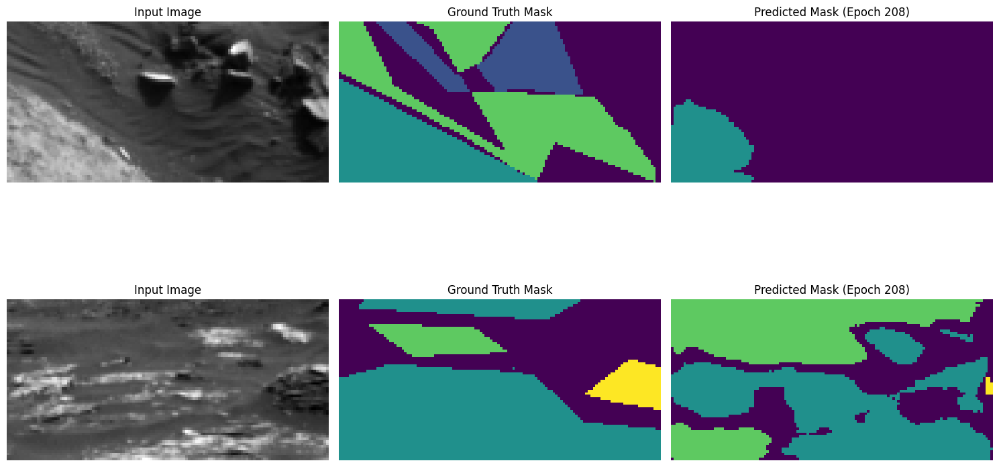

Epoch 209/250, Train Loss: 0.2671, Val Loss: 0.0820, Mean IoU: 0.4564
Class 0 IoU: 0.6377
Class 1 IoU: 0.4746
Class 2 IoU: 0.6204
Class 3 IoU: 0.0929


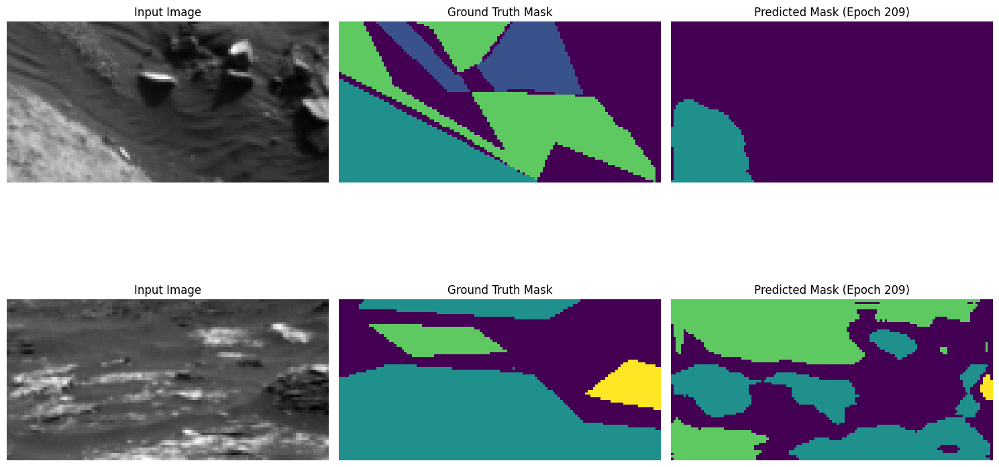

Epoch 210/250, Train Loss: 0.2539, Val Loss: 0.0824, Mean IoU: 0.4615
Class 0 IoU: 0.6371
Class 1 IoU: 0.4980
Class 2 IoU: 0.5945
Class 3 IoU: 0.1164


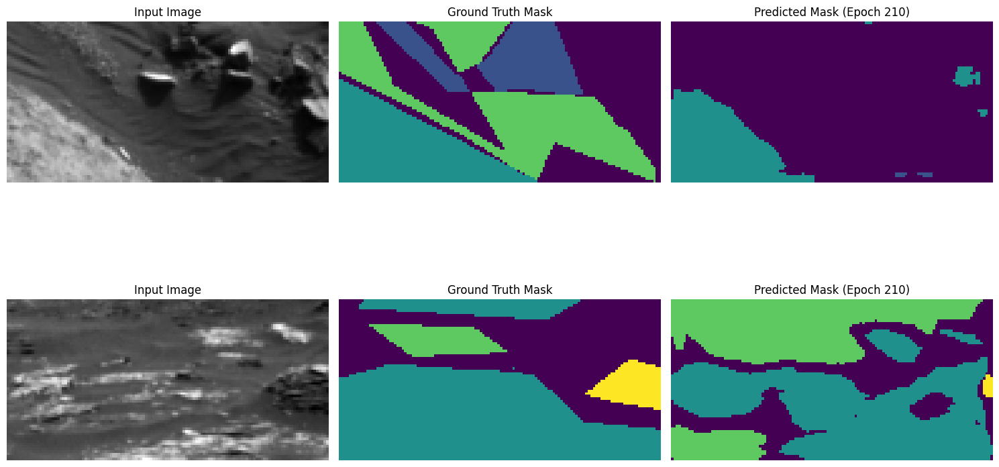

Epoch 211/250, Train Loss: 0.2638, Val Loss: 0.0810, Mean IoU: 0.4591
Class 0 IoU: 0.6377
Class 1 IoU: 0.4849
Class 2 IoU: 0.6132
Class 3 IoU: 0.1005


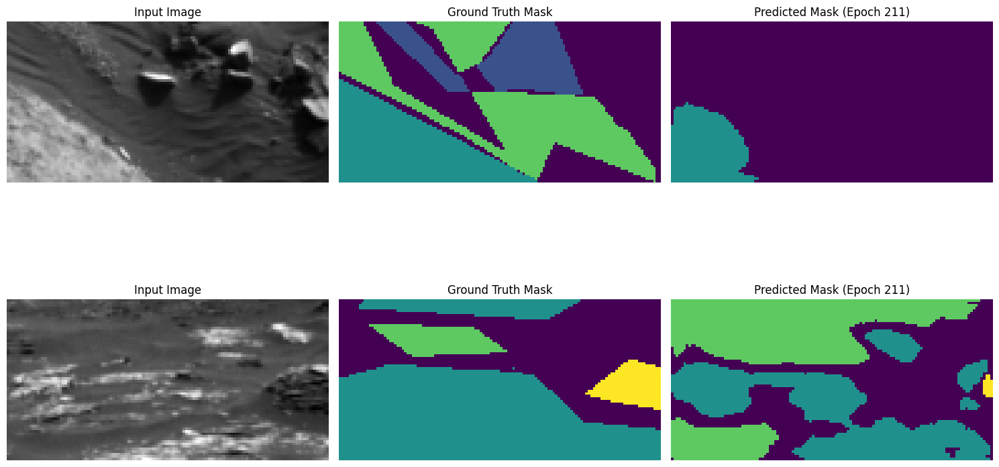

Epoch 212/250, Train Loss: 0.2589, Val Loss: 0.0803, Mean IoU: 0.4590
Class 0 IoU: 0.6406
Class 1 IoU: 0.4890
Class 2 IoU: 0.6065
Class 3 IoU: 0.1001


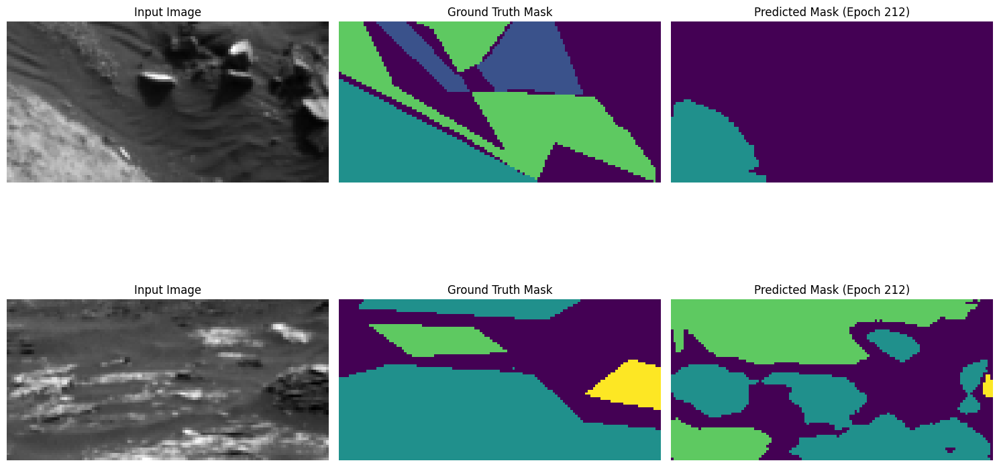

Epoch 213/250, Train Loss: 0.2592, Val Loss: 0.0825, Mean IoU: 0.4596
Class 0 IoU: 0.6289
Class 1 IoU: 0.4961
Class 2 IoU: 0.6021
Class 3 IoU: 0.1111


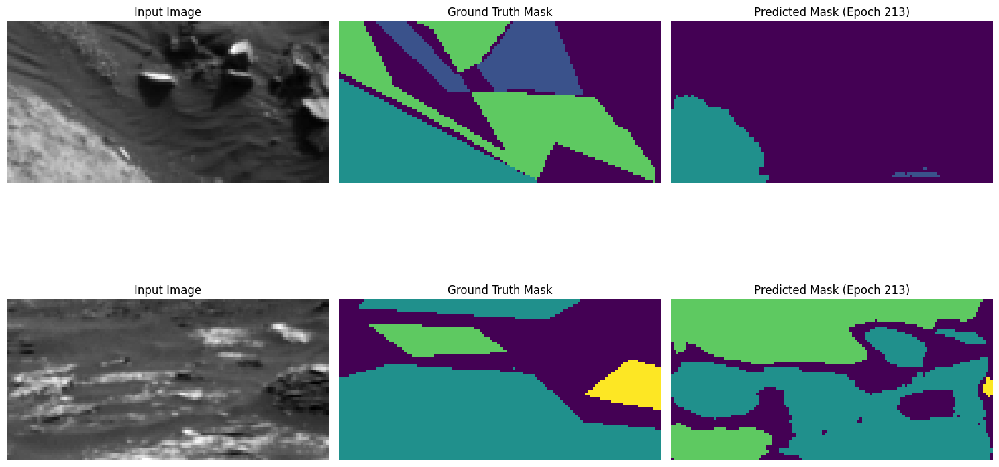

Epoch 214/250, Train Loss: 0.2587, Val Loss: 0.0807, Mean IoU: 0.4610
Class 0 IoU: 0.6411
Class 1 IoU: 0.4964
Class 2 IoU: 0.6115
Class 3 IoU: 0.0948


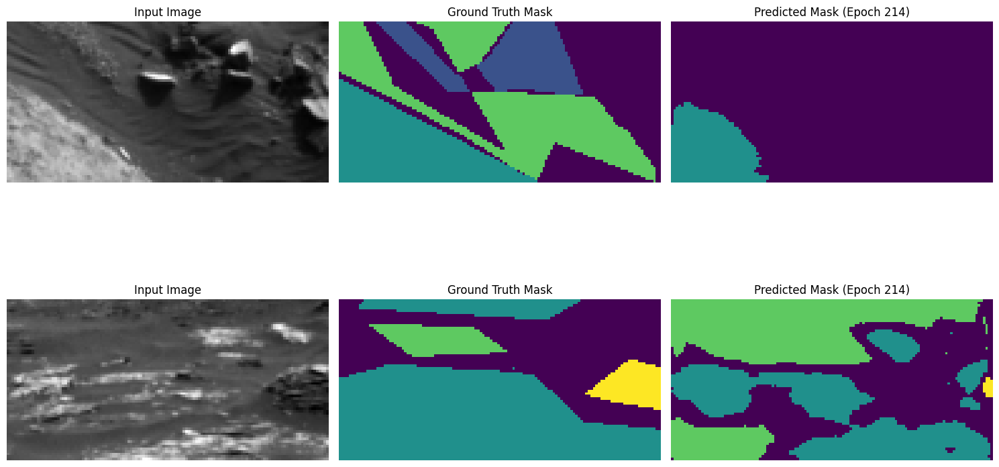

Epoch 215/250, Train Loss: 0.2590, Val Loss: 0.0788, Mean IoU: 0.4623
Class 0 IoU: 0.6447
Class 1 IoU: 0.4936
Class 2 IoU: 0.6063
Class 3 IoU: 0.1047


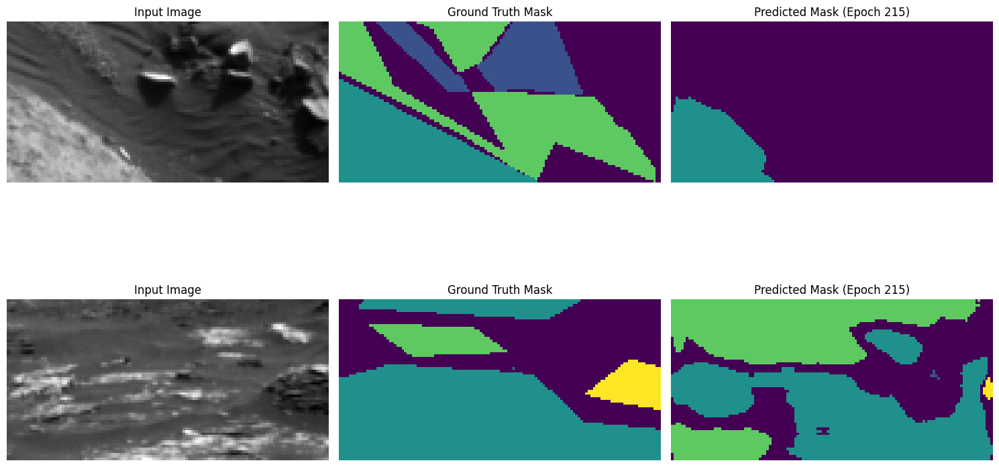

Epoch 216/250, Train Loss: 0.2617, Val Loss: 0.0848, Mean IoU: 0.4552
Class 0 IoU: 0.6226
Class 1 IoU: 0.4961
Class 2 IoU: 0.5980
Class 3 IoU: 0.1041


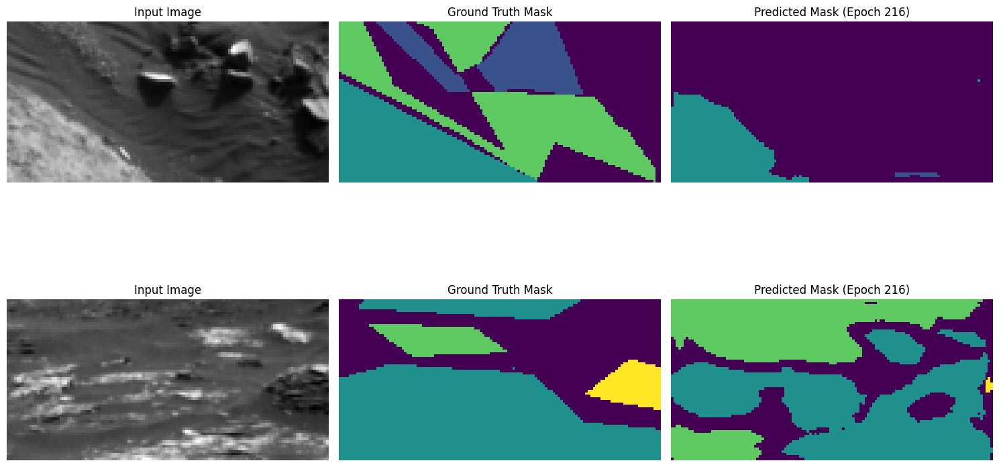

Epoch 217/250, Train Loss: 0.2563, Val Loss: 0.0824, Mean IoU: 0.4636
Class 0 IoU: 0.6437
Class 1 IoU: 0.4791
Class 2 IoU: 0.6206
Class 3 IoU: 0.1108


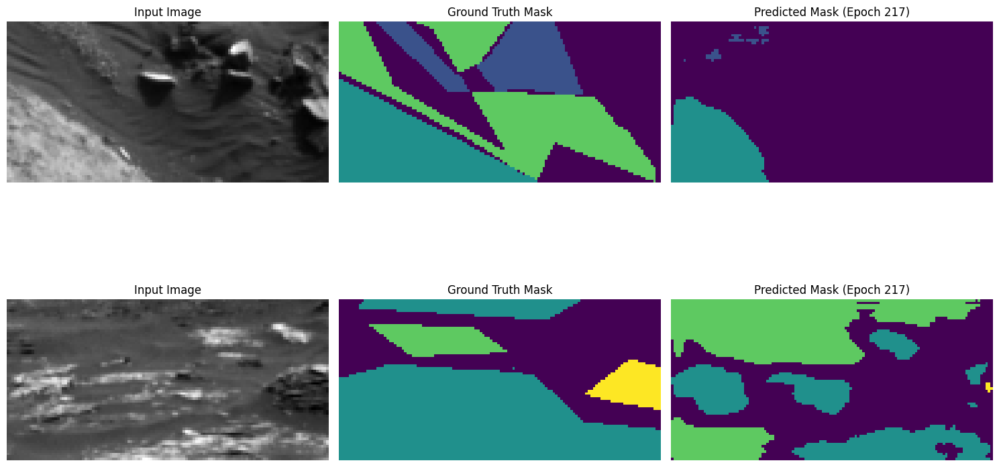

Epoch 218/250, Train Loss: 0.2565, Val Loss: 0.0774, Mean IoU: 0.4557
Class 0 IoU: 0.6407
Class 1 IoU: 0.4835
Class 2 IoU: 0.6088
Class 3 IoU: 0.0897


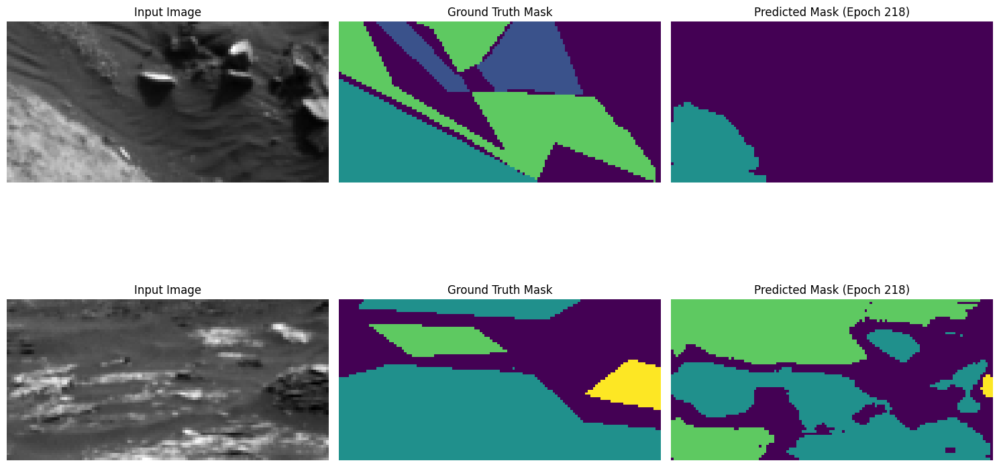

Epoch 219/250, Train Loss: 0.2604, Val Loss: 0.0792, Mean IoU: 0.4600
Class 0 IoU: 0.6390
Class 1 IoU: 0.4884
Class 2 IoU: 0.6049
Class 3 IoU: 0.1077


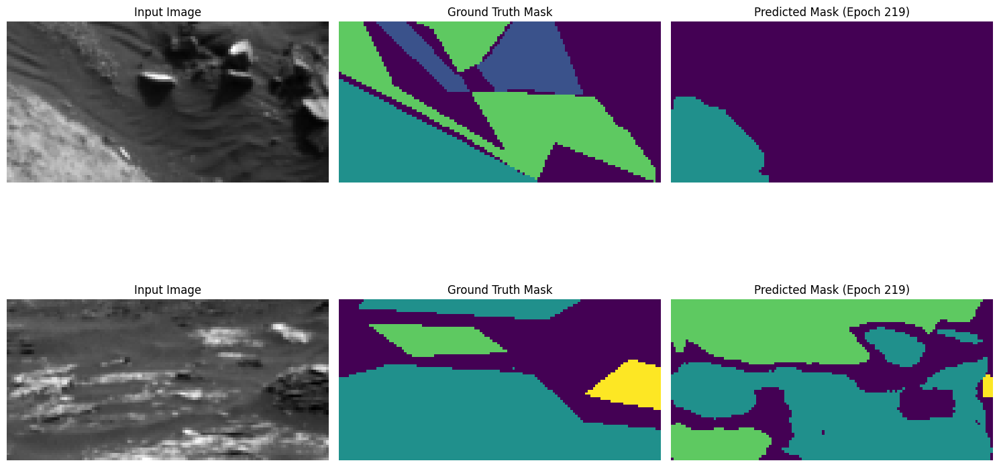

Epoch 220/250, Train Loss: 0.2551, Val Loss: 0.0791, Mean IoU: 0.4583
Class 0 IoU: 0.6266
Class 1 IoU: 0.4945
Class 2 IoU: 0.6034
Class 3 IoU: 0.1088


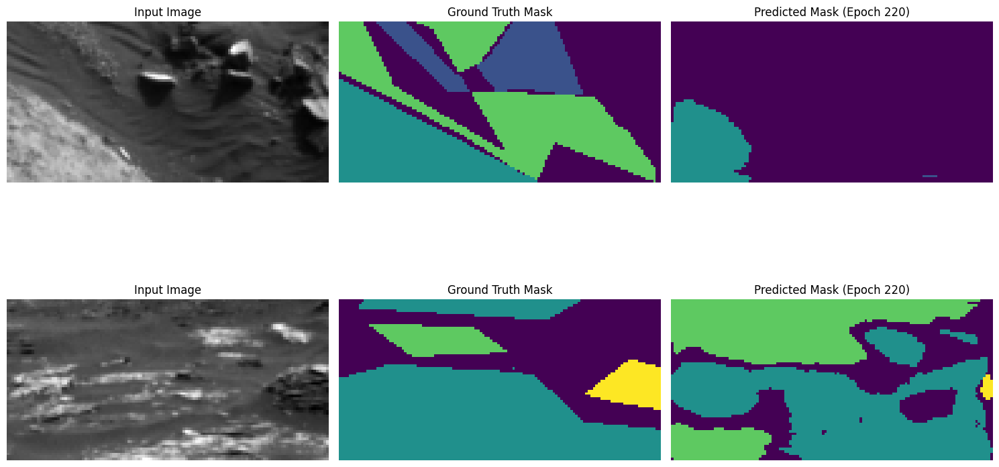

Epoch 221/250, Train Loss: 0.2526, Val Loss: 0.0815, Mean IoU: 0.4561
Class 0 IoU: 0.6323
Class 1 IoU: 0.4858
Class 2 IoU: 0.5998
Class 3 IoU: 0.1065


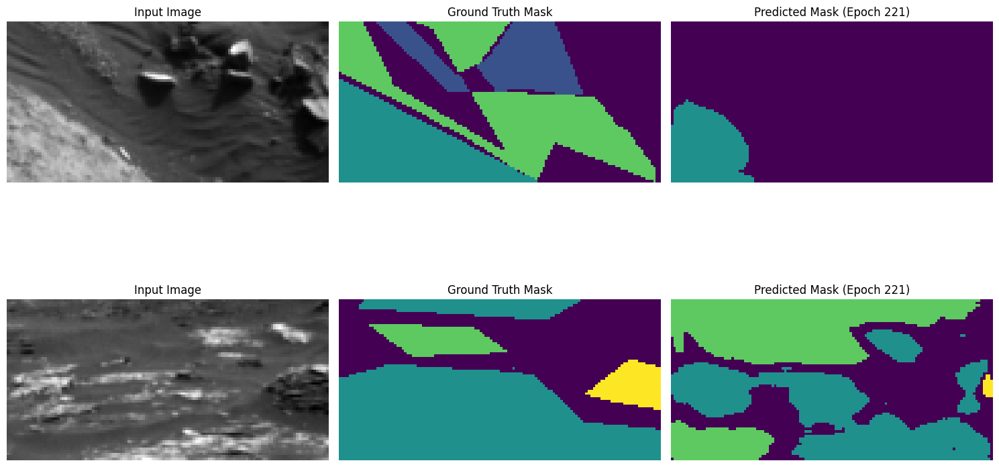

Epoch 222/250, Train Loss: 0.2619, Val Loss: 0.0806, Mean IoU: 0.4631
Class 0 IoU: 0.6459
Class 1 IoU: 0.4937
Class 2 IoU: 0.6125
Class 3 IoU: 0.1002


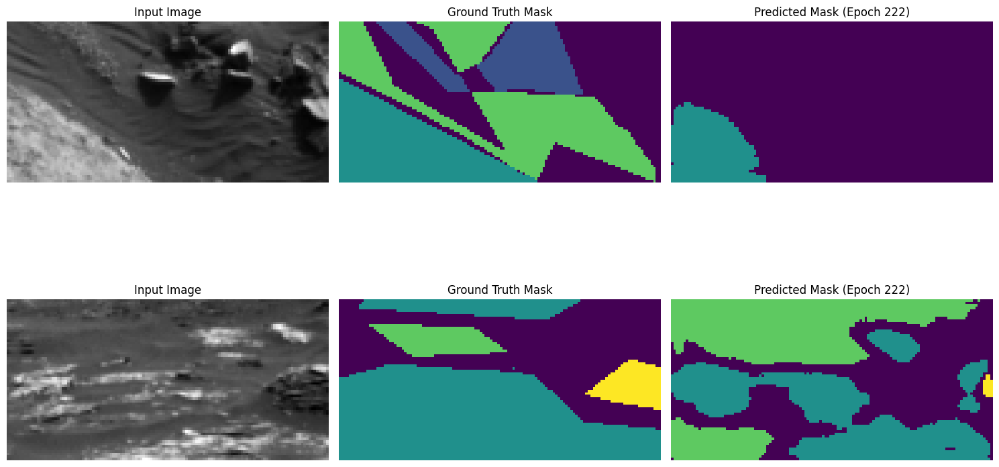

Epoch 223/250, Train Loss: 0.2564, Val Loss: 0.0804, Mean IoU: 0.4543
Class 0 IoU: 0.6271
Class 1 IoU: 0.4905
Class 2 IoU: 0.6010
Class 3 IoU: 0.0986


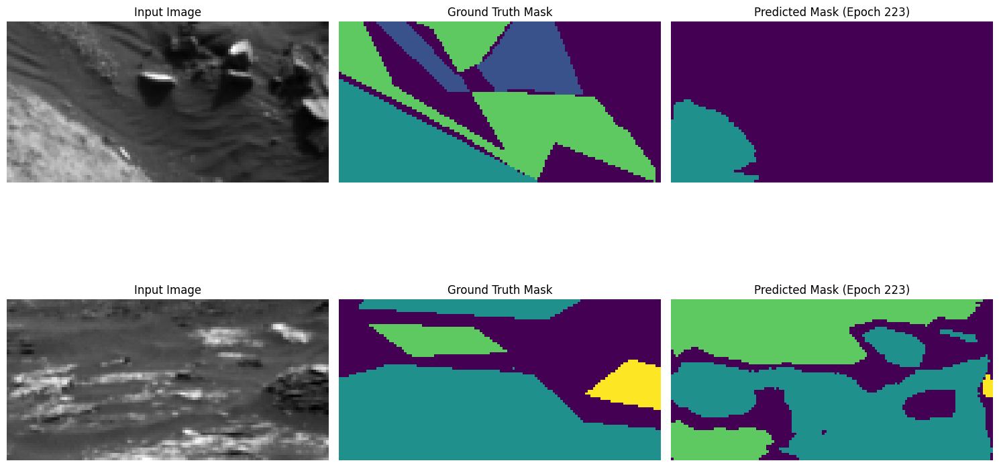

Epoch 224/250, Train Loss: 0.2581, Val Loss: 0.0795, Mean IoU: 0.4577
Class 0 IoU: 0.6351
Class 1 IoU: 0.4850
Class 2 IoU: 0.6068
Class 3 IoU: 0.1038


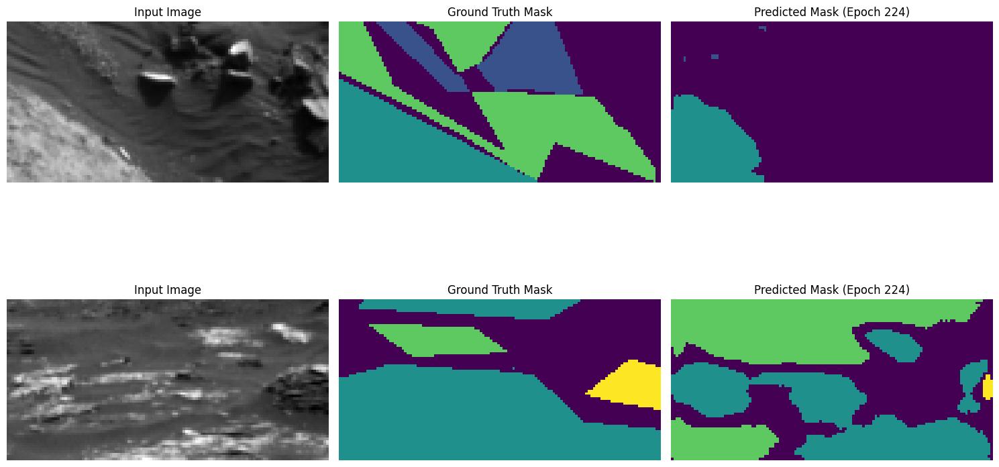

Epoch 225/250, Train Loss: 0.2532, Val Loss: 0.0819, Mean IoU: 0.4580
Class 0 IoU: 0.6352
Class 1 IoU: 0.4969
Class 2 IoU: 0.6015
Class 3 IoU: 0.0984


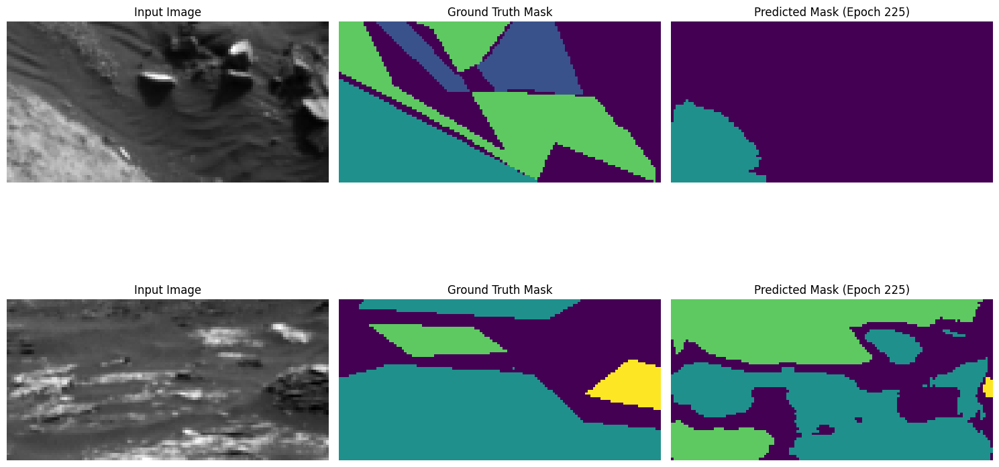

Epoch 226/250, Train Loss: 0.2573, Val Loss: 0.0793, Mean IoU: 0.4618
Class 0 IoU: 0.6420
Class 1 IoU: 0.4881
Class 2 IoU: 0.6117
Class 3 IoU: 0.1055


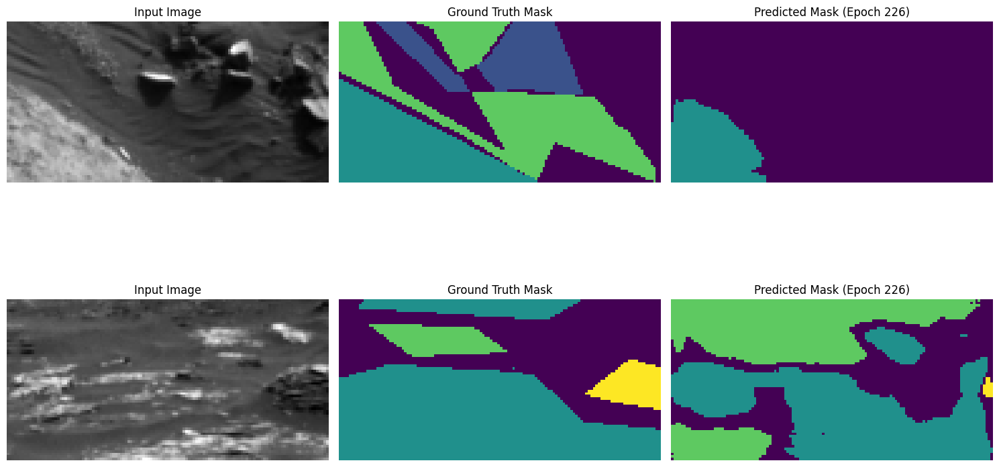

Epoch 227/250, Train Loss: 0.2584, Val Loss: 0.0827, Mean IoU: 0.4568
Class 0 IoU: 0.6378
Class 1 IoU: 0.4743
Class 2 IoU: 0.6110
Class 3 IoU: 0.1041


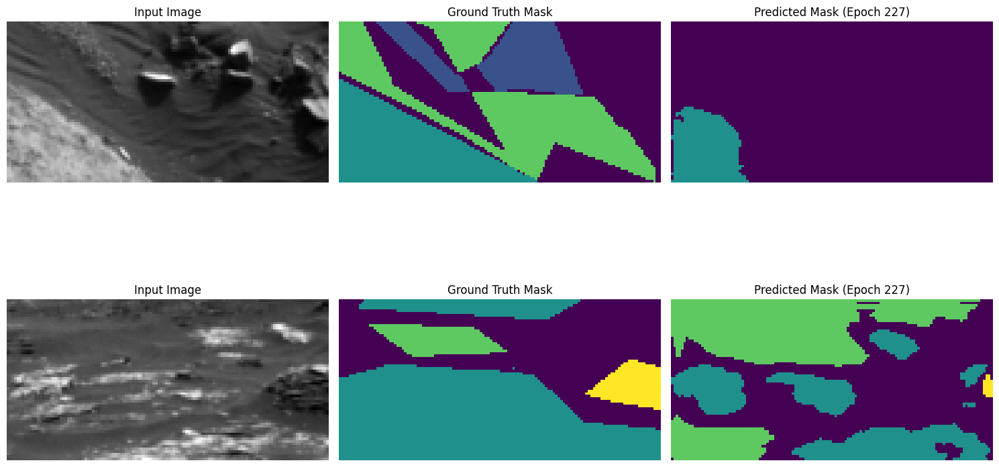

Epoch 228/250, Train Loss: 0.2636, Val Loss: 0.0784, Mean IoU: 0.4588
Class 0 IoU: 0.6373
Class 1 IoU: 0.4886
Class 2 IoU: 0.6049
Class 3 IoU: 0.1045


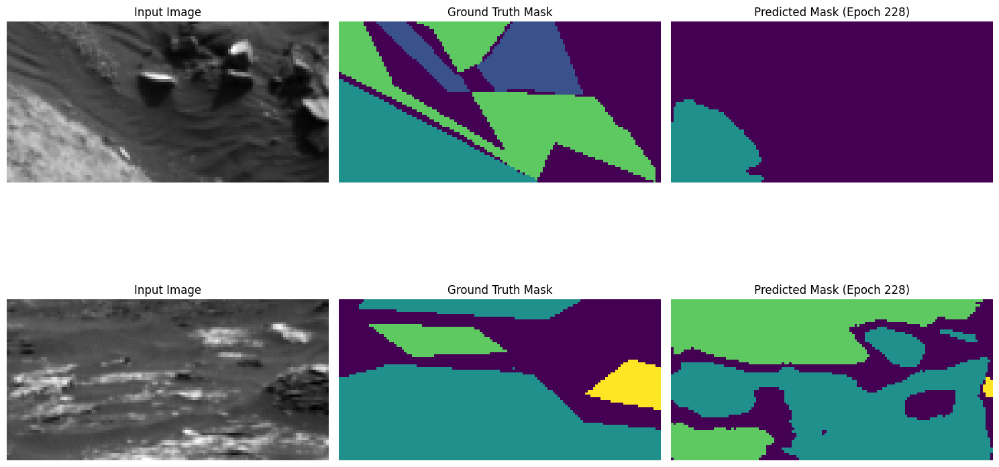

Epoch 229/250, Train Loss: 0.2610, Val Loss: 0.0840, Mean IoU: 0.4548
Class 0 IoU: 0.6238
Class 1 IoU: 0.4899
Class 2 IoU: 0.6002
Class 3 IoU: 0.1053


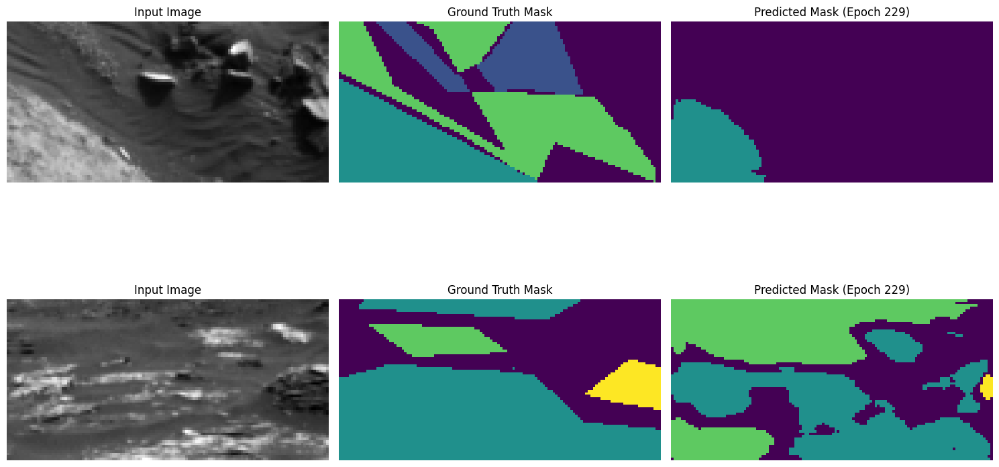

Epoch 230/250, Train Loss: 0.2565, Val Loss: 0.0827, Mean IoU: 0.4549
Class 0 IoU: 0.6284
Class 1 IoU: 0.4847
Class 2 IoU: 0.6030
Class 3 IoU: 0.1037


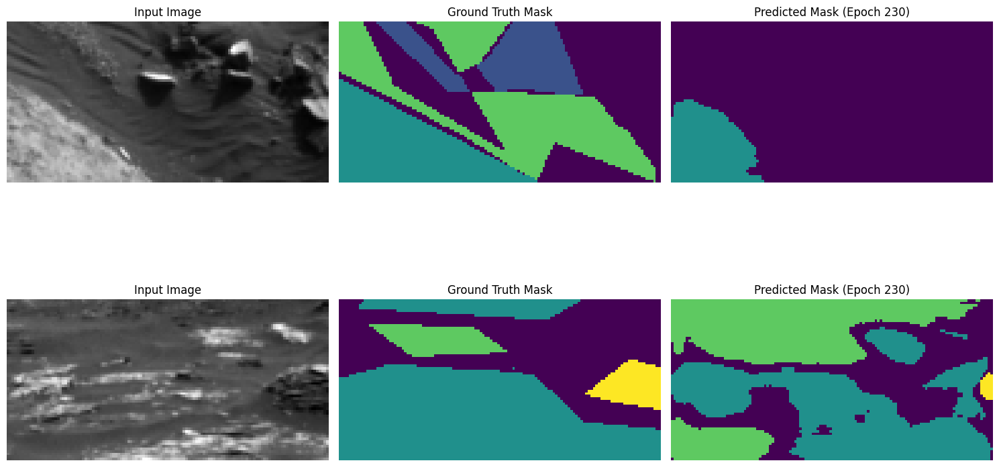

Epoch 231/250, Train Loss: 0.2555, Val Loss: 0.0795, Mean IoU: 0.4582
Class 0 IoU: 0.6371
Class 1 IoU: 0.4860
Class 2 IoU: 0.6087
Class 3 IoU: 0.1012


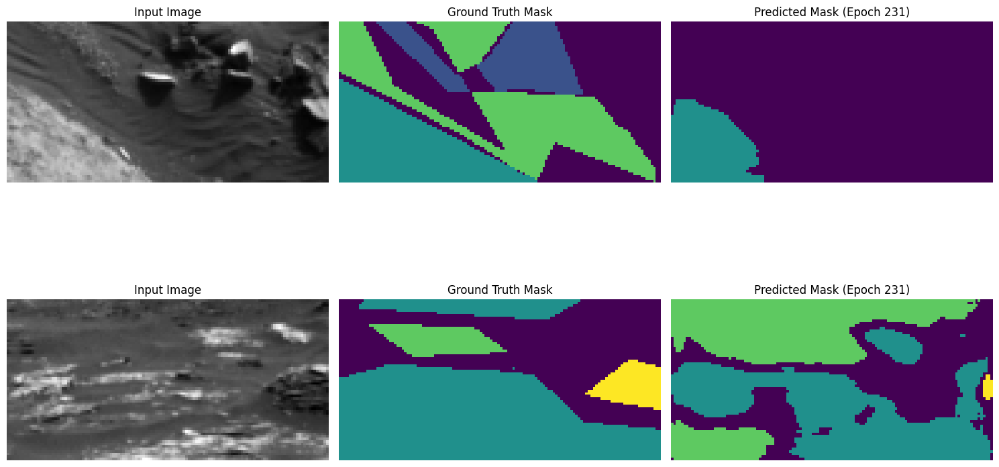

Epoch 232/250, Train Loss: 0.2578, Val Loss: 0.0801, Mean IoU: 0.4567
Class 0 IoU: 0.6330
Class 1 IoU: 0.4818
Class 2 IoU: 0.6052
Class 3 IoU: 0.1068


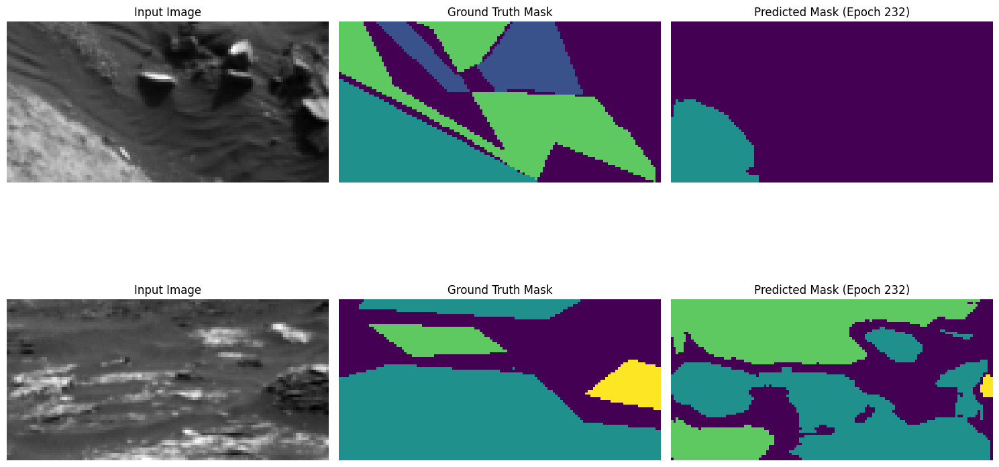

Epoch 233/250, Train Loss: 0.2595, Val Loss: 0.0799, Mean IoU: 0.4564
Class 0 IoU: 0.6306
Class 1 IoU: 0.4848
Class 2 IoU: 0.6055
Class 3 IoU: 0.1048


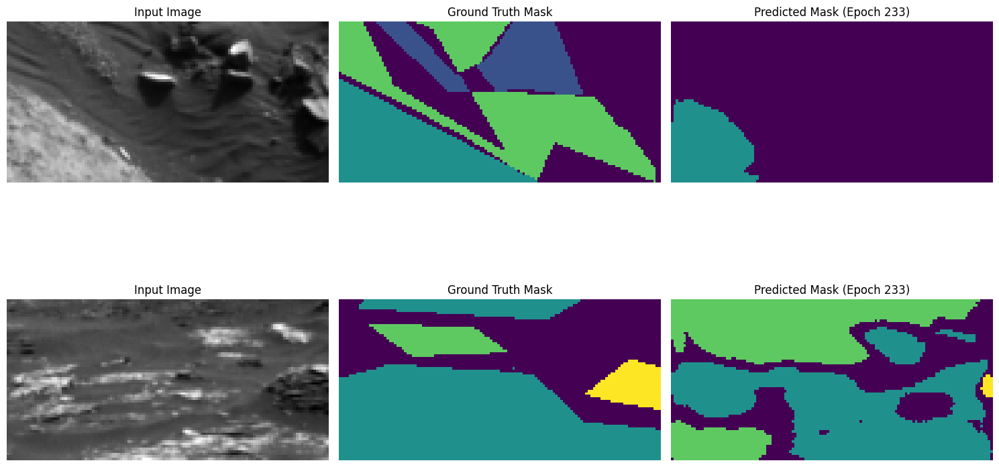

Epoch 234/250, Train Loss: 0.2548, Val Loss: 0.0824, Mean IoU: 0.4617
Class 0 IoU: 0.6306
Class 1 IoU: 0.4965
Class 2 IoU: 0.6060
Class 3 IoU: 0.1138


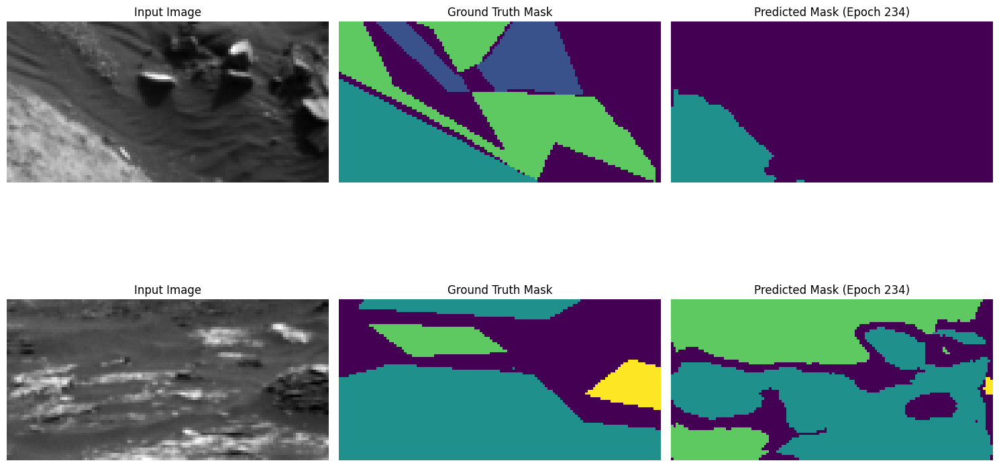

Epoch 235/250, Train Loss: 0.2542, Val Loss: 0.0813, Mean IoU: 0.4609
Class 0 IoU: 0.6342
Class 1 IoU: 0.4884
Class 2 IoU: 0.6152
Class 3 IoU: 0.1057


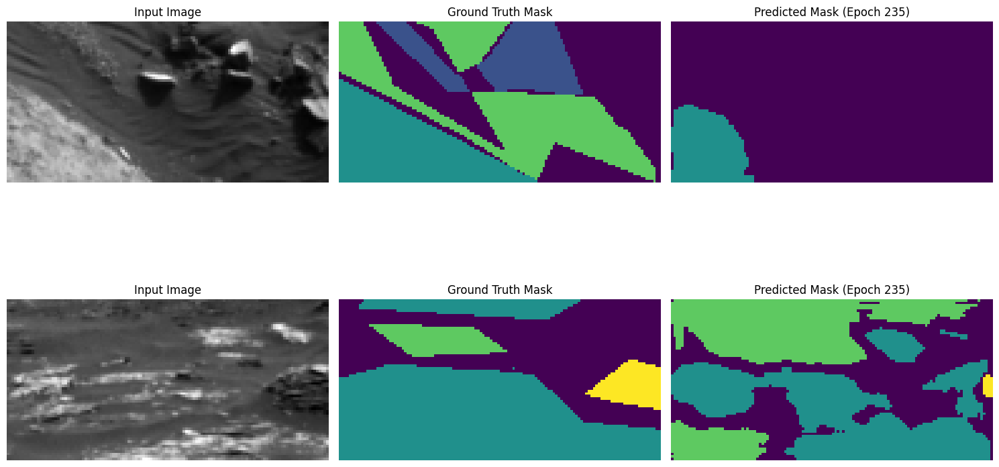

Epoch 236/250, Train Loss: 0.2543, Val Loss: 0.0824, Mean IoU: 0.4580
Class 0 IoU: 0.6419
Class 1 IoU: 0.4895
Class 2 IoU: 0.6068
Class 3 IoU: 0.0938


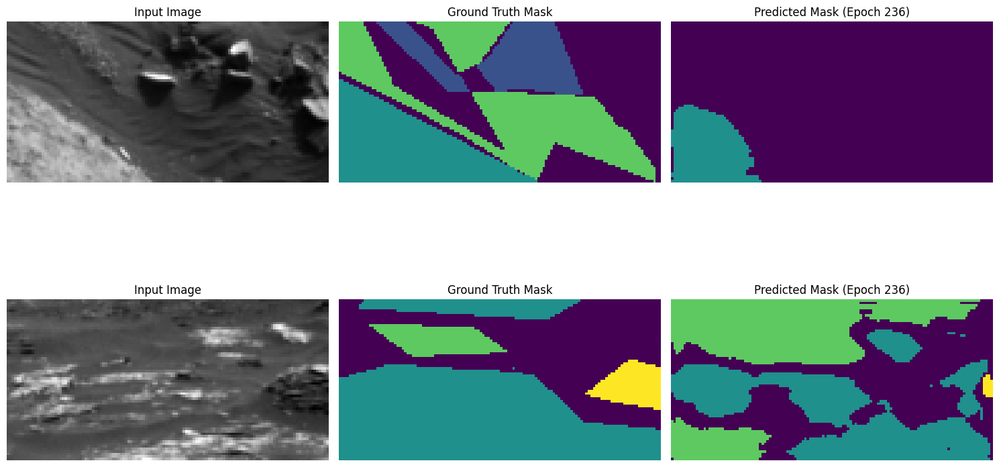

Epoch 237/250, Train Loss: 0.2549, Val Loss: 0.0826, Mean IoU: 0.4641
Class 0 IoU: 0.6393
Class 1 IoU: 0.4948
Class 2 IoU: 0.6056
Class 3 IoU: 0.1166


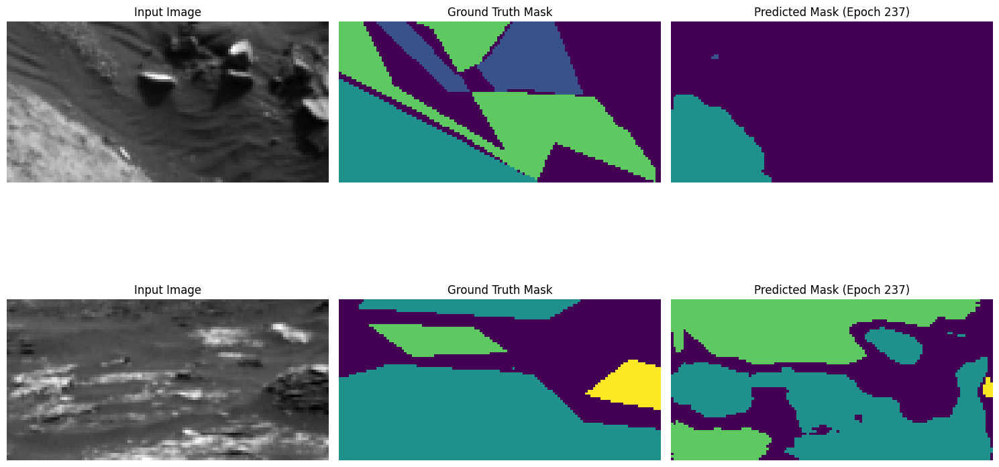

Epoch 238/250, Train Loss: 0.2568, Val Loss: 0.0820, Mean IoU: 0.4573
Class 0 IoU: 0.6268
Class 1 IoU: 0.4844
Class 2 IoU: 0.6000
Class 3 IoU: 0.1181


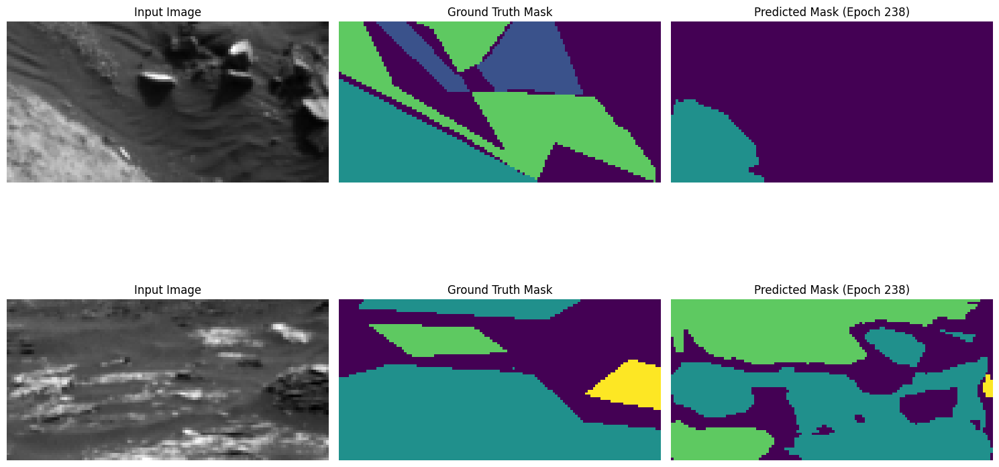

Epoch 239/250, Train Loss: 0.2536, Val Loss: 0.0833, Mean IoU: 0.4569
Class 0 IoU: 0.6310
Class 1 IoU: 0.4822
Class 2 IoU: 0.6063
Class 3 IoU: 0.1079


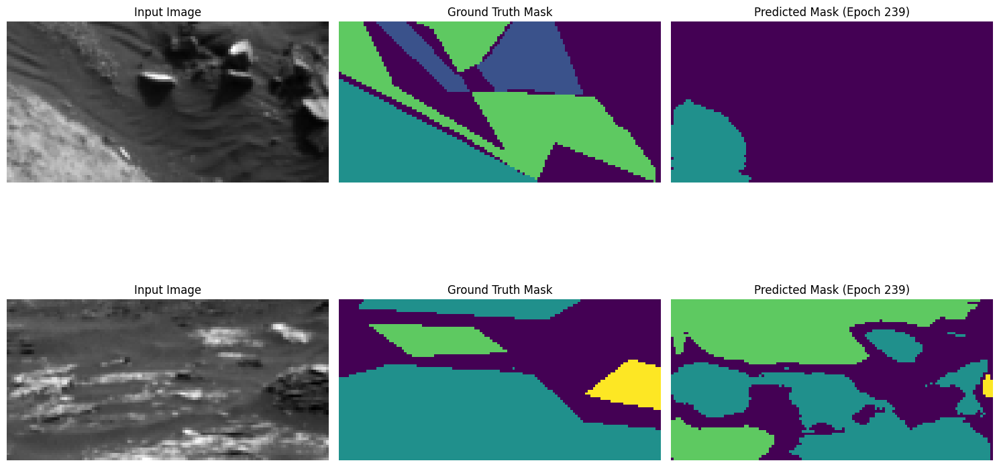

Epoch 240/250, Train Loss: 0.2555, Val Loss: 0.0819, Mean IoU: 0.4588
Class 0 IoU: 0.6338
Class 1 IoU: 0.4900
Class 2 IoU: 0.5964
Class 3 IoU: 0.1150


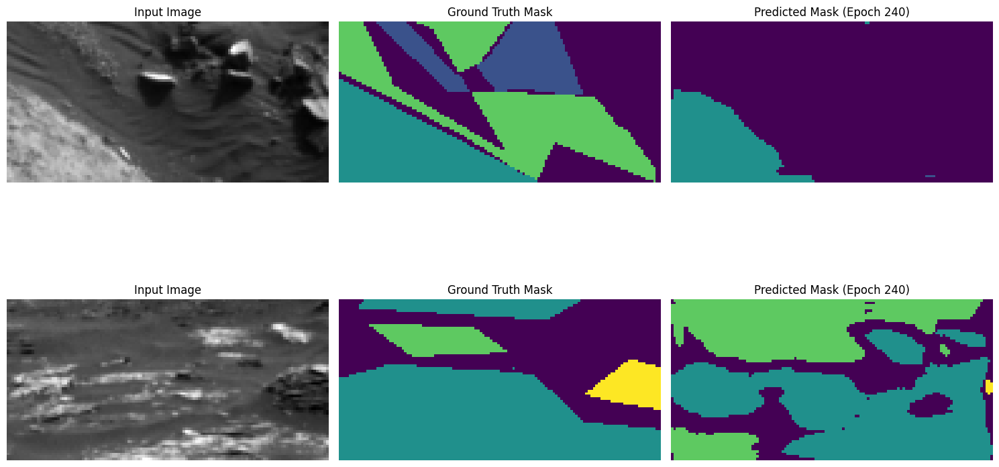

Epoch 241/250, Train Loss: 0.2538, Val Loss: 0.0794, Mean IoU: 0.4588
Class 0 IoU: 0.6301
Class 1 IoU: 0.4793
Class 2 IoU: 0.6165
Class 3 IoU: 0.1094


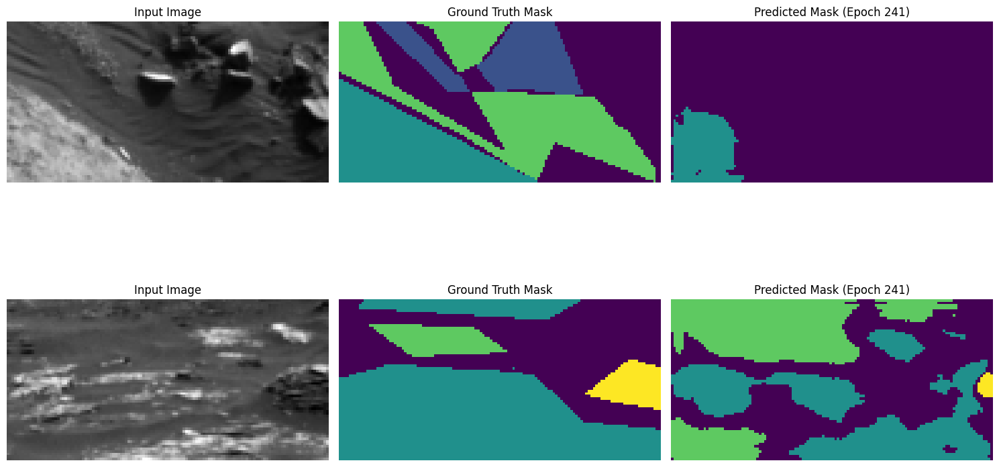

Epoch 242/250, Train Loss: 0.2553, Val Loss: 0.0803, Mean IoU: 0.4598
Class 0 IoU: 0.6420
Class 1 IoU: 0.4914
Class 2 IoU: 0.6074
Class 3 IoU: 0.0986


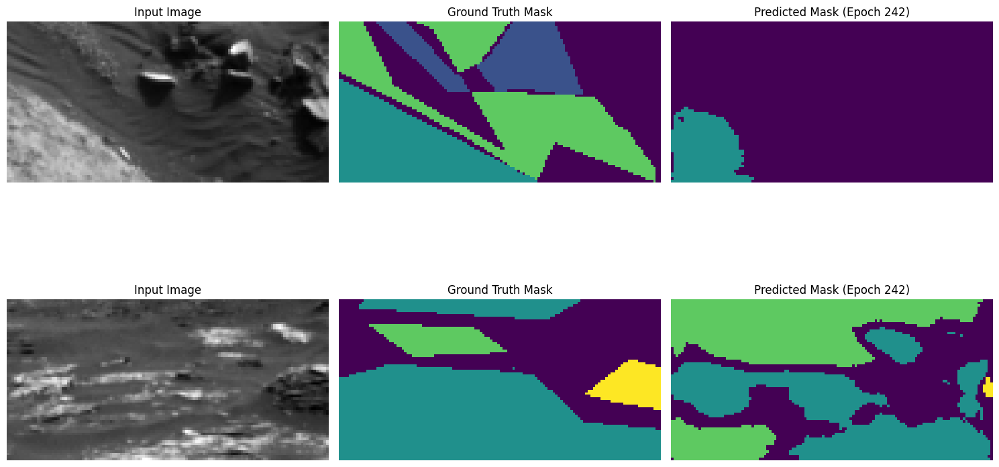

Epoch 243/250, Train Loss: 0.2531, Val Loss: 0.0805, Mean IoU: 0.4587
Class 0 IoU: 0.6306
Class 1 IoU: 0.4916
Class 2 IoU: 0.6019
Class 3 IoU: 0.1107


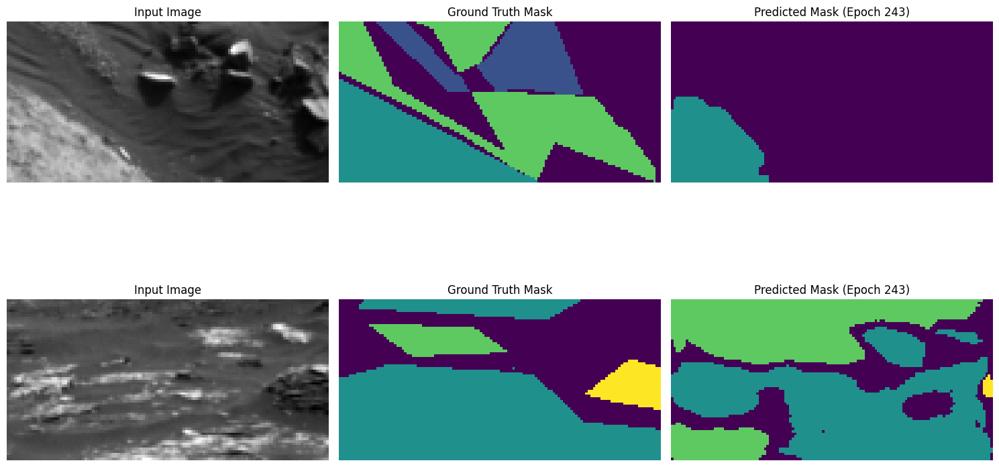

Epoch 244/250, Train Loss: 0.2567, Val Loss: 0.0798, Mean IoU: 0.4642
Class 0 IoU: 0.6407
Class 1 IoU: 0.4913
Class 2 IoU: 0.6124
Class 3 IoU: 0.1122


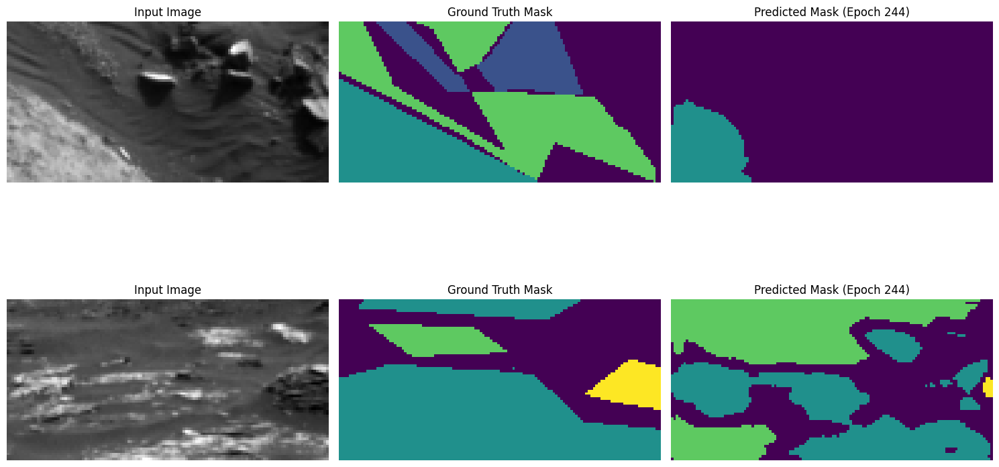

Epoch 245/250, Train Loss: 0.2548, Val Loss: 0.0797, Mean IoU: 0.4641
Class 0 IoU: 0.6297
Class 1 IoU: 0.4999
Class 2 IoU: 0.6044
Class 3 IoU: 0.1225


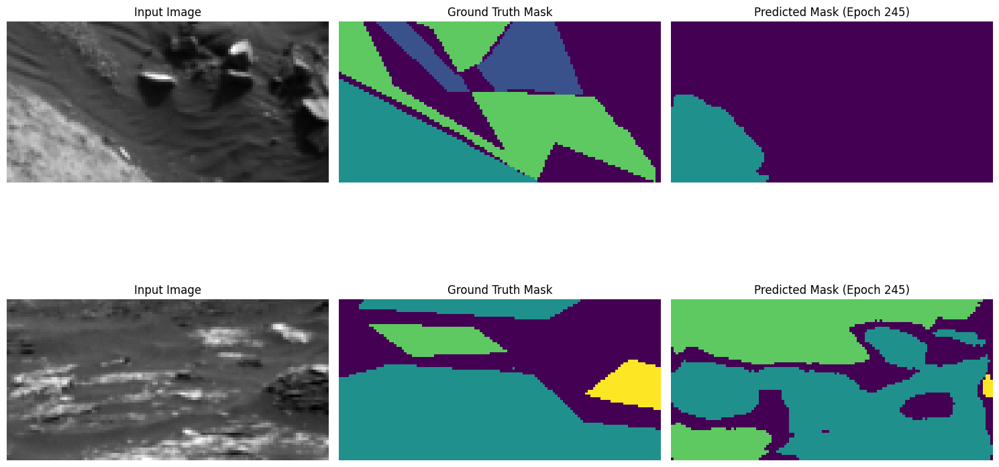

Epoch 246/250, Train Loss: 0.2511, Val Loss: 0.0801, Mean IoU: 0.4602
Class 0 IoU: 0.6340
Class 1 IoU: 0.4846
Class 2 IoU: 0.6066
Class 3 IoU: 0.1155


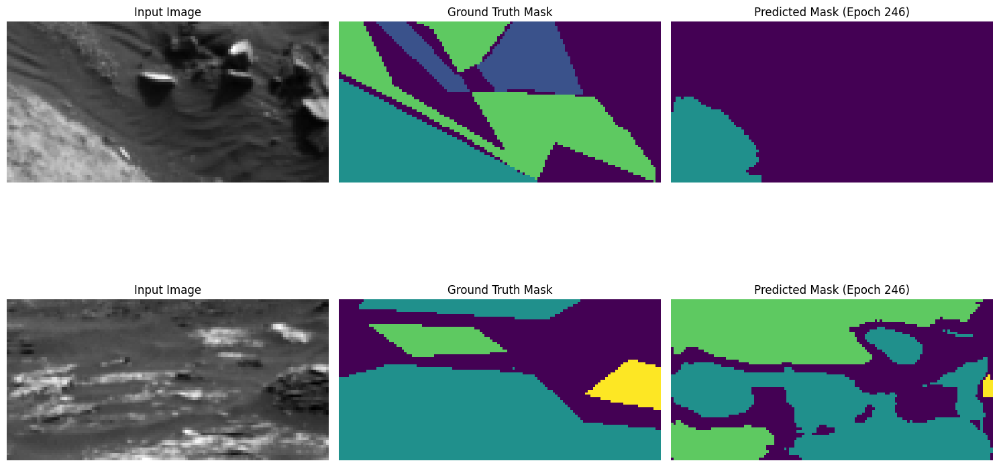

Epoch 247/250, Train Loss: 0.2590, Val Loss: 0.0822, Mean IoU: 0.4536
Class 0 IoU: 0.6273
Class 1 IoU: 0.4825
Class 2 IoU: 0.5903
Class 3 IoU: 0.1143


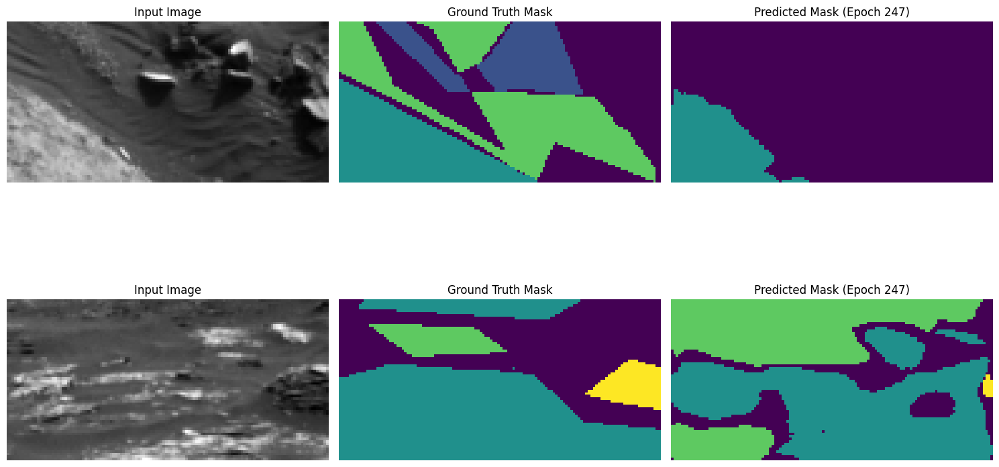

Epoch 248/250, Train Loss: 0.2528, Val Loss: 0.0837, Mean IoU: 0.4581
Class 0 IoU: 0.6263
Class 1 IoU: 0.4844
Class 2 IoU: 0.6111
Class 3 IoU: 0.1107


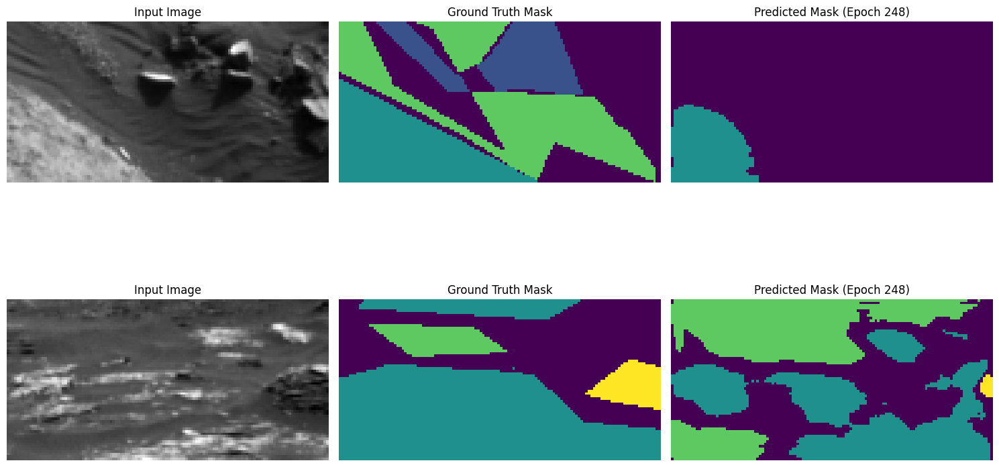

Epoch 249/250, Train Loss: 0.2553, Val Loss: 0.0817, Mean IoU: 0.4577
Class 0 IoU: 0.6313
Class 1 IoU: 0.4855
Class 2 IoU: 0.6075
Class 3 IoU: 0.1066


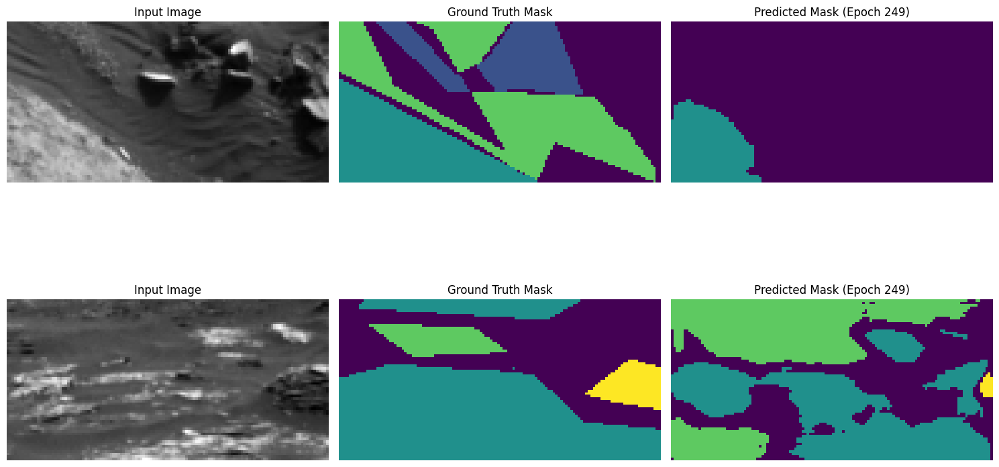

Epoch 250/250, Train Loss: 0.2527, Val Loss: 0.0810, Mean IoU: 0.4597
Class 0 IoU: 0.6324
Class 1 IoU: 0.4935
Class 2 IoU: 0.5987
Class 3 IoU: 0.1141


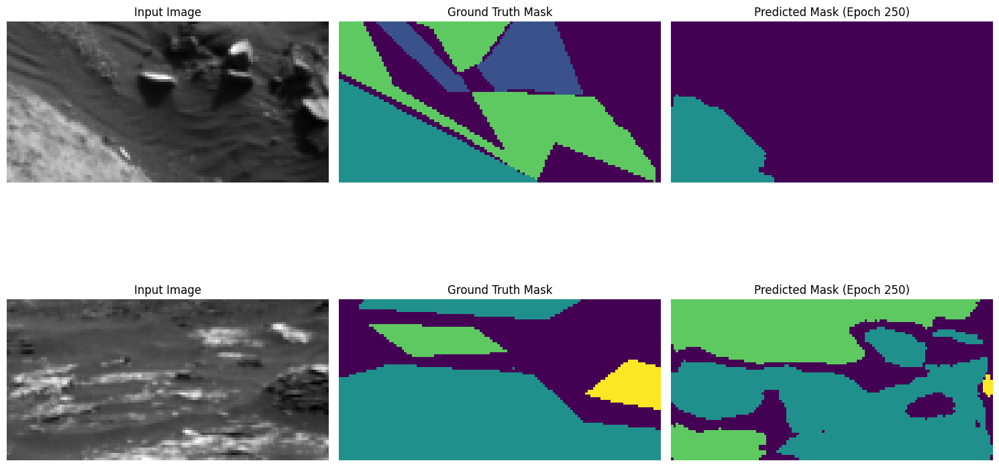

In [38]:
# Weighted Cross-Entropy Loss
class WeightedCrossEntropyLoss(nn.Module):
    def __init__(self, class_weights):
        super(WeightedCrossEntropyLoss, self).__init__()
        self.class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

    def forward(self, logits, targets):
        loss = F.cross_entropy(logits, targets, weight=self.class_weights)
        return loss

criterion = focal_loss

# Model initialization
def get_model():
    return smp.Unet(
        encoder_name=hyperparams["model"]["encoder_name"],
        encoder_weights=hyperparams["model"]["encoder_weights"],
        in_channels=hyperparams["model"]["input_channels"],
        classes=hyperparams["model"]["num_classes"],
    ).to(device)

model = get_model()
optimizer = torch.optim.Adam(model.parameters(), lr=hyperparams["training"]["learning_rate"])

# Add ReduceLROnPlateau scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.1, patience=50, min_lr=1e-6, verbose=True
)

# Function to calculate mean IoU
def calculate_mean_iou(y_true, y_pred, num_classes, ignore_class=0):
    ious = []
    for c in range(num_classes):
        if c == ignore_class:
            continue
        y_true_c = (y_true == c).astype(int)
        y_pred_c = (y_pred == c).astype(int)
        intersection = (y_true_c & y_pred_c).sum()
        union = (y_true_c | y_pred_c).sum()
        iou = intersection / union if union > 0 else 0.0
        ious.append(iou)
    return np.mean(ious), ious

# Visualize predictions with at least 4 unique classes
def visualize_predictions(images, masks, predictions, epoch):
    # Filter images with at least 4 unique classes in the ground truth masks
    selected_indices = [i for i in range(len(masks)) if len(np.unique(masks[i])) >= 4]

    # Check if at least 2 such images exist
    if len(selected_indices) < 2:
        print("Not enough images with at least 4 unique classes for visualization.")
        return

    # Select the first 2 indices that satisfy the condition
    selected_indices = selected_indices[:2]

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    for idx, i in enumerate(selected_indices):  # Visualize 2 images
        axes[idx, 0].imshow(images[i].squeeze(), cmap="gray")
        axes[idx, 0].set_title("Input Image")
        axes[idx, 1].imshow(masks[i], cmap="viridis", vmin=0, vmax=4)
        axes[idx, 1].set_title("Ground Truth Mask")
        axes[idx, 2].imshow(predictions[i], cmap="viridis", vmin=0, vmax=4)
        axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
        axes[idx, 0].axis("off")
        axes[idx, 1].axis("off")
        axes[idx, 2].axis("off")
    plt.tight_layout()
    plt.show()
# Initialize DataLoaders
train_dataset = SegmentationDataset(X_train, y_train)
val_dataset = SegmentationDataset(X_val, y_val)
train_loader = DataLoader(train_dataset, batch_size=hyperparams["training"]["batch_size"], shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

# Training loop
def train_model(model, train_loader, val_loader, hyperparams):
    best_val_loss = float("inf")
    best_val_mean_iou=0.0
    for epoch in range(hyperparams["training"]["num_epochs"]):
        model.train()
        train_loss = 0.0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        # Validation step
        model.eval()
        val_loss = 0.0
        all_predictions = []
        all_masks = []
        all_images = []
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()

                preds = torch.argmax(outputs, dim=1).cpu().numpy()
                all_predictions.extend(preds)
                all_masks.extend(masks.cpu().numpy())
                all_images.extend(images.cpu().numpy())

        # Calculate mean IoU
        mean_iou, per_class_ious = calculate_mean_iou(
            np.array(all_masks).flatten(),
            np.array(all_predictions).flatten(),
            num_classes=hyperparams["model"]["num_classes"],
            ignore_class=0,
        )

        print(f"Epoch {epoch+1}/{hyperparams['training']['num_epochs']}, "
              f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
              f"Mean IoU: {mean_iou:.4f}")

        # Per-class IoU
        for c, iou in enumerate(per_class_ious):
            print(f"Class {c} IoU: {iou:.4f}")

        # Visualization
        visualize_predictions(
            np.array(all_images),  # First 2 validation images
            np.array(all_masks),
            np.array(all_predictions),
            epoch,
        )

        # Update learning rate based on validation loss
        scheduler.step(val_loss)

        # Save best model based on mean IoU
        if mean_iou > best_val_mean_iou:
            best_val_mean_iou = mean_iou
            torch.save(model.state_dict(), "best_model.pth")
            print(f"Model saved with new best Mean IoU: {best_val_mean_iou:.4f}")

# Train the model
train_model(model, train_loader, val_loader, hyperparams)


In [39]:
# Predict on test set
def predict(model, test_loader):
    model.eval()
    predictions = []
    with torch.no_grad():
        for images in test_loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            predictions.extend(preds)
    return np.array(predictions)

test_dataset = SegmentationDataset(X_test)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
predictions = predict(model, test_loader)

# Save predictions to CSV
def save_predictions_to_csv(predictions, filename="submission.csv"):
    n_samples = predictions.shape[0]
    preds_flat = predictions.reshape(n_samples, -1)
    submission = pd.DataFrame(preds_flat)
    submission["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in submission.columns if col != "id"]
    submission = submission[cols]
    submission.to_csv(filename, index=False)
    print(f"Predictions saved to {filename}")

save_predictions_to_csv(predictions)

Predictions saved to submission.csv
